In [1]:
#!/usr/bin/env python3.6
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import math
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [6]:
# Read data
#motion = np.genfromtxt('../dataset3/com_data/odom_full_continuous_2minutes.csv', delimiter=',', dtype=np.float64)
motion = np.genfromtxt('/home/itaouil/workspace/aliengo_ws/src/aliengo_navigation/data/dataset3/com_data/odom_full_continuous_2minutes.csv', delimiter=',', dtype=np.float64)
print("Motion data has a length of ", len(motion))

Motion data has a length of  190581


In [7]:
motion.shape

(190581, 32)

## Visualizations

In [8]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FL)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FL)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FR)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FR)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RL)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RL)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RR)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RR)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FL plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FL)', color='b')
    ax1.set_xlabel('Time')
         
    # FL plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FL)', color='g')
          
    # FR plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FR)', color='b')
    ax3.set_xlabel('Time')
         
    # FR plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FR)', color='g')      
          
    # RL plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RL)', color='b')
    ax5.set_xlabel('Time')
         
    # RL plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RL)', color='g')   
          
    # RR plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RR)', color='b')
    ax7.set_xlabel('Time')
         
    # RR plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RR)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    for ax in [ax1, ax3, ax5, ax7]:
        for tl in ax.get_yticklabels():
            tl.set_color('b')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    #ax.axvline(x=footstep_timestamp+0.15, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [9]:
def get_specific_cmd(dataset, fwd, side, rot):
    if abs(fwd): 
        return np.where(dataset[:, 1] > 0)[0] if fwd > 0 else np.where(dataset[:, 1] < 0)[0]
    if abs(side): 
        return np.where(dataset[:, 2] > 0)[0] if side > 0 else np.where(dataset[:, 2] < 0)[0]
    if abs(rot): 
        return np.where(dataset[:, 6] > 0)[0] if rot > 0 else np.where(dataset[:, 6] < 0)[0]

In [10]:
def get_swinging_motions(dataset, height=-0.1):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 9] < height)[0]
    fl_min_height = np.where(dataset[:, 12] < height)[0]
    rr_min_height = np.where(dataset[:, 15] < height)[0]
    rl_min_height = np.where(dataset[:, 18] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## motion

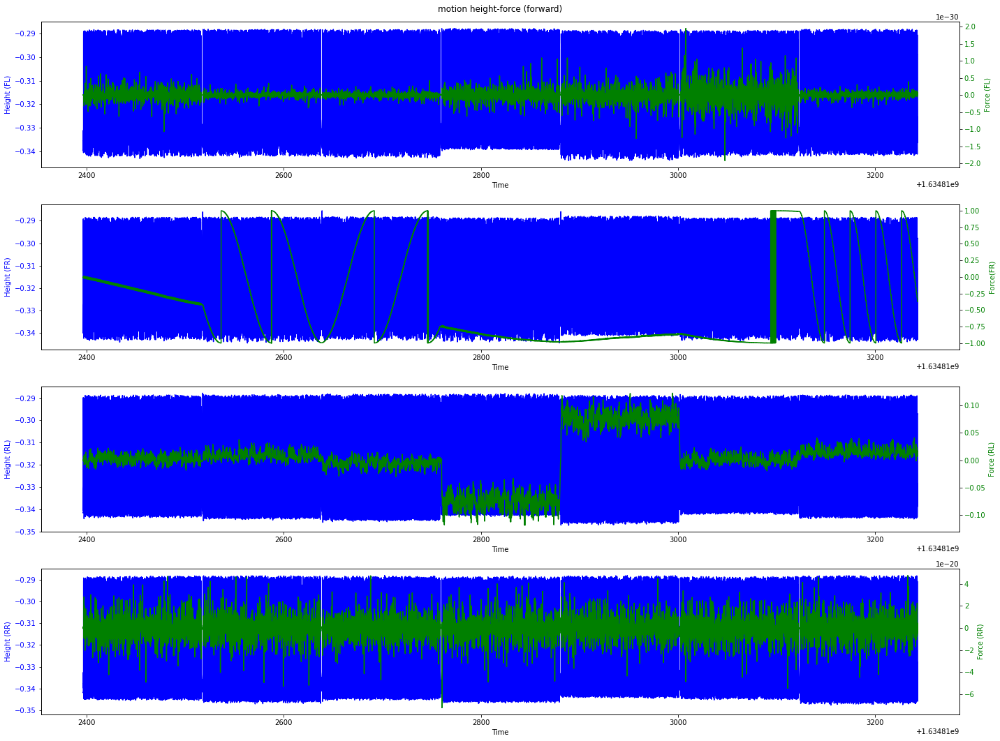

In [11]:
# Forward
fwd_cmds = get_specific_cmd(motion, 1, 0, 0)
motion_fwd = motion[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (forward)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

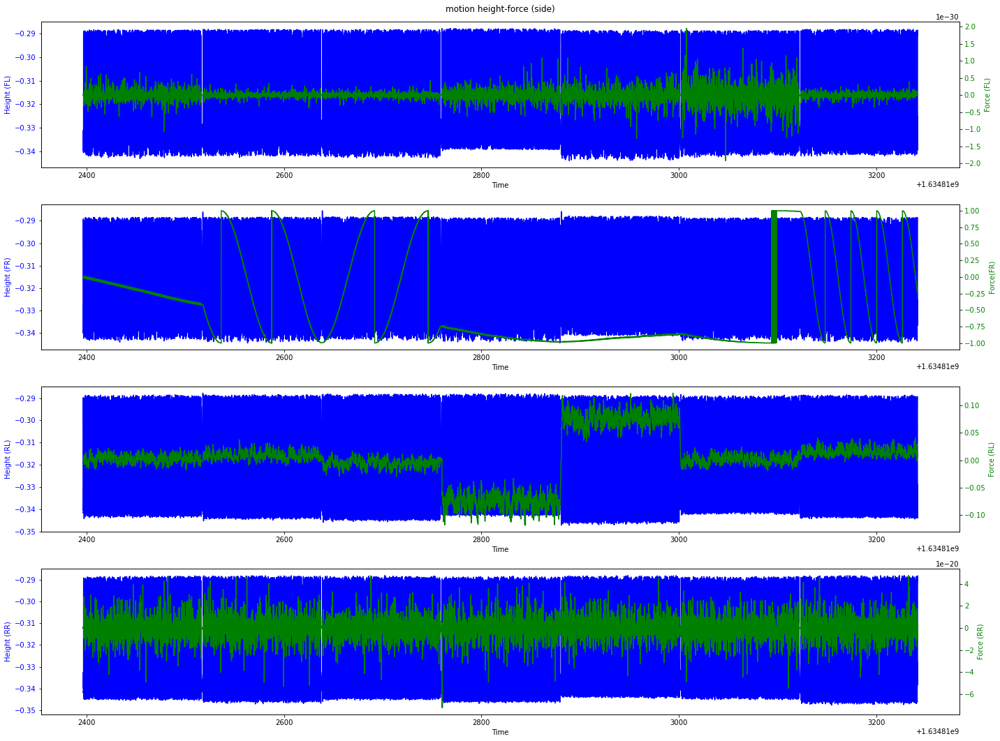

In [11]:
# Side (right)
side_cmds = get_specific_cmd(motion, 0, -1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

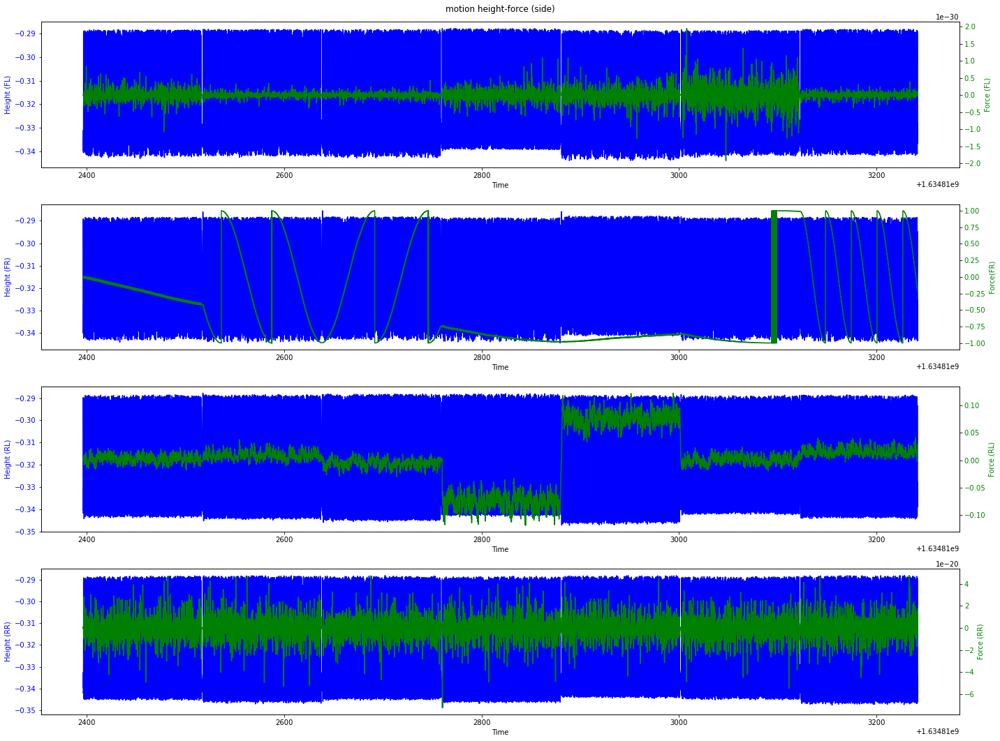

In [12]:
# Side (left)
side_cmds = get_specific_cmd(motion, 0, 1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

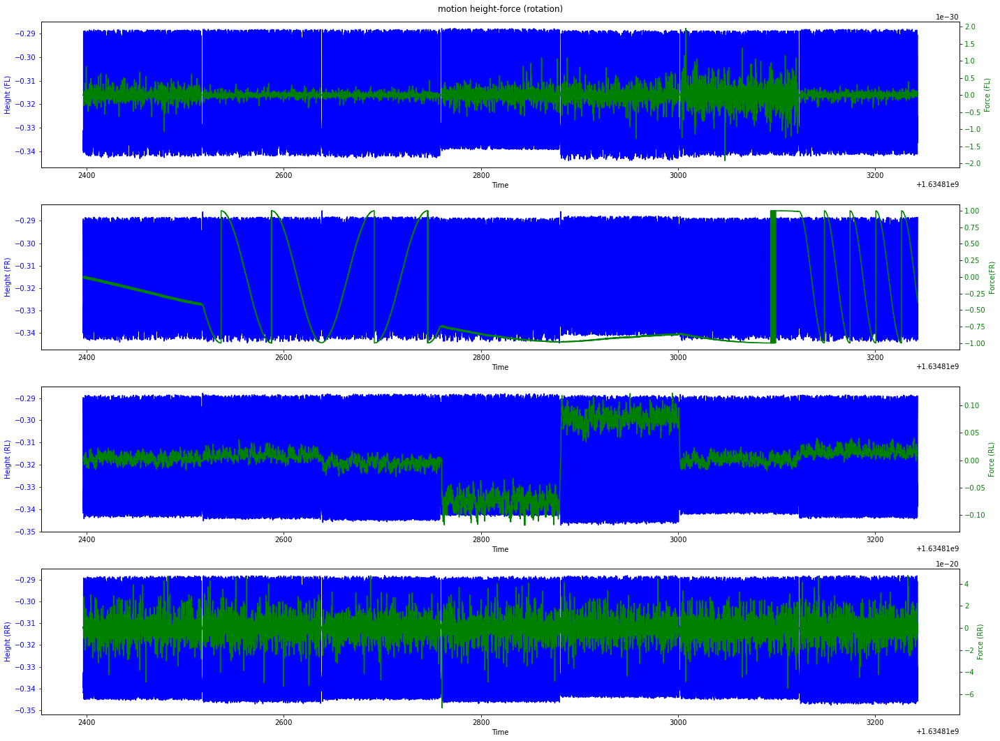

In [13]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, -1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

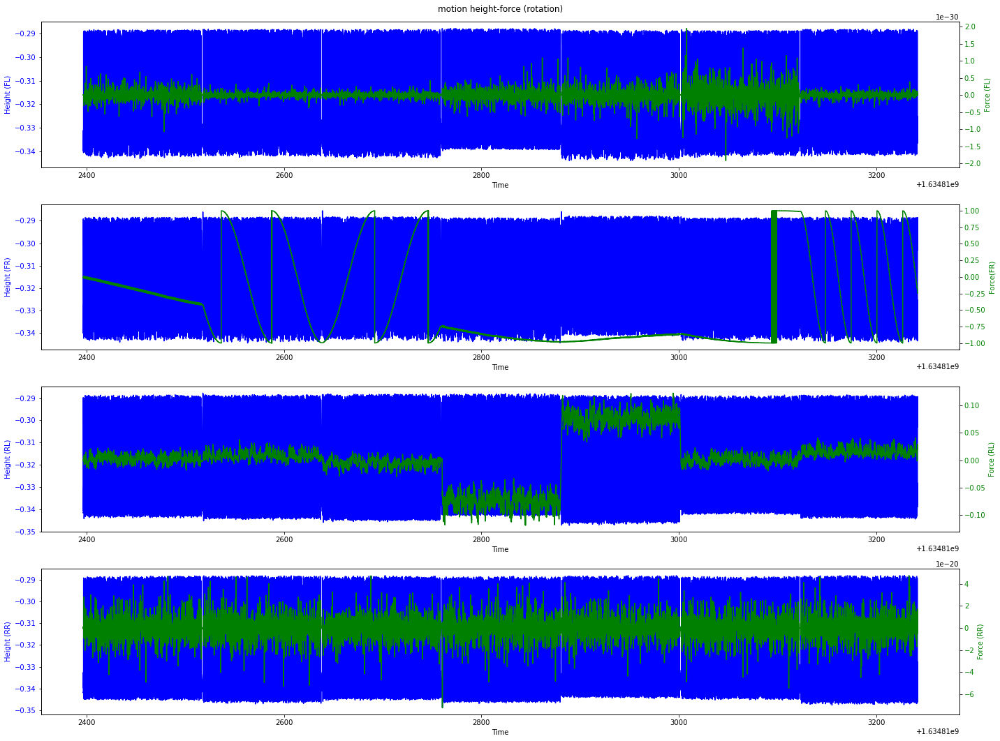

In [14]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, 1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

## Footsteps Extraction (Height + Force)

In [12]:
"""
    Extract footsteps from raw data using
    force and height measurements together.
"""
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 9] - dataset[:, 12]), 9)
    print("Max diff between fr and fl: ", max(fr_fl_diff))

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 15] - dataset[:, 18]), 9)
    print("Max diff between rr and rl: ", max(rr_rl_diff))

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Find footsteps based on force perceived
    rear_force_footsteps = np.where(np.logical_or(dataset[:, 21] <= force_thresholds[0], dataset[:, 24] <= force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_or(dataset[:, 27] <= force_thresholds[2], dataset[:, 30] <= force_thresholds[3]))[0]
    
    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    return force_height_footsteps


"""
    Perform non-maximum-suppresion on the 
    footsteps found as multiple instances
    are found within a small time window.
"""
def footsteps_nms(dataset, footsteps):
    idx = 0
    footsteps_nms = []
    footstep_to_add = footsteps[0]
    
    while idx < (len(footsteps) - 1):
        # Compute time difference between current and next footsteps
        time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
        # Find corresponding index in between
        # the current and next footsteps
        time_differences = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference/2))
        matching_index = time_differences.argmin()
        
        # Retrieve maximum height between foosteps
        height_peek_in_between = max([dataset[matching_index, x] for x in [9, 12, 15, 18]])
        
        # Within same time window but not consecute footsteps
        if time_difference < 0.1 and not height_peek_in_between > -0.31:
            # Compute height difference between feet
            #height_diff_idx = abs(dataset[footsteps[idx], 9] - dataset[footsteps[idx], 12]) + abs(dataset[footsteps[idx], 15] - dataset[footsteps[idx], 18])
            #height_diff_idx_next = abs(dataset[footsteps[idx+1], 9] - dataset[footsteps[idx+1], 12]) + abs(dataset[footsteps[idx+1], 15] - dataset[footsteps[idx+1], 18])
                
            # Choose foot with lowest height difference
            #footstep_to_add = footsteps[idx] if height_diff_idx < height_diff_idx_next else footsteps[idx+1]
            #timestamp_of_footstep_to_add = dataset[footsteps[idx], 0] if height_diff_idx < height_diff_idx_next else dataset[footsteps[idx+1], 0] 
            
            footstep_to_add = footsteps[idx] if dataset[footsteps[idx], 0] < dataset[footsteps[idx+1], 0] else footsteps[idx+1]
        elif time_difference < 0.1 and height_peek_in_between > -0.31:
            footsteps_nms.append(footstep_to_add)
        elif time_difference > 0.1:
            footsteps_nms.append(footstep_to_add)
        
        idx += 1
    
    # Remove redundant detections
    idx = 0
    footstep_nms_final = []
    while idx < (len(footsteps_nms) - 1):
        if abs(dataset[footsteps_nms[idx], 0] - dataset[footsteps_nms[idx+1], 0]) > 0.1:
            footstep_nms_final.append(footsteps_nms[idx])
        
        idx += 1
        
    return np.asarray(footstep_nms_final)

## Footsteps

In [13]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_cmds = motion[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height,
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [9, 21, 12, 24, 15, 27, 18, 30],
                           True,
                           motion_cmds[footsteps_nms(motion_cmds, footsteps), 0])
                           #motion_cmds[footsteps, 0])
 
    return motion_cmds, footsteps_after_nms

### Forward motion

In [14]:
#np.diff(motion_fwd[footsteps_fwd, 0])

Foot swinging motions lenghts:  38146 38146 38146 38146
Max diff between fr and fl:  0.047646284
Max diff between rr and rl:  0.049890012
Min and max diff between front and rear feet 0.000106841 0.097209901 

Amount of footsteps found with height criteria:  23255 

Number of force footsteps:  38146 

Number of height-force footsteps:  23255 

Footsteps extracted:  23255
Footsteps after non-maximum-suppression:  2581


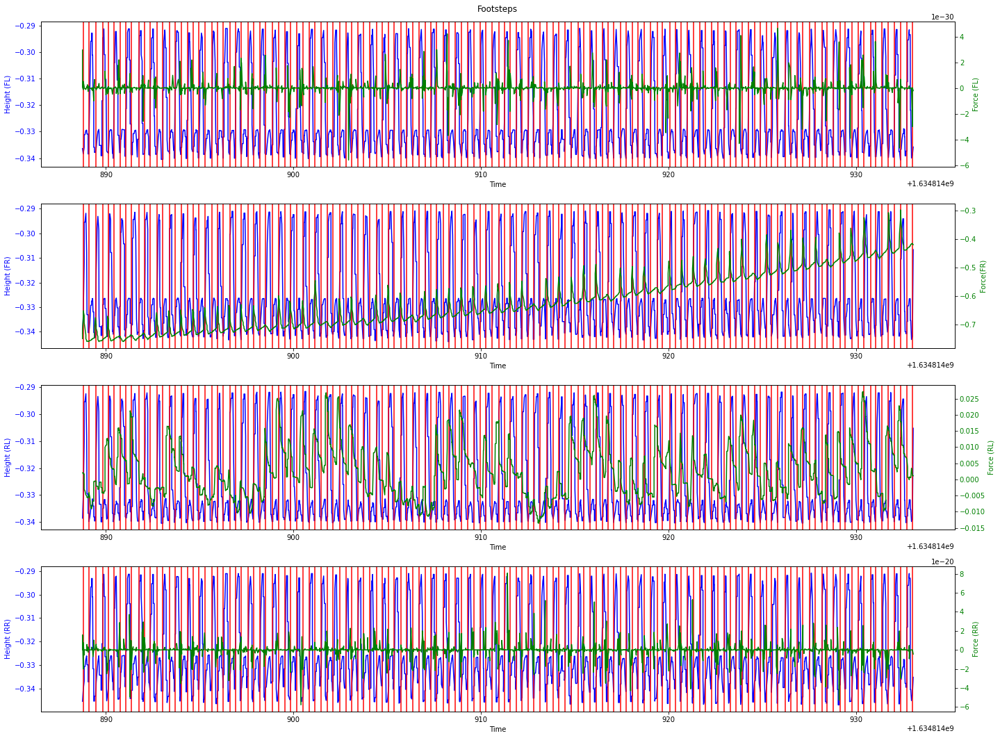

In [17]:
motion_fwd, footsteps_fwd = footstep_extraction_and_plotting(dataset=motion, velocities=[1, 0, 0], height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(25000, 27000))

### Side motion (right)

Foot swinging motions lenghts:  38107 38107 38107 38107
Max diff between fr and fl:  0.047130823
Max diff between rr and rl:  0.052620322
Min and max diff between front and rear feet 5.7608e-05 0.099645883 

Amount of footsteps found with height criteria:  22567 

Number of force footsteps:  38107 

Number of height-force footsteps:  22567 

Footsteps extracted:  22567
Footsteps after non-maximum-suppression:  2581


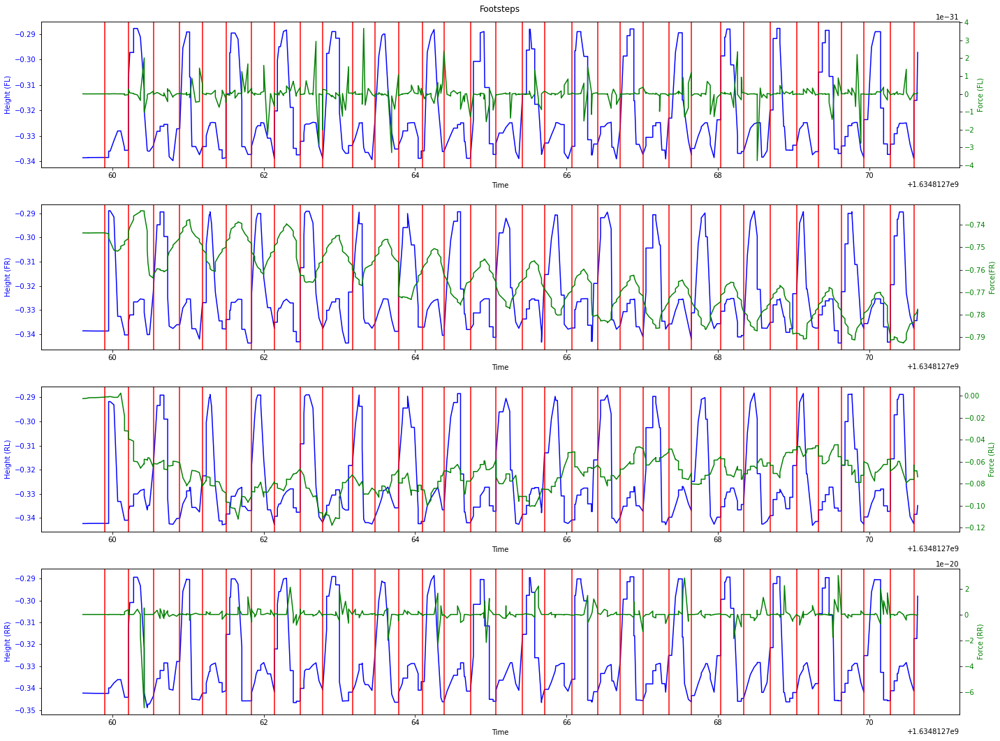

In [18]:
motion_side_right, footsteps_side_right = footstep_extraction_and_plotting(dataset=motion, velocities=[0, -1, 0],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(0, 500))

### Side (left)

Foot swinging motions lenghts:  38088 38088 38088 38088
Max diff between fr and fl:  0.049065411
Max diff between rr and rl:  0.04943344
Min and max diff between front and rear feet 3.5763e-05 0.097175121 

Amount of footsteps found with height criteria:  22576 

Number of force footsteps:  38088 

Number of height-force footsteps:  22576 

Footsteps extracted:  22576
Footsteps after non-maximum-suppression:  2581


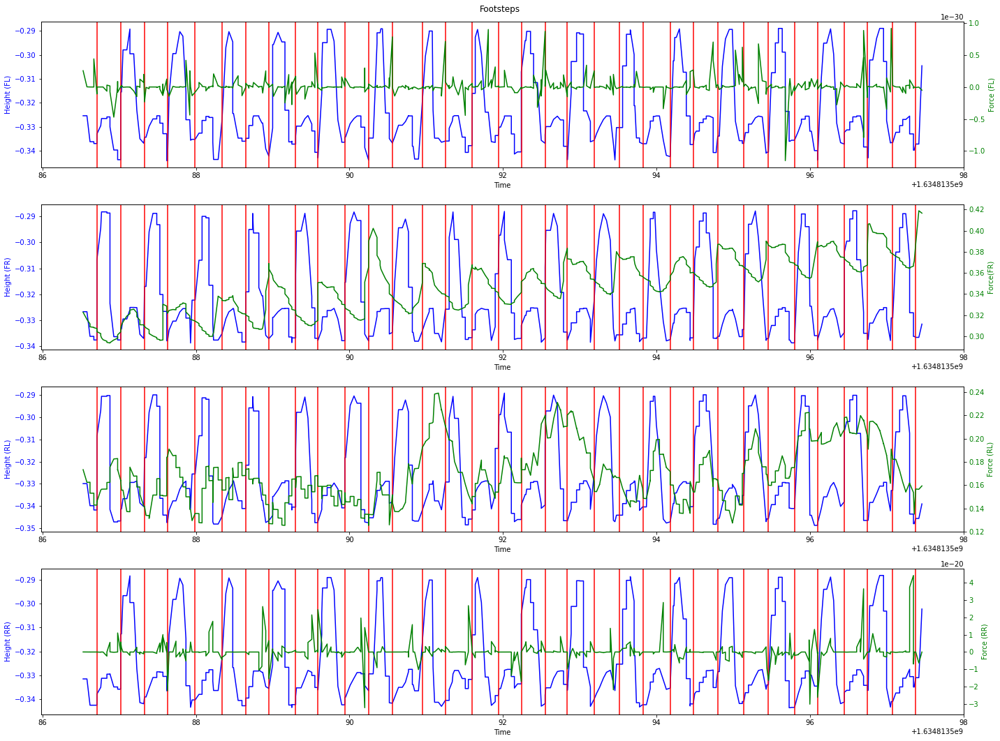

In [19]:
motion_side_left, footsteps_side_left = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 1, 0],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(10000, 10500))

### Rotation (clockwise)

Foot swinging motions lenghts:  38148 38148 38148 38148
Max diff between fr and fl:  0.048621356
Max diff between rr and rl:  0.051244587
Min and max diff between front and rear feet 7.9692e-05 0.098970681 

Amount of footsteps found with height criteria:  23027 

Number of force footsteps:  38148 

Number of height-force footsteps:  23027 

Footsteps extracted:  23027
Footsteps after non-maximum-suppression:  2581


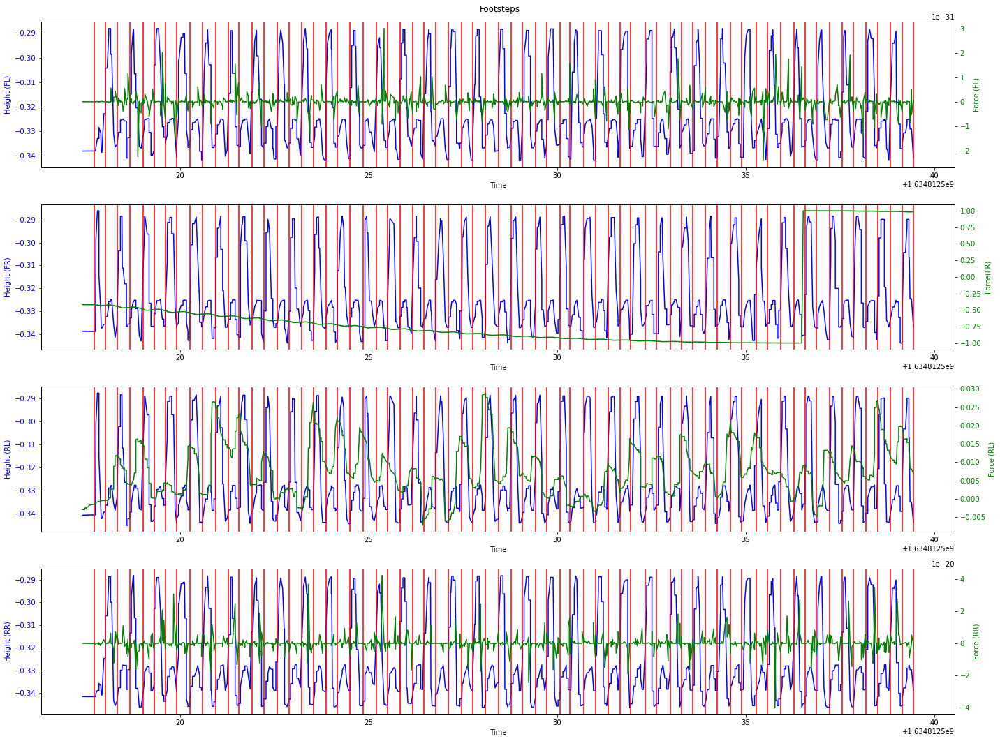

In [20]:
motion_clock, footsteps_clock = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, -1],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(0, 1000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  38092 38092 38092 38092
Max diff between fr and fl:  0.049123019
Max diff between rr and rl:  0.04964301
Min and max diff between front and rear feet 0.000204354 0.098697454 

Amount of footsteps found with height criteria:  23101 

Number of force footsteps:  38092 

Number of height-force footsteps:  23101 

Footsteps extracted:  23101
Footsteps after non-maximum-suppression:  2581


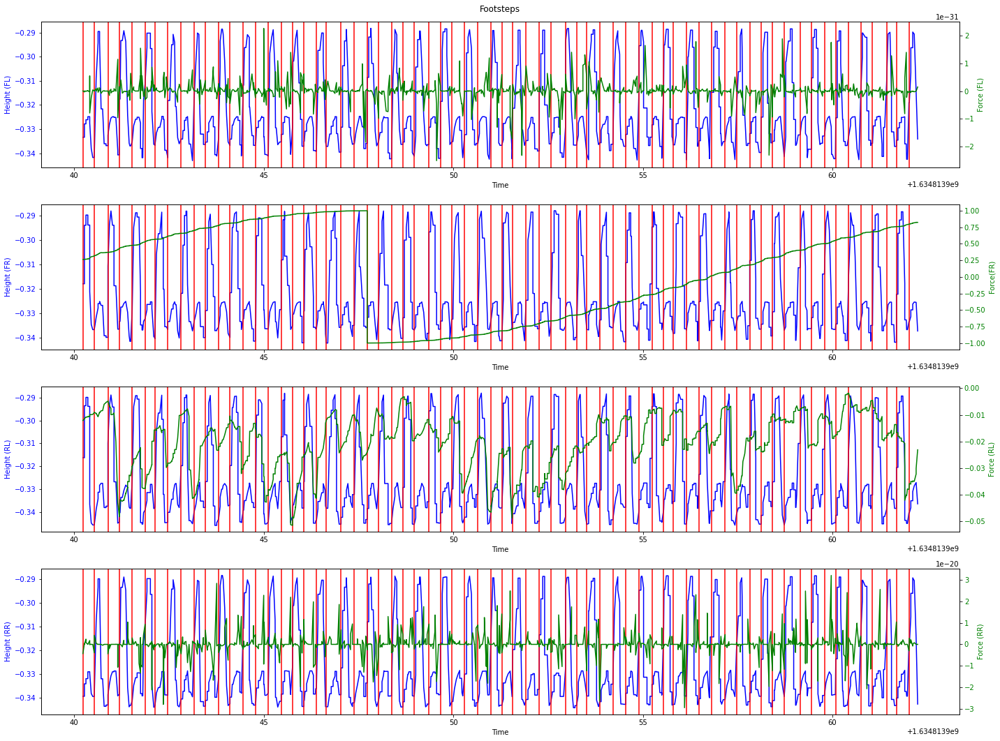

In [21]:
motion_count, footsteps_count = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, 1],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(15000, 16000))

### CoM displacement

In [22]:
def euler_from_quaternion(x, y, z, w):
    """
    Convert a quaternion into euler angles (roll, pitch, yaw)
    roll is rotation around x in radians (counterclockwise)
    pitch is rotation around y in radians (counterclockwise)
    yaw is rotation around z in radians (counterclockwise)
    """
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    roll_x = math.atan2(t0, t1)
     
    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    pitch_y = math.asin(t2)
     
    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    yaw_z = math.atan2(t3, t4)
     
    return roll_x, pitch_y, yaw_z # in radians

In [23]:
def getCoMStep(dataset, footsteps, velocities, swinging, displacement_type, threshold=0.02):
    base_yaw = []
    base_velocity_x = []
    base_velocity_y = []
    base_velocity_yaw = []
    base_displacement_x = []
    base_displacement_y = []
    support_base_displacement_x = []
    support_base_displacement_y = []
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        velocity_check = np.isclose(velocities[0], dataset[footstep, 1]) and np.isclose(velocities[1], dataset[footstep, 2]) and np.isclose(velocities[2], dataset[footstep, 6])
        
        if idx < (len(footsteps) - 1) and velocity_check:
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                                
                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                    
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                local_next_base_next = R_next.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                                        
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving and swinging:
                    base_yaw.append(next_yaw - curr_yaw)
                    base_velocity_x.append(dataset[footstep, 26])
                    base_velocity_y.append(dataset[footstep, 27])
                    base_velocity_yaw.append(dataset[footstep, 31])
                    base_displacement_x.append(base_displacement.tolist()[0])
                    base_displacement_y.append(base_displacement.tolist()[1])
                    support_base_displacement_x.append(fr_x_displacement)
                    support_base_displacement_y.append(fr_y_displacement)
                elif fl_moving and not swinging:
                    base_yaw.append(next_yaw - curr_yaw)
                    base_velocity_x.append(dataset[footstep, 26])
                    base_velocity_y.append(dataset[footstep, 27])
                    base_velocity_yaw.append(dataset[footstep, 31])
                    base_displacement_x.append(base_displacement.tolist()[0])
                    base_displacement_y.append(base_displacement.tolist()[1])
                    support_base_displacement_x.append(fl_x_displacement)
                    support_base_displacement_y.append(fl_y_displacement)
                
    if displacement_type == "odom":
        return base_yaw, base_displacement_x, base_displacement_y, base_velocity_x, base_velocity_y, base_velocity_yaw
    else:
        return base_yaw, support_base_displacement_x, support_base_displacement_y

In [24]:
def log_motions_stats(dataset, footsteps, motion, fr_swiging, data_type):    
    motion_np = np.array(motion)
    for velocity in [.1, .2, .3, .4, .5, .6, .7]:
        com_yaw, com_x, com_y = getCoMStep(dataset, footsteps, motion_np * velocity, fr_swiging, "odom")
        print(f'Motion: {motion_np * velocity}\n')
                
        print(f'Avg. com step yaw: {np.mean(com_yaw)}')
        print(f'Min com step yaw: {np.min(com_yaw)}')
        print(f'Max com step yaw: {np.max(com_yaw)}')
        print(f'Std com step yaw: {np.std(com_yaw)}\n')
        
        print(f'Avg. com step size (x): {np.mean(com_x)}')
        print(f'Min com step size (x): {np.min(com_x)}')
        print(f'Max com step size (x): {np.max(com_x)}')
        print(f'Std com step size (x): {np.std(com_x)}\n')
        
        print(f'Avg. com step size (y): {np.mean(com_y)}')
        print(f'Min com step size (y): {np.min(com_y)}')
        print(f'Max com step size (y): {np.max(com_y)}')
        print(f'Std com step size (y): {np.std(com_y)}\n')

## Forward Stats

In [106]:
# X (FL)
forward_steps = []
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[1])

forward_x_velocity = []
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[3])

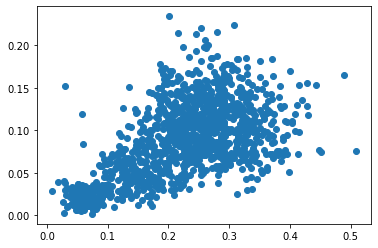

In [104]:
plt.scatter(forward_x_velocity, forward_steps)

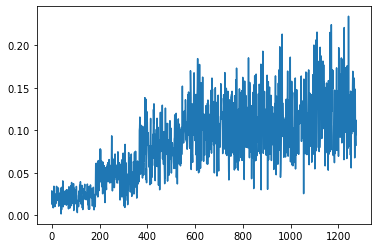

In [105]:
plt.plot(forward_steps)

### Stats

In [36]:
log_motions_stats(motion_fwd, footsteps_fwd, [1,0,0], False, "odom")

Motion: [0.1 0.  0. ]

Avg. com step yaw: -0.0034418874862685712
Min com step yaw: -0.025571511857615747
Max com step yaw: 0.01489328651979871
Std com step yaw: 0.007320783860736317

Avg. com step size (x): 0.021228874988544456
Min com step size (x): 0.0016599581644898276
Max com step size (x): 0.0405097028347583
Std com step size (x): 0.008407803540833262

Avg. com step size (y): 0.005994641696390104
Min com step size (y): 0.000861089497807388
Max com step size (y): 0.011602988927694735
Std com step size (y): 0.0029519474178006017

Motion: [0.2 0.  0. ]

Avg. com step yaw: -0.0018551022445775119
Min com step yaw: -6.279304259936136
Max com step yaw: 6.27953278472979
Std com step yaw: 0.6564958084301974

Avg. com step size (x): 0.046759590795744696
Min com step size (x): 0.009302150456909741
Max com step size (x): 0.09351456364673805
Std com step size (x): 0.015972352686552168

Avg. com step size (y): 0.005791017872962436
Min com step size (y): -0.00030943033203456594
Max com step size

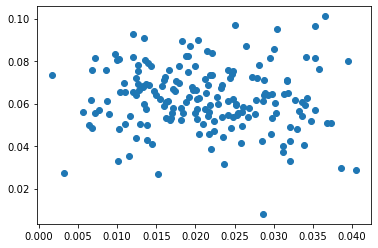

In [95]:
plt.scatter(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1], getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[3])

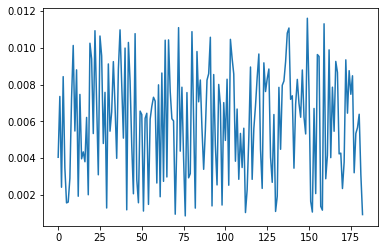

In [98]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[2])

#### FL/RR (x)

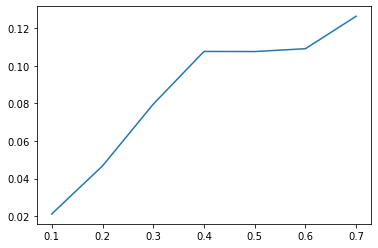

In [37]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[1])])

#### FL/RR (y)

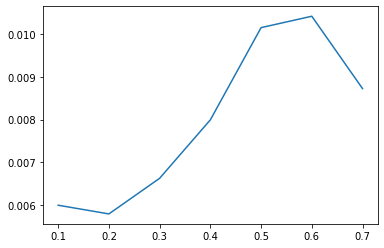

In [38]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[2])])

In [39]:
log_motions_stats(motion_fwd, footsteps_fwd, [1,0,0], True, "odom")

Motion: [0.1 0.  0. ]

Avg. com step yaw: -0.001045271081330998
Min com step yaw: -0.022015368550933112
Max com step yaw: 0.01915828441531453
Std com step yaw: 0.00724095799776008

Avg. com step size (x): 0.01795090822283825
Min com step size (x): 0.0026315434632623314
Max com step size (x): 0.03754522854265385
Std com step size (x): 0.0069875114770528695

Avg. com step size (y): -0.0049509863183439225
Min com step size (y): -0.010923099226742172
Max com step size (y): -0.00044173166939715696
Std com step size (y): 0.002241757583663823

Motion: [0.2 0.  0. ]

Avg. com step yaw: 0.02892072670349323
Min com step yaw: -0.023878254483805428
Max com step yaw: 6.268711156884468
Std com step yaw: 0.462584016046428

Avg. com step size (x): 0.04469304753266605
Min com step size (x): 0.013065423704969437
Max com step size (x): 0.08327627596617226
Std com step size (x): 0.014807973341930914

Avg. com step size (y): -0.005876313195638879
Min com step size (y): -0.012308650899008455
Max com step si

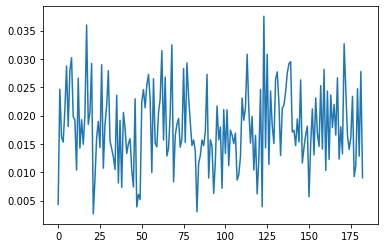

In [87]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[1])

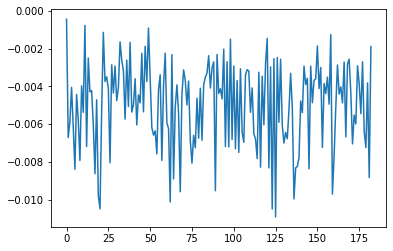

In [82]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[2])

#### FR/RL (x)

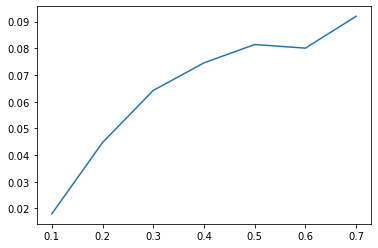

In [40]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], True, "odom")[1])])

#### FR/RL (y)

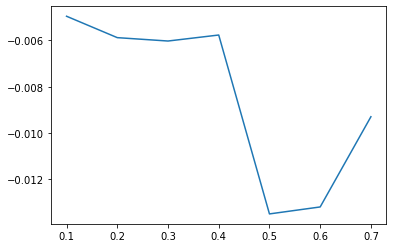

In [41]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], True, "odom")[2])])

### Right

In [42]:
log_motions_stats(motion_side_right, footsteps_side_right, [0,-1,0], False, "odom")

Motion: [ 0.  -0.1  0. ]

Avg. com step yaw: -0.02191512141877851
Min com step yaw: -0.07846038634518937
Max com step yaw: 0.0058226430863652645
Std com step yaw: 0.01792995824688481

Avg. com step size (x): -0.0037829039750408994
Min com step size (x): -0.013021281133462459
Max com step size (x): 0.005354232362973388
Std com step size (x): 0.004289167962143386

Avg. com step size (y): -0.023281200487432766
Min com step size (y): -0.04063919040556874
Max com step size (y): -0.008306741705991882
Std com step size (y): 0.0062293724211213925

Motion: [ 0.  -0.2  0. ]

Avg. com step yaw: -0.026332190207225284
Min com step yaw: -0.12987222545826724
Max com step yaw: 0.014024647686181946
Std com step yaw: 0.031921938147351885

Avg. com step size (x): 0.0009921093939342068
Min com step size (x): -0.011585979785246892
Max com step size (x): 0.01148977287846975
Std com step size (x): 0.0047526667423837205

Avg. com step size (y): -0.05513917191359915
Min com step size (y): -0.09513827403868791


#### FL/RR (x)

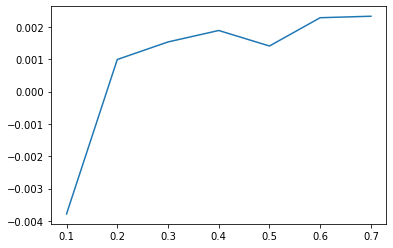

In [43]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], False, "odom")[1])])

#### FL/RR (y)

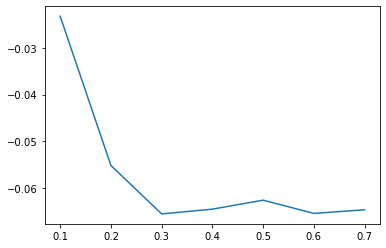

In [44]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], False, "odom")[2])])

#### FR/RL (x)

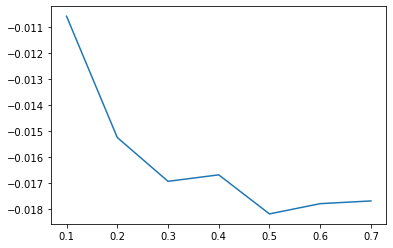

In [45]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], True, "odom")[1])])

#### FR/RL (y)

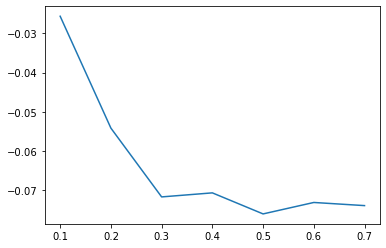

In [46]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], True, "odom")[2])])

### Left

In [47]:
log_motions_stats(motion_side_left, footsteps_side_left, [0,1,0], False, "odom")

Motion: [0.  0.1 0. ]

Avg. com step yaw: -0.011420943590793957
Min com step yaw: -0.06618452135958508
Max com step yaw: 0.013698904433199655
Std com step yaw: 0.016652552978262063

Avg. com step size (x): -0.009384274551337175
Min com step size (x): -0.018568323547752286
Max com step size (x): 0.0024754201108789786
Std com step size (x): 0.0033074232473993006

Avg. com step size (y): 0.026098466247157802
Min com step size (y): 0.00944462495306464
Max com step size (y): 0.04881998648617003
Std com step size (y): 0.0070622050910299035

Motion: [0.  0.2 0. ]

Avg. com step yaw: -0.026627384442400214
Min com step yaw: -0.11747877656132544
Max com step yaw: 0.024554118196124484
Std com step yaw: 0.03863953538351794

Avg. com step size (x): -0.011357275075517766
Min com step size (x): -0.02354878618588785
Max com step size (x): -0.002843233744037832
Std com step size (x): 0.0036856880933991572

Avg. com step size (y): 0.052850408061925515
Min com step size (y): 0.016080429877419533
Max com 

#### FL/RR (x)

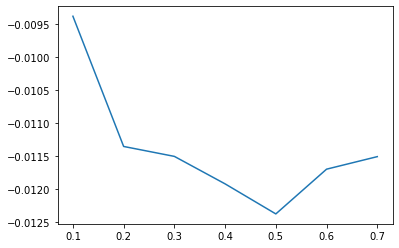

In [48]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], False, "odom")[1])])

#### FL/RR (y)

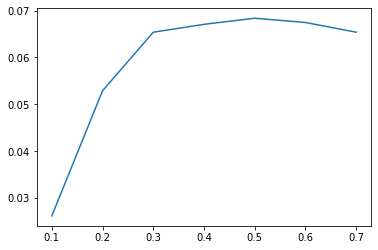

In [49]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], False, "odom")[2])])

#### FR/RL (x)

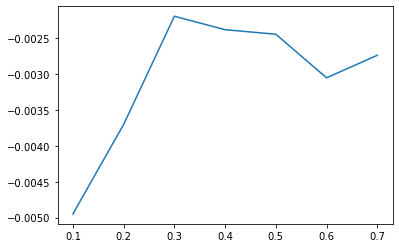

In [50]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], True, "odom")[1])])

#### FR/RL (y)

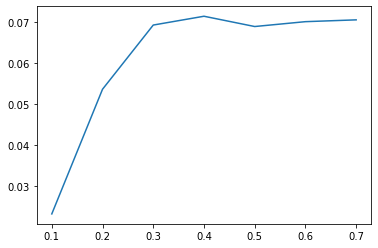

In [51]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], True, "odom")[2])])

### Clockwise

In [52]:
log_motions_stats(motion_clock, footsteps_clock, [0,0,-1], False, "odom")

Motion: [ 0.   0.  -0.1]

Avg. com step yaw: 0.02255324781927117
Min com step yaw: -0.07325832970061064
Max com step yaw: 6.241020227176431
Std com step yaw: 0.652884455392944

Avg. com step size (x): -0.007019605300899868
Min com step size (x): -0.017440588952091662
Max com step size (x): 0.005083366155915314
Std com step size (x): 0.004384304816484647

Avg. com step size (y): 0.007682703196730449
Min com step size (y): 0.0006442110926112576
Max com step size (y): 0.01746130592065409
Std com step size (y): 0.0035503985054413153

Motion: [ 0.   0.  -0.2]

Avg. com step yaw: 0.02219959816335711
Min com step yaw: -0.10534049207109712
Max com step yaw: 6.213736441655074
Std com step yaw: 0.8028995943709809

Avg. com step size (x): -0.006198157592242231
Min com step size (x): -0.018307242109703914
Max com step size (x): 0.009428537191347619
Std com step size (x): 0.004866260726003658

Avg. com step size (y): 0.009973886614856138
Min com step size (y): 0.0015619505561801361
Max com step siz

#### FL/RR (x)

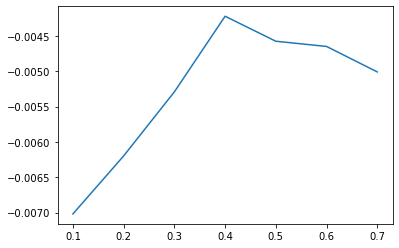

In [53]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], False, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], False, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], False, "odom")[1])])

#### FL/RR (y)

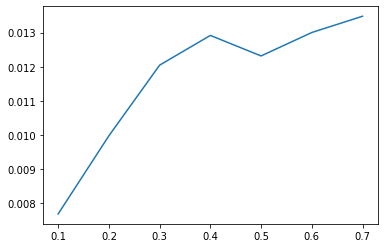

In [54]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], False, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], False, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], False, "odom")[2])])

#### FR/RL (x)

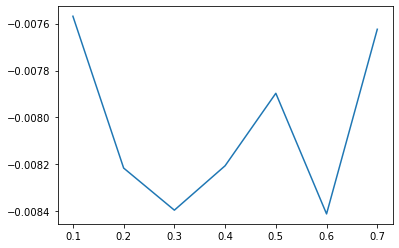

In [55]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], True, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], True, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], True, "odom")[1])])

#### FR/RL (y)

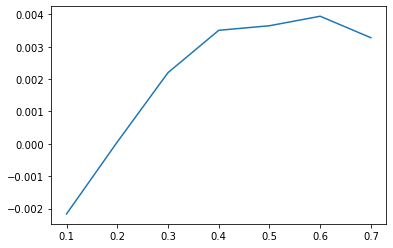

In [56]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], True, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], True, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], True, "odom")[2])])

### Counter Clockwise

In [57]:
log_motions_stats(motion_count, footsteps_count, [0,0,1], False, "odom")

Motion: [0.  0.  0.1]

Avg. com step yaw: -0.0034059902446773424
Min com step yaw: -6.257603135246413
Max com step yaw: 0.049158136632321714
Std com step yaw: 0.4623803465827283

Avg. com step size (x): -0.0066085557890718915
Min com step size (x): -0.015530507634038848
Max com step size (x): 0.0018641628313624814
Std com step size (x): 0.004045212577949533

Avg. com step size (y): 0.003242392234687641
Min com step size (y): -0.00189288381453534
Max com step size (y): 0.008309607992521784
Std com step size (y): 0.0025109559263218773

Motion: [0.  0.  0.2]

Avg. com step yaw: 0.03316790531921233
Min com step yaw: -6.218837200428958
Max com step yaw: 0.09172879350594587
Std com step yaw: 0.46350943687861285

Avg. com step size (x): -0.006239323052307761
Min com step size (x): -0.01639972063754591
Max com step size (x): 0.004593237846103548
Std com step size (x): 0.004192917197420888

Avg. com step size (y): 0.0010886698306199186
Min com step size (y): -0.0052830634053124825
Max com step 

#### FL/RR (x)

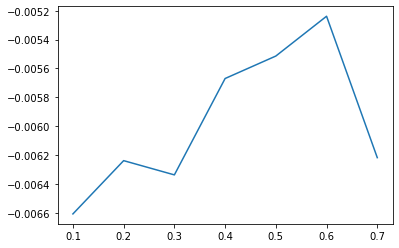

In [58]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], False, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], False, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], False, "odom")[1])])

#### FL/RR (y)

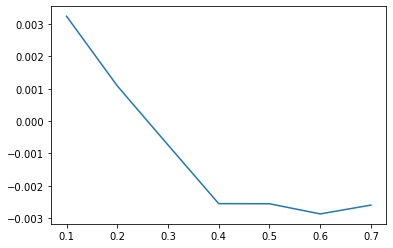

In [59]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], False, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], False, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], False, "odom")[2])])

#### FR/RL (x)

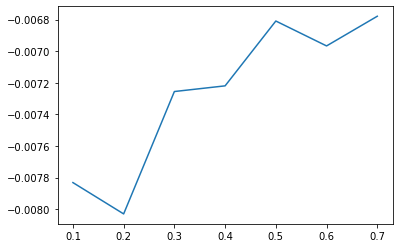

In [60]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], True, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], True, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], True, "odom")[1])])

#### FR/RL (y)

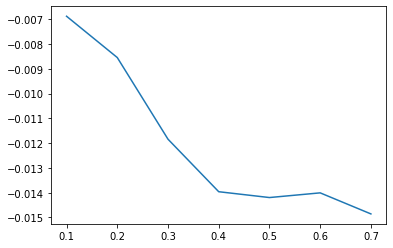

In [61]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], True, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], True, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], True, "odom")[2])])

### Footstep visualization

In [25]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        # 3D positions        
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zz = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [26]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    new_y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    new_z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.184, 0.166, FL (y): 0.133, 0.134.
FL displacement: -0.017999999999999988, 0.0010000000000000009.

FR (x): 0.186, 0.203, FR (y): -0.133, -0.136.
FR displacement: 0.017000000000000015, -0.0030000000000000027.

RL (x): -0.277, -0.27, RL (y): 0.133, 0.137.
RL displacement: 0.007000000000000006, 0.0040000000000000036.

RR (x): -0.277, -0.303, RR (y): -0.133, -0.134.
RR displacement: -0.025999999999999968, -0.0010000000000000009.


Base displacement (Foot): [0.017999999999999988, -0.0010000000000000009].

Velocity x: [0.01438702]. Velocity y: [-0.00147244]. Angular 0.002517097034481059
Odom velocity x: 0.00808390155526. Odom velocity y: -0.000952214873642. Odom velocity yaw: 0.238485481884
Base displacement (Odom): [[0.004316108424438636], [-0.00044173166939715696]]. Rotation displacement: -0.6570613681856315.



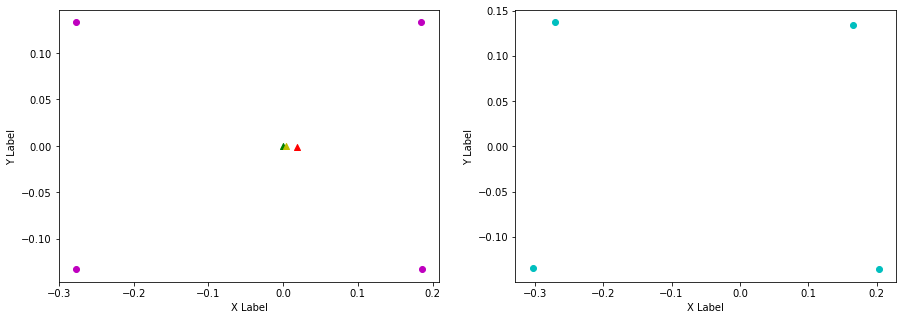

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.196, FL (y): 0.134, 0.135.
FL displacement: 0.03, 0.0010000000000000009.

FR (x): 0.203, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.038000000000000006, 0.0010000000000000009.

RL (x): -0.27, -0.312, RL (y): 0.137, 0.134.
RL displacement: -0.04199999999999998, -0.0030000000000000027.

RR (x): -0.303, -0.275, RR (y): -0.134, -0.139.
RR displacement: 0.02799999999999997, -0.0050000000000000044.


Base displacement (Foot): [0.038000000000000006, -0.0010000000000000009].

Velocity x: [0.08177483]. Velocity y: [0.01156457]. Angular -0.023427894051950313
Odom velocity x: 0.0502451718172. Odom velocity y: 0.00652498813752. Odom velocity yaw: -0.290792527254
Base displacement (Odom): [[0.028621182573380137], [0.004047596655414683]]. Rotation displacement: 0.04326573851779629.



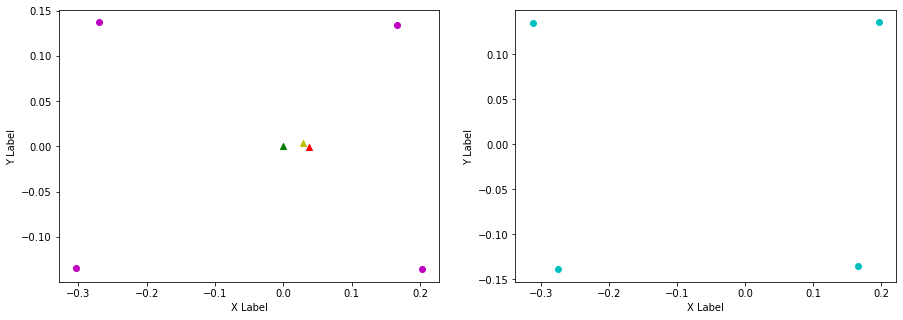

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.196, 0.17, FL (y): 0.135, 0.136.
FL displacement: -0.025999999999999995, 0.0010000000000000009.

FR (x): 0.165, 0.2, FR (y): -0.135, -0.133.
FR displacement: 0.035, 0.0020000000000000018.

RL (x): -0.312, -0.273, RL (y): 0.134, 0.138.
RL displacement: 0.03899999999999998, 0.0040000000000000036.

RR (x): -0.275, -0.299, RR (y): -0.139, -0.135.
RR displacement: -0.023999999999999966, 0.0040000000000000036.


Base displacement (Foot): [0.025999999999999995, -0.0010000000000000009].

Velocity x: [0.09134716]. Velocity y: [-0.02486864]. Angular 0.017738983840341963
Odom velocity x: 0.0757343832316. Odom velocity y: -0.00825749807559. Odom velocity yaw: 0.233508369509
Base displacement (Odom): [[0.024663730634544634], [-0.006714533052617971]]. Rotation displacement: -0.4698116802061807.



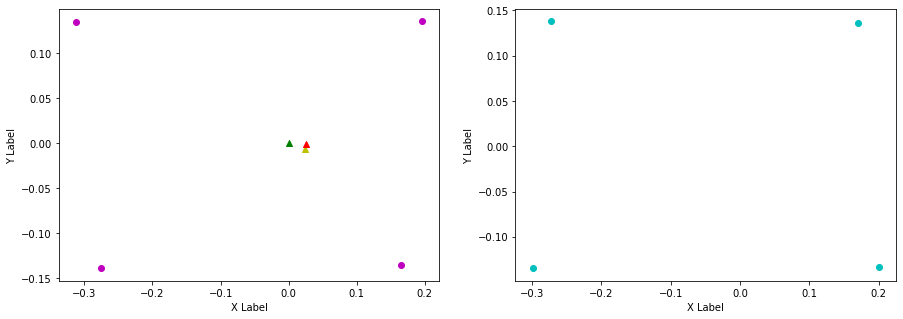

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.198, FL (y): 0.136, 0.134.
FL displacement: 0.027999999999999997, -0.0020000000000000018.

FR (x): 0.2, 0.165, FR (y): -0.133, -0.135.
FR displacement: -0.035, -0.0020000000000000018.

RL (x): -0.273, -0.31, RL (y): 0.138, 0.135.
RL displacement: -0.03699999999999998, -0.0030000000000000027.

RR (x): -0.299, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.024999999999999967, -0.0030000000000000027.


Base displacement (Foot): [0.035, 0.0020000000000000018].

Velocity x: [0.0448291]. Velocity y: [0.0198728]. Angular -0.008539187863565348
Odom velocity x: 0.0671520616182. Odom velocity y: 0.00724576512657. Odom velocity yaw: -0.28885079494
Base displacement (Odom): [[0.016586771032761394], [0.007352939218927761]]. Rotation displacement: 0.27441958547793965.



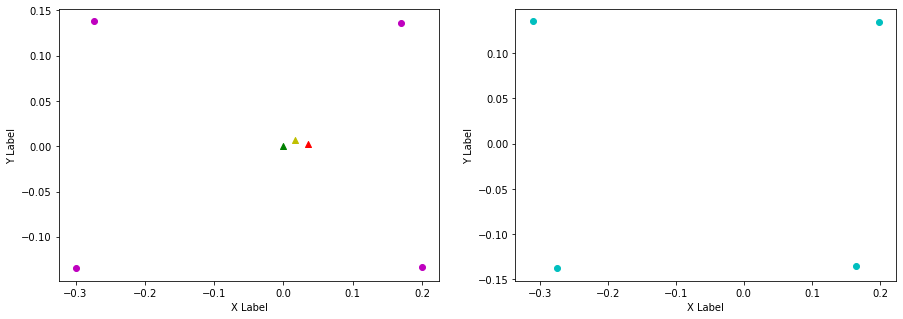

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.03, 0.0020000000000000018.

FR (x): 0.165, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.31, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.03699999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.304, RR (y): -0.138, -0.135.
RR displacement: -0.02999999999999997, 0.0030000000000000027.


Base displacement (Foot): [0.03, -0.0020000000000000018].

Velocity x: [0.05401956]. Velocity y: [-0.01958898]. Angular 0.01130886453162559
Odom velocity x: 0.0662133986795. Odom velocity y: -0.00581616806522. Odom velocity yaw: 0.223856783688
Base displacement (Odom): [[0.01620586450741814], [-0.005876694153350126]]. Rotation displacement: -0.18102604792634183.



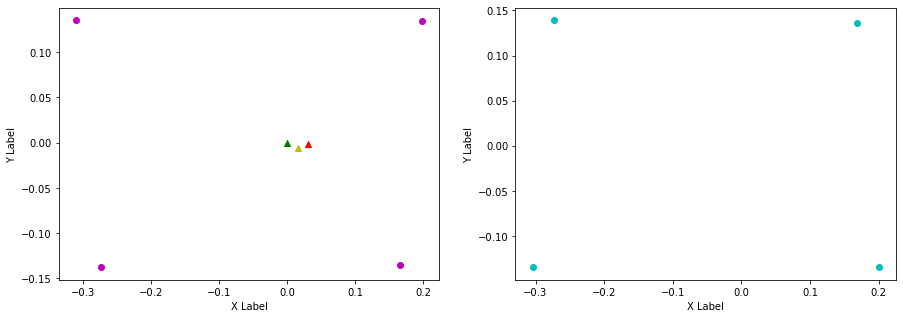

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.028999999999999998, 0.0.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.134.
FR displacement: -0.035, 0.0010000000000000009.

RL (x): -0.273, -0.313, RL (y): 0.139, 0.134.
RL displacement: -0.03999999999999998, -0.0050000000000000044.

RR (x): -0.304, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.02999999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.03536232]. Velocity y: [0.00672016]. Angular -0.014119415701562374
Odom velocity x: 0.0553585748796. Odom velocity y: 0.000835926896868. Odom velocity yaw: -0.278989800379
Base displacement (Odom): [[0.01273043119978192], [0.00241925818324744]]. Rotation displacement: 0.1943850317275274.



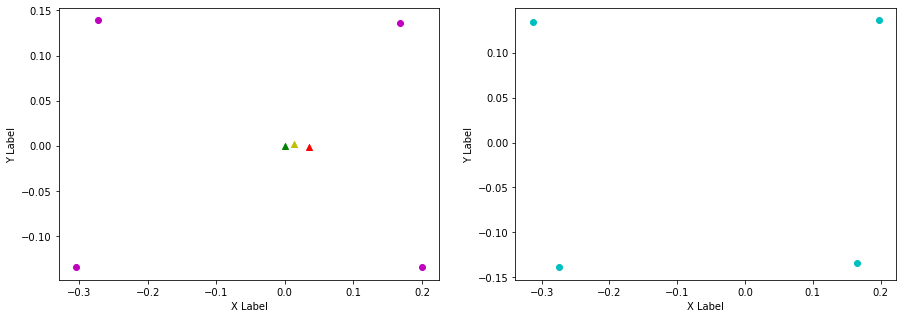

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.164, FL (y): 0.136, 0.135.
FL displacement: -0.033, -0.0010000000000000009.

FR (x): 0.165, 0.197, FR (y): -0.134, -0.137.
FR displacement: 0.032, -0.0030000000000000027.

RL (x): -0.313, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03899999999999998, 0.006000000000000005.

RR (x): -0.274, -0.311, RR (y): -0.139, -0.134.
RR displacement: -0.03699999999999998, 0.0050000000000000044.


Base displacement (Foot): [0.033, 0.0010000000000000009].

Velocity x: [0.05109054]. Velocity y: [-0.01352487]. Angular 0.01006634157186378
Odom velocity x: 0.0549925277014. Odom velocity y: -0.00565323167775. Odom velocity yaw: 0.231969829298
Base displacement (Odom): [[0.015327160216156259], [-0.004057461198370169]]. Rotation displacement: -0.2912337695348107.



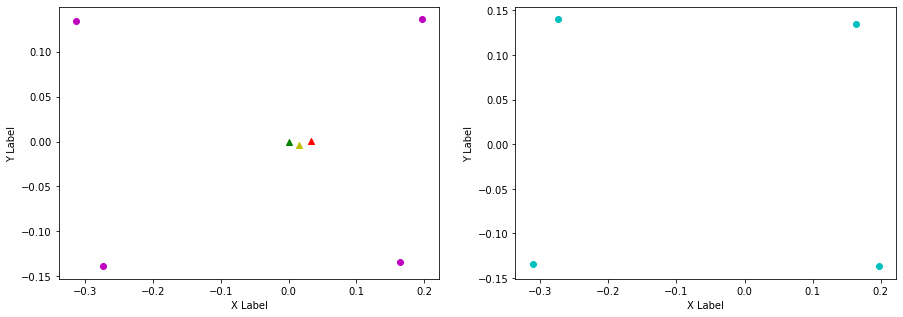

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.135.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.08373494]. Velocity y: [0.0255449]. Angular -0.029515169588724275
Odom velocity x: 0.0765284247176. Odom velocity y: 0.0113057938984. Odom velocity yaw: -0.274690171851
Base displacement (Odom): [[0.02763254403367208], [0.00842982032149921]]. Rotation displacement: 0.17302763865945758.



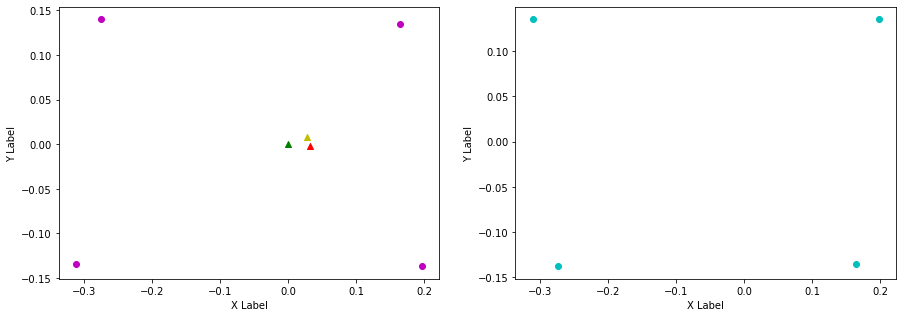

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.06988689]. Velocity y: [-0.02045975]. Angular 0.008467580679563191
Odom velocity x: 0.0792612938896. Odom velocity y: -0.00366330478097. Odom velocity yaw: 0.222827714807
Base displacement (Odom): [[0.020966062968343017], [-0.006137923579637792]]. Rotation displacement: -0.5580615083535377.



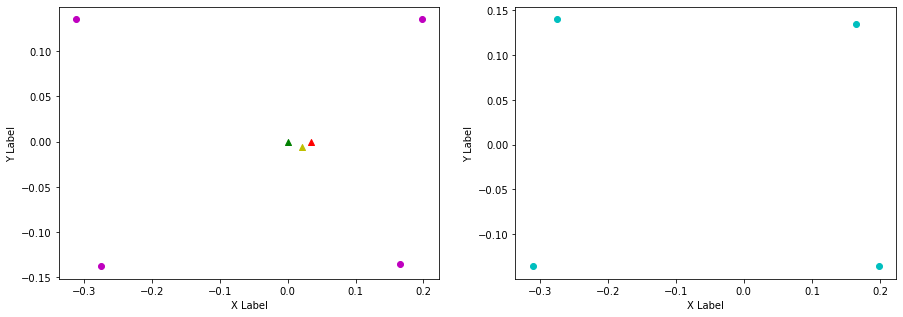

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.035, -0.0010000000000000009.

FR (x): 0.198, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.31, RL (y): 0.14, 0.135.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.0367976]. Velocity y: [0.00914731]. Angular -0.028586741194404793
Odom velocity x: 0.0584155184635. Odom velocity y: 0.00349832401461. Odom velocity yaw: -0.283251409061
Base displacement (Odom): [[0.01398308456400868], [0.00347597657770242]]. Rotation displacement: 0.14554696755357538.



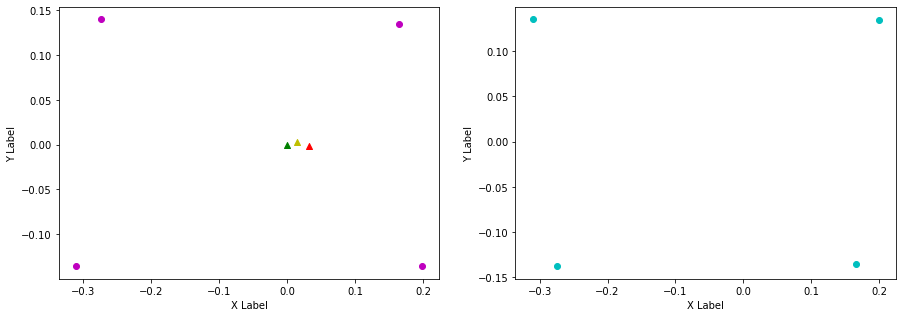

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.167, FL (y): 0.134, 0.136.
FL displacement: -0.032, 0.0020000000000000018.

FR (x): 0.166, 0.2, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.31, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.035999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.305, RR (y): -0.138, -0.135.
RR displacement: -0.030999999999999972, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.09584273]. Velocity y: [-0.0279802]. Angular 0.02781808048371201
Odom velocity x: 0.0803712114538. Odom velocity y: -0.0130966179505. Odom velocity yaw: 0.233648986188
Base displacement (Odom): [[0.028752837944158505], [-0.008394065697951807]]. Rotation displacement: -0.6224016527164584.



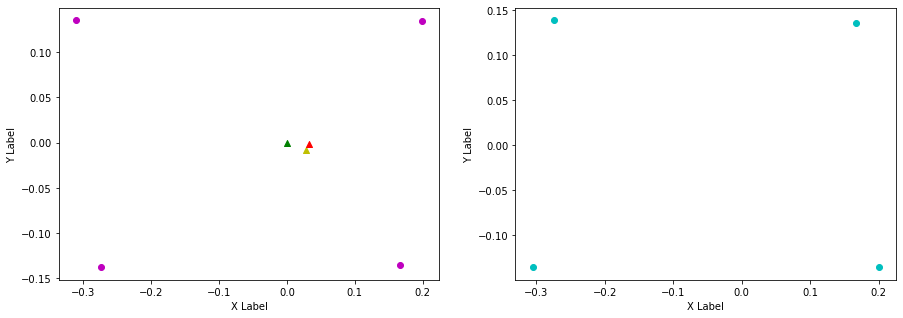

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.031, -0.0010000000000000009.

FR (x): 0.2, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.036000000000000004, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.030999999999999972, -0.0030000000000000027.


Base displacement (Foot): [0.036000000000000004, -0.0010000000000000009].

Velocity x: [0.03235393]. Velocity y: [0.00506173]. Angular -0.015420531308615492
Odom velocity x: 0.0570613507658. Odom velocity y: -0.00547223540523. Odom velocity yaw: -0.274979118025
Base displacement (Odom): [[0.010029717794406062], [0.0015691346213872748]]. Rotation displacement: 0.4781578857659858.



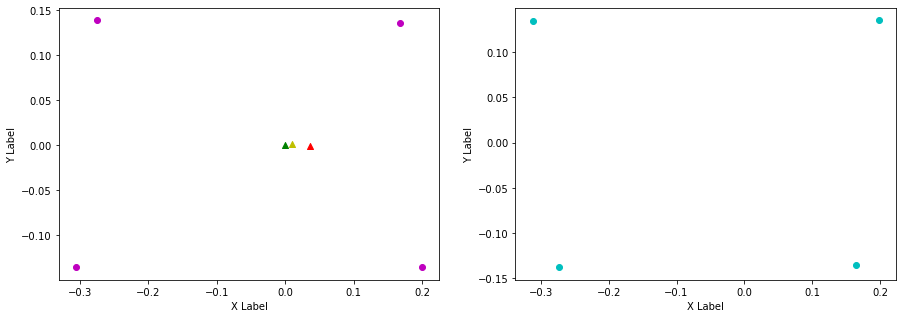

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.197, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.311, RR (y): -0.138, -0.135.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.05312384]. Velocity y: [-0.01302488]. Angular 0.020066485077715173
Odom velocity x: 0.0551102756143. Odom velocity y: -0.00909757151772. Odom velocity yaw: 0.238903262153
Base displacement (Odom): [[0.018062101443580697], [-0.00442845875265544]]. Rotation displacement: -0.27389467161216496.



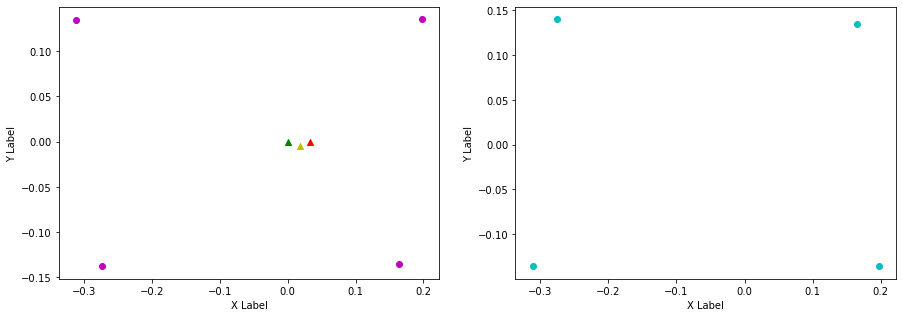

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.02872474]. Velocity y: [0.00520056]. Angular -0.045455222678209645
Odom velocity x: 0.0417271920887. Odom velocity y: -0.00248113820135. Odom velocity yaw: -0.275734150794
Base displacement (Odom): [[0.008904674128006135], [0.0016121748847009298]]. Rotation displacement: 0.39090636888753044.



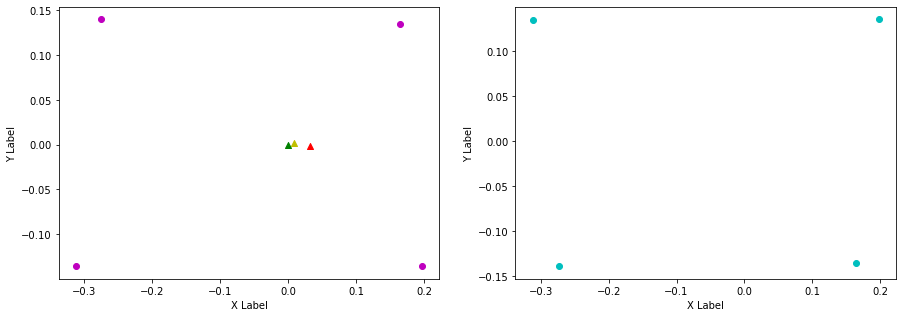

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.035, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.307, RR (y): -0.139, -0.135.
RR displacement: -0.032999999999999974, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.08715315]. Velocity y: [-0.01801303]. Angular 0.012948154800937499
Odom velocity x: 0.0693890437917. Odom velocity y: -0.0110985704554. Odom velocity yaw: 0.235640748374
Base displacement (Odom): [[0.02788900323681917], [-0.005764168033716585]]. Rotation displacement: -0.8073621209605252.



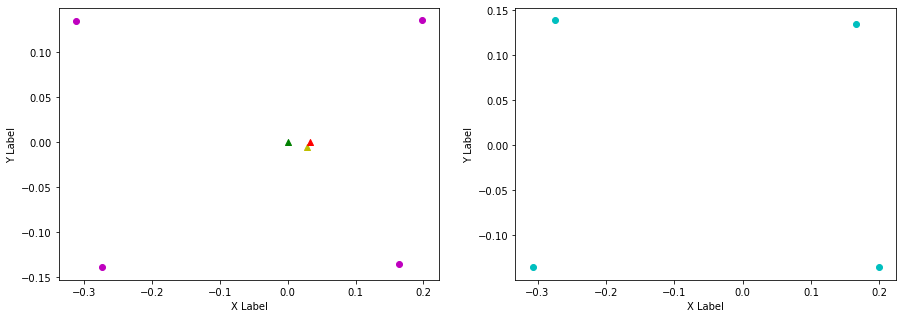

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.032, -0.0010000000000000009.

FR (x): 0.199, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.307, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.032999999999999974, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04135474]. Velocity y: [0.00879581]. Angular -0.015863961821855017
Odom velocity x: 0.0579546780188. Odom velocity y: -0.00113552508007. Odom velocity yaw: -0.277402545251
Base displacement (Odom): [[0.013647062310079894], [0.0029026158916282355]]. Rotation displacement: 0.2373998296987733.



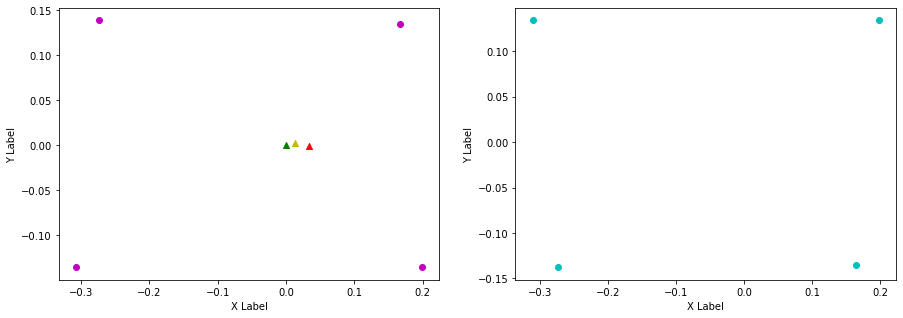

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.03, 0.0020000000000000018.

FR (x): 0.165, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0020000000000000018].

Velocity x: [0.09745907]. Velocity y: [-0.02558494]. Angular -0.008560568721524137
Odom velocity x: 0.0830939211796. Odom velocity y: -0.0138591974659. Odom velocity yaw: 0.225087664116
Base displacement (Odom): [[0.030212304671632467], [-0.007931328840823532]]. Rotation displacement: -0.2999494900406865.



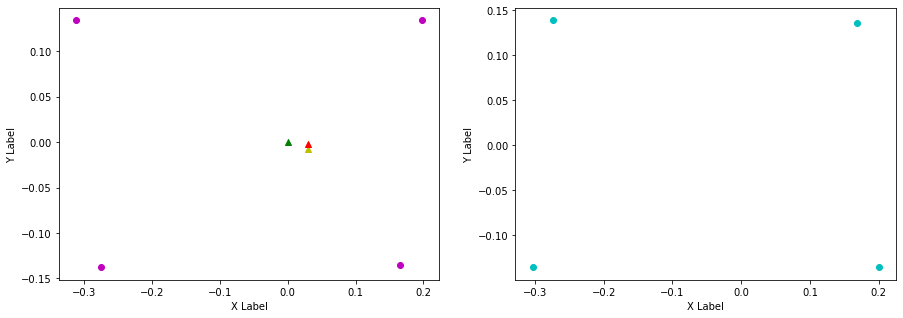

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.2, FL (y): 0.136, 0.133.
FL displacement: 0.032, -0.0030000000000000027.

FR (x): 0.2, 0.17, FR (y): -0.135, -0.135.
FR displacement: -0.03, 0.0.

RL (x): -0.274, -0.305, RL (y): 0.139, 0.136.
RL displacement: -0.030999999999999972, -0.0030000000000000027.

RR (x): -0.303, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02899999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0].

Velocity x: [0.03236823]. Velocity y: [0.02413387]. Angular 0.024950988909078355
Odom velocity x: 0.0610623697654. Odom velocity y: 0.0043341081371. Odom velocity yaw: -0.208794608764
Base displacement (Odom): [[0.009710476206727214], [0.007240165518911169]]. Rotation displacement: -0.15205015390651533.



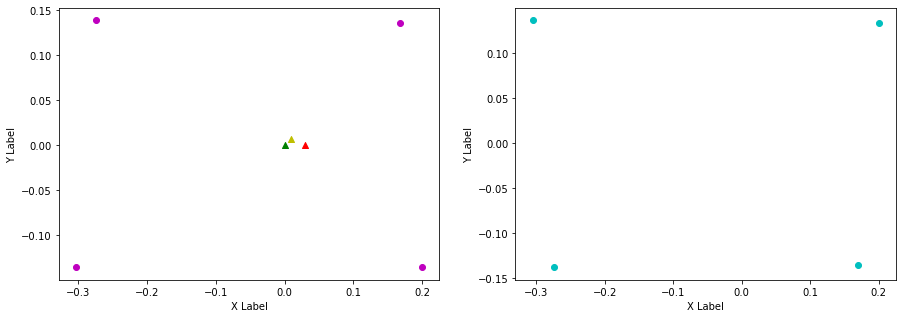

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.17, FL (y): 0.133, 0.136.
FL displacement: -0.03, 0.0030000000000000027.

FR (x): 0.17, 0.201, FR (y): -0.135, -0.134.
FR displacement: 0.031, 0.0010000000000000009.

RL (x): -0.305, -0.273, RL (y): 0.136, 0.138.
RL displacement: 0.03199999999999997, 0.0020000000000000018.

RR (x): -0.274, -0.3, RR (y): -0.138, -0.136.
RR displacement: -0.025999999999999968, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0030000000000000027].

Velocity x: [0.05503767]. Velocity y: [-0.01103089]. Angular -0.03790480095838478
Odom velocity x: 0.0624086846264. Odom velocity y: -0.00326541402718. Odom velocity yaw: 0.217266974015
Base displacement (Odom): [[0.019813555144500228], [-0.0039711199463691015]]. Rotation displacement: 0.4288761804223335.



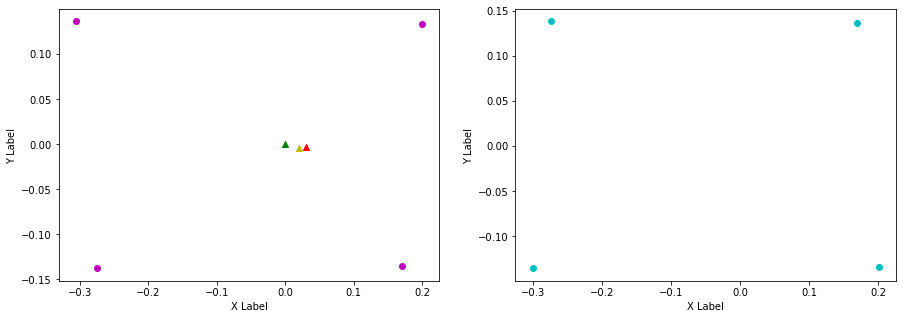

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.199, FL (y): 0.136, 0.135.
FL displacement: 0.028999999999999998, -0.0010000000000000009.

FR (x): 0.201, 0.165, FR (y): -0.134, -0.135.
FR displacement: -0.036000000000000004, -0.0010000000000000009.

RL (x): -0.273, -0.311, RL (y): 0.138, 0.135.
RL displacement: -0.03799999999999998, -0.0030000000000000027.

RR (x): -0.3, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.025999999999999968, -0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, 0.0010000000000000009].

Velocity x: [0.10068462]. Velocity y: [0.02977567]. Angular -0.007757517691308253
Odom velocity x: 0.0840860458726. Odom velocity y: 0.0142520052009. Odom velocity yaw: -0.258982180126
Base displacement (Odom): [[0.03423276185357593], [0.01012372638504156]]. Rotation displacement: -0.7818424147222731.



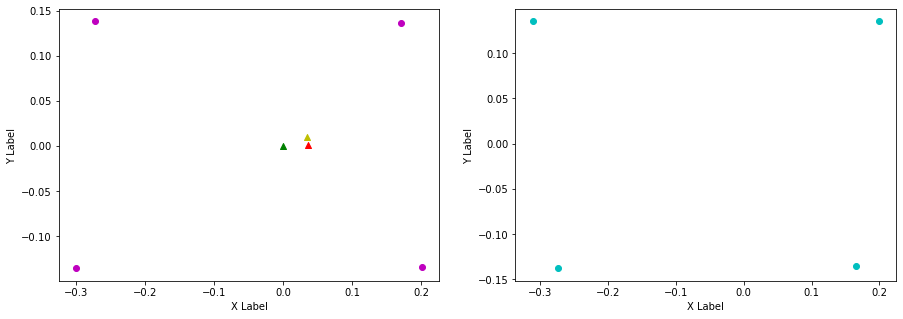

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.135, 0.136.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.165, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03699999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.06399017]. Velocity y: [-0.01791743]. Angular -0.004058180659826023
Odom velocity x: 0.0778260648219. Odom velocity y: -0.000112827626921. Odom velocity yaw: 0.171844213766
Base displacement (Odom): [[0.01919706460512638], [-0.005375231544093393]]. Rotation displacement: -0.15112078974198567.



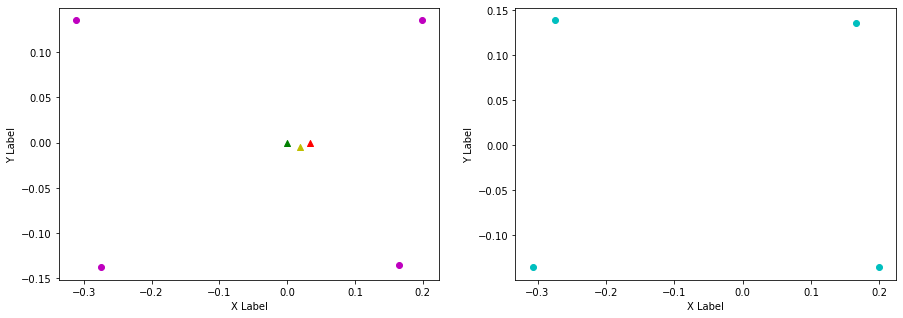

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.032, -0.0010000000000000009.

FR (x): 0.199, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.035, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.135.
RL displacement: -0.03799999999999998, -0.0040000000000000036.

RR (x): -0.307, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.032999999999999974, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.05679491]. Velocity y: [0.01564219]. Angular -0.0035809850059188688
Odom velocity x: 0.0709078479225. Odom velocity y: 0.0091790132848. Odom velocity yaw: -0.2734568112
Base displacement (Odom): [[0.01987821307465798], [0.005474764062393403]]. Rotation displacement: -0.06975503164192057.



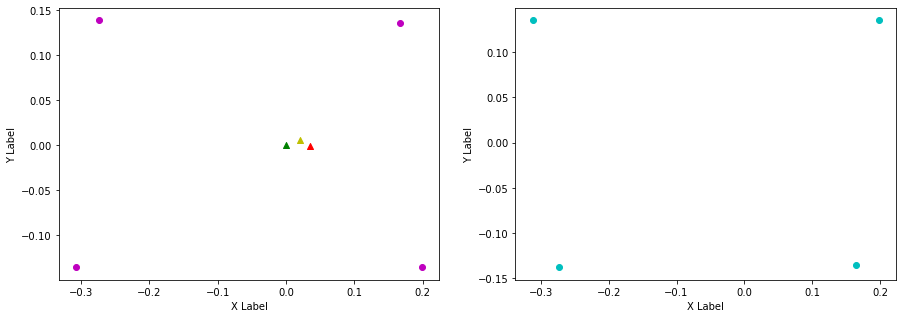

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.03050945]. Velocity y: [-0.00225034]. Angular 0.015179930294834538
Odom velocity x: 0.0493018682188. Odom velocity y: 0.0045111751143. Odom velocity yaw: 0.244122726674
Base displacement (Odom): [[0.01037320909461309], [-0.0007651139840087057]]. Rotation displacement: -0.07181134500152944.



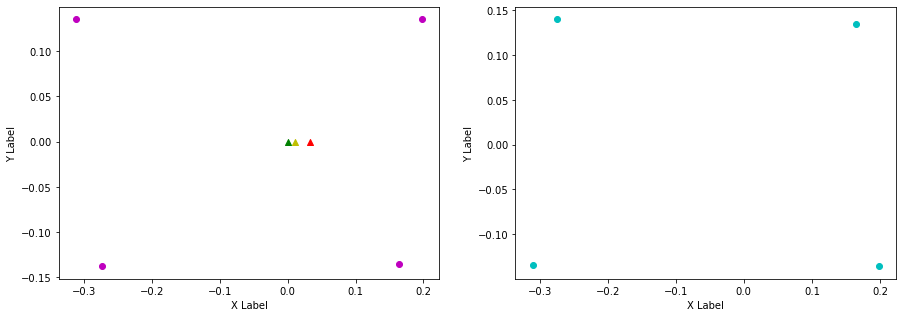

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03799999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.08629558]. Velocity y: [0.02932572]. Angular -0.02105078461821317
Odom velocity x: 0.0697776366982. Odom velocity y: 0.0179573158919. Odom velocity yaw: -0.269885260945
Base displacement (Odom): [[0.02588869121532905], [0.008797723003613566]]. Rotation displacement: 0.29571354467601874.



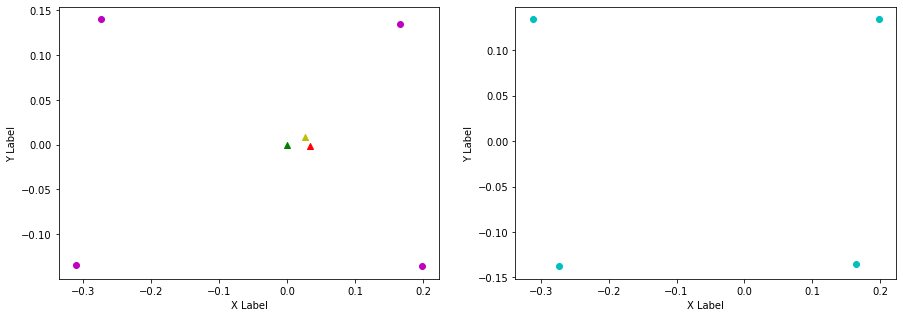

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.08312127]. Velocity y: [-0.02248032]. Angular -0.018316762123237237
Odom velocity x: 0.0821103028296. Odom velocity y: -0.00213708048798. Odom velocity yaw: 0.214384760681
Base displacement (Odom): [[0.026598799855021782], [-0.007193700731665167]]. Rotation displacement: -0.36183656426810373.



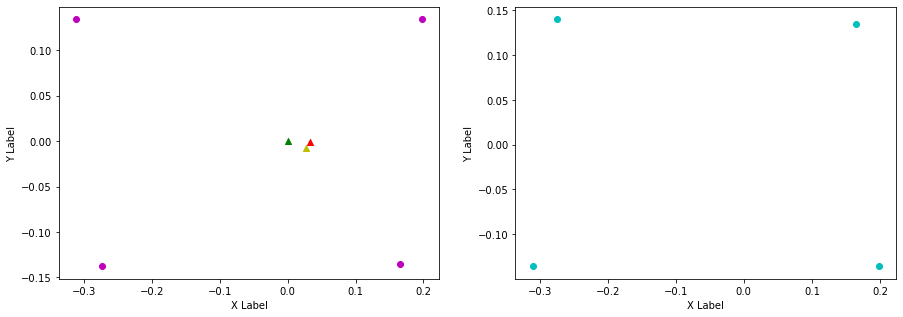

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.134.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.274, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03799999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.03543953]. Velocity y: [0.00567482]. Angular -0.005860657040921019
Odom velocity x: 0.0588589587538. Odom velocity y: 0.000972774346315. Odom velocity yaw: -0.285824547161
Base displacement (Odom): [[0.012049438562873438], [0.0019294398150173503]]. Rotation displacement: -0.33583134242221296.



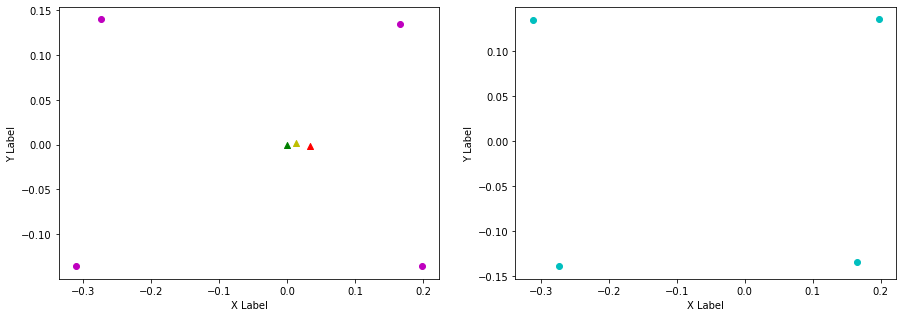

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.134, -0.136.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.04598732]. Velocity y: [-0.00805881]. Angular -0.0019458287449877268
Odom velocity x: 0.053826227444. Odom velocity y: -0.00289437253949. Odom velocity yaw: 0.217613503023
Base displacement (Odom): [[0.014256067327300281], [-0.0024982313817838338]]. Rotation displacement: -0.11416888180909213.



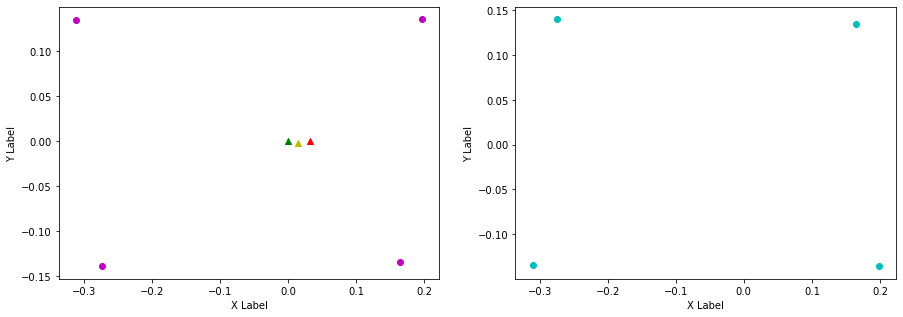

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.176, FR (y): -0.136, -0.137.
FR displacement: -0.02200000000000002, -0.0010000000000000009.

RL (x): -0.274, -0.296, RL (y): 0.14, 0.137.
RL displacement: -0.021999999999999964, -0.0030000000000000027.

RR (x): -0.31, -0.272, RR (y): -0.134, -0.137.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.02200000000000002, 0.0010000000000000009].

Velocity x: [0.08550888]. Velocity y: [0.02573294]. Angular 0.02252919276610223
Odom velocity x: 0.0714416235583. Odom velocity y: 0.0118463500033. Odom velocity yaw: -0.140418588062
Base displacement (Odom): [[0.024797591343993675], [0.00746255837241183]]. Rotation displacement: -0.03456120379095905.



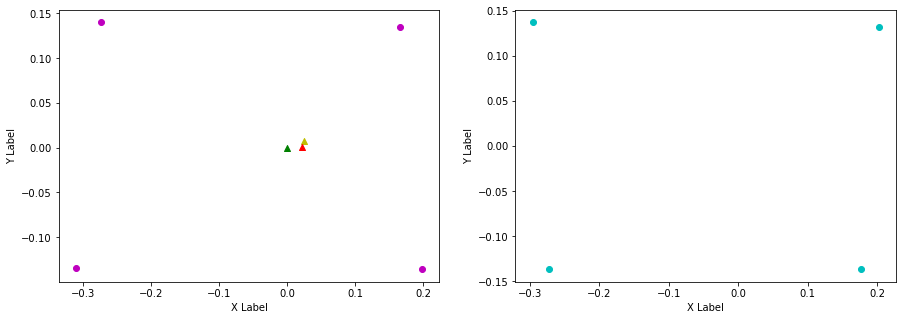

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.171, FL (y): 0.132, 0.137.
FL displacement: -0.031, 0.0050000000000000044.

FR (x): 0.176, 0.202, FR (y): -0.137, -0.134.
FR displacement: 0.026000000000000023, 0.0030000000000000027.

RL (x): -0.296, -0.272, RL (y): 0.137, 0.138.
RL displacement: 0.023999999999999966, 0.0010000000000000009.

RR (x): -0.272, -0.298, RR (y): -0.137, -0.137.
RR displacement: -0.025999999999999968, 0.0.


Base displacement (Foot): [0.031, -0.0050000000000000044].

Velocity x: [0.05513839]. Velocity y: [-0.01227154]. Angular -0.0468228994998968
Odom velocity x: 0.065391440218. Odom velocity y: 4.75436745877e-05. Odom velocity yaw: 0.174231629864
Base displacement (Odom): [[0.0192984298946976], [-0.004295038713308464]]. Rotation displacement: 0.3743402803030829.



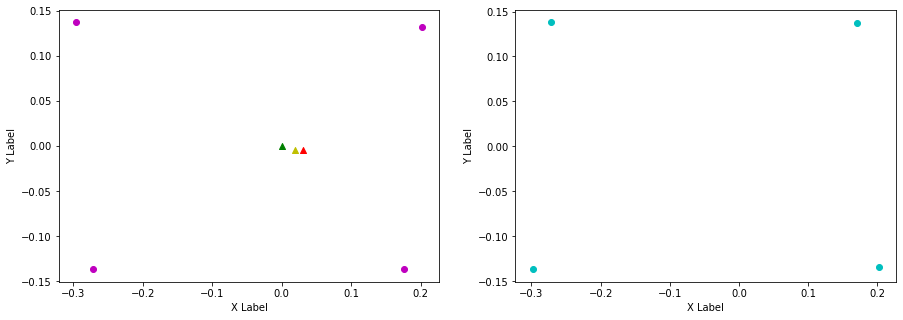

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.027999999999999997, -0.0030000000000000027.

FR (x): 0.202, 0.166, FR (y): -0.134, -0.135.
FR displacement: -0.036000000000000004, -0.0010000000000000009.

RL (x): -0.272, -0.309, RL (y): 0.138, 0.135.
RL displacement: -0.03699999999999998, -0.0030000000000000027.

RR (x): -0.298, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.023999999999999966, -0.0010000000000000009.


Base displacement (Foot): [0.036000000000000004, 0.0010000000000000009].

Velocity x: [0.03062717]. Velocity y: [0.011658]. Angular 0.022428863982113117
Odom velocity x: 0.0475393823336. Odom velocity y: 0.00625669453974. Odom velocity yaw: -0.243155924331
Base displacement (Odom): [[0.010413236832389594], [0.003963720409434657]]. Rotation displacement: -0.9389638282208459.



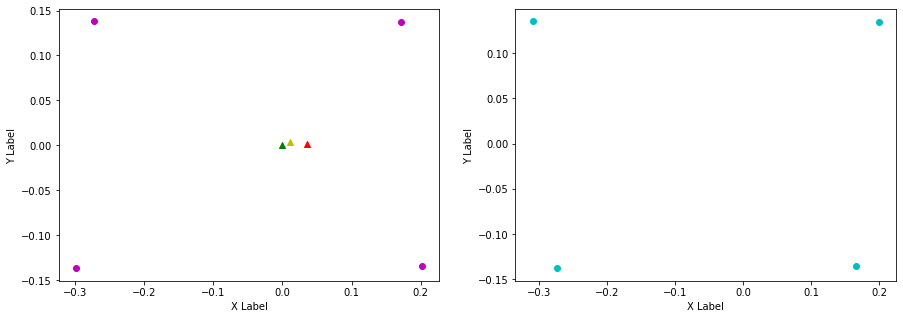

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.177, FL (y): 0.134, 0.14.
FL displacement: -0.02200000000000002, 0.006000000000000005.

FR (x): 0.166, 0.207, FR (y): -0.135, -0.133.
FR displacement: 0.04099999999999998, 0.0020000000000000018.

RL (x): -0.309, -0.269, RL (y): 0.135, 0.136.
RL displacement: 0.03999999999999998, 0.0010000000000000009.

RR (x): -0.274, -0.291, RR (y): -0.138, -0.139.
RR displacement: -0.01699999999999996, -0.0010000000000000009.


Base displacement (Foot): [0.02200000000000002, -0.006000000000000005].

Velocity x: [0.04817972]. Velocity y: [-0.01363976]. Angular -0.04557038475074826
Odom velocity x: 0.0486676498923. Odom velocity y: -0.00362428392603. Odom velocity yaw: 0.147079534026
Base displacement (Odom): [[0.01493572329338716], [-0.004228328077870644]]. Rotation displacement: 0.4369268331531063.



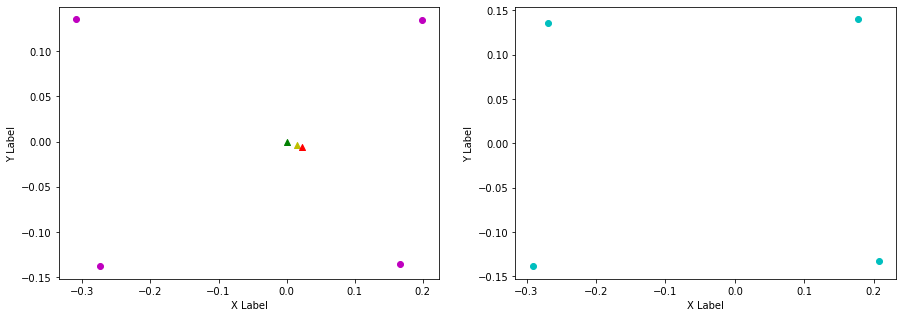

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.177, 0.2, FL (y): 0.14, 0.134.
FL displacement: 0.02300000000000002, -0.006000000000000005.

FR (x): 0.207, 0.168, FR (y): -0.133, -0.136.
FR displacement: -0.03899999999999998, -0.0030000000000000027.

RL (x): -0.269, -0.305, RL (y): 0.136, 0.135.
RL displacement: -0.035999999999999976, -0.0010000000000000009.

RR (x): -0.291, -0.273, RR (y): -0.139, -0.137.
RR displacement: 0.01799999999999996, 0.0020000000000000018.


Base displacement (Foot): [0.03899999999999998, 0.0030000000000000027].

Velocity x: [0.07656993]. Velocity y: [0.01356828]. Angular 0.037258372959104724
Odom velocity x: 0.059811743802. Odom velocity y: 0.00542623472008. Odom velocity yaw: -0.221164615091
Base displacement (Odom): [[0.024502373937731803], [0.004341847811312513]]. Rotation displacement: -0.8094075953782219.



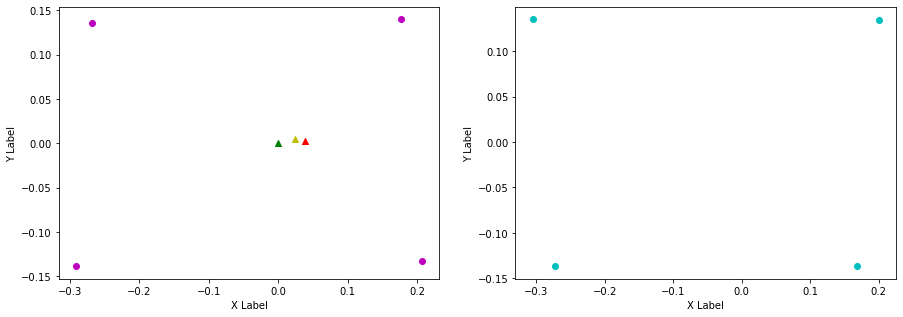

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.168, 0.198, FR (y): -0.136, -0.137.
FR displacement: 0.03, -0.0010000000000000009.

RL (x): -0.305, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.030999999999999972, 0.0050000000000000044.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.05425697]. Velocity y: [-0.01631517]. Angular -0.01148829923676804
Odom velocity x: 0.0597753938808. Odom velocity y: -0.00687177727141. Odom velocity yaw: 0.222187504654
Base displacement (Odom): [[0.020075072091381485], [-0.006036611770800997]]. Rotation displacement: 0.6831190645561651.



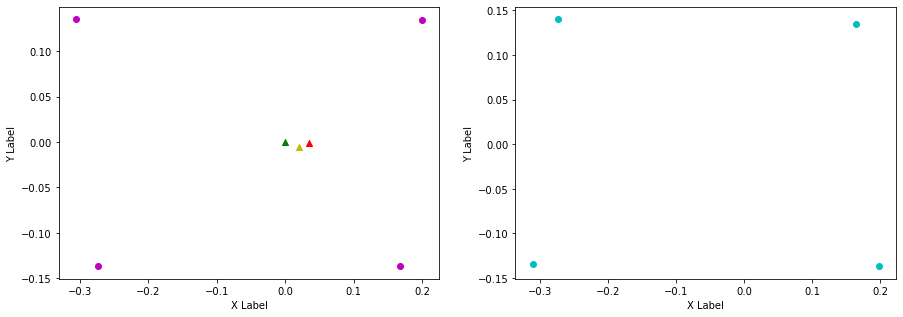

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.133.
FL displacement: 0.035, -0.0020000000000000018.

FR (x): 0.198, 0.173, FR (y): -0.137, -0.136.
FR displacement: -0.025000000000000022, 0.0010000000000000009.

RL (x): -0.274, -0.3, RL (y): 0.14, 0.136.
RL displacement: -0.025999999999999968, -0.0040000000000000036.

RR (x): -0.311, -0.273, RR (y): -0.134, -0.137.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.025000000000000022, -0.0010000000000000009].

Velocity x: [0.04477695]. Velocity y: [0.01268428]. Angular -0.005660429839220608
Odom velocity x: 0.0522261878157. Odom velocity y: 0.00259116848722. Odom velocity yaw: -0.240108605153
Base displacement (Odom): [[0.013433092639684174], [0.003805286376620625]]. Rotation displacement: -0.24354541688999748.



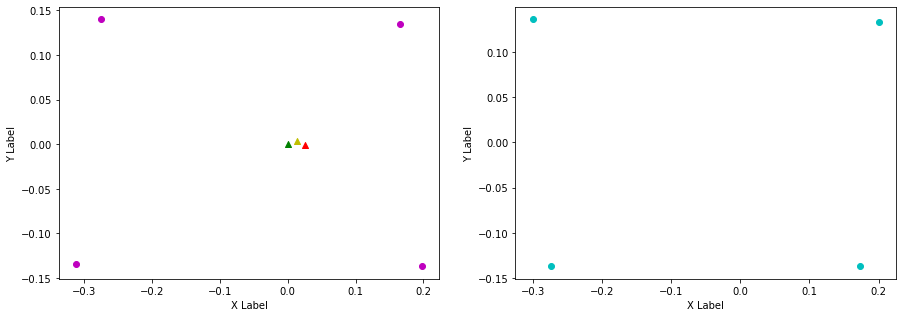

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.134.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.173, 0.197, FR (y): -0.136, -0.136.
FR displacement: 0.02400000000000002, 0.0.

RL (x): -0.3, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.025999999999999968, 0.0040000000000000036.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.1058733]. Velocity y: [-0.02539152]. Angular -0.014020665194157433
Odom velocity x: 0.0869678815418. Odom velocity y: -0.0125579602376. Odom velocity yaw: 0.237549765618
Base displacement (Odom): [[0.03599691390566939], [-0.008633114448676846]]. Rotation displacement: -0.09729568386406733.



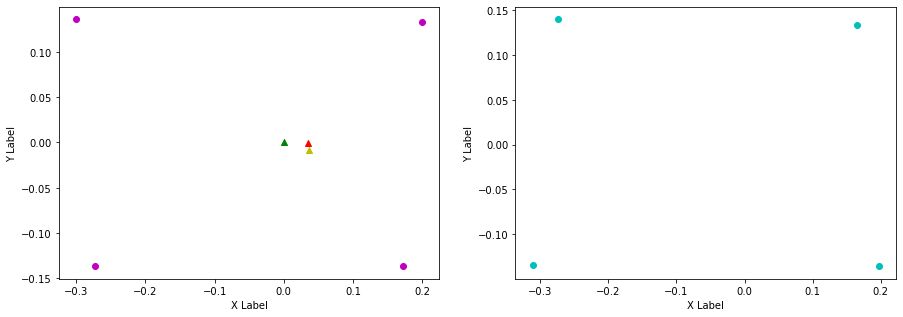

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.134, 0.135.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.197, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.139.
RR displacement: 0.03699999999999998, -0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.05660346]. Velocity y: [0.01827334]. Angular -0.013776409060183094
Odom velocity x: 0.0731693721666. Odom velocity y: 0.00264140097984. Odom velocity yaw: -0.278466606876
Base displacement (Odom): [[0.01924517094953959], [0.0062129337981568986]]. Rotation displacement: -0.2731304111910724.



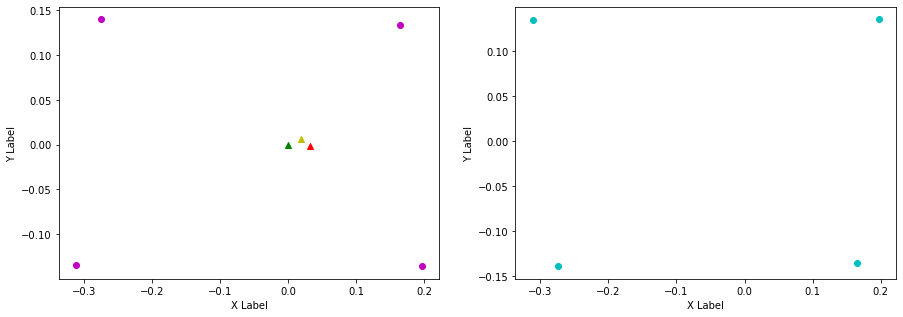

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.05276759]. Velocity y: [-0.01346344]. Angular 0.02382586645478122
Odom velocity x: 0.0639950618544. Odom velocity y: -0.005617748699. Odom velocity yaw: 0.236033011662
Base displacement (Odom): [[0.018468664506810617], [-0.004712204925047588]]. Rotation displacement: -0.2683721648893097.



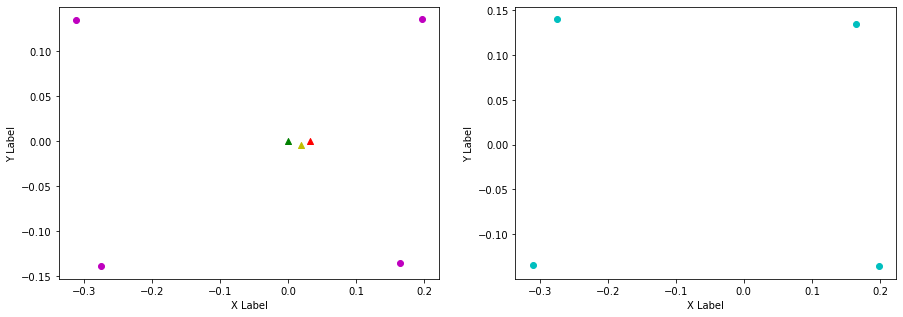

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.31, RL (y): 0.14, 0.134.
RL displacement: -0.035999999999999976, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04989649]. Velocity y: [0.00670274]. Angular -0.02907402179631735
Odom velocity x: 0.057673703916. Odom velocity y: 6.30195573393e-05. Odom velocity yaw: -0.268729507452
Base displacement (Odom): [[0.014968944519638816], [0.002010821762212414]]. Rotation displacement: 0.47779275216766126.



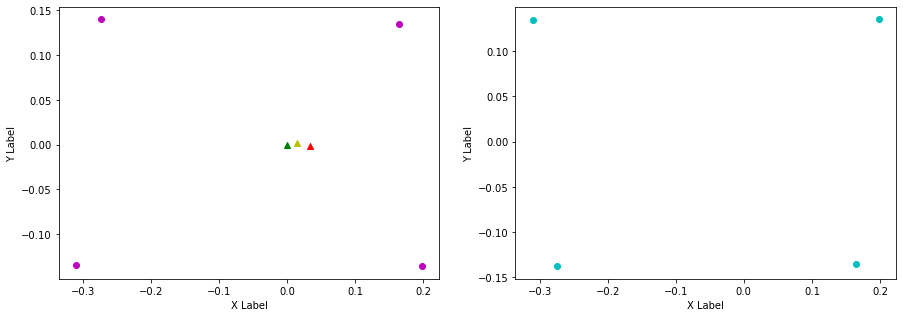

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.31, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.035999999999999976, 0.006000000000000005.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.06073913]. Velocity y: [-0.02880207]. Angular 0.005606564649872482
Odom velocity x: 0.0608676472988. Odom velocity y: -0.0153626846285. Odom velocity yaw: 0.246184915034
Base displacement (Odom): [[0.020651297691090087], [-0.009792702826963907]]. Rotation displacement: -0.49974554328767706.



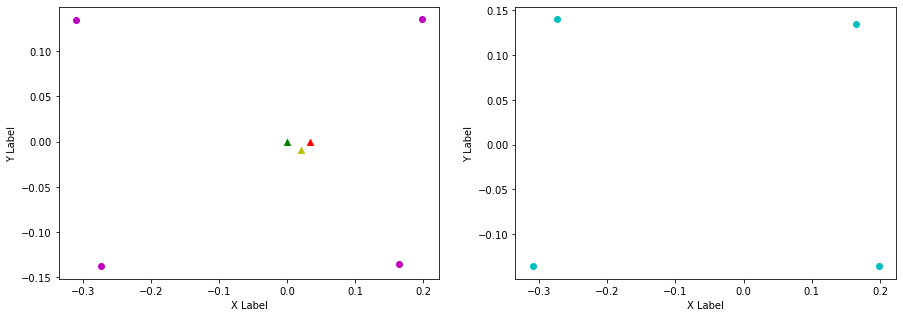

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.178, FR (y): -0.136, -0.137.
FR displacement: -0.020000000000000018, -0.0010000000000000009.

RL (x): -0.274, -0.294, RL (y): 0.14, 0.137.
RL displacement: -0.019999999999999962, -0.0030000000000000027.

RR (x): -0.309, -0.271, RR (y): -0.135, -0.137.
RR displacement: 0.03799999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0010000000000000009].

Velocity x: [0.0724013]. Velocity y: [0.03940422]. Angular 0.008547263964225149
Odom velocity x: 0.0650767767398. Odom velocity y: 0.00827049202117. Odom velocity yaw: -0.188218055582
Base displacement (Odom): [[0.01882433778704118], [0.010245097227748426]]. Rotation displacement: 0.10921901971007206.



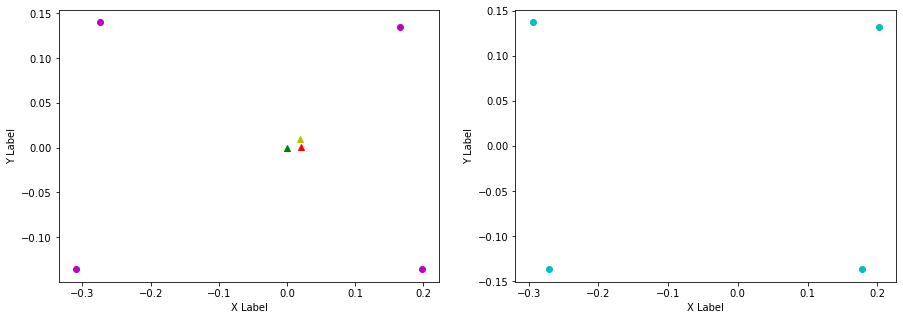

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.167, FL (y): 0.132, 0.136.
FL displacement: -0.035, 0.0040000000000000036.

FR (x): 0.178, 0.199, FR (y): -0.137, -0.135.
FR displacement: 0.02100000000000002, 0.0020000000000000018.

RL (x): -0.294, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.019999999999999962, 0.0020000000000000018.

RR (x): -0.271, -0.305, RR (y): -0.137, -0.135.
RR displacement: -0.033999999999999975, 0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0040000000000000036].

Velocity x: [0.09125173]. Velocity y: [-0.03279877]. Angular -0.05250524580864912
Odom velocity x: 0.0819615545884. Odom velocity y: -0.0119863794508. Odom velocity yaw: 0.148906204378
Base displacement (Odom): [[0.02920056868584775], [-0.010495612511937563]]. Rotation displacement: 0.12732775472857874.



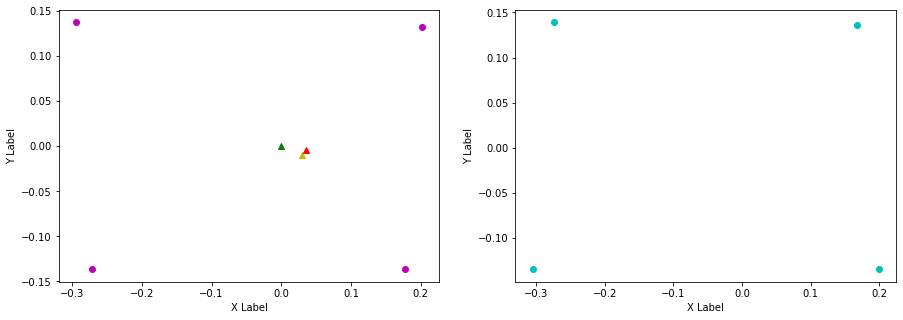

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.031, -0.0010000000000000009.

FR (x): 0.199, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.135.
RL displacement: -0.03799999999999998, -0.0040000000000000036.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.030999999999999972, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.08531007]. Velocity y: [0.02348375]. Angular -0.005479630354748841
Odom velocity x: 0.0949865083998. Odom velocity y: 0.00776355670196. Odom velocity yaw: -0.299611039839
Base displacement (Odom): [[0.034124017029207976], [0.009393496321832756]]. Rotation displacement: -0.9626657922963122.



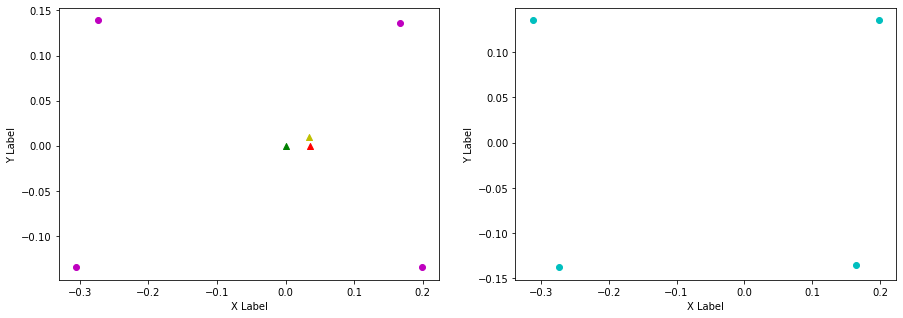

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.169, FL (y): 0.135, 0.136.
FL displacement: -0.028999999999999998, 0.0010000000000000009.

FR (x): 0.164, 0.201, FR (y): -0.135, -0.135.
FR displacement: 0.037000000000000005, 0.0.

RL (x): -0.312, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.03899999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.302, RR (y): -0.138, -0.136.
RR displacement: -0.02799999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.028999999999999998, -0.0010000000000000009].

Velocity x: [0.00877181]. Velocity y: [-0.01767152]. Angular 0.0008670686456389012
Odom velocity x: 0.0580995048392. Odom velocity y: -0.00323355241181. Odom velocity yaw: 0.218801655108
Base displacement (Odom): [[0.0026315434632623314], [-0.005301453700660645]]. Rotation displacement: -0.12558383213525878.



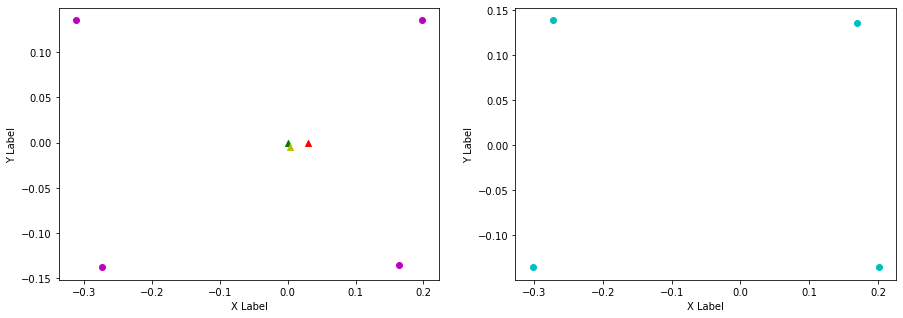

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.197, FL (y): 0.136, 0.135.
FL displacement: 0.027999999999999997, -0.0010000000000000009.

FR (x): 0.201, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.037000000000000005, 0.0.

RL (x): -0.273, -0.313, RL (y): 0.139, 0.134.
RL displacement: -0.03999999999999998, -0.0050000000000000044.

RR (x): -0.302, -0.274, RR (y): -0.136, -0.139.
RR displacement: 0.02799999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.037000000000000005, -0.0].

Velocity x: [0.05202021]. Velocity y: [0.01524803]. Angular -0.008550035491770391
Odom velocity x: 0.0531887126195. Odom velocity y: 0.0067676517877. Odom velocity yaw: -0.284755752635
Base displacement (Odom): [[0.018207080842307488], [0.005336812819167702]]. Rotation displacement: 0.014903809814072869.



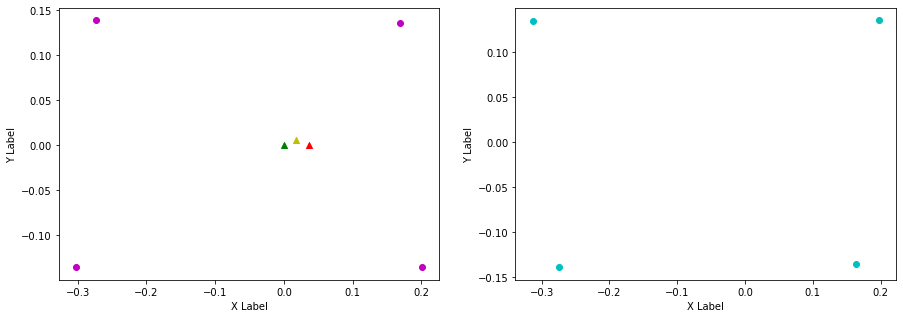

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.313, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.02930621]. Velocity y: [-0.00379534]. Angular 0.00230099024047633
Odom velocity x: 0.0387204370174. Odom velocity y: 0.00269379611203. Odom velocity yaw: 0.231315862241
Base displacement (Odom): [[0.008791860537801899], [-0.001138602240689894]]. Rotation displacement: -0.17145840200595844.



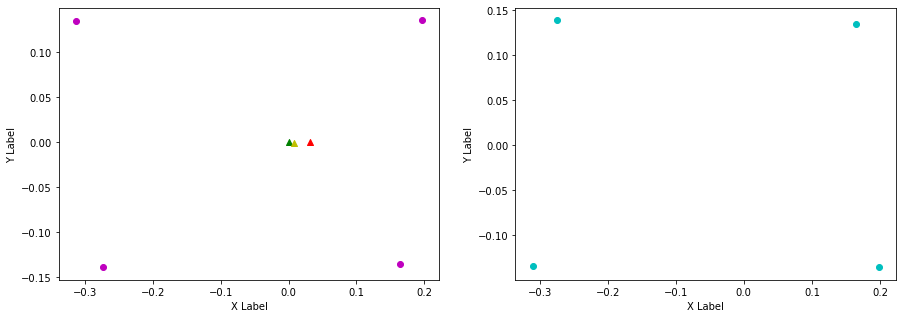

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.203, FL (y): 0.135, 0.132.
FL displacement: 0.038000000000000006, -0.0030000000000000027.

FR (x): 0.198, 0.18, FR (y): -0.136, -0.138.
FR displacement: -0.018000000000000016, -0.0020000000000000018.

RL (x): -0.274, -0.292, RL (y): 0.139, 0.138.
RL displacement: -0.01799999999999996, -0.0010000000000000009.

RR (x): -0.31, -0.271, RR (y): -0.134, -0.136.
RR displacement: 0.03899999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.018000000000000016, 0.0020000000000000018].

Velocity x: [0.07342175]. Velocity y: [0.0364171]. Angular 0.012344728326046363
Odom velocity x: 0.0567631561866. Odom velocity y: 0.0208921047245. Odom velocity yaw: -0.214521014082
Base displacement (Odom): [[0.02202652200814781], [0.010925128917899533]]. Rotation displacement: 0.03955110255754637.



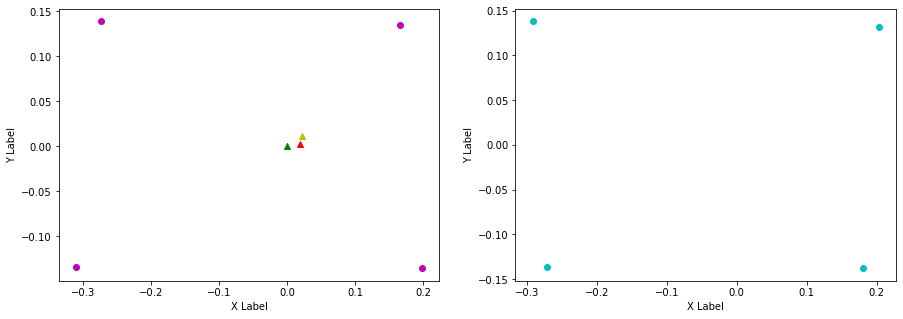

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.165, FL (y): 0.132, 0.135.
FL displacement: -0.038000000000000006, 0.0030000000000000027.

FR (x): 0.18, 0.198, FR (y): -0.138, -0.135.
FR displacement: 0.018000000000000016, 0.0030000000000000027.

RL (x): -0.292, -0.275, RL (y): 0.138, 0.139.
RL displacement: 0.01699999999999996, 0.0010000000000000009.

RR (x): -0.271, -0.308, RR (y): -0.136, -0.135.
RR displacement: -0.03699999999999998, 0.0010000000000000009.


Base displacement (Foot): [0.038000000000000006, -0.0030000000000000027].

Velocity x: [0.04871541]. Velocity y: [-0.01134854]. Angular -0.03201083605113762
Odom velocity x: 0.0544909184874. Odom velocity y: 0.00587859181186. Odom velocity yaw: 0.220436252537
Base displacement (Odom): [[0.016076080081809607], [-0.0037450175199252936]]. Rotation displacement: 0.21219021596868437.



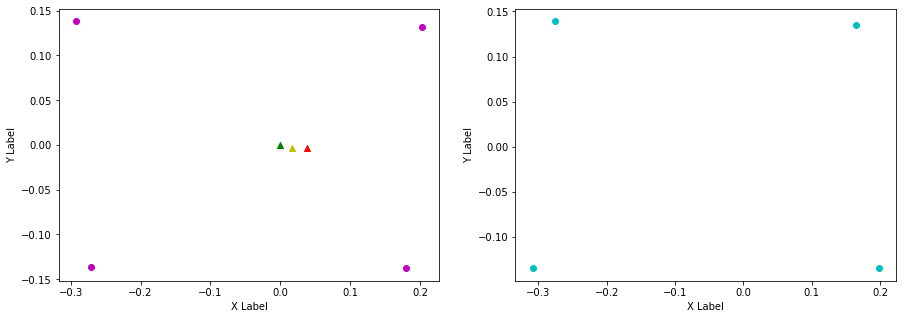

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.203, FL (y): 0.135, 0.132.
FL displacement: 0.038000000000000006, -0.0030000000000000027.

FR (x): 0.198, 0.178, FR (y): -0.135, -0.137.
FR displacement: -0.020000000000000018, -0.0020000000000000018.

RL (x): -0.275, -0.294, RL (y): 0.139, 0.136.
RL displacement: -0.01899999999999996, -0.0030000000000000027.

RR (x): -0.308, -0.271, RR (y): -0.135, -0.137.
RR displacement: 0.03699999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0020000000000000018].

Velocity x: [0.07903214]. Velocity y: [0.02176749]. Angular 0.0157867273773927
Odom velocity x: 0.0699340435286. Odom velocity y: 0.0152094669957. Odom velocity yaw: -0.232785682741
Base displacement (Odom): [[0.025290297400588968], [0.006965599707043815]]. Rotation displacement: -0.6052481755274426.



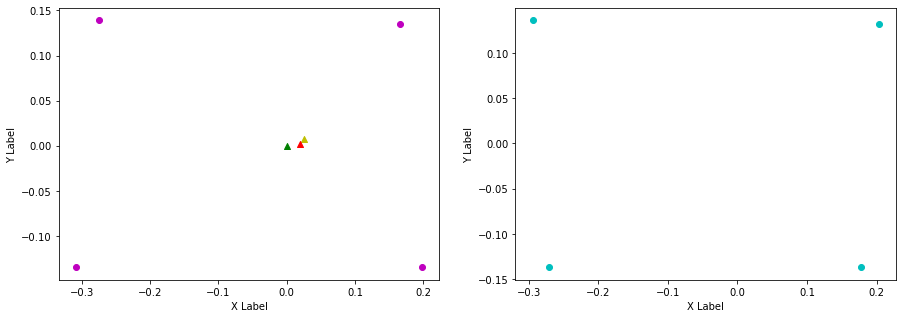

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.035, 0.0040000000000000036.

FR (x): 0.178, 0.2, FR (y): -0.137, -0.135.
FR displacement: 0.02200000000000002, 0.0020000000000000018.

RL (x): -0.294, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.020999999999999963, 0.0030000000000000027.

RR (x): -0.271, -0.304, RR (y): -0.137, -0.136.
RR displacement: -0.032999999999999974, 0.0010000000000000009.


Base displacement (Foot): [0.035, -0.0040000000000000036].

Velocity x: [0.05752575]. Velocity y: [-0.0105877]. Angular -0.03787132838248895
Odom velocity x: 0.0643829729785. Odom velocity y: 0.00354628885472. Odom velocity yaw: 0.182912570177
Base displacement (Odom): [[0.018983494040473725], [-0.0034939392047439594]]. Rotation displacement: 0.2894442676053559.



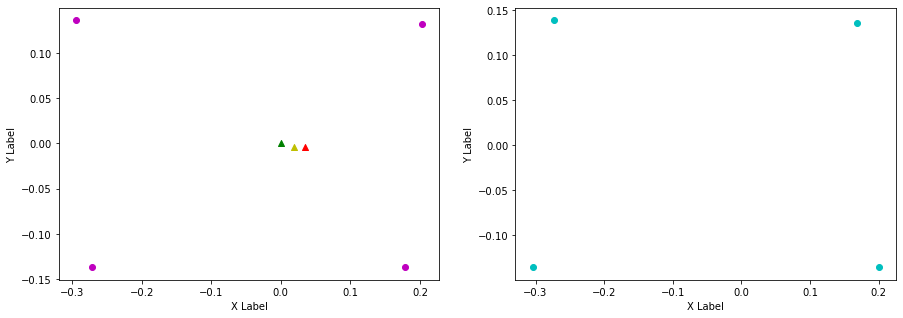

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.031, -0.0020000000000000018.

FR (x): 0.2, 0.166, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.273, -0.309, RL (y): 0.139, 0.135.
RL displacement: -0.035999999999999976, -0.0040000000000000036.

RR (x): -0.304, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02999999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.08771736]. Velocity y: [0.00910483]. Angular 0.012321302809471163
Odom velocity x: 0.0791550812307. Odom velocity y: 0.00674195581458. Odom velocity yaw: -0.246161743469
Base displacement (Odom): [[0.02982389487866055], [0.003095640137314254]]. Rotation displacement: -0.7160560371395701.



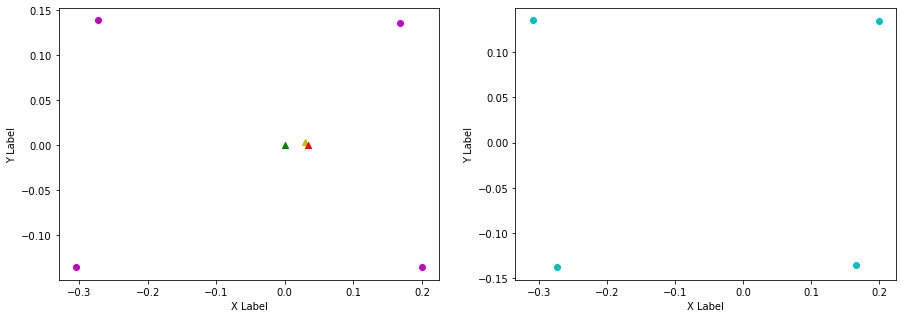

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.166, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.309, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.034999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04100531]. Velocity y: [-0.01175969]. Angular -0.00761585935394761
Odom velocity x: 0.0617396817828. Odom velocity y: -0.00299924022616. Odom velocity yaw: 0.24069033271
Base displacement (Odom): [[0.014351864374022028], [-0.004115893287932812]]. Rotation displacement: 0.2400258800961128.



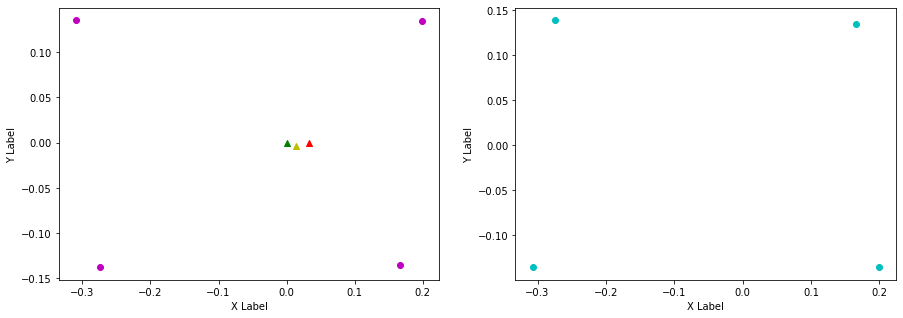

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.201, FL (y): 0.135, 0.132.
FL displacement: 0.035, -0.0030000000000000027.

FR (x): 0.199, 0.174, FR (y): -0.136, -0.137.
FR displacement: -0.025000000000000022, -0.0010000000000000009.

RL (x): -0.274, -0.298, RL (y): 0.139, 0.137.
RL displacement: -0.023999999999999966, -0.0020000000000000018.

RR (x): -0.307, -0.272, RR (y): -0.135, -0.137.
RR displacement: 0.034999999999999976, -0.0020000000000000018.


Base displacement (Foot): [0.025000000000000022, 0.0010000000000000009].

Velocity x: [0.11293951]. Velocity y: [0.03668239]. Angular 0.002577782160112299
Odom velocity x: 0.0878376034814. Odom velocity y: 0.0162396539868. Odom velocity yaw: -0.243967251348
Base displacement (Odom): [[0.032752453044405994], [0.010637892323994959]]. Rotation displacement: -0.15272487184256184.



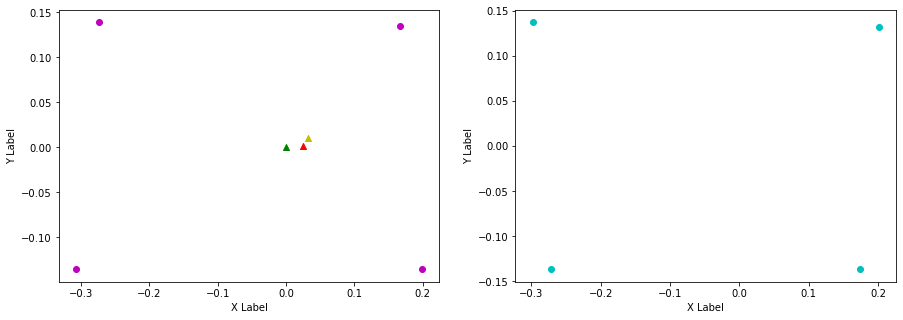

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.033, 0.0040000000000000036.

FR (x): 0.174, 0.2, FR (y): -0.137, -0.135.
FR displacement: 0.026000000000000023, 0.0020000000000000018.

RL (x): -0.298, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.023999999999999966, 0.0020000000000000018.

RR (x): -0.272, -0.303, RR (y): -0.137, -0.135.
RR displacement: -0.030999999999999972, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0040000000000000036].

Velocity x: [0.08277668]. Velocity y: [-0.02299788]. Angular -0.022158867322381346
Odom velocity x: 0.0952040010658. Odom velocity y: -0.00387598850756. Odom velocity yaw: 0.228310901539
Base displacement (Odom): [[0.02897182910058227], [-0.008049254956833923]]. Rotation displacement: 0.04283184546662316.



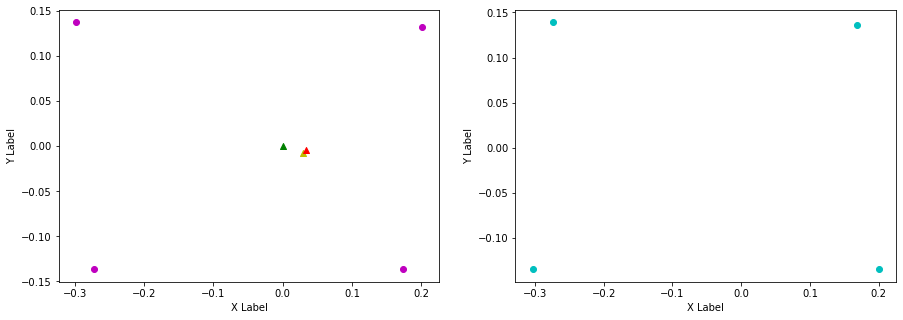

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.199, FL (y): 0.136, 0.133.
FL displacement: 0.031, -0.0030000000000000027.

FR (x): 0.2, 0.167, FR (y): -0.135, -0.136.
FR displacement: -0.033, -0.0010000000000000009.

RL (x): -0.274, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.032999999999999974, -0.0040000000000000036.

RR (x): -0.303, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.02899999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.033, 0.0010000000000000009].

Velocity x: [0.08692383]. Velocity y: [0.02730777]. Angular -0.013295450098338036
Odom velocity x: 0.0979516004289. Odom velocity y: 0.0120274333051. Odom velocity yaw: -0.291987517576
Base displacement (Odom): [[0.030423353324244284], [0.009557721909237447]]. Rotation displacement: -0.4443632306475777.



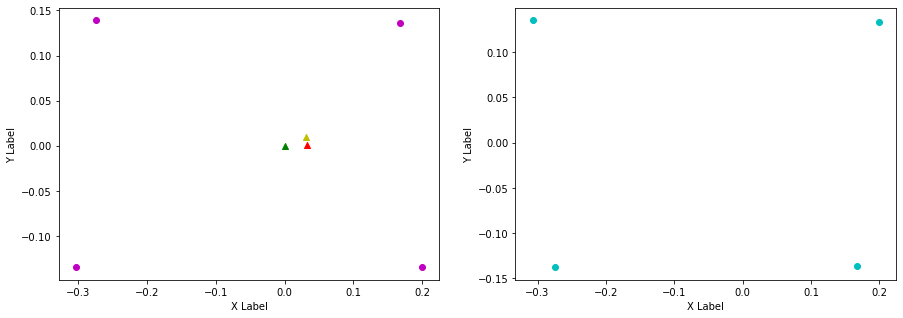

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.133, 0.136.
FL displacement: -0.033, 0.0030000000000000027.

FR (x): 0.167, 0.199, FR (y): -0.136, -0.136.
FR displacement: 0.032, 0.0.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.032999999999999974, 0.0040000000000000036.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0030000000000000027].

Velocity x: [0.03571856]. Velocity y: [-0.00952432]. Angular -0.006047002585963462
Odom velocity x: 0.0704471114223. Odom velocity y: 0.00323288508071. Odom velocity yaw: 0.210543507223
Base displacement (Odom): [[0.010715565458231047], [-0.0028572944142647716]]. Rotation displacement: -0.2666207210490748.



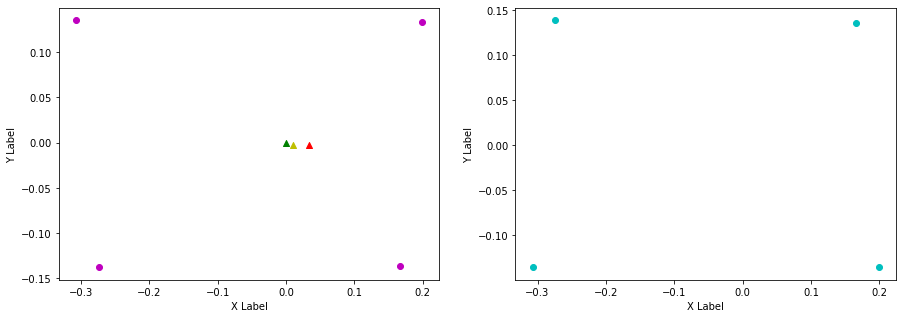

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.2, FL (y): 0.136, 0.133.
FL displacement: 0.034, -0.0030000000000000027.

FR (x): 0.199, 0.17, FR (y): -0.136, -0.136.
FR displacement: -0.028999999999999998, 0.0.

RL (x): -0.274, -0.304, RL (y): 0.139, 0.136.
RL displacement: -0.02999999999999997, -0.0030000000000000027.

RR (x): -0.307, -0.273, RR (y): -0.135, -0.137.
RR displacement: 0.033999999999999975, -0.0020000000000000018.


Base displacement (Foot): [0.028999999999999998, -0.0].

Velocity x: [0.05138737]. Velocity y: [0.01411012]. Angular -0.01849297079165749
Odom velocity x: 0.0594969657591. Odom velocity y: 0.00874829541756. Odom velocity yaw: -0.290024209927
Base displacement (Odom): [[0.017471702585428073], [0.004797441089999091]]. Rotation displacement: -0.10394030154325172.



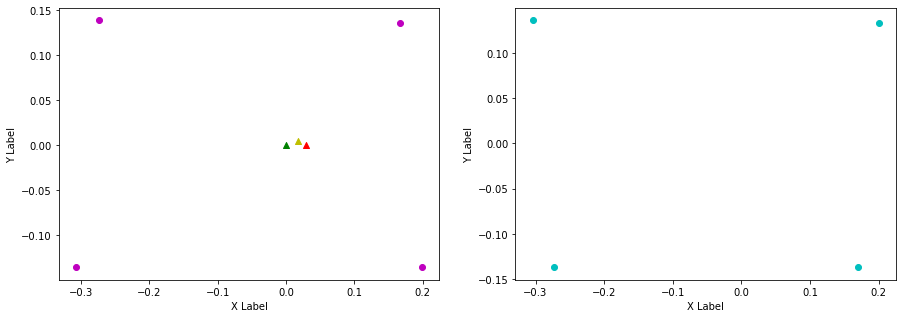

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.035, 0.0020000000000000018.

FR (x): 0.17, 0.197, FR (y): -0.136, -0.136.
FR displacement: 0.026999999999999996, 0.0.

RL (x): -0.304, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.02999999999999997, 0.0040000000000000036.

RR (x): -0.273, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.03699999999999998, 0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0020000000000000018].

Velocity x: [0.05277983]. Velocity y: [-0.01243883]. Angular 0.03782275514279512
Odom velocity x: 0.0554987643529. Odom velocity y: -0.00212123547404. Odom velocity yaw: 0.238375676902
Base displacement (Odom): [[0.018472948482064933], [-0.00435359319125625]]. Rotation displacement: -0.3602534292434789.



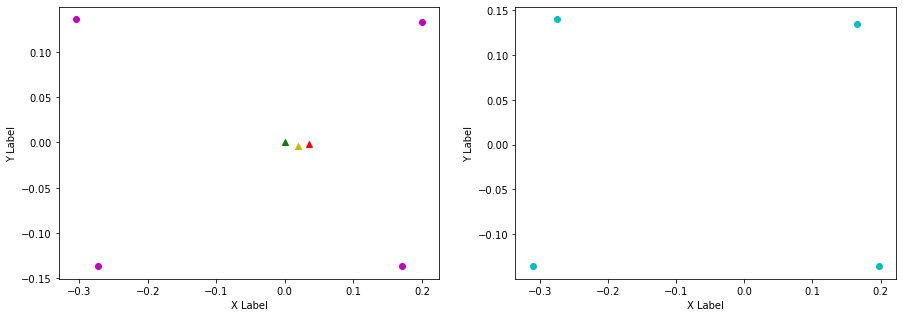

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.08468254]. Velocity y: [0.02524771]. Angular -0.050359846048232286
Odom velocity x: 0.0696243325876. Odom velocity y: 0.0109840177806. Odom velocity yaw: -0.289904483323
Base displacement (Odom): [[0.025404757128068667], [0.007574312491184787]]. Rotation displacement: 0.7584797937374985.



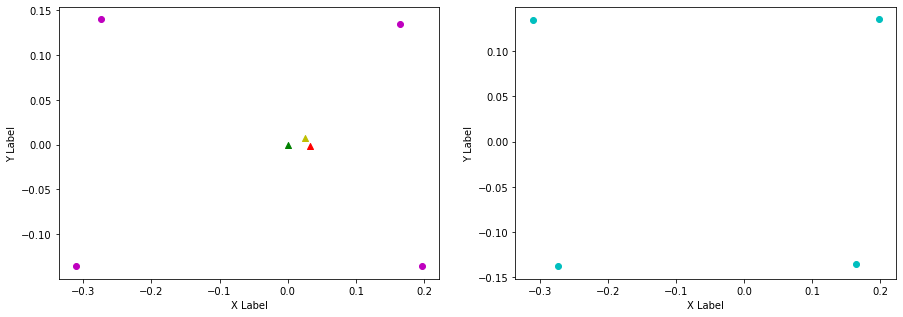

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.035, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.06586179]. Velocity y: [-0.00886826]. Angular 0.022476918460349587
Odom velocity x: 0.0697350242631. Odom velocity y: 0.0013201208071. Odom velocity yaw: 0.229564703946
Base displacement (Odom): [[0.021734384983260968], [-0.002926526462158782]]. Rotation displacement: -0.8656218530607762.



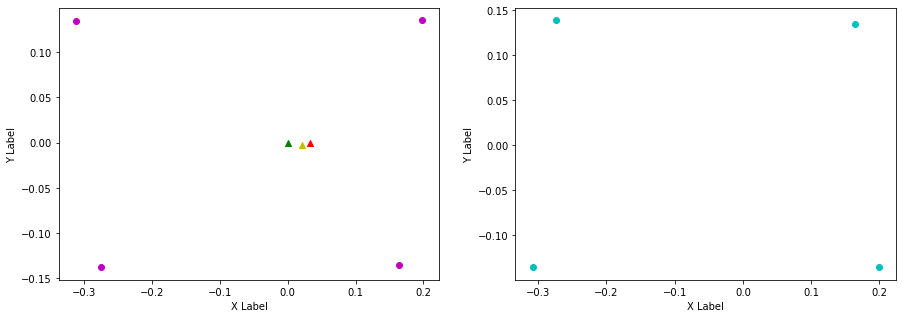

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.199, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.035, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.03488148]. Velocity y: [0.00416612]. Angular -0.04727279434102545
Odom velocity x: 0.0513407350569. Odom velocity y: 0.00186213909052. Odom velocity yaw: -0.268896640676
Base displacement (Odom): [[0.010813255599321892], [0.0012914965176243631]]. Rotation displacement: 0.4249846479446203.



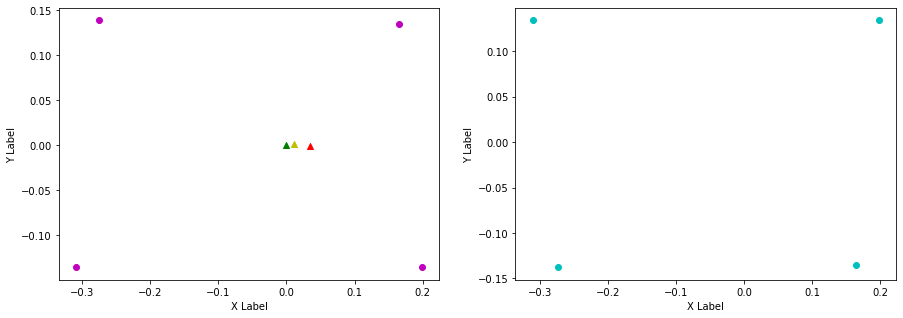

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.09308614]. Velocity y: [-0.01586642]. Angular 0.002724625798070931
Odom velocity x: 0.0750890798339. Odom velocity y: -0.00737843844059. Odom velocity yaw: 0.20601501668
Base displacement (Odom): [[0.027925860431962768], [-0.00475993010662705]]. Rotation displacement: -0.8396446414910894.



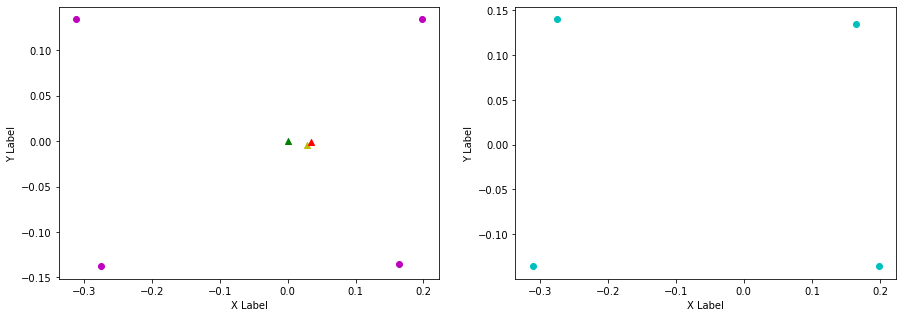

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.201, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.174, FR (y): -0.136, -0.137.
FR displacement: -0.02400000000000002, -0.0010000000000000009.

RL (x): -0.274, -0.298, RL (y): 0.14, 0.136.
RL displacement: -0.023999999999999966, -0.0040000000000000036.

RR (x): -0.31, -0.273, RR (y): -0.135, -0.137.
RR displacement: 0.03699999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.02400000000000002, 0.0010000000000000009].

Velocity x: [0.07524341]. Velocity y: [0.02763599]. Angular 0.005287251903441434
Odom velocity x: 0.0794239796499. Odom velocity y: 0.0115576545365. Odom velocity yaw: -0.257122380289
Base displacement (Odom): [[0.02483032004193486], [0.009119873919154475]]. Rotation displacement: 0.0468328974701138.



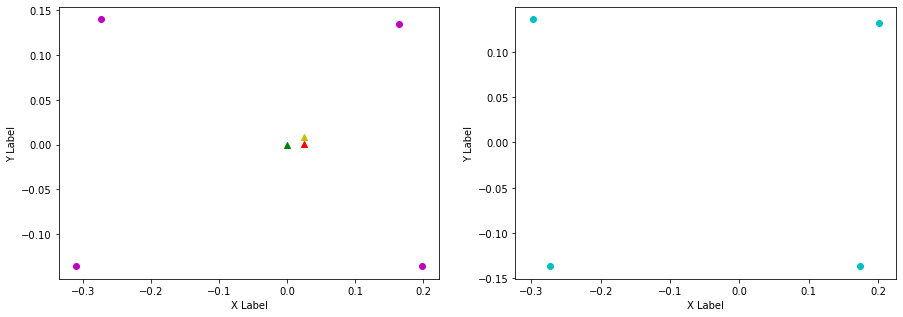

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.165, FL (y): 0.132, 0.135.
FL displacement: -0.036000000000000004, 0.0030000000000000027.

FR (x): 0.174, 0.197, FR (y): -0.137, -0.136.
FR displacement: 0.02300000000000002, 0.0010000000000000009.

RL (x): -0.298, -0.275, RL (y): 0.136, 0.14.
RL displacement: 0.022999999999999965, 0.0040000000000000036.

RR (x): -0.273, -0.31, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.036000000000000004, -0.0030000000000000027].

Velocity x: [0.04095312]. Velocity y: [-0.01069559]. Angular 0.017994246695539264
Odom velocity x: 0.0575456662686. Odom velocity y: -0.000604966826803. Odom velocity yaw: 0.239507866068
Base displacement (Odom): [[0.015562189513890656], [-0.004064325272249966]]. Rotation displacement: 0.0999692592533271.



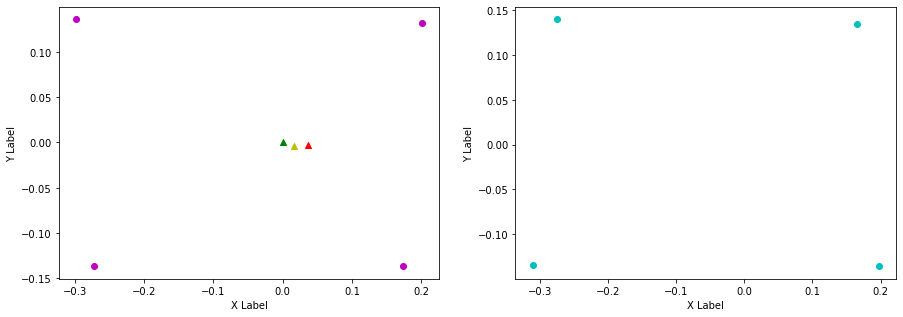

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.197, 0.167, FR (y): -0.136, -0.135.
FR displacement: -0.03, 0.0010000000000000009.

RL (x): -0.275, -0.307, RL (y): 0.14, 0.135.
RL displacement: -0.03199999999999997, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.07490361]. Velocity y: [0.02024225]. Angular -0.03461895817554717
Odom velocity x: 0.0682497338833. Odom velocity y: 0.00932360847092. Odom velocity yaw: -0.231115418902
Base displacement (Odom): [[0.020223973651727345], [0.005465406935128453]]. Rotation displacement: 0.3917779866331631.



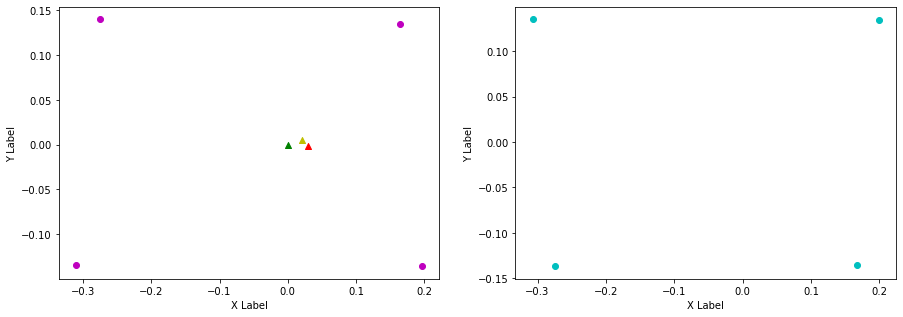

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.167, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.03, -0.0020000000000000018.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.141.
RL displacement: 0.032999999999999974, 0.005999999999999978.

RR (x): -0.274, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04271403]. Velocity y: [-0.00497244]. Angular -0.012544719724891242
Odom velocity x: 0.0540220862445. Odom velocity y: 0.00282831882768. Odom velocity yaw: 0.242644748011
Base displacement (Odom): [[0.014095625091296249], [-0.0016409032211371077]]. Rotation displacement: -0.5355504147090225.



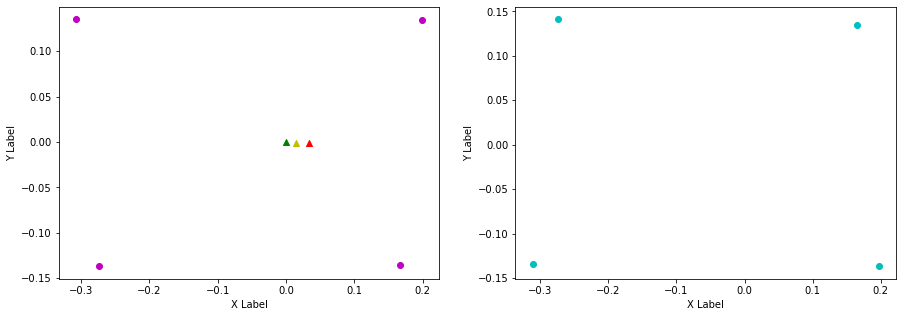

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.136.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.274, -0.313, RL (y): 0.141, 0.134.
RL displacement: -0.03899999999999998, -0.0069999999999999785.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.139.
RR displacement: 0.03699999999999998, -0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.03229637]. Velocity y: [0.01809828]. Angular -0.028233730591879825
Odom velocity x: 0.0439203380249. Odom velocity y: 0.0119542101176. Odom velocity yaw: -0.274669364309
Base displacement (Odom): [[0.011626689234829124], [0.006515378771123903]]. Rotation displacement: -0.23719057864856086.



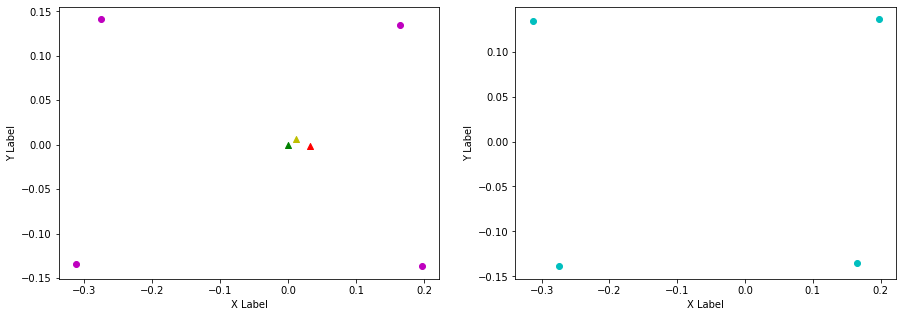

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.17, FL (y): 0.136, 0.136.
FL displacement: -0.026999999999999996, 0.0.

FR (x): 0.165, 0.201, FR (y): -0.135, -0.134.
FR displacement: 0.036000000000000004, 0.0010000000000000009.

RL (x): -0.313, -0.273, RL (y): 0.134, 0.139.
RL displacement: 0.03999999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.3, RR (y): -0.139, -0.136.
RR displacement: -0.025999999999999968, 0.0030000000000000027.


Base displacement (Foot): [0.026999999999999996, -0.0].

Velocity x: [0.05085476]. Velocity y: [-0.0104257]. Angular -0.0280000995567401
Odom velocity x: 0.0454322250946. Odom velocity y: 0.00197805295713. Odom velocity yaw: 0.128914327714
Base displacement (Odom): [[0.012713690770816966], [-0.002606425234131543]]. Rotation displacement: -0.5823623273159666.



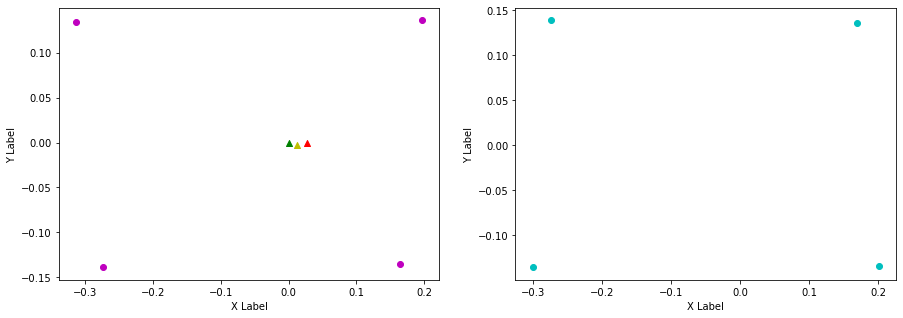

Command:  [0.1 0. ] 0.0
Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.168, FL (y): 0.135, 0.136.
FL displacement: -0.03, 0.0010000000000000009.

FR (x): 0.164, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.036000000000000004, 0.0.

RL (x): -0.312, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03799999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.303, RR (y): -0.139, -0.136.
RR displacement: -0.02899999999999997, 0.0030000000000000027.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.04189549]. Velocity y: [-0.01264023]. Angular 0.019073489689925394
Odom velocity x: 0.058332815755. Odom velocity y: 0.00205110014928. Odom velocity yaw: 0.183615668545
Base displacement (Odom): [[0.010473872906276993], [-0.0031600564327577407]]. Rotation displacement: -0.7023361815414888.



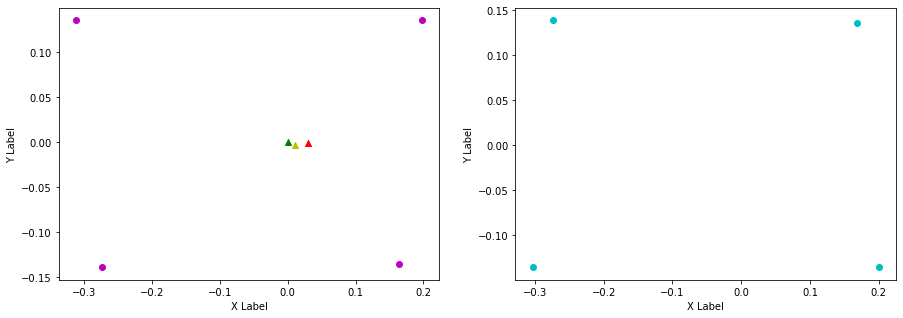

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.2, FL (y): 0.136, 0.133.
FL displacement: 0.032, -0.0030000000000000027.

FR (x): 0.2, 0.17, FR (y): -0.135, -0.136.
FR displacement: -0.03, -0.0010000000000000009.

RL (x): -0.274, -0.303, RL (y): 0.139, 0.136.
RL displacement: -0.02899999999999997, -0.0030000000000000027.

RR (x): -0.303, -0.273, RR (y): -0.136, -0.137.
RR displacement: 0.02999999999999997, -0.0010000000000000009.


Base displacement (Foot): [0.03, 0.0010000000000000009].

Velocity x: [0.07239524]. Velocity y: [0.02568283]. Angular 0.013040020883056565
Odom velocity x: 0.0699549680174. Odom velocity y: 0.0160634730004. Odom velocity yaw: -0.260998858566
Base displacement (Odom): [[0.02606227724802479], [0.00924581455958079]]. Rotation displacement: 0.2732076149547536.



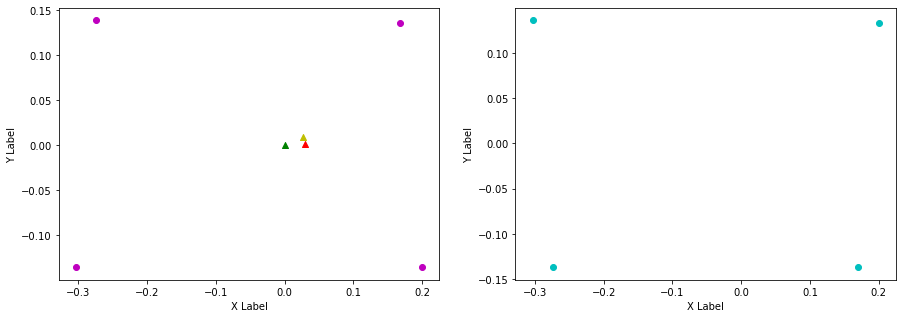

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.167, FL (y): 0.133, 0.135.
FL displacement: -0.033, 0.0020000000000000018.

FR (x): 0.17, 0.199, FR (y): -0.136, -0.135.
FR displacement: 0.028999999999999998, 0.0010000000000000009.

RL (x): -0.303, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.02999999999999997, 0.0030000000000000027.

RR (x): -0.273, -0.305, RR (y): -0.137, -0.135.
RR displacement: -0.03199999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.0786337]. Velocity y: [-0.01912714]. Angular -0.023027482470690475
Odom velocity x: 0.0757146768752. Odom velocity y: -0.000677096063611. Odom velocity yaw: 0.205717694307
Base displacement (Odom): [[0.023590124152672143], [-0.005738146223266738]]. Rotation displacement: 0.268969659712263.



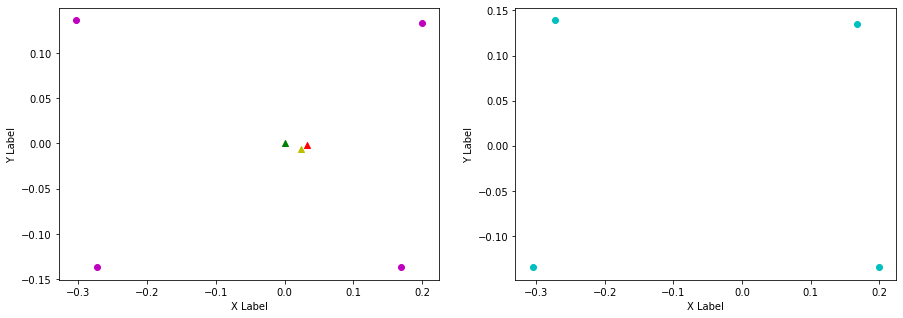

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.2, FL (y): 0.135, 0.133.
FL displacement: 0.033, -0.0020000000000000018.

FR (x): 0.199, 0.168, FR (y): -0.135, -0.136.
FR displacement: -0.031, -0.0010000000000000009.

RL (x): -0.273, -0.305, RL (y): 0.139, 0.135.
RL displacement: -0.03199999999999997, -0.0040000000000000036.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.030999999999999972, -0.0020000000000000018.


Base displacement (Foot): [0.031, 0.0010000000000000009].

Velocity x: [0.06726303]. Velocity y: [0.01903657]. Angular -0.015272256908744532
Odom velocity x: 0.0743534208753. Odom velocity y: 0.00972571520728. Odom velocity yaw: -0.288790930529
Base displacement (Odom): [[0.024214685216573884], [0.006853163633700088]]. Rotation displacement: -0.3958135191659131.



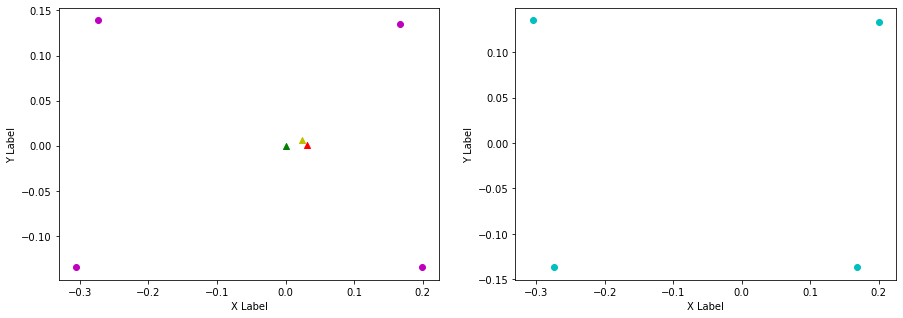

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.175, FL (y): 0.133, 0.139.
FL displacement: -0.025000000000000022, 0.006000000000000005.

FR (x): 0.168, 0.205, FR (y): -0.136, -0.134.
FR displacement: 0.03699999999999998, 0.0020000000000000018.

RL (x): -0.305, -0.27, RL (y): 0.135, 0.137.
RL displacement: 0.034999999999999976, 0.0020000000000000018.

RR (x): -0.274, -0.293, RR (y): -0.137, -0.138.
RR displacement: -0.01899999999999996, -0.0010000000000000009.


Base displacement (Foot): [0.025000000000000022, -0.006000000000000005].

Velocity x: [0.02794113]. Velocity y: [-0.00899861]. Angular -0.0035441400378208574
Odom velocity x: 0.0531945645539. Odom velocity y: 0.00211330407324. Odom velocity yaw: 0.181018532329
Base displacement (Odom): [[0.008102925790555826], [-0.0026095961663417655]]. Rotation displacement: -0.3150128194288917.



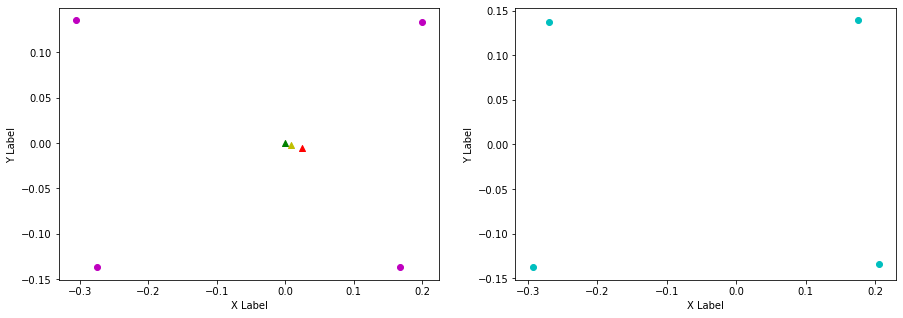

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.175, 0.198, FL (y): 0.139, 0.135.
FL displacement: 0.02300000000000002, -0.0040000000000000036.

FR (x): 0.205, 0.164, FR (y): -0.134, -0.135.
FR displacement: -0.04099999999999998, -0.0010000000000000009.

RL (x): -0.27, -0.312, RL (y): 0.137, 0.134.
RL displacement: -0.04199999999999998, -0.0030000000000000027.

RR (x): -0.293, -0.274, RR (y): -0.138, -0.138.
RR displacement: 0.01899999999999996, 0.0.


Base displacement (Foot): [0.04099999999999998, 0.0010000000000000009].

Velocity x: [0.05458611]. Velocity y: [0.01287515]. Angular 0.020546316631947937
Odom velocity x: 0.0512792669632. Odom velocity y: 0.00699965007924. Odom velocity yaw: -0.201364161458
Base displacement (Odom): [[0.016921705517864094], [0.003991298487782069]]. Rotation displacement: -0.05888862944314961.



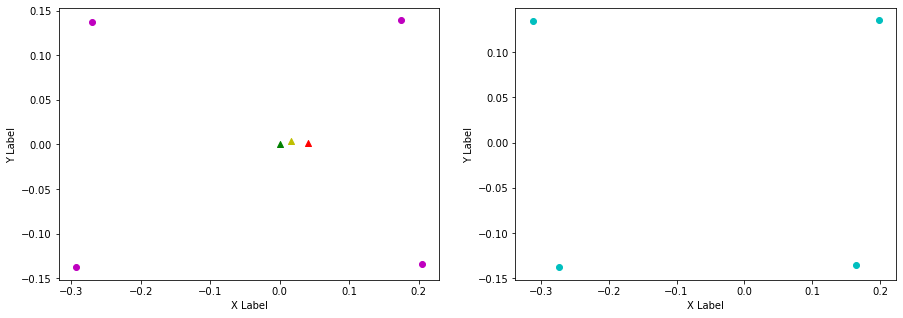

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.168, FL (y): 0.135, 0.136.
FL displacement: -0.03, 0.0010000000000000009.

FR (x): 0.164, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.036000000000000004, 0.0.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.05181228]. Velocity y: [-0.01370636]. Angular -0.010404719769168926
Odom velocity x: 0.0535981177348. Odom velocity y: -0.00471713286814. Odom velocity yaw: 0.227508391507
Base displacement (Odom): [[0.019170537495794004], [-0.005071353274528068]]. Rotation displacement: 0.3649375538500689.



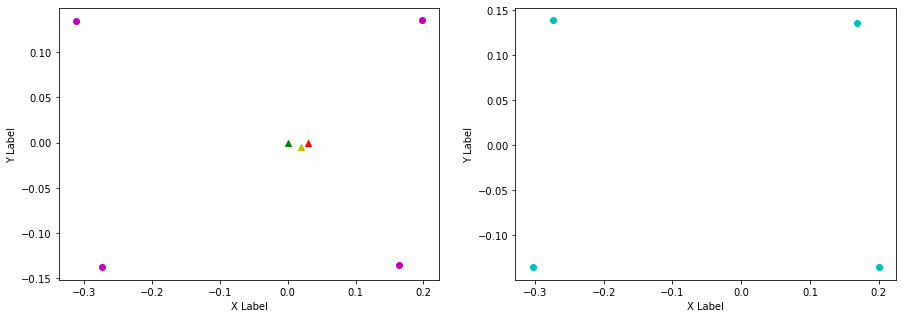

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.2, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.036000000000000004, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.135.
RL displacement: -0.03799999999999998, -0.0040000000000000036.

RR (x): -0.303, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02899999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0].

Velocity x: [0.06673672]. Velocity y: [0.02525662]. Angular -0.03003579064234999
Odom velocity x: 0.0611261824478. Odom velocity y: 0.0110506589013. Odom velocity yaw: -0.286137202708
Base displacement (Odom): [[0.023357845242440334], [0.008839814307570693]]. Rotation displacement: -0.22057414779863718.



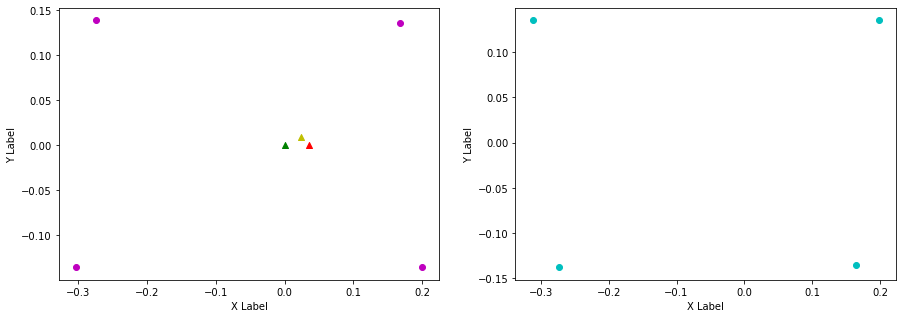

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03799999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.02441733]. Velocity y: [-0.00555358]. Angular 0.012203497396973356
Odom velocity x: 0.0424929417099. Odom velocity y: 0.00391248197838. Odom velocity yaw: 0.220616151834
Base displacement (Odom): [[0.00732520404203707], [-0.0016660740944047514]]. Rotation displacement: -0.6023232492307096.



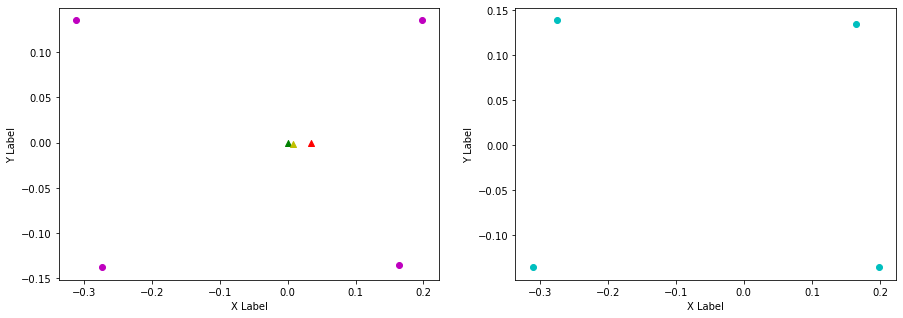

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.203, FL (y): 0.135, 0.132.
FL displacement: 0.03900000000000001, -0.0030000000000000027.

FR (x): 0.198, 0.179, FR (y): -0.136, -0.138.
FR displacement: -0.019000000000000017, -0.0020000000000000018.

RL (x): -0.274, -0.292, RL (y): 0.139, 0.137.
RL displacement: -0.01799999999999996, -0.0020000000000000018.

RR (x): -0.31, -0.271, RR (y): -0.135, -0.137.
RR displacement: 0.03899999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.019000000000000017, 0.0020000000000000018].

Velocity x: [0.10670488]. Velocity y: [0.03657296]. Angular 0.0188454442338756
Odom velocity x: 0.0775968745861. Odom velocity y: 0.021903816318. Odom velocity yaw: -0.206925518523
Base displacement (Odom): [[0.0320114586300726], [0.010971885078079724]]. Rotation displacement: 0.20976280220715104.



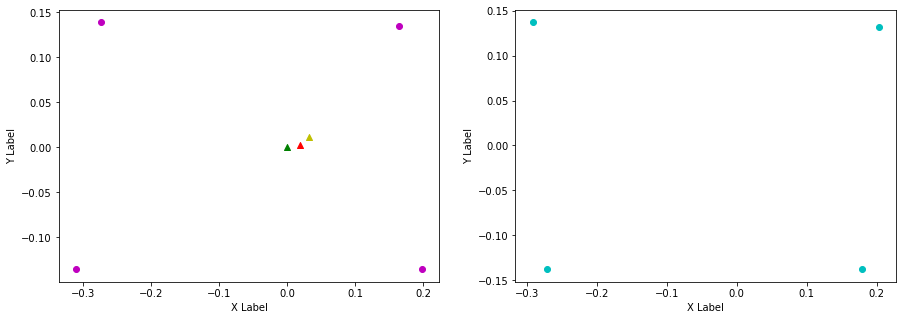

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.172, FL (y): 0.132, 0.137.
FL displacement: -0.031000000000000028, 0.0050000000000000044.

FR (x): 0.179, 0.202, FR (y): -0.138, -0.134.
FR displacement: 0.02300000000000002, 0.0040000000000000036.

RL (x): -0.292, -0.272, RL (y): 0.137, 0.138.
RL displacement: 0.019999999999999962, 0.0010000000000000009.

RR (x): -0.271, -0.296, RR (y): -0.137, -0.137.
RR displacement: -0.024999999999999967, 0.0.


Base displacement (Foot): [0.031000000000000028, -0.0050000000000000044].

Velocity x: [0.0604963]. Velocity y: [-0.01577152]. Angular -0.03741567228014523
Odom velocity x: 0.0707804865464. Odom velocity y: 0.00313750545361. Odom velocity yaw: 0.203344799151
Base displacement (Odom): [[0.020568736367087004], [-0.005362316360356945]]. Rotation displacement: 0.32392927380788783.



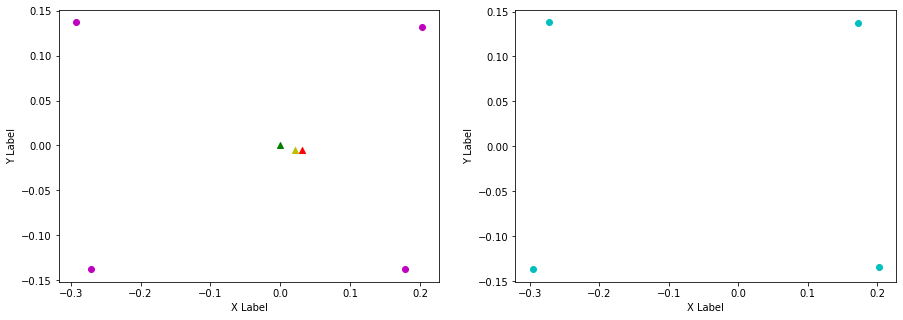

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.027000000000000024, -0.0030000000000000027.

FR (x): 0.202, 0.166, FR (y): -0.134, -0.135.
FR displacement: -0.036000000000000004, -0.0010000000000000009.

RL (x): -0.272, -0.308, RL (y): 0.138, 0.135.
RL displacement: -0.035999999999999976, -0.0030000000000000027.

RR (x): -0.296, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.021999999999999964, -0.0010000000000000009.


Base displacement (Foot): [0.036000000000000004, 0.0010000000000000009].

Velocity x: [0.09056233]. Velocity y: [0.02311483]. Angular -0.00021283063675407133
Odom velocity x: 0.089439354503. Odom velocity y: 0.0147544975058. Odom velocity yaw: -0.26611243452
Base displacement (Odom): [[0.0316968288441164], [0.008090193601030637]]. Rotation displacement: -0.728878253160556.



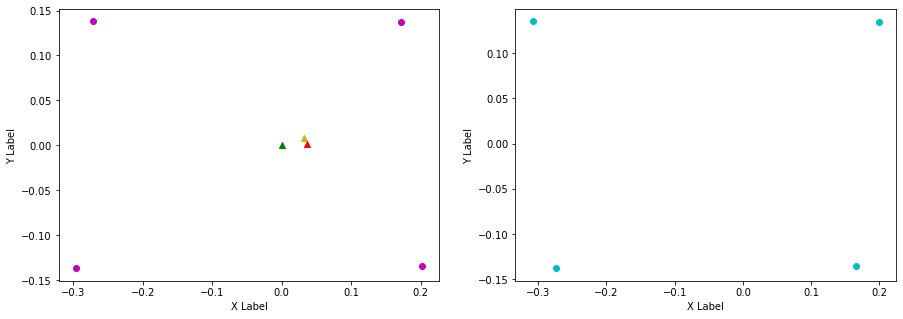

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.172, FL (y): 0.134, 0.137.
FL displacement: -0.027000000000000024, 0.0030000000000000027.

FR (x): 0.166, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.036000000000000004, 0.0010000000000000009.

RL (x): -0.308, -0.272, RL (y): 0.135, 0.138.
RL displacement: 0.035999999999999976, 0.0030000000000000027.

RR (x): -0.274, -0.296, RR (y): -0.138, -0.137.
RR displacement: -0.021999999999999964, 0.0010000000000000009.


Base displacement (Foot): [0.027000000000000024, -0.0030000000000000027].

Velocity x: [0.06118935]. Velocity y: [-0.0171637]. Angular -0.005361057249571165
Odom velocity x: 0.0735255782239. Odom velocity y: -0.000638311590588. Odom velocity yaw: 0.219831457976
Base displacement (Odom): [[0.017744909426193223], [-0.004977471122810162]]. Rotation displacement: -0.004268005777389777.



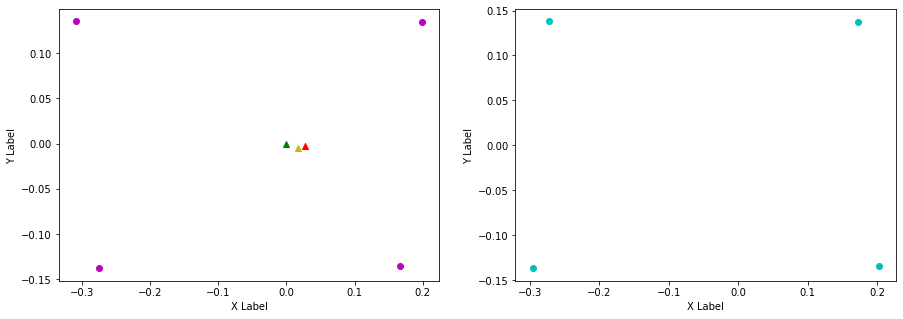

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.198, FL (y): 0.137, 0.135.
FL displacement: 0.026000000000000023, -0.0020000000000000018.

FR (x): 0.202, 0.165, FR (y): -0.134, -0.135.
FR displacement: -0.037000000000000005, -0.0010000000000000009.

RL (x): -0.272, -0.312, RL (y): 0.138, 0.134.
RL displacement: -0.03999999999999998, -0.0040000000000000036.

RR (x): -0.296, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.021999999999999964, -0.0010000000000000009.


Base displacement (Foot): [0.037000000000000005, 0.0010000000000000009].

Velocity x: [0.00488223]. Velocity y: [0.01496506]. Angular -0.014743053881937189
Odom velocity x: 0.0351675384765. Odom velocity y: 0.00714151626328. Odom velocity yaw: -0.286378753279
Base displacement (Odom): [[0.0016599581644898276], [0.0050881191735562825]]. Rotation displacement: -0.08907811497979665.



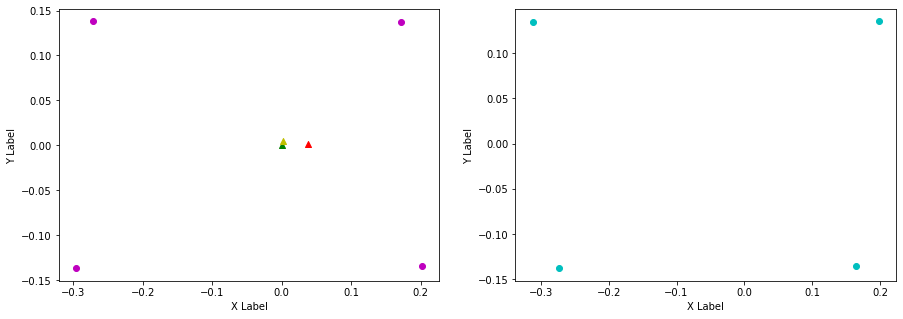

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.173, FL (y): 0.135, 0.137.
FL displacement: -0.025000000000000022, 0.0020000000000000018.

FR (x): 0.165, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.037000000000000005, 0.0010000000000000009.

RL (x): -0.312, -0.272, RL (y): 0.134, 0.138.
RL displacement: 0.03999999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.295, RR (y): -0.138, -0.137.
RR displacement: -0.020999999999999963, 0.0010000000000000009.


Base displacement (Foot): [0.025000000000000022, -0.0020000000000000018].

Velocity x: [0.04292559]. Velocity y: [-0.01159452]. Angular -0.0058251153666824445
Odom velocity x: 0.0370148601586. Odom velocity y: -0.00268728645919. Odom velocity yaw: 0.217179712699
Base displacement (Odom): [[0.013306929573785098], [-0.0035943006413244327]]. Rotation displacement: -0.2872029474509985.



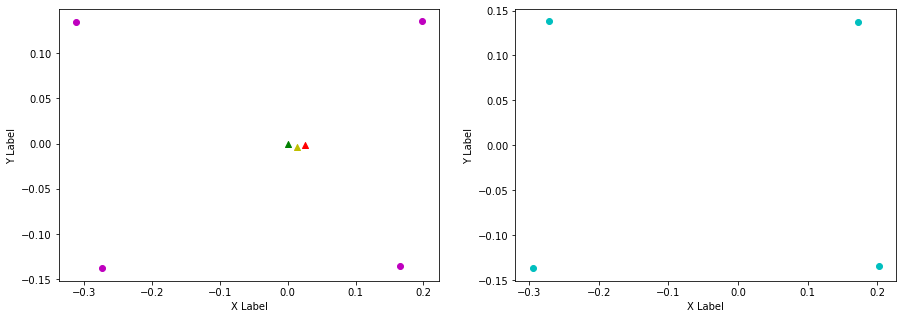

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.173, 0.198, FL (y): 0.137, 0.135.
FL displacement: 0.025000000000000022, -0.0020000000000000018.

FR (x): 0.202, 0.164, FR (y): -0.134, -0.134.
FR displacement: -0.038000000000000006, 0.0.

RL (x): -0.272, -0.312, RL (y): 0.138, 0.134.
RL displacement: -0.03999999999999998, -0.0040000000000000036.

RR (x): -0.295, -0.274, RR (y): -0.137, -0.139.
RR displacement: 0.020999999999999963, -0.0020000000000000018.


Base displacement (Foot): [0.038000000000000006, -0.0].

Velocity x: [0.08918942]. Velocity y: [0.02851942]. Angular 0.0031181159813475595
Odom velocity x: 0.070274293981. Odom velocity y: 0.0154680578412. Odom velocity yaw: -0.288146279636
Base displacement (Odom): [[0.031216309833461464], [0.009981802379895544]]. Rotation displacement: -0.10346388386560142.



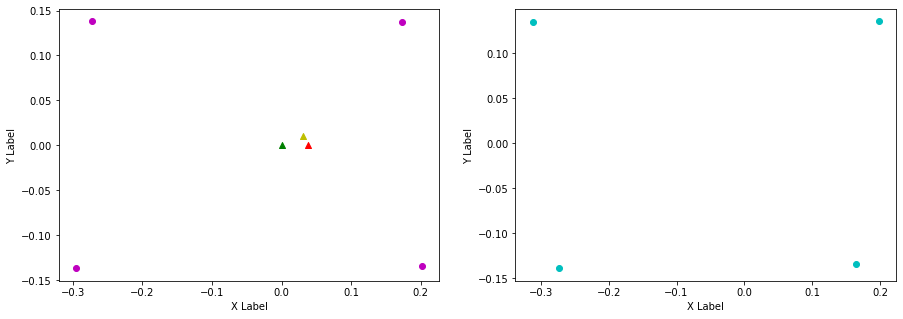

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.174, FL (y): 0.135, 0.138.
FL displacement: -0.02400000000000002, 0.0030000000000000027.

FR (x): 0.164, 0.203, FR (y): -0.134, -0.133.
FR displacement: 0.03900000000000001, 0.0010000000000000009.

RL (x): -0.312, -0.271, RL (y): 0.134, 0.138.
RL displacement: 0.04099999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.294, RR (y): -0.139, -0.137.
RR displacement: -0.019999999999999962, 0.0020000000000000018.


Base displacement (Foot): [0.02400000000000002, -0.0030000000000000027].

Velocity x: [0.05017268]. Velocity y: [-0.02015773]. Angular -0.02678564824969784
Odom velocity x: 0.0614490729653. Odom velocity y: -0.00149976625163. Odom velocity yaw: 0.191913444603
Base displacement (Odom): [[0.015051800377057667], [-0.006047318210826769]]. Rotation displacement: 0.06252923557401424.



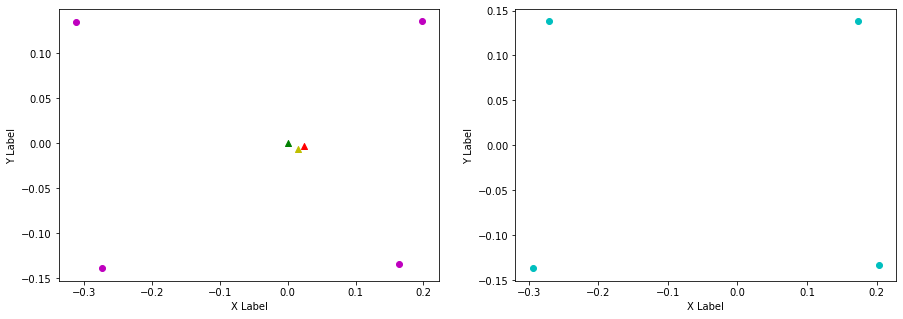

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.174, 0.198, FL (y): 0.138, 0.134.
FL displacement: 0.02400000000000002, -0.0040000000000000036.

FR (x): 0.203, 0.166, FR (y): -0.133, -0.135.
FR displacement: -0.037000000000000005, -0.0020000000000000018.

RL (x): -0.271, -0.31, RL (y): 0.138, 0.134.
RL displacement: -0.03899999999999998, -0.0040000000000000036.

RR (x): -0.294, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.019999999999999962, -0.0010000000000000009.


Base displacement (Foot): [0.037000000000000005, 0.0020000000000000018].

Velocity x: [0.0197053]. Velocity y: [0.00350277]. Angular 0.01852917026919674
Odom velocity x: 0.0384436473661. Odom velocity y: 0.00010378122635. Odom velocity yaw: -0.254883209417
Base displacement (Odom): [[0.006699801941532302], [0.0011909419698415413]]. Rotation displacement: -0.46041130568848226.



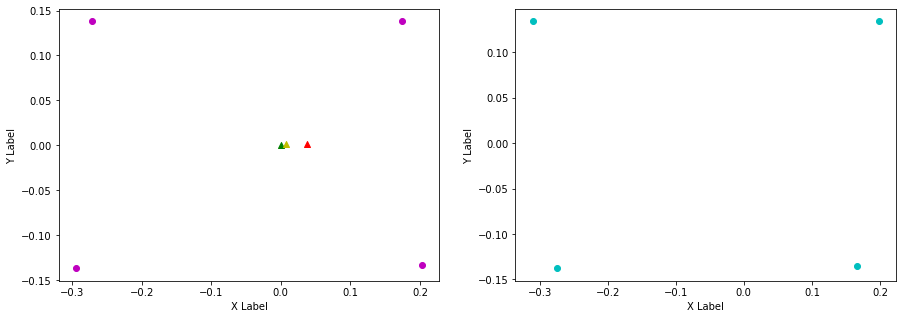

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.032, 0.0010000000000000009.

FR (x): 0.166, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.031, -0.0020000000000000018.

RL (x): -0.31, -0.275, RL (y): 0.134, 0.141.
RL displacement: 0.034999999999999976, 0.0069999999999999785.

RR (x): -0.274, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.03699999999999998, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.0454798]. Velocity y: [-0.01272594]. Angular 0.0043358514835304725
Odom velocity x: 0.0399741468299. Odom velocity y: -0.00718878261522. Odom velocity yaw: 0.236880593867
Base displacement (Odom): [[0.015917935022664365], [-0.004454080768334451]]. Rotation displacement: 0.36095861534187584.



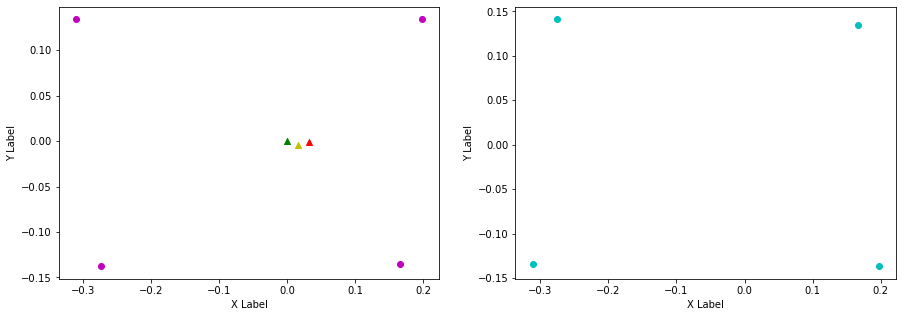

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.137, -0.135.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.275, -0.312, RL (y): 0.141, 0.134.
RL displacement: -0.03699999999999998, -0.0069999999999999785.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.10397572]. Velocity y: [0.03429328]. Angular -0.02957639706864572
Odom velocity x: 0.0755125557911. Odom velocity y: 0.0129711267829. Odom velocity yaw: -0.246619891383
Base displacement (Odom): [[0.031192711197600254], [0.010287982866297007]]. Rotation displacement: 0.0869491322482645.



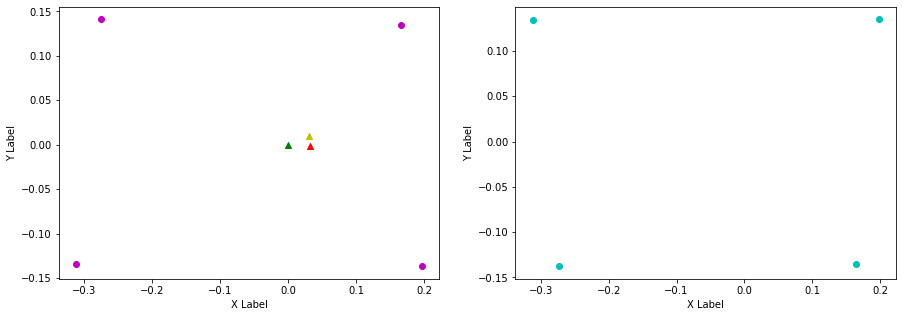

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.03699999999999998, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.0305338]. Velocity y: [-0.01433451]. Angular -0.01048084243122061
Odom velocity x: 0.0562914743829. Odom velocity y: -0.000233886453972. Odom velocity yaw: 0.223360978999
Base displacement (Odom): [[0.010381488606195255], [-0.004873731338089354]]. Rotation displacement: -0.508380736765995.



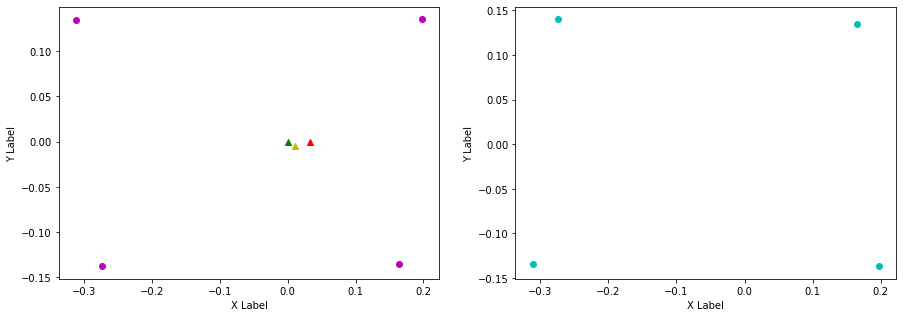

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.137, -0.135.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.09489248]. Velocity y: [0.02340474]. Angular -0.030942064321136727
Odom velocity x: 0.0775986271671. Odom velocity y: 0.0124417102792. Odom velocity yaw: -0.293296293034
Base displacement (Odom): [[0.033212380210857706], [0.008191663994307208]]. Rotation displacement: -0.20417268105517683.



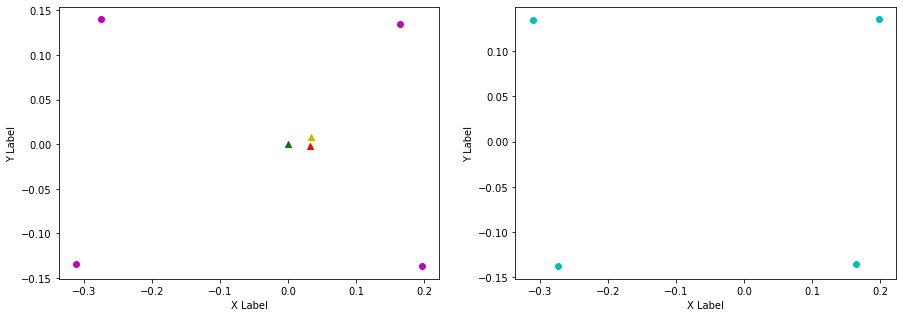

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.171, FL (y): 0.135, 0.137.
FL displacement: -0.026999999999999996, 0.0020000000000000018.

FR (x): 0.164, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.038000000000000006, 0.0010000000000000009.

RL (x): -0.311, -0.272, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.298, RR (y): -0.138, -0.137.
RR displacement: -0.023999999999999966, 0.0010000000000000009.


Base displacement (Foot): [0.026999999999999996, -0.0020000000000000018].

Velocity x: [0.0273587]. Velocity y: [-0.00833051]. Angular 0.012053675040334822
Odom velocity x: 0.0553295469864. Odom velocity y: 0.00365147129169. Odom velocity yaw: 0.200338134592
Base displacement (Odom): [[0.007386847213015413], [-0.002249238210554061]]. Rotation displacement: -0.6204976468663946.



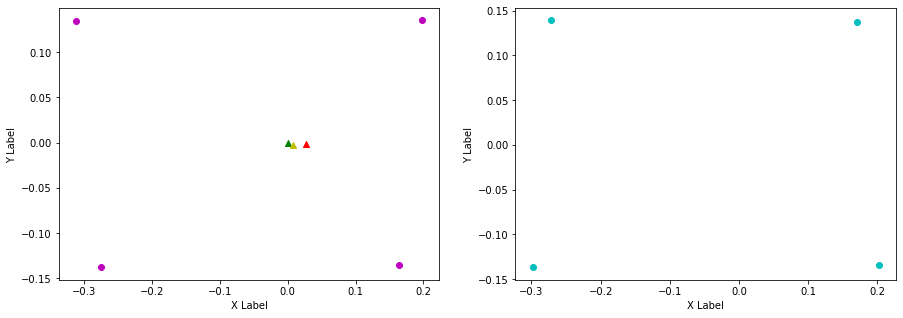

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.198, FL (y): 0.137, 0.134.
FL displacement: 0.026999999999999996, -0.0030000000000000027.

FR (x): 0.202, 0.165, FR (y): -0.134, -0.135.
FR displacement: -0.037000000000000005, -0.0010000000000000009.

RL (x): -0.272, -0.31, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.298, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.023999999999999966, -0.0010000000000000009.


Base displacement (Foot): [0.037000000000000005, 0.0010000000000000009].

Velocity x: [0.05128284]. Velocity y: [0.01299281]. Angular -0.017252055199416444
Odom velocity x: 0.0497597944528. Odom velocity y: 0.00827611111382. Odom velocity yaw: -0.286799043495
Base displacement (Odom): [[0.01846181605748498], [0.004677409733605337]]. Rotation displacement: 0.18646865783438835.



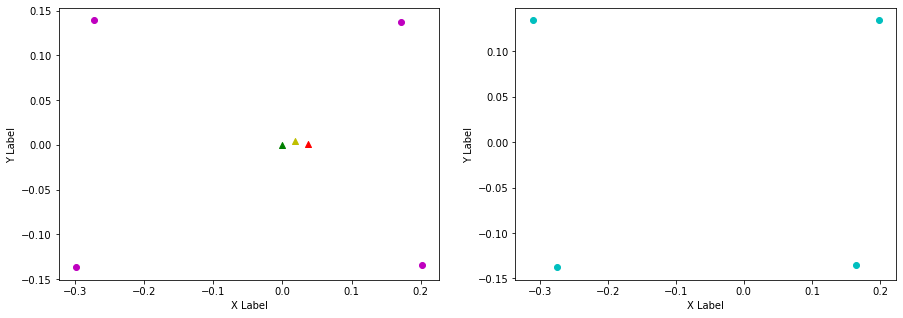

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.171, FL (y): 0.134, 0.137.
FL displacement: -0.026999999999999996, 0.0030000000000000027.

FR (x): 0.165, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.037000000000000005, 0.0010000000000000009.

RL (x): -0.31, -0.272, RL (y): 0.134, 0.138.
RL displacement: 0.03799999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.298, RR (y): -0.138, -0.136.
RR displacement: -0.023999999999999966, 0.0020000000000000018.


Base displacement (Foot): [0.026999999999999996, -0.0030000000000000027].

Velocity x: [0.07655896]. Velocity y: [-0.01784483]. Angular 0.013275255472285108
Odom velocity x: 0.0638497945656. Odom velocity y: -0.00468431386456. Odom velocity yaw: 0.221960323932
Base displacement (Odom): [[0.022967684338886185], [-0.005353446976571585]]. Rotation displacement: -0.35584907861255993.



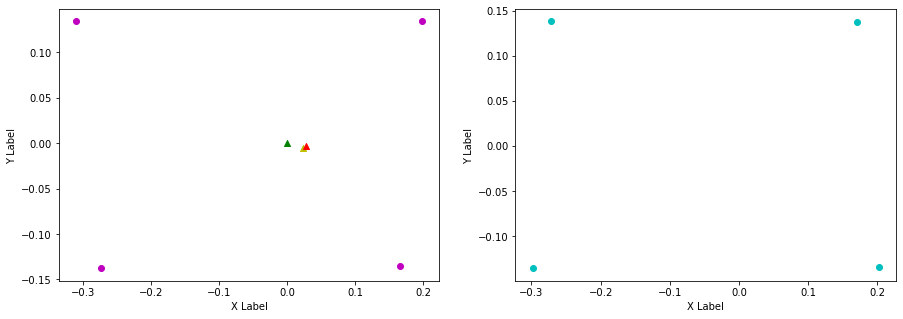

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.198, FL (y): 0.137, 0.135.
FL displacement: 0.026999999999999996, -0.0020000000000000018.

FR (x): 0.202, 0.165, FR (y): -0.134, -0.135.
FR displacement: -0.037000000000000005, -0.0010000000000000009.

RL (x): -0.272, -0.311, RL (y): 0.138, 0.134.
RL displacement: -0.03899999999999998, -0.0040000000000000036.

RR (x): -0.298, -0.274, RR (y): -0.136, -0.139.
RR displacement: 0.023999999999999966, -0.0030000000000000027.


Base displacement (Foot): [0.037000000000000005, 0.0010000000000000009].

Velocity x: [0.03638929]. Velocity y: [0.00607138]. Angular -0.013161292237985601
Odom velocity x: 0.0489047947068. Odom velocity y: -0.000460575586008. Odom velocity yaw: -0.278062110258
Base displacement (Odom): [[0.012372363307829204], [0.00206426977032792]]. Rotation displacement: 0.22818479688696366.



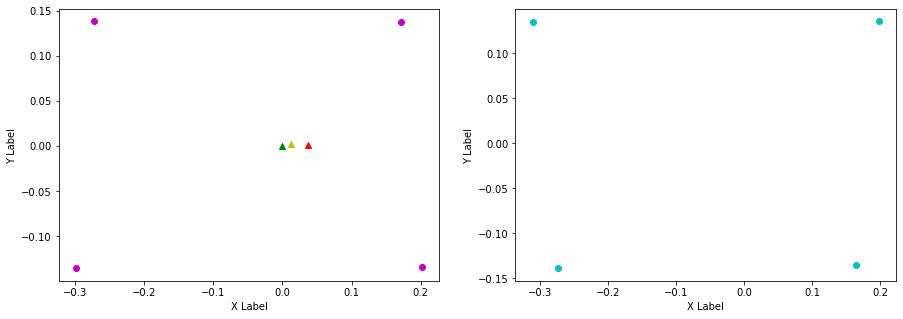

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.173, FL (y): 0.135, 0.138.
FL displacement: -0.025000000000000022, 0.0030000000000000027.

FR (x): 0.165, 0.203, FR (y): -0.135, -0.133.
FR displacement: 0.038000000000000006, 0.0020000000000000018.

RL (x): -0.311, -0.271, RL (y): 0.134, 0.138.
RL displacement: 0.03999999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.295, RR (y): -0.139, -0.137.
RR displacement: -0.020999999999999963, 0.0020000000000000018.


Base displacement (Foot): [0.025000000000000022, -0.0030000000000000027].

Velocity x: [0.01289121]. Velocity y: [-0.00624688]. Angular -0.006632094093098608
Odom velocity x: 0.0285432753459. Odom velocity y: -0.00358243751874. Odom velocity yaw: 0.212338590932
Base displacement (Odom): [[0.003867363217846531], [-0.0018740629336901349]]. Rotation displacement: -0.25638952444392216.



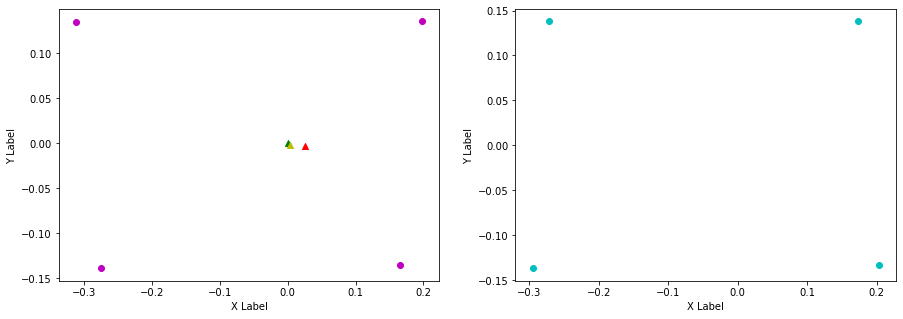

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.173, 0.197, FL (y): 0.138, 0.135.
FL displacement: 0.02400000000000002, -0.0030000000000000027.

FR (x): 0.203, 0.164, FR (y): -0.133, -0.135.
FR displacement: -0.03900000000000001, -0.0020000000000000018.

RL (x): -0.271, -0.312, RL (y): 0.138, 0.134.
RL displacement: -0.04099999999999998, -0.0040000000000000036.

RR (x): -0.295, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.020999999999999963, -0.0010000000000000009.


Base displacement (Foot): [0.03900000000000001, 0.0020000000000000018].

Velocity x: [0.10387107]. Velocity y: [0.02760402]. Angular -0.024607918548128296
Odom velocity x: 0.0771147860246. Odom velocity y: 0.0148891155745. Odom velocity yaw: -0.298876427536
Base displacement (Odom): [[0.0405097028347583], [0.010765563215603402]]. Rotation displacement: -0.11399728214107514.



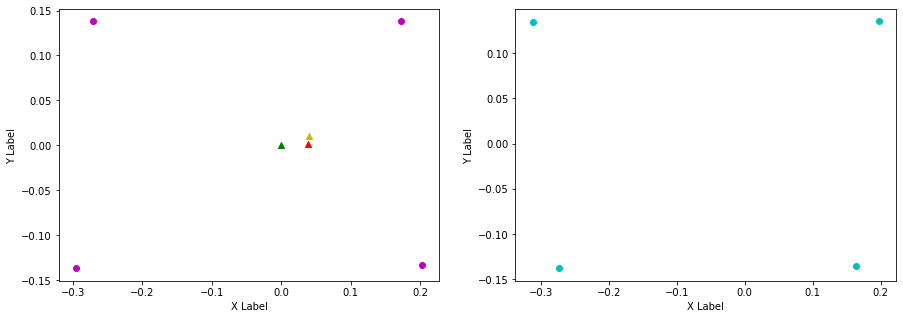

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.139.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.02099002]. Velocity y: [-0.01291476]. Angular 0.03772795689242971
Odom velocity x: 0.0520663432975. Odom velocity y: 0.0037229162324. Odom velocity yaw: 0.237214313059
Base displacement (Odom): [[0.006087109324157902], [-0.0037452837277473505]]. Rotation displacement: -0.5498724631637372.



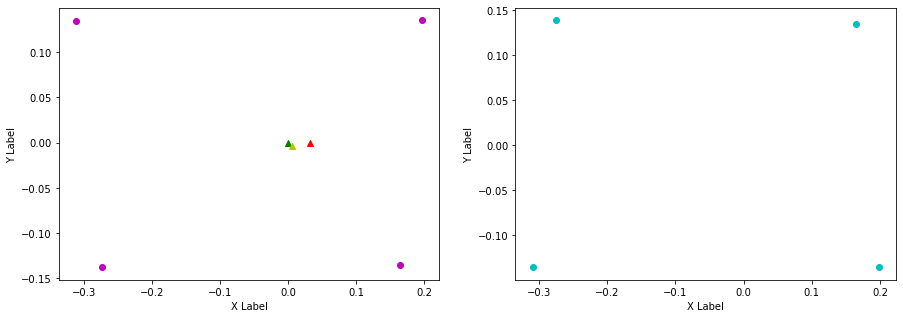

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.313, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.309, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04785864]. Velocity y: [0.00814364]. Angular -0.03624017543155315
Odom velocity x: 0.0519140561583. Odom velocity y: 0.00603868651684. Odom velocity yaw: -0.28842850146
Base displacement (Odom): [[0.016750518409891058], [0.002850273976119422]]. Rotation displacement: 0.6268797157980996.



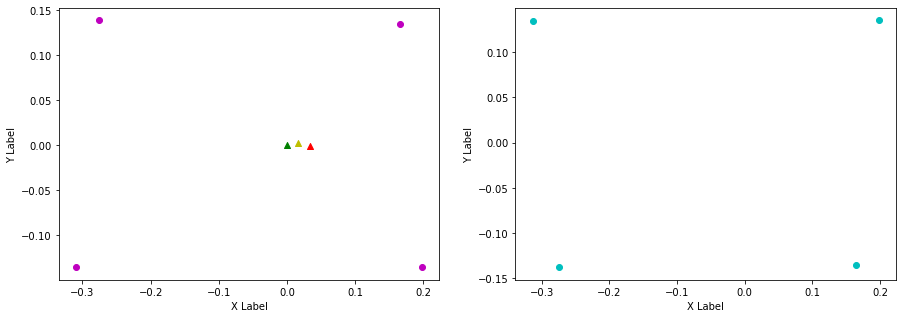

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.035, -0.0010000000000000009.

RL (x): -0.313, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.01726783]. Velocity y: [-0.00303036]. Angular 0.0318579918780667
Odom velocity x: 0.0330664646681. Odom velocity y: 0.00195773263512. Odom velocity yaw: 0.210451432852
Base displacement (Odom): [[0.00518034829270464], [-0.000909106541727378]]. Rotation displacement: -0.7267429873427892.



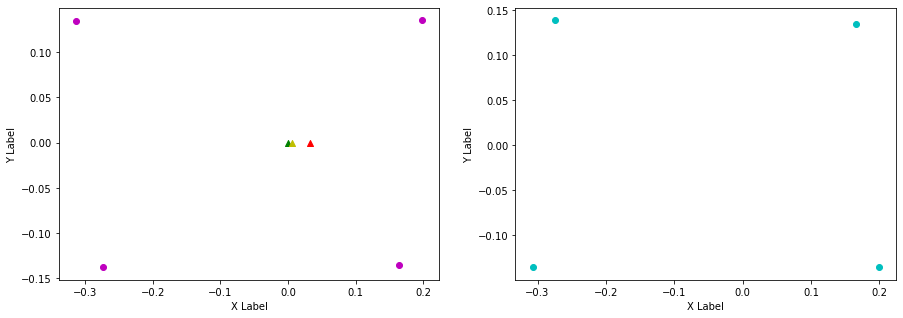

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.199, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.307, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.032999999999999974, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.03378867]. Velocity y: [0.00525095]. Angular -0.017212120588526912
Odom velocity x: 0.032735705356. Odom velocity y: 0.00332420777053. Odom velocity yaw: -0.224968757347
Base displacement (Odom): [[0.010136599332872365], [0.001575283374169012]]. Rotation displacement: 0.5475984564741386.



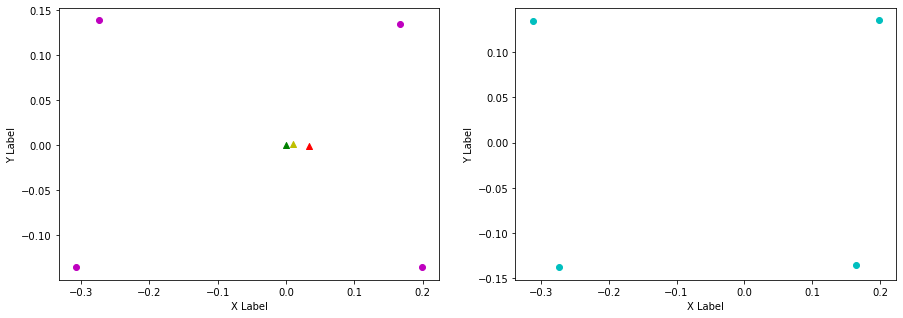

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.139.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.06413107]. Velocity y: [-0.00990679]. Angular -0.007408478896302355
Odom velocity x: 0.0527590735943. Odom velocity y: -0.00399030575323. Odom velocity yaw: 0.233000829896
Base displacement (Odom): [[0.022445884937039695], [-0.003467378982924929]]. Rotation displacement: -0.29585451283303094.



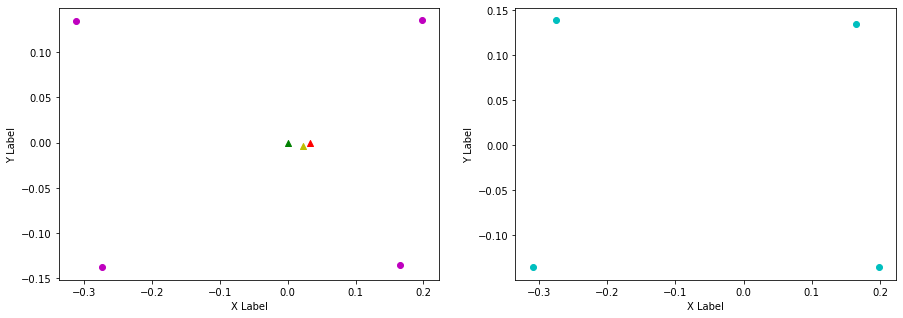

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.178, FR (y): -0.136, -0.137.
FR displacement: -0.020000000000000018, -0.0010000000000000009.

RL (x): -0.275, -0.293, RL (y): 0.139, 0.136.
RL displacement: -0.01799999999999996, -0.0030000000000000027.

RR (x): -0.309, -0.272, RR (y): -0.135, -0.137.
RR displacement: 0.03699999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0010000000000000009].

Velocity x: [0.06720071]. Velocity y: [0.02185614]. Angular 0.018440052624155174
Odom velocity x: 0.066243807213. Odom velocity y: 0.00948193133968. Odom velocity yaw: -0.189790936638
Base displacement (Odom): [[0.020160209804975127], [0.006556840073724701]]. Rotation displacement: -0.1485661614010269.



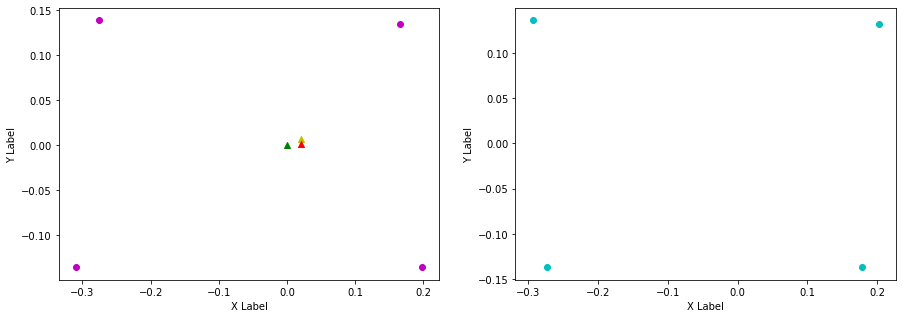

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.164, FL (y): 0.132, 0.135.
FL displacement: -0.038000000000000006, 0.0030000000000000027.

FR (x): 0.178, 0.198, FR (y): -0.137, -0.136.
FR displacement: 0.020000000000000018, 0.0010000000000000009.

RL (x): -0.293, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.01899999999999996, 0.0040000000000000036.

RR (x): -0.272, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.03799999999999998, 0.0020000000000000018.


Base displacement (Foot): [0.038000000000000006, -0.0030000000000000027].

Velocity x: [0.07022536]. Velocity y: [-0.0176627]. Angular -0.03529356243253013
Odom velocity x: 0.0733398059925. Odom velocity y: -0.00429534132966. Odom velocity yaw: 0.225127969182
Base displacement (Odom): [[0.024578870941561526], [-0.0061819432287278375]]. Rotation displacement: 0.3169611064293499.



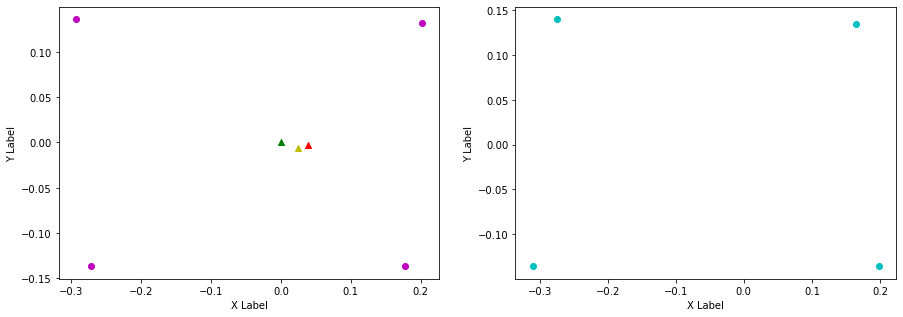

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.204, FL (y): 0.135, 0.132.
FL displacement: 0.03999999999999998, -0.0030000000000000027.

FR (x): 0.198, 0.18, FR (y): -0.136, -0.138.
FR displacement: -0.018000000000000016, -0.0020000000000000018.

RL (x): -0.274, -0.292, RL (y): 0.14, 0.138.
RL displacement: -0.01799999999999996, -0.0020000000000000018.

RR (x): -0.31, -0.271, RR (y): -0.135, -0.136.
RR displacement: 0.03899999999999998, -0.0010000000000000009.


Base displacement (Foot): [0.018000000000000016, 0.0020000000000000018].

Velocity x: [0.07517651]. Velocity y: [0.02196615]. Angular 0.01057323721961107
Odom velocity x: 0.0786157347537. Odom velocity y: 0.00816487385519. Odom velocity yaw: -0.210408665936
Base displacement (Odom): [[0.021801202427665034], [0.006370189071871313]]. Rotation displacement: -0.7077600671285419.



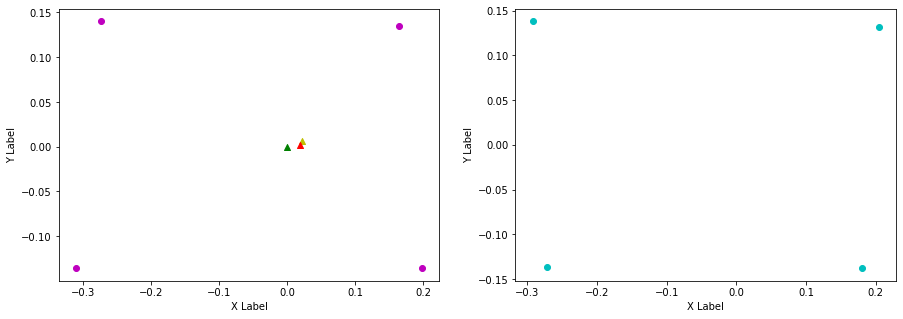

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.204, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.035999999999999976, 0.0040000000000000036.

FR (x): 0.18, 0.2, FR (y): -0.138, -0.135.
FR displacement: 0.020000000000000018, 0.0030000000000000027.

RL (x): -0.292, -0.274, RL (y): 0.138, 0.138.
RL displacement: 0.01799999999999996, 0.0.

RR (x): -0.271, -0.304, RR (y): -0.136, -0.136.
RR displacement: -0.032999999999999974, 0.0.


Base displacement (Foot): [0.035999999999999976, -0.0040000000000000036].

Velocity x: [0.06288173]. Velocity y: [-0.01936051]. Angular -0.0274490984810344
Odom velocity x: 0.075126071825. Odom velocity y: -0.00614357573645. Odom velocity yaw: 0.227718407503
Base displacement (Odom): [[0.021379784382495215], [-0.006582571193578857]]. Rotation displacement: 0.1756826631824753.



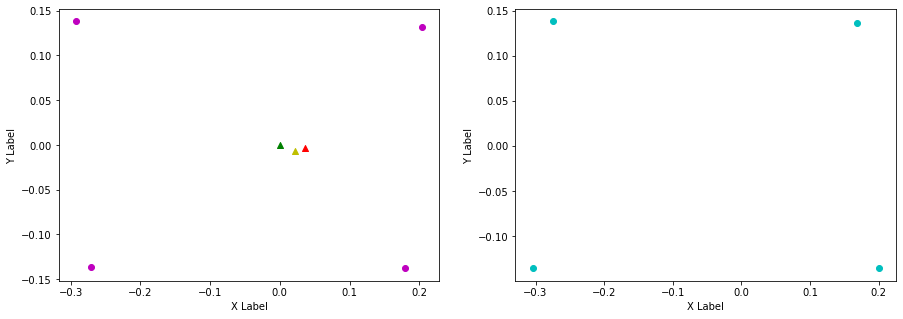

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.031, -0.0020000000000000018.

FR (x): 0.2, 0.166, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.274, -0.308, RL (y): 0.138, 0.135.
RL displacement: -0.033999999999999975, -0.0030000000000000027.

RR (x): -0.304, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02999999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.03624787]. Velocity y: [0.00321445]. Angular -0.0050635584949984555
Odom velocity x: 0.0575603271155. Odom velocity y: -0.00252626189697. Odom velocity yaw: -0.278404944666
Base displacement (Odom): [[0.012686751854121825], [0.0011250573723049495]]. Rotation displacement: -0.5347238131093328.



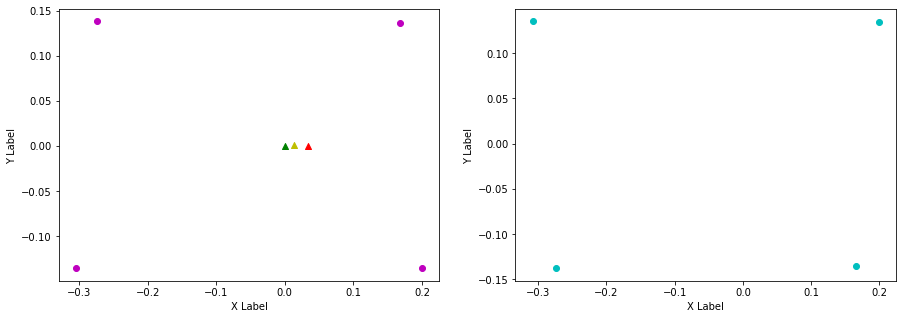

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.171, FL (y): 0.134, 0.137.
FL displacement: -0.027999999999999997, 0.0030000000000000027.

FR (x): 0.166, 0.201, FR (y): -0.135, -0.134.
FR displacement: 0.035, 0.0010000000000000009.

RL (x): -0.308, -0.272, RL (y): 0.135, 0.138.
RL displacement: 0.035999999999999976, 0.0030000000000000027.

RR (x): -0.274, -0.298, RR (y): -0.138, -0.137.
RR displacement: -0.023999999999999966, 0.0010000000000000009.


Base displacement (Foot): [0.027999999999999997, -0.0030000000000000027].

Velocity x: [0.08438488]. Velocity y: [-0.02120224]. Angular -0.001273561793557383
Odom velocity x: 0.072281846691. Odom velocity y: -0.0123171176775. Odom velocity yaw: 0.189457114983
Base displacement (Odom): [[0.02531547908471876], [-0.006360676404595145]]. Rotation displacement: -0.10154215821030935.



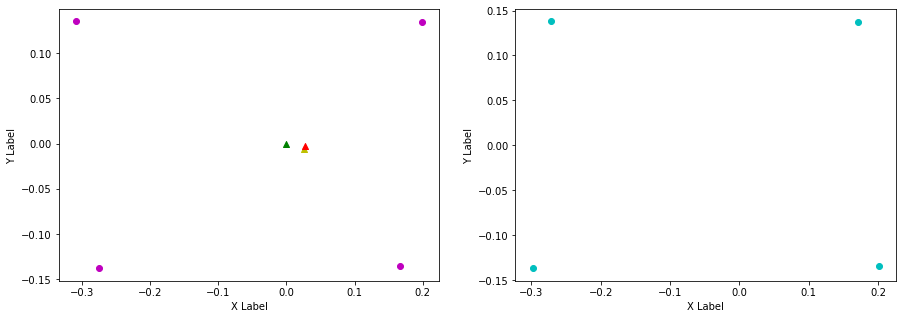

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.2, FL (y): 0.137, 0.133.
FL displacement: 0.028999999999999998, -0.0040000000000000036.

FR (x): 0.201, 0.17, FR (y): -0.134, -0.136.
FR displacement: -0.031, -0.0020000000000000018.

RL (x): -0.272, -0.303, RL (y): 0.138, 0.135.
RL displacement: -0.030999999999999972, -0.0030000000000000027.

RR (x): -0.298, -0.273, RR (y): -0.137, -0.137.
RR displacement: 0.024999999999999967, 0.0.


Base displacement (Foot): [0.031, 0.0020000000000000018].

Velocity x: [0.04727118]. Velocity y: [0.01814213]. Angular -0.0025393213512119573
Odom velocity x: 0.0608608128994. Odom velocity y: 0.00417952481864. Odom velocity yaw: -0.265910916669
Base displacement (Odom): [[0.016072196634249414], [0.0061683234120955555]]. Rotation displacement: -0.0218909286338536.



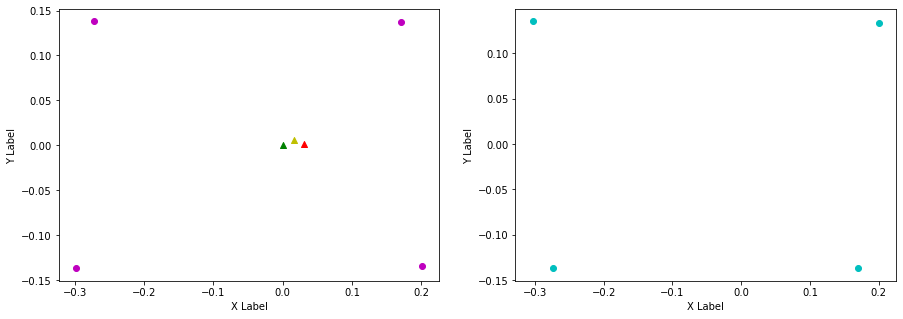

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.134.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.17, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.026999999999999996, -0.0010000000000000009.

RL (x): -0.303, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.02799999999999997, 0.0050000000000000044.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.08024618]. Velocity y: [-0.02229272]. Angular 0.0016869830565481565
Odom velocity x: 0.0746078827963. Odom velocity y: -0.0104002332138. Odom velocity yaw: 0.238132615286
Base displacement (Odom): [[0.027283694655181767], [-0.007579524214404332]]. Rotation displacement: -0.04946740223793434.



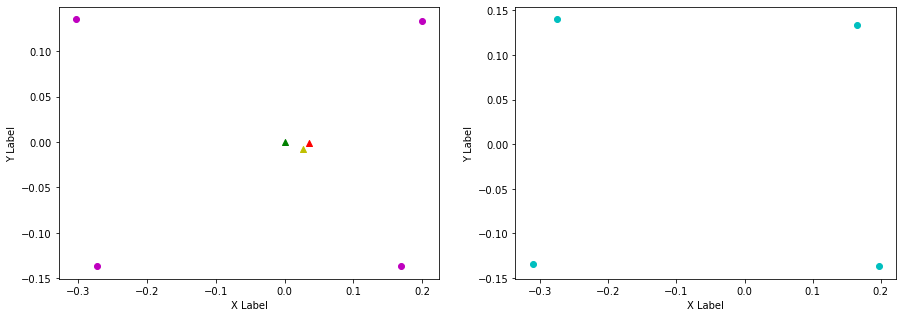

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.201, FL (y): 0.134, 0.133.
FL displacement: 0.036000000000000004, -0.0010000000000000009.

FR (x): 0.197, 0.173, FR (y): -0.137, -0.136.
FR displacement: -0.02400000000000002, 0.0010000000000000009.

RL (x): -0.275, -0.301, RL (y): 0.14, 0.136.
RL displacement: -0.025999999999999968, -0.0040000000000000036.

RR (x): -0.311, -0.273, RR (y): -0.134, -0.137.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.02400000000000002, -0.0010000000000000009].

Velocity x: [0.06329844]. Velocity y: [0.02146586]. Angular -0.006018510245294379
Odom velocity x: 0.0701072687097. Odom velocity y: 0.00517992388614. Odom velocity yaw: -0.247394870144
Base displacement (Odom): [[0.01898952956497224], [0.006439756412835451]]. Rotation displacement: 0.03286337484896056.



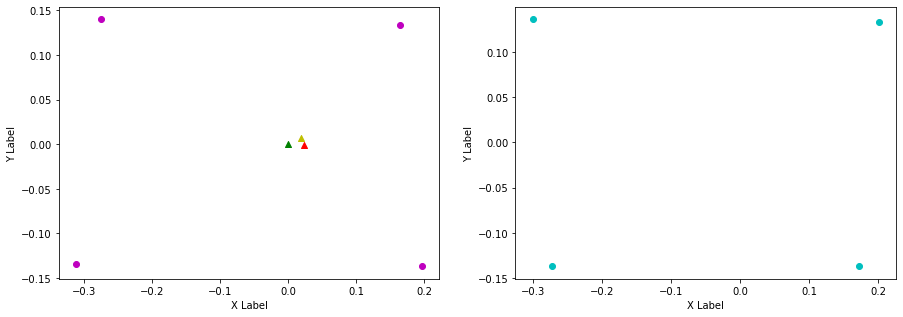

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.036000000000000004, 0.0020000000000000018.

FR (x): 0.173, 0.198, FR (y): -0.136, -0.136.
FR displacement: 0.025000000000000022, 0.0.

RL (x): -0.301, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.02699999999999997, 0.0040000000000000036.

RR (x): -0.273, -0.31, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.036000000000000004, -0.0020000000000000018].

Velocity x: [0.05918207]. Velocity y: [-0.01071205]. Angular 0.0136404094504512
Odom velocity x: 0.0684626629801. Odom velocity y: -0.00276606705897. Odom velocity yaw: 0.237436459853
Base displacement (Odom): [[0.0230810139253812], [-0.004177700769912196]]. Rotation displacement: -0.10345055436045873.



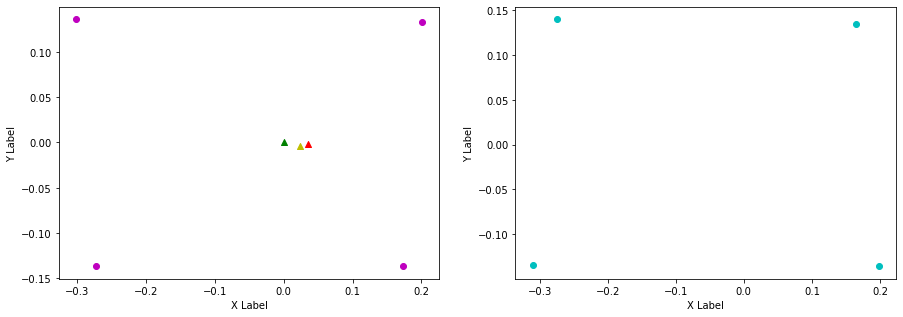

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04434472]. Velocity y: [0.00495501]. Angular -0.061822354126498544
Odom velocity x: 0.0575255139341. Odom velocity y: 0.000349467906453. Odom velocity yaw: -0.310786067729
Base displacement (Odom): [[0.0133034143456352], [0.001486503966539765]]. Rotation displacement: 0.304799859999662.



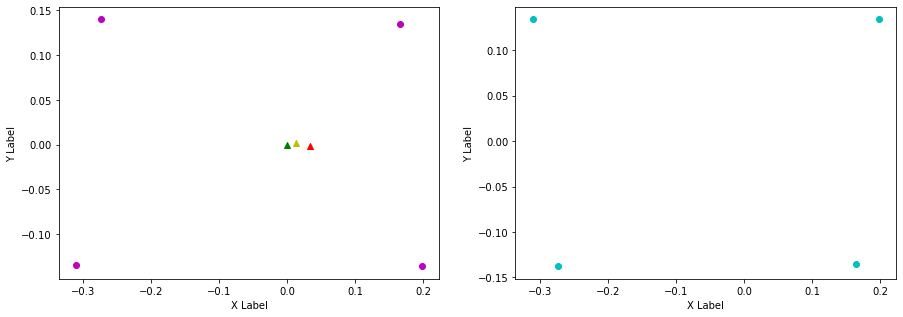

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.134, 0.139.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.03204162]. Velocity y: [-0.01091737]. Angular -0.002231297306699137
Odom velocity x: 0.045550346395. Odom velocity y: -0.0052096193032. Odom velocity yaw: 0.231218222475
Base displacement (Odom): [[0.009932900573126346], [-0.003384383186871842]]. Rotation displacement: -1.0626478224001172.



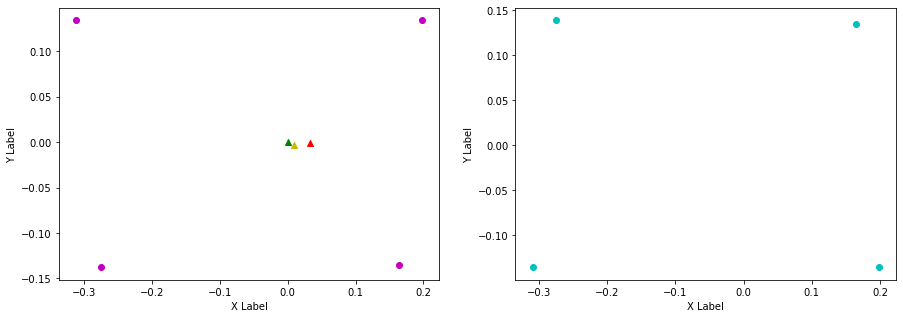

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.309, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.06375056]. Velocity y: [0.01800506]. Angular -0.0216559728986404
Odom velocity x: 0.0515897277861. Odom velocity y: 0.00707163356192. Odom velocity yaw: -0.2960373049
Base displacement (Odom): [[0.02167519959788633], [0.0061217222967598905]]. Rotation displacement: -0.03963160742367044.



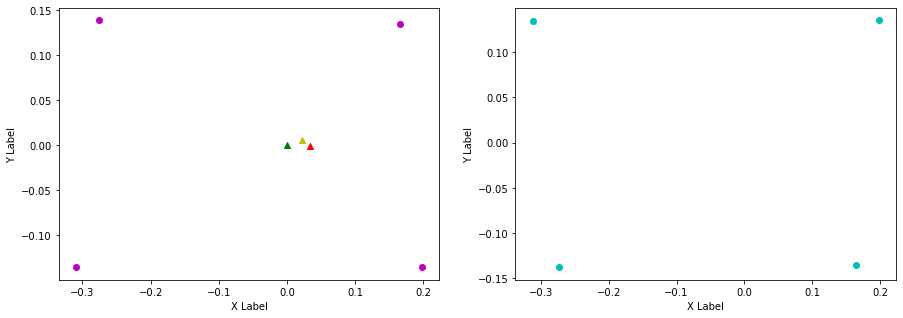

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.168, FL (y): 0.135, 0.136.
FL displacement: -0.03, 0.0010000000000000009.

FR (x): 0.164, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.036000000000000004, 0.0.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.09820102]. Velocity y: [-0.02935048]. Angular 0.01761412612931017
Odom velocity x: 0.0712969207604. Odom velocity y: -0.00966433551353. Odom velocity yaw: 0.19773735566
Base displacement (Odom): [[0.026514272962411933], [-0.007924627921473748]]. Rotation displacement: -0.4218707777666287.



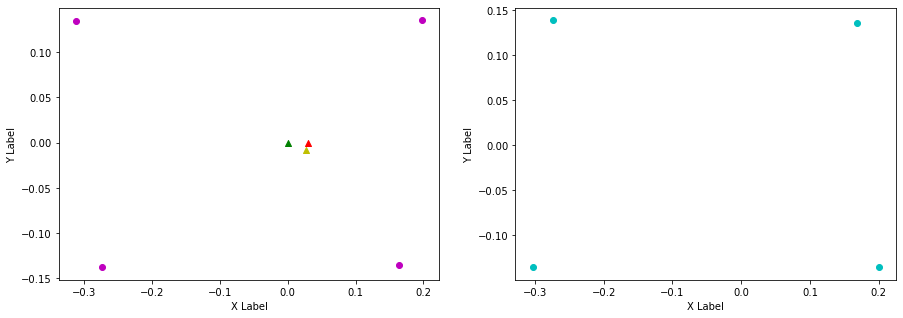

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.2, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.036000000000000004, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.303, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02899999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0].

Velocity x: [0.08437937]. Velocity y: [0.02004411]. Angular -0.002776043328448351
Odom velocity x: 0.0833008543155. Odom velocity y: 0.00703193596824. Odom velocity yaw: -0.264795348761
Base displacement (Odom): [[0.028688979783885404], [0.006814997171440573]]. Rotation displacement: 0.2724880542463058.



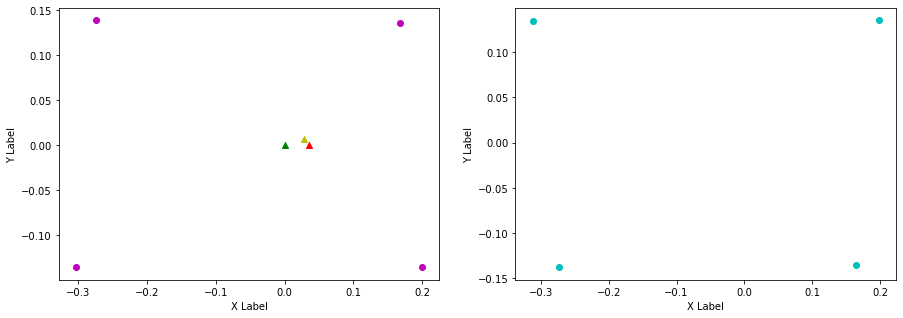

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.04725389]. Velocity y: [-0.01231933]. Angular -0.014077508672688126
Odom velocity x: 0.0672825492729. Odom velocity y: -0.00229071341561. Odom velocity yaw: 0.212314540339
Base displacement (Odom): [[0.015121252342831681], [-0.0039421882170039835]]. Rotation displacement: -0.054078878946434795.



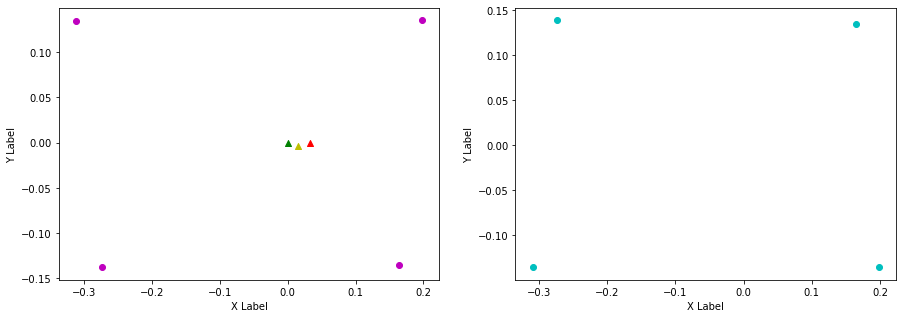

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.135.
RL displacement: -0.03699999999999998, -0.0040000000000000036.

RR (x): -0.309, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.06648454]. Velocity y: [0.02088173]. Angular -0.02077865453471228
Odom velocity x: 0.0673456522407. Odom velocity y: 0.0103947409672. Odom velocity yaw: -0.269314391011
Base displacement (Odom): [[0.02326958414504876], [0.007308604198791702]]. Rotation displacement: -0.2581063250201779.



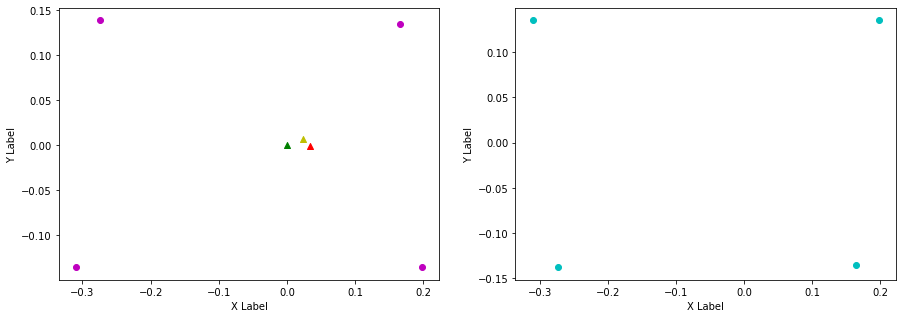

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.135, 0.139.
RL displacement: 0.035999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.0467017]. Velocity y: [-0.00723393]. Angular 0.015309975504709283
Odom velocity x: 0.0580775600218. Odom velocity y: 0.00234496084632. Odom velocity yaw: 0.210484191461
Base displacement (Odom): [[0.014477524756017157], [-0.002242516837475117]]. Rotation displacement: -0.41668510954207105.



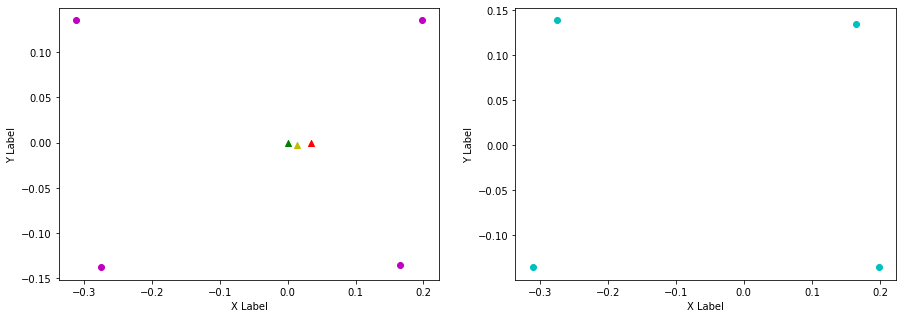

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.07681142]. Velocity y: [0.02029113]. Angular -0.019114555744230856
Odom velocity x: 0.0727675095777. Odom velocity y: 0.0125772478493. Odom velocity yaw: -0.281059724295
Base displacement (Odom): [[0.026884007033496804], [0.007101898915052696]]. Rotation displacement: 0.27193101387562557.



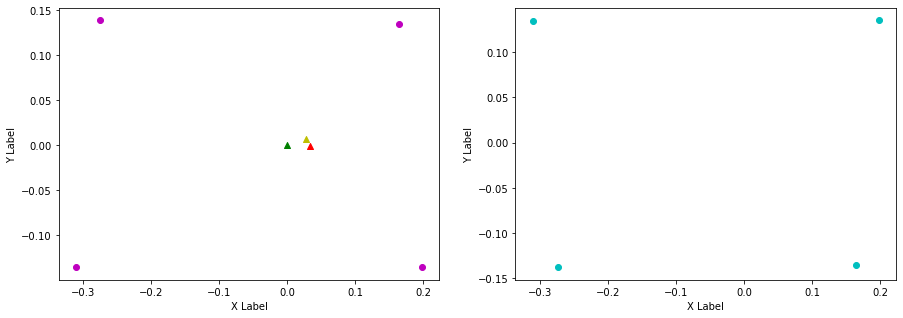

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.035, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.0683174]. Velocity y: [-0.01976702]. Angular 0.016438973463600882
Odom velocity x: 0.0731950693991. Odom velocity y: -0.0026119133692. Odom velocity yaw: 0.212679184923
Base displacement (Odom): [[0.020495216863676724], [-0.0059301042296486806]]. Rotation displacement: -0.3833143366614283.



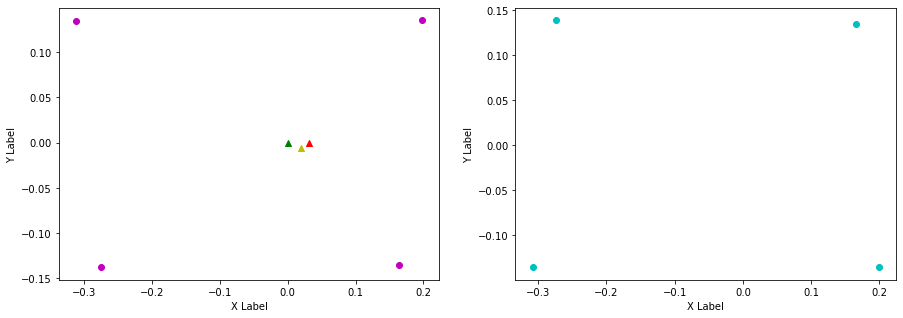

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.199, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.309, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.06498962]. Velocity y: [0.00778892]. Angular -0.021850472978522918
Odom velocity x: 0.0744665557175. Odom velocity y: 0.00239259272892. Odom velocity yaw: -0.276797933137
Base displacement (Odom): [[0.022096463920184828], [0.002648231428003467]]. Rotation displacement: 0.28256509478504677.



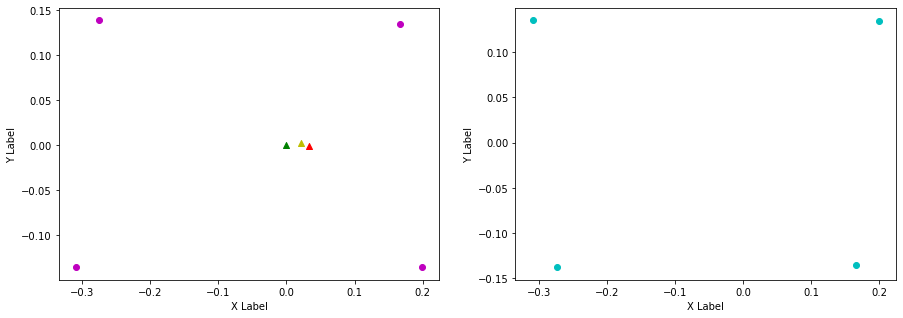

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.17, FL (y): 0.134, 0.137.
FL displacement: -0.028999999999999998, 0.0030000000000000027.

FR (x): 0.166, 0.201, FR (y): -0.135, -0.134.
FR displacement: 0.035, 0.0010000000000000009.

RL (x): -0.309, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.035999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.3, RR (y): -0.138, -0.136.
RR displacement: -0.025999999999999968, 0.0020000000000000018.


Base displacement (Foot): [0.028999999999999998, -0.0030000000000000027].

Velocity x: [0.07643096]. Velocity y: [-0.02080008]. Angular -0.015629067768303525
Odom velocity x: 0.0780718132623. Odom velocity y: -0.00912416441848. Odom velocity yaw: 0.198764694925
Base displacement (Odom): [[0.02292928531036642], [-0.006240022785675148]]. Rotation displacement: -0.42565945243670217.



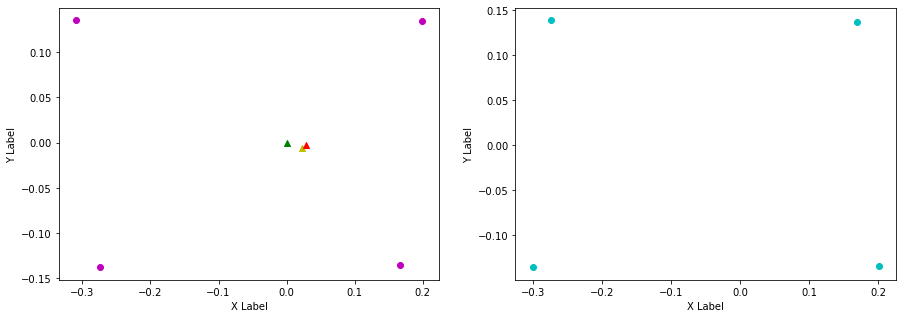

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.199, FL (y): 0.137, 0.133.
FL displacement: 0.028999999999999998, -0.0040000000000000036.

FR (x): 0.201, 0.168, FR (y): -0.134, -0.136.
FR displacement: -0.033, -0.0020000000000000018.

RL (x): -0.273, -0.305, RL (y): 0.139, 0.135.
RL displacement: -0.03199999999999997, -0.0040000000000000036.

RR (x): -0.3, -0.274, RR (y): -0.136, -0.137.
RR displacement: 0.025999999999999968, -0.0010000000000000009.


Base displacement (Foot): [0.033, 0.0020000000000000018].

Velocity x: [0.08261289]. Velocity y: [0.02348231]. Angular 0.007465284201083716
Odom velocity x: 0.0844081134236. Odom velocity y: 0.00770504237045. Odom velocity yaw: -0.26786936212
Base displacement (Odom): [[0.028088394611260448], [0.007983987706469686]]. Rotation displacement: -0.26864384355452636.



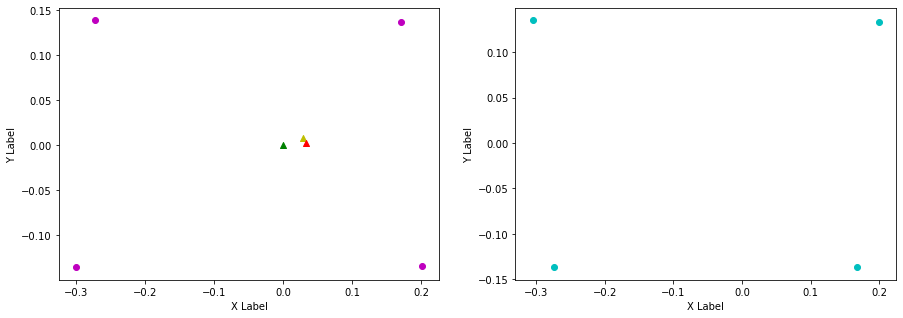

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.034, 0.0020000000000000018.

FR (x): 0.168, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.028999999999999998, -0.0010000000000000009.

RL (x): -0.305, -0.275, RL (y): 0.135, 0.141.
RL displacement: 0.02999999999999997, 0.005999999999999978.

RR (x): -0.274, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0020000000000000018].

Velocity x: [0.09255201]. Velocity y: [-0.02978993]. Angular -0.0022516512861369114
Odom velocity x: 0.0929156993627. Odom velocity y: -0.012211899822. Odom velocity yaw: 0.231516303569
Base displacement (Odom): [[0.03146767465365441], [-0.010128572268838287]]. Rotation displacement: 0.14542801964615665.



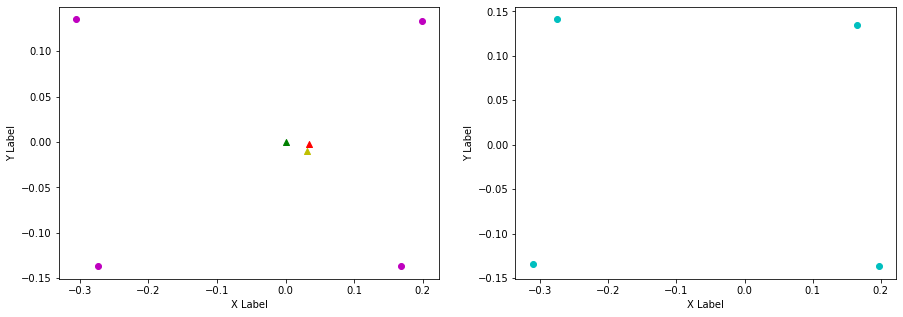

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.133.
FL displacement: 0.035, -0.0020000000000000018.

FR (x): 0.197, 0.17, FR (y): -0.137, -0.136.
FR displacement: -0.026999999999999996, 0.0010000000000000009.

RL (x): -0.275, -0.303, RL (y): 0.141, 0.136.
RL displacement: -0.02799999999999997, -0.004999999999999977.

RR (x): -0.311, -0.273, RR (y): -0.134, -0.137.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.03997816]. Velocity y: [0.0063402]. Angular -0.005673062149636528
Odom velocity x: 0.0704212679395. Odom velocity y: -0.0043756522066. Odom velocity yaw: -0.246906355587
Base displacement (Odom): [[0.011993447548127367], [0.001902060936583183]]. Rotation displacement: -0.04386342824146151.



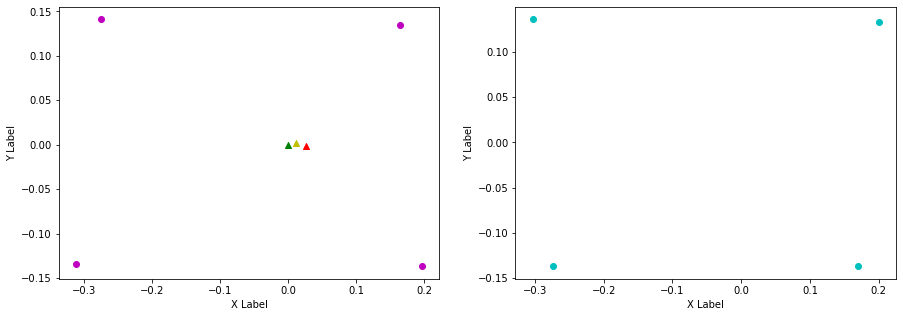

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.134.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.17, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.026999999999999996, -0.0010000000000000009.

RL (x): -0.303, -0.275, RL (y): 0.136, 0.14.
RL displacement: 0.02799999999999997, 0.0040000000000000036.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.04618108]. Velocity y: [-0.00682563]. Angular -0.0023943994234839976
Odom velocity x: 0.0553529266919. Odom velocity y: -0.00490379963709. Odom velocity yaw: 0.225925527173
Base displacement (Odom): [[0.015701573912384248], [-0.0023207138512446046]]. Rotation displacement: -0.09751273992764115.



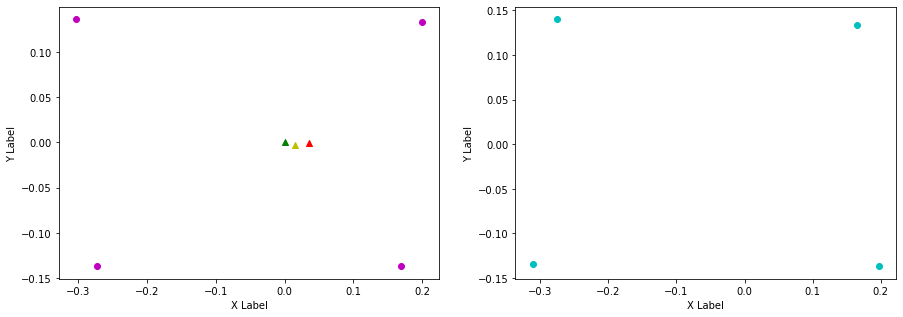

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.134, 0.136.
FL displacement: 0.032, 0.0020000000000000018.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.139.
RR displacement: 0.03699999999999998, -0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.08635756]. Velocity y: [0.02464791]. Angular -0.035084703334901
Odom velocity x: 0.0781804528887. Odom velocity y: 0.0115754094332. Odom velocity yaw: -0.283082336422
Base displacement (Odom): [[0.030225138432556253], [0.008626766367311745]]. Rotation displacement: -0.04664427462100208.



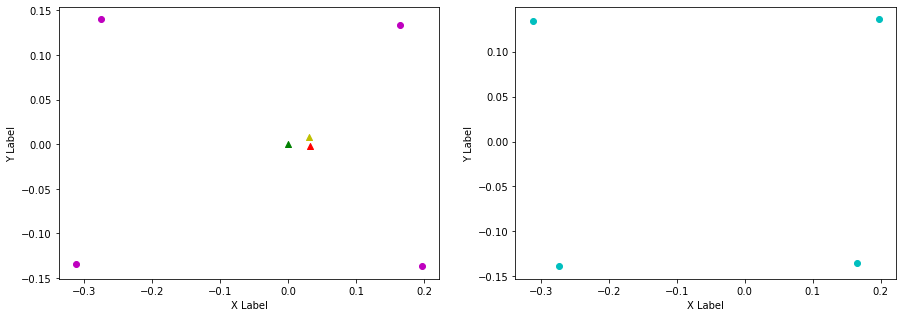

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.032, -0.0010000000000000009.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.308, RR (y): -0.139, -0.135.
RR displacement: -0.033999999999999975, 0.0040000000000000036.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.0788486]. Velocity y: [-0.0262]. Angular 0.03278468105656496
Odom velocity x: 0.0802592775901. Odom velocity y: -0.00797751780203. Odom velocity yaw: 0.239963657006
Base displacement (Odom): [[0.026808517741592208], [-0.008907999175305603]]. Rotation displacement: -0.7035717075873085.



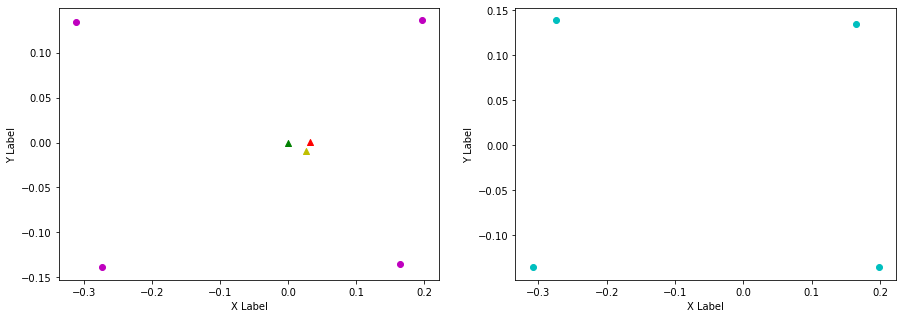

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.136.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.033999999999999975, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04388126]. Velocity y: [0.00883891]. Angular -0.05704707544942796
Odom velocity x: 0.0618128090855. Odom velocity y: -0.000282390971272. Odom velocity yaw: -0.287923890792
Base displacement (Odom): [[0.0136031995918251], [0.0027400641731714637]]. Rotation displacement: 0.6386639502296357.



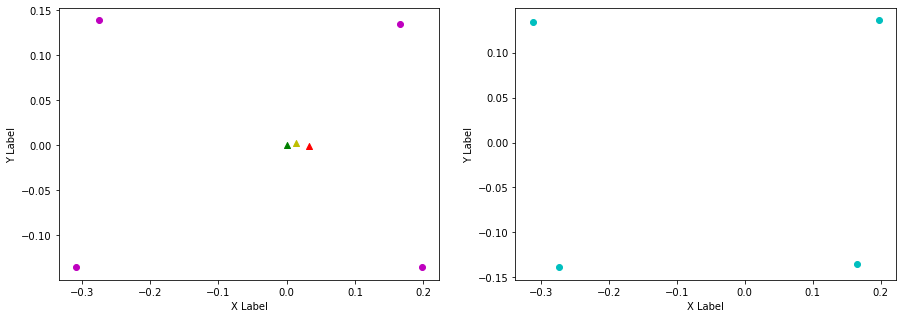

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.172, FL (y): 0.136, 0.137.
FL displacement: -0.025000000000000022, 0.0010000000000000009.

FR (x): 0.165, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.037000000000000005, 0.0010000000000000009.

RL (x): -0.312, -0.272, RL (y): 0.134, 0.138.
RL displacement: 0.03999999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.296, RR (y): -0.139, -0.137.
RR displacement: -0.021999999999999964, 0.0020000000000000018.


Base displacement (Foot): [0.025000000000000022, -0.0010000000000000009].

Velocity x: [0.0428476]. Velocity y: [-0.01697594]. Angular 0.003977056950185855
Odom velocity x: 0.0530779039983. Odom velocity y: -0.00847280227859. Odom velocity yaw: 0.200441353891
Base displacement (Odom): [[0.012854277303531614], [-0.005092782314725597]]. Rotation displacement: -1.0132531558694666.



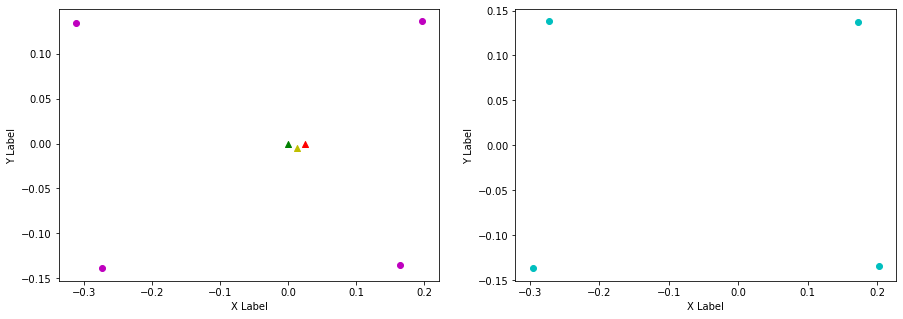

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.201, FL (y): 0.137, 0.132.
FL displacement: 0.029000000000000026, -0.0050000000000000044.

FR (x): 0.202, 0.175, FR (y): -0.134, -0.137.
FR displacement: -0.027000000000000024, -0.0030000000000000027.

RL (x): -0.272, -0.298, RL (y): 0.138, 0.136.
RL displacement: -0.025999999999999968, -0.0020000000000000018.

RR (x): -0.296, -0.273, RR (y): -0.137, -0.137.
RR displacement: 0.022999999999999965, 0.0.


Base displacement (Foot): [0.027000000000000024, 0.0030000000000000027].

Velocity x: [0.09602424]. Velocity y: [0.03358254]. Angular 0.010246005883588455
Odom velocity x: 0.0769162217284. Odom velocity y: 0.0142224500961. Odom velocity yaw: -0.268141238709
Base displacement (Odom): [[0.029767510130899844], [0.010410584235942155]]. Rotation displacement: 0.06836056257302559.



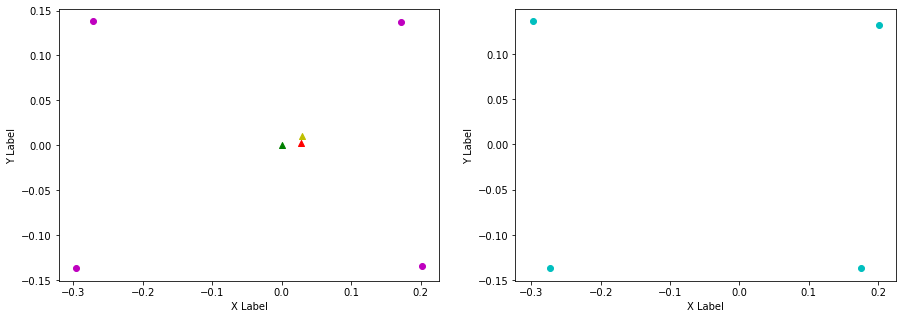

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.164, FL (y): 0.132, 0.135.
FL displacement: -0.037000000000000005, 0.0030000000000000027.

FR (x): 0.175, 0.197, FR (y): -0.137, -0.136.
FR displacement: 0.02200000000000002, 0.0010000000000000009.

RL (x): -0.298, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.023999999999999966, 0.0040000000000000036.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.037000000000000005, -0.0030000000000000027].

Velocity x: [0.04311481]. Velocity y: [-0.01188866]. Angular -0.003310232119381832
Odom velocity x: 0.0605611408667. Odom velocity y: 0.00240500817089. Odom velocity yaw: 0.243136298733
Base displacement (Odom): [[0.014227883939003316], [-0.003923257760241938]]. Rotation displacement: 0.18198636354727074.



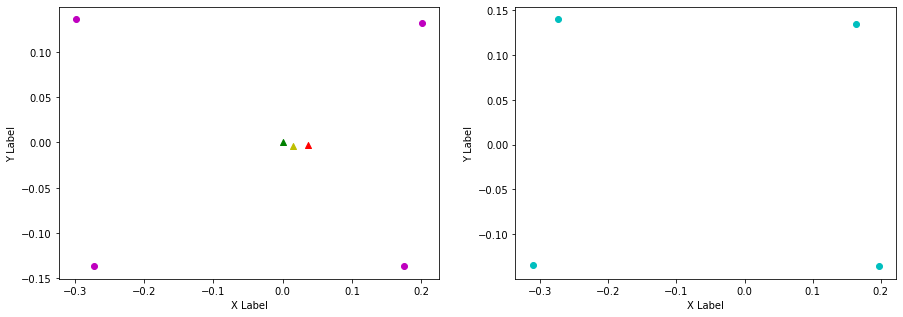

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04758515]. Velocity y: [0.00875653]. Angular -0.034226919792928905
Odom velocity x: 0.0546137802249. Odom velocity y: 0.00608414060641. Odom velocity yaw: -0.273892995105
Base displacement (Odom): [[0.0161789571095583], [0.0029772208374694853]]. Rotation displacement: -0.06258855431415673.



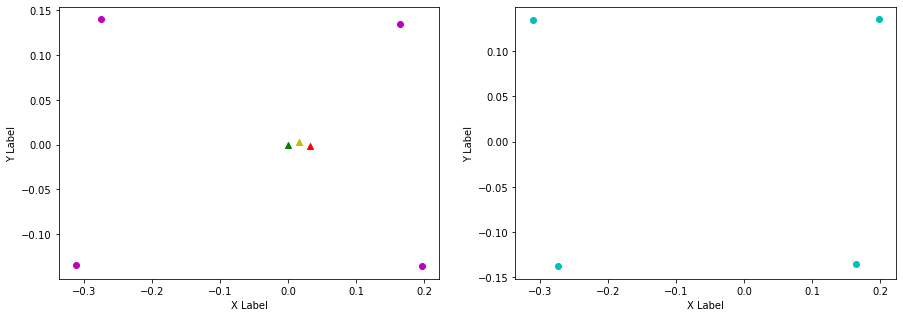

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.137.
FR displacement: 0.034, -0.0020000000000000018.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.05947911]. Velocity y: [-0.01601106]. Angular 0.029052975704310317
Odom velocity x: 0.0590897875522. Odom velocity y: -0.00647092985503. Odom velocity yaw: 0.229412963548
Base displacement (Odom): [[0.020222893615340798], [-0.005443760620943094]]. Rotation displacement: -0.6667600361886978.



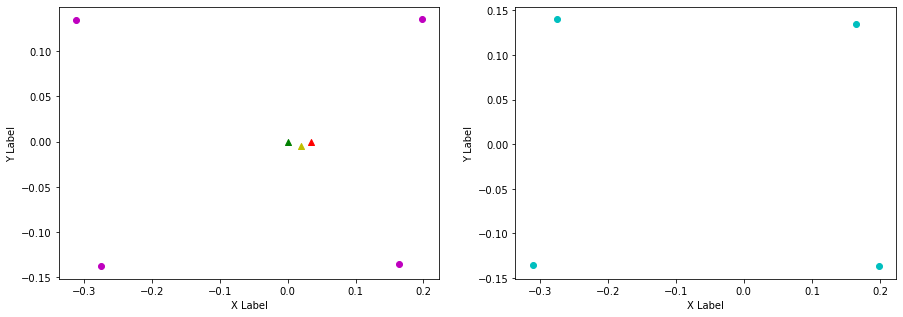

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.035, -0.0010000000000000009.

FR (x): 0.198, 0.166, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.274, -0.309, RL (y): 0.14, 0.135.
RL displacement: -0.034999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.08381228]. Velocity y: [0.03475472]. Angular -0.024239913189455856
Odom velocity x: 0.0752450124745. Odom velocity y: 0.0160123895527. Odom velocity yaw: -0.2653085138
Base displacement (Odom): [[0.025143679110697814], [0.010426414093697156]]. Rotation displacement: 0.5659682397771841.



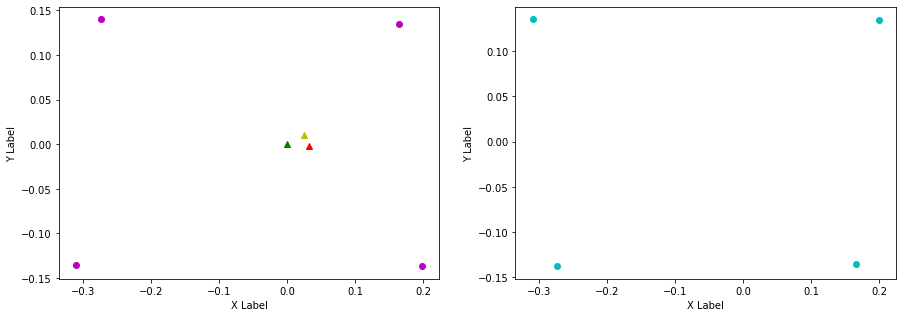

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.166, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.032, -0.0010000000000000009.

RL (x): -0.309, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.034999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.09024401]. Velocity y: [-0.0266347]. Angular -0.0026589495436953902
Odom velocity x: 0.0899909871501. Odom velocity y: -0.0073770533555. Odom velocity yaw: 0.230117711014
Base displacement (Odom): [[0.03248785559620959], [-0.009588494188482954]]. Rotation displacement: -0.41665335023051864.



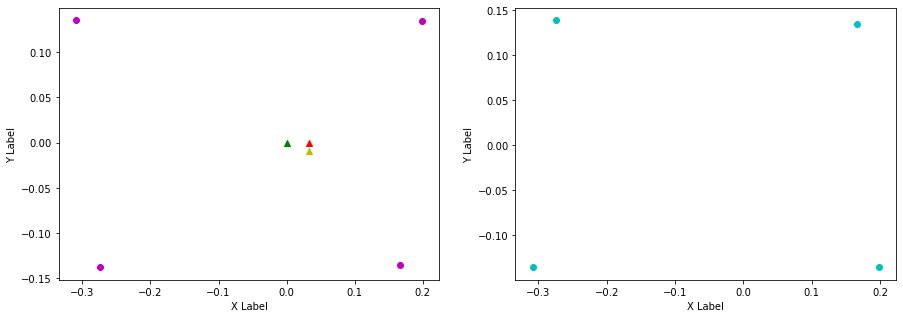

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.198, 0.167, FR (y): -0.136, -0.135.
FR displacement: -0.031, 0.0010000000000000009.

RL (x): -0.274, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.032999999999999974, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.033999999999999975, -0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0010000000000000009].

Velocity x: [0.05988154]. Velocity y: [0.02240256]. Angular -0.0380951195777547
Odom velocity x: 0.0775650560839. Odom velocity y: 0.00889994491085. Odom velocity yaw: -0.291886533177
Base displacement (Odom): [[0.0203597180019508], [0.0076168673945630205]]. Rotation displacement: -0.05484479158557728.



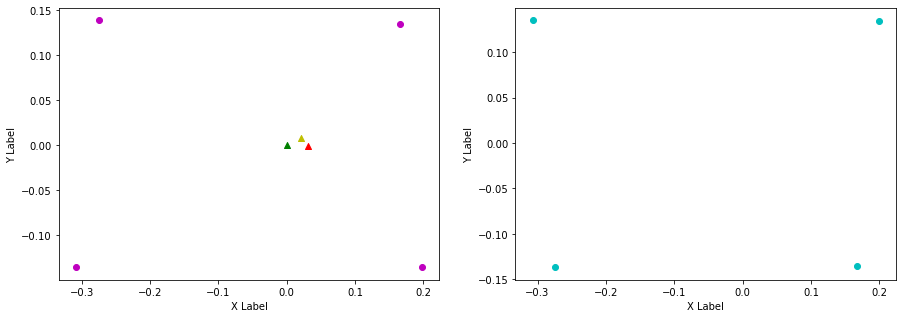

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.167, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.032, -0.0010000000000000009.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.032999999999999974, 0.0040000000000000036.

RR (x): -0.274, -0.307, RR (y): -0.137, -0.135.
RR displacement: -0.032999999999999974, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.02764776]. Velocity y: [-0.01477909]. Angular 0.033652260171637395
Odom velocity x: 0.0502129877814. Odom velocity y: -0.00184864168142. Odom velocity yaw: 0.236274918425
Base displacement (Odom): [[0.008294326406772079], [-0.004433726644410052]]. Rotation displacement: -0.7421142670877746.



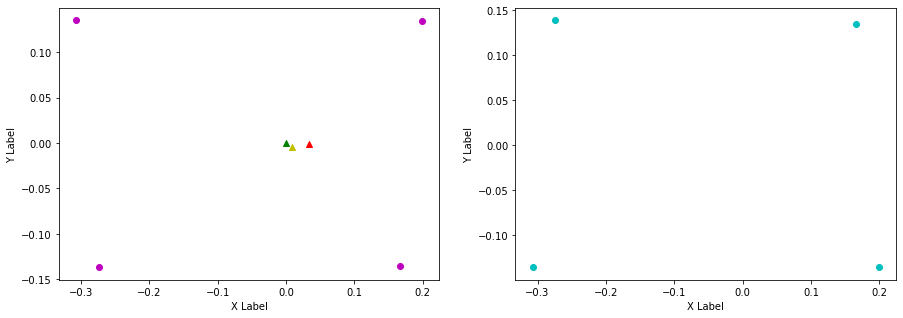

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.199, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.035, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.307, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.032999999999999974, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.04324172]. Velocity y: [0.02047134]. Angular -0.023864723497564456
Odom velocity x: 0.0467545844835. Odom velocity y: 0.0102405727368. Odom velocity yaw: -0.268345886553
Base displacement (Odom): [[0.012972523638603128], [0.0061414067086549284]]. Rotation displacement: 0.5784396517327842.



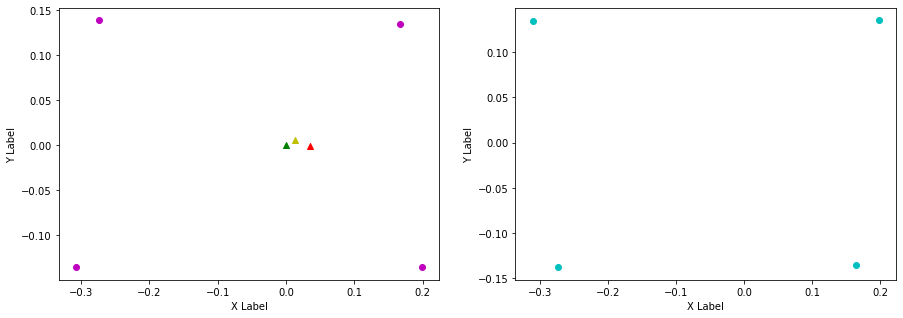

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.169, FL (y): 0.135, 0.136.
FL displacement: -0.028999999999999998, 0.0010000000000000009.

FR (x): 0.164, 0.201, FR (y): -0.135, -0.135.
FR displacement: 0.037000000000000005, 0.0.

RL (x): -0.311, -0.273, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.302, RR (y): -0.138, -0.136.
RR displacement: -0.02799999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.028999999999999998, -0.0010000000000000009].

Velocity x: [0.05484338]. Velocity y: [-0.01042167]. Angular -0.0295762307322818
Odom velocity x: 0.0521939640385. Odom velocity y: 0.000634081713055. Odom velocity yaw: 0.163242843355
Base displacement (Odom): [[0.016453010305403026], [-0.0031264992779379552]]. Rotation displacement: -0.4102046414980599.



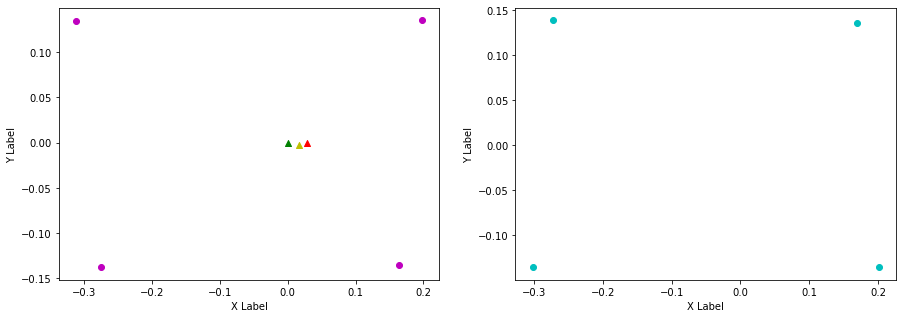

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.2, FL (y): 0.136, 0.134.
FL displacement: 0.031, -0.0020000000000000018.

FR (x): 0.201, 0.167, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.273, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.033999999999999975, -0.0040000000000000036.

RR (x): -0.302, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02799999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.0533077]. Velocity y: [0.01771842]. Angular 0.02170391352308917
Odom velocity x: 0.0538691998363. Odom velocity y: 0.0106228926613. Odom velocity yaw: -0.248599641613
Base displacement (Odom): [[0.018124614670891326], [0.006024260914605284]]. Rotation displacement: -0.5083778776549599.



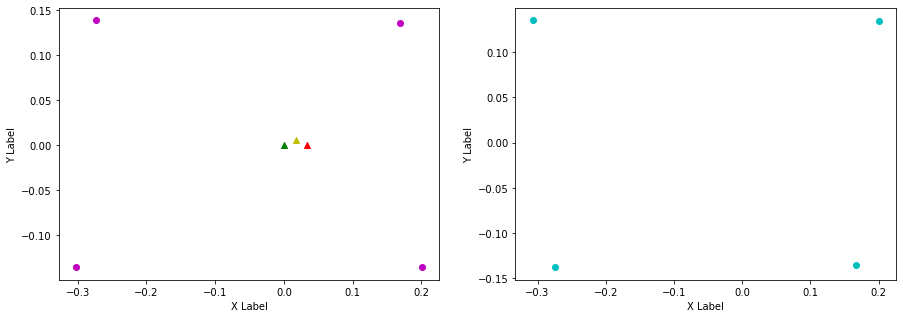

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.167, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.03, -0.0020000000000000018.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.032999999999999974, 0.0050000000000000044.

RR (x): -0.274, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.03699999999999998, 0.0040000000000000036.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.05418905]. Velocity y: [-0.01084828]. Angular -0.012788549229454457
Odom velocity x: 0.0569645193308. Odom velocity y: 0.000201786041526. Odom velocity yaw: 0.223896250003
Base displacement (Odom): [[0.018424271291960004], [-0.003688414274417573]]. Rotation displacement: 0.4228043921544525.



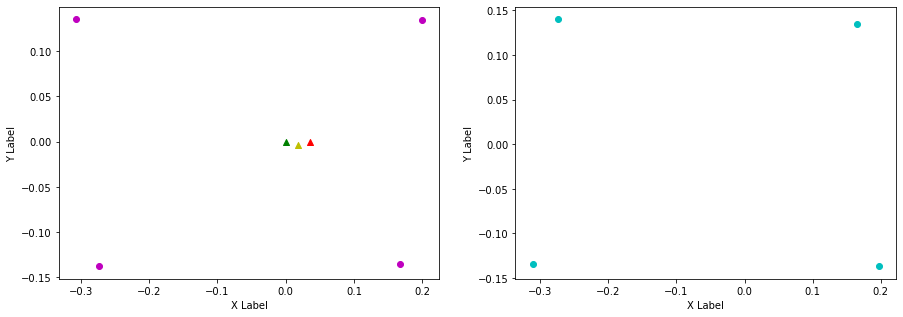

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.197, 0.169, FR (y): -0.137, -0.136.
FR displacement: -0.027999999999999997, 0.0010000000000000009.

RL (x): -0.274, -0.304, RL (y): 0.14, 0.135.
RL displacement: -0.02999999999999997, -0.0050000000000000044.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.027999999999999997, -0.0010000000000000009].

Velocity x: [0.02563747]. Velocity y: [0.00317682]. Angular 0.007359460042085623
Odom velocity x: 0.0406555754822. Odom velocity y: 0.0011873668856. Odom velocity yaw: -0.221177199022
Base displacement (Odom): [[0.007691244854275414], [0.0009530475388561666]]. Rotation displacement: -0.24912810206991573.



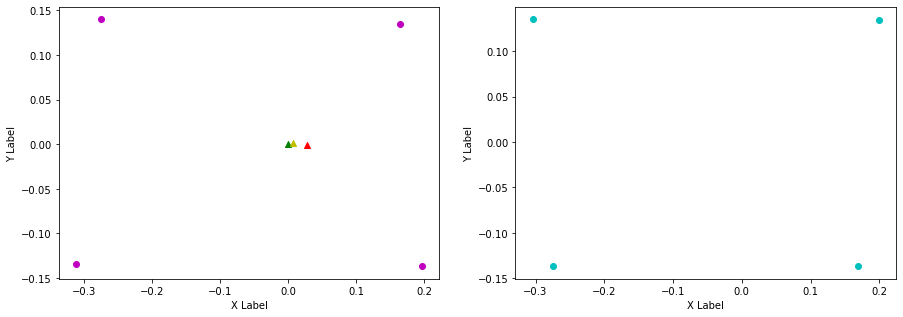

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.169, 0.199, FR (y): -0.136, -0.136.
FR displacement: 0.03, 0.0.

RL (x): -0.304, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.02999999999999997, 0.0040000000000000036.

RR (x): -0.274, -0.308, RR (y): -0.137, -0.135.
RR displacement: -0.033999999999999975, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.05730876]. Velocity y: [-0.01467799]. Angular -0.017894575425760118
Odom velocity x: 0.046962434328. Odom velocity y: -0.0073282979292. Odom velocity yaw: 0.215894076687
Base displacement (Odom): [[0.019484975167702423], [-0.004990516808297263]]. Rotation displacement: 0.12649988039841006.



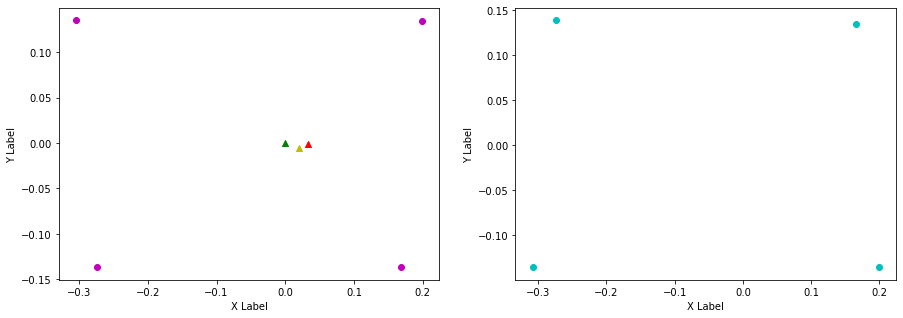

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.199, 0.166, FR (y): -0.136, -0.136.
FR displacement: -0.033, 0.0.

RL (x): -0.274, -0.308, RL (y): 0.139, 0.135.
RL displacement: -0.033999999999999975, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.07213016]. Velocity y: [0.0162172]. Angular 0.000769300302829074
Odom velocity x: 0.0634478131691. Odom velocity y: 0.00430683976837. Odom velocity yaw: -0.19318787819
Base displacement (Odom): [[0.022360346109983276], [0.005027330197864832]]. Rotation displacement: -0.3485963523445534.



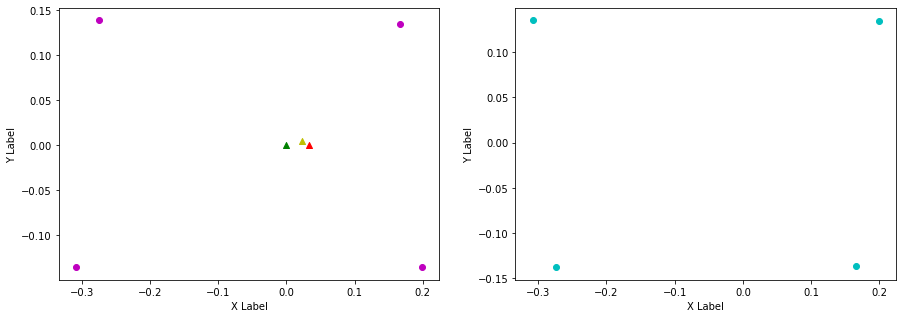

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.166, 0.2, FR (y): -0.136, -0.135.
FR displacement: 0.034, 0.0010000000000000009.

RL (x): -0.308, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.033999999999999975, 0.0040000000000000036.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.04239813]. Velocity y: [-0.01093499]. Angular -0.033963009139448004
Odom velocity x: 0.0543753596683. Odom velocity y: -0.0037602134755. Odom velocity yaw: 0.20143460963
Base displacement (Odom): [[0.014415369655972565], [-0.003717899727144869]]. Rotation displacement: 0.01366407224223108.



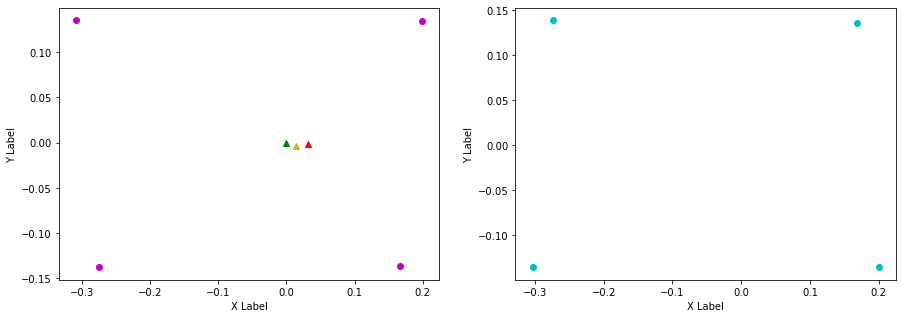

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.197, FL (y): 0.136, 0.135.
FL displacement: 0.028999999999999998, -0.0010000000000000009.

FR (x): 0.2, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.036000000000000004, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.303, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.02799999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0].

Velocity x: [0.08615526]. Velocity y: [0.02844311]. Angular -0.023760542412400835
Odom velocity x: 0.0763398017096. Odom velocity y: 0.0155051515681. Odom velocity yaw: -0.294978393756
Base displacement (Odom): [[0.033600539347800495], [0.011092809995636443]]. Rotation displacement: -0.6616189052330032.



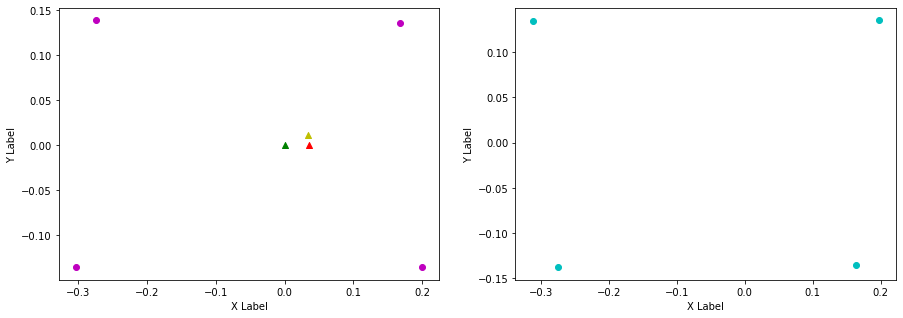

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.035, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.05284185]. Velocity y: [-0.02292113]. Angular 0.03461690185647668
Odom velocity x: 0.0720405583503. Odom velocity y: -0.00255259077165. Odom velocity yaw: 0.239312655844
Base displacement (Odom): [[0.015852551906982537], [-0.0068763366647263124]]. Rotation displacement: -0.5309375499134628.



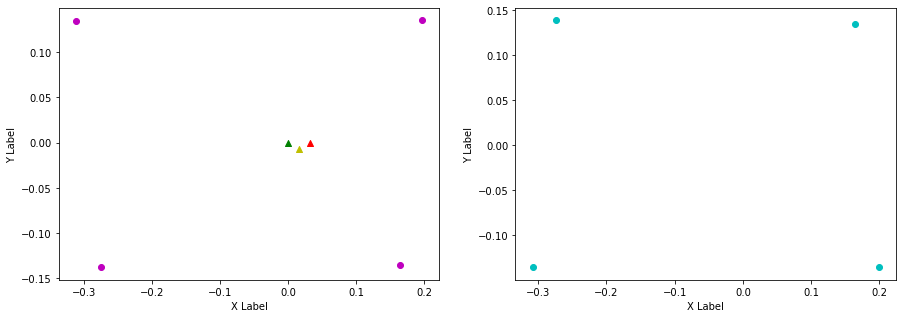

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.199, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.309, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04149357]. Velocity y: [0.01460141]. Angular -0.006053382220877306
Odom velocity x: 0.0585658189845. Odom velocity y: 0.00553956828059. Odom velocity yaw: -0.233129093216
Base displacement (Odom): [[0.012448077602121632], [0.004380426169381169]]. Rotation displacement: 0.595020618282414.



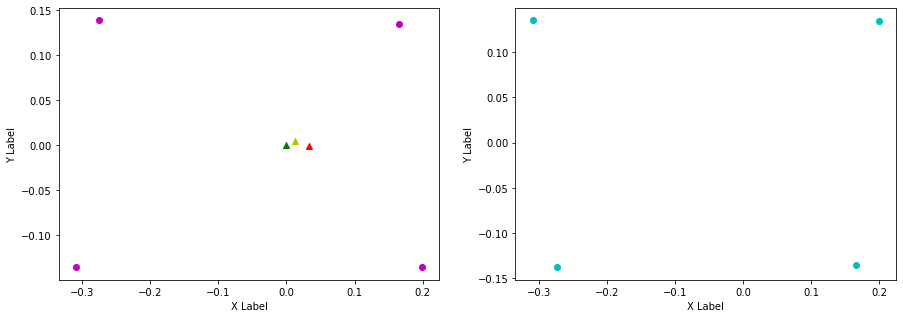

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.166, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.034, 0.0.

RL (x): -0.309, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.034999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.304, RR (y): -0.138, -0.136.
RR displacement: -0.02999999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.08322216]. Velocity y: [-0.02373936]. Angular -0.012980531877855594
Odom velocity x: 0.0775695449965. Odom velocity y: -0.0108906642634. Odom velocity yaw: 0.225266654163
Base displacement (Odom): [[0.028295526328268927], [-0.00807138091245263]]. Rotation displacement: -0.10405004206393272.



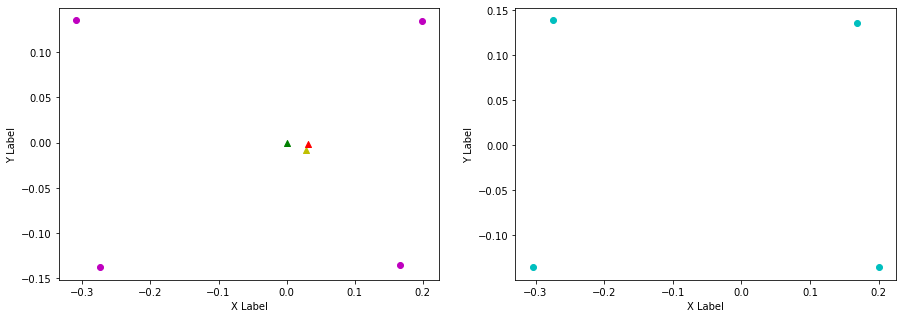

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.31, RL (y): 0.139, 0.134.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.304, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.02999999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.05962922]. Velocity y: [0.02618394]. Angular -0.009501389124768632
Odom velocity x: 0.0695390920162. Odom velocity y: 0.00706001689281. Odom velocity yaw: -0.264579183948
Base displacement (Odom): [[0.017888763893412207], [0.007855181916159526]]. Rotation displacement: -0.25286803159345966.



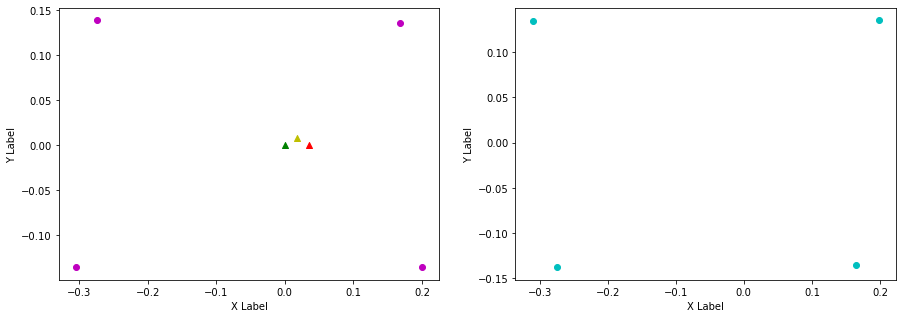

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.167, FL (y): 0.135, 0.136.
FL displacement: -0.031, 0.0010000000000000009.

FR (x): 0.165, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.31, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.274, -0.305, RR (y): -0.138, -0.135.
RR displacement: -0.030999999999999972, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0010000000000000009].

Velocity x: [0.05078902]. Velocity y: [-0.02197362]. Angular -0.03174127157703445
Odom velocity x: 0.0623406921259. Odom velocity y: -0.00736021298357. Odom velocity yaw: 0.170968940398
Base displacement (Odom): [[0.015236704077273622], [-0.0065920836490711565]]. Rotation displacement: -0.16331682294970848.



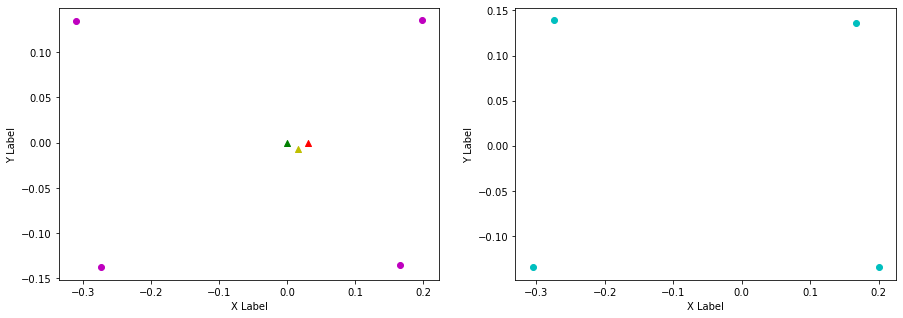

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.032, -0.0020000000000000018.

FR (x): 0.2, 0.168, FR (y): -0.135, -0.136.
FR displacement: -0.032, -0.0010000000000000009.

RL (x): -0.274, -0.306, RL (y): 0.139, 0.135.
RL displacement: -0.03199999999999997, -0.0040000000000000036.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.030999999999999972, -0.0020000000000000018.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.0455332]. Velocity y: [0.01174298]. Angular 0.02702539414206164
Odom velocity x: 0.0528825353212. Odom velocity y: 0.00231363209637. Odom velocity yaw: -0.224524179978
Base displacement (Odom): [[0.0154812943923619], [0.003992615500672425]]. Rotation displacement: -0.545592182603234.



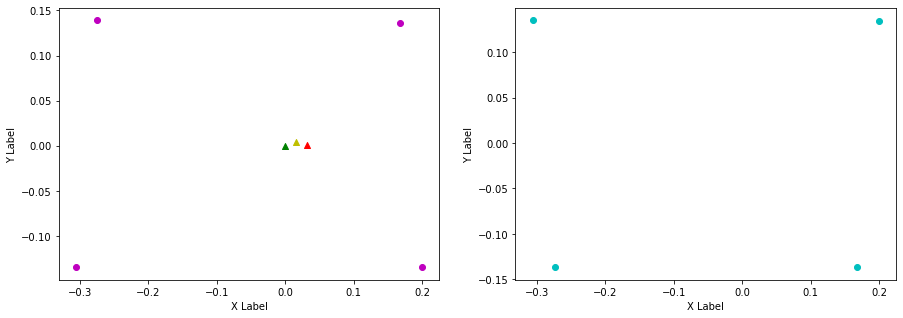

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.168, 0.199, FR (y): -0.136, -0.134.
FR displacement: 0.031, 0.0020000000000000018.

RL (x): -0.306, -0.274, RL (y): 0.135, 0.138.
RL displacement: 0.03199999999999997, 0.0030000000000000027.

RR (x): -0.274, -0.303, RR (y): -0.137, -0.136.
RR displacement: -0.02899999999999997, 0.0010000000000000009.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.08373796]. Velocity y: [-0.02073056]. Angular -0.023158319907056295
Odom velocity x: 0.0756770747209. Odom velocity y: -0.0102572811425. Odom velocity yaw: 0.223566585167
Base displacement (Odom): [[0.029308276664805177], [-0.007255695637480519]]. Rotation displacement: 0.5264701844393711.



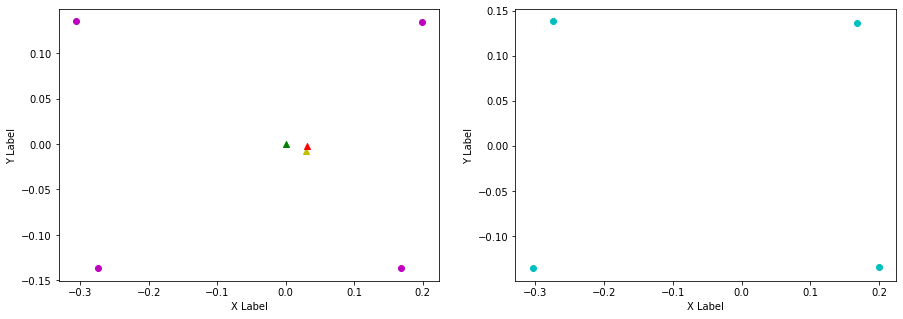

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.2, FL (y): 0.136, 0.134.
FL displacement: 0.032, -0.0020000000000000018.

FR (x): 0.199, 0.168, FR (y): -0.134, -0.136.
FR displacement: -0.031, -0.0020000000000000018.

RL (x): -0.274, -0.305, RL (y): 0.138, 0.135.
RL displacement: -0.030999999999999972, -0.0030000000000000027.

RR (x): -0.303, -0.274, RR (y): -0.136, -0.137.
RR displacement: 0.02899999999999997, -0.0010000000000000009.


Base displacement (Foot): [0.031, 0.0020000000000000018].

Velocity x: [0.02867415]. Velocity y: [0.0028703]. Angular 0.015030455777048682
Odom velocity x: 0.0520570615678. Odom velocity y: -0.00511938174281. Odom velocity yaw: -0.176884771683
Base displacement (Odom): [[0.008602243675785548], [0.000861089497807388]]. Rotation displacement: -0.46440577041027825.



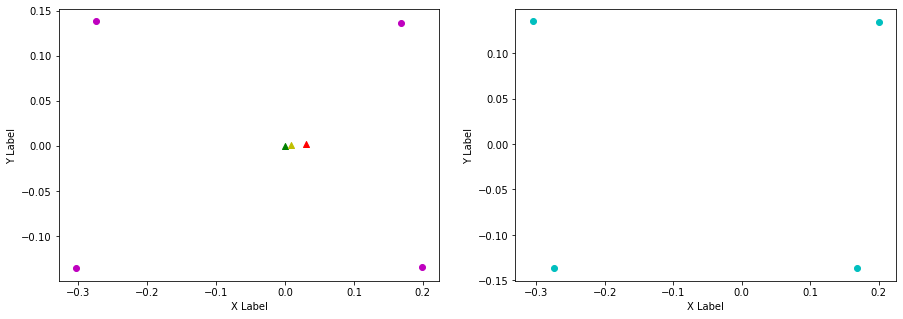

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.035, 0.0010000000000000009.

FR (x): 0.168, 0.198, FR (y): -0.136, -0.136.
FR displacement: 0.03, 0.0.

RL (x): -0.305, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.02999999999999997, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.035999999999999976, 0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0010000000000000009].

Velocity x: [0.06295076]. Velocity y: [-0.0125065]. Angular -0.006594590903892313
Odom velocity x: 0.0611551391173. Odom velocity y: -0.00945421944672. Odom velocity yaw: 0.23097489088
Base displacement (Odom): [[0.02329178817067845], [-0.00462740627703051]]. Rotation displacement: 0.2583544629905322.



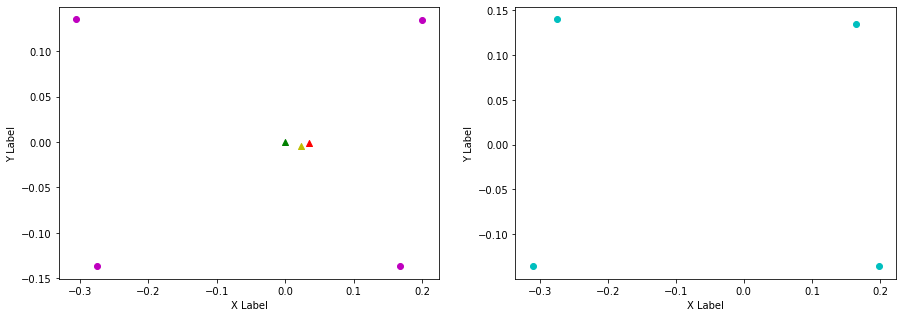

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.136.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.07807836]. Velocity y: [0.02439987]. Angular -0.02322547581347021
Odom velocity x: 0.0747973634501. Odom velocity y: 0.00761494023516. Odom velocity yaw: -0.260020605921
Base displacement (Odom): [[0.024204287149327985], [0.007563958855023367]]. Rotation displacement: -0.13980167061510065.



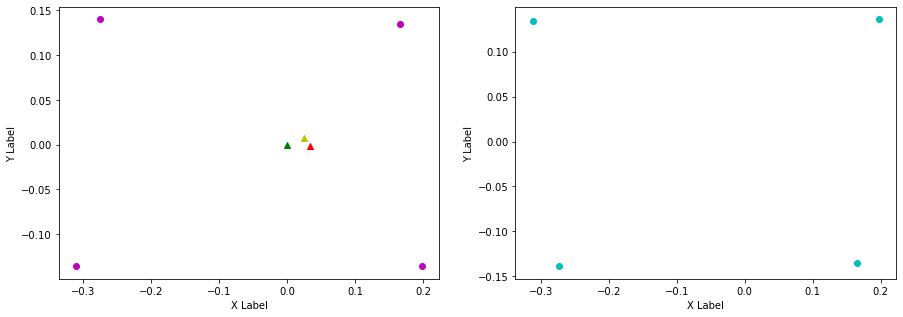

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.032, -0.0010000000000000009.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.309, RR (y): -0.139, -0.135.
RR displacement: -0.034999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.05365258]. Velocity y: [-0.01928524]. Angular 0.012908499633549581
Odom velocity x: 0.0652696019954. Odom velocity y: -0.00619732434304. Odom velocity yaw: 0.236828475073
Base displacement (Odom): [[0.018778399458002415], [-0.006749830721537453]]. Rotation displacement: -0.412523663656946.



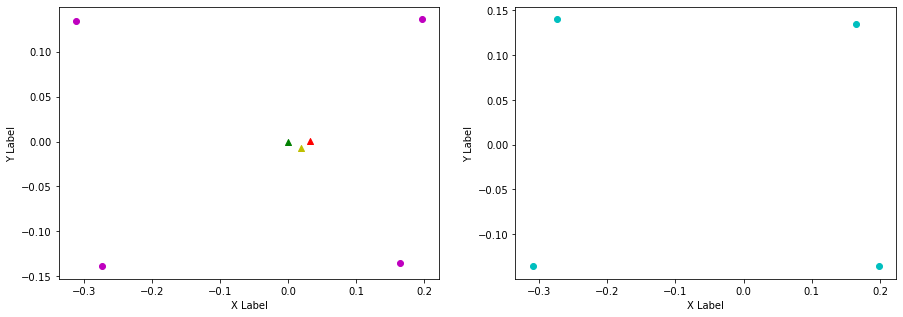

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03799999999999998, -0.006000000000000005.

RR (x): -0.309, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.0367155]. Velocity y: [0.00977092]. Angular -0.042235664271713394
Odom velocity x: 0.0502845766221. Odom velocity y: 0.000918587245408. Odom velocity yaw: -0.275697105602
Base displacement (Odom): [[0.011014655885133173], [0.0029312792807851817]]. Rotation displacement: 0.2588608215630007.



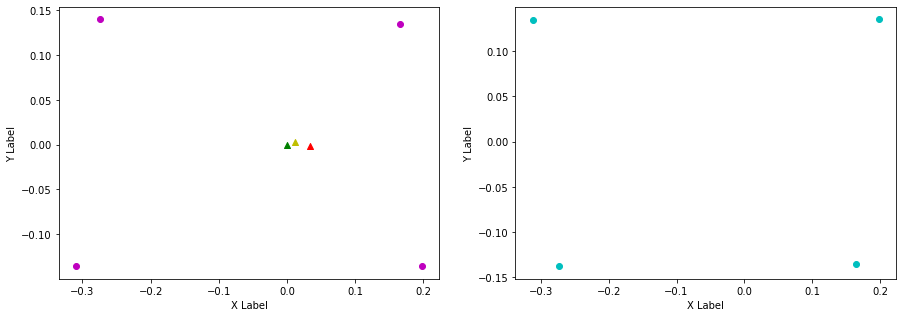

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.0433025]. Velocity y: [-0.01206547]. Angular 0.0022030708328631024
Odom velocity x: 0.0497398091774. Odom velocity y: -0.00597683424293. Odom velocity yaw: 0.23362180707
Base displacement (Odom): [[0.014722847737710598], [-0.0041022570796858115]]. Rotation displacement: -0.7259780538743206.



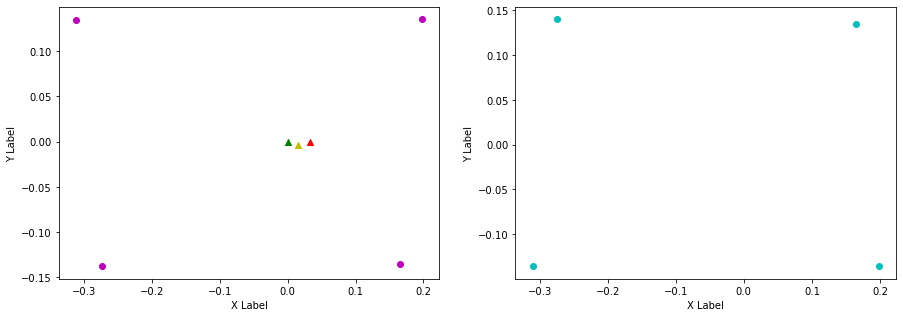

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.136.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03799999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.03960429]. Velocity y: [0.00902863]. Angular -0.039632178589945825
Odom velocity x: 0.0422552158133. Odom velocity y: 0.00216154353487. Odom velocity yaw: -0.292397837507
Base displacement (Odom): [[0.01386149744576759], [0.0031600195845766788]]. Rotation displacement: 0.04291705380096397.



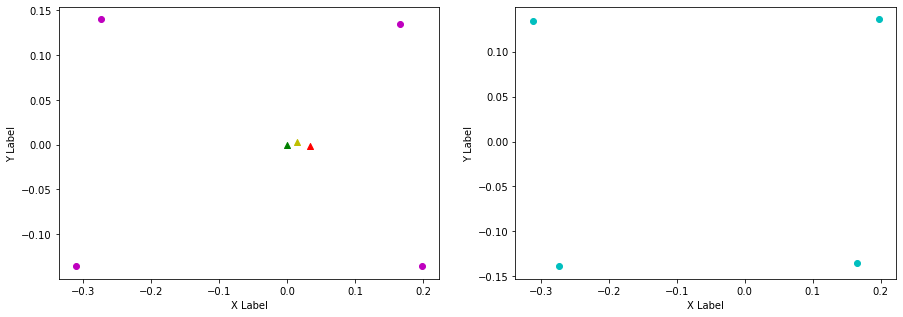

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.175, FL (y): 0.136, 0.138.
FL displacement: -0.02200000000000002, 0.0020000000000000018.

FR (x): 0.165, 0.204, FR (y): -0.135, -0.133.
FR displacement: 0.03899999999999998, 0.0020000000000000018.

RL (x): -0.312, -0.271, RL (y): 0.134, 0.138.
RL displacement: 0.04099999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.293, RR (y): -0.139, -0.138.
RR displacement: -0.01899999999999996, 0.0010000000000000009.


Base displacement (Foot): [0.02200000000000002, -0.0020000000000000018].

Velocity x: [0.06272985]. Velocity y: [-0.02743357]. Angular -0.011452662780769618
Odom velocity x: 0.0516713948476. Odom velocity y: -0.0105722039433. Odom velocity yaw: 0.109020356327
Base displacement (Odom): [[0.015682461264103775], [-0.006858392374082478]]. Rotation displacement: -0.7947645815832016.



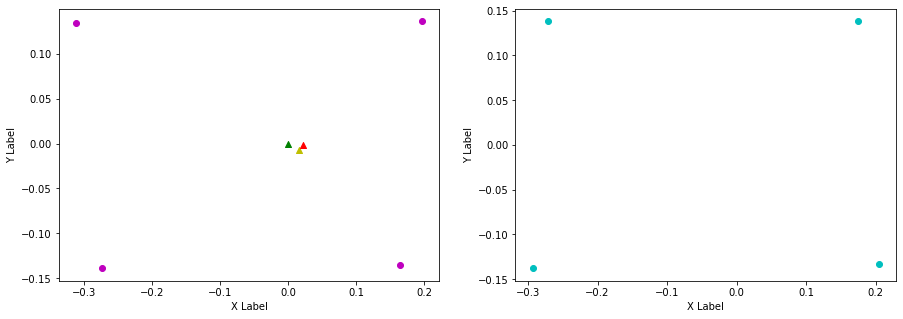

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.175, 0.197, FL (y): 0.138, 0.135.
FL displacement: 0.02200000000000002, -0.0030000000000000027.

FR (x): 0.204, 0.164, FR (y): -0.133, -0.135.
FR displacement: -0.03999999999999998, -0.0020000000000000018.

RL (x): -0.271, -0.312, RL (y): 0.138, 0.134.
RL displacement: -0.04099999999999998, -0.0040000000000000036.

RR (x): -0.293, -0.274, RR (y): -0.138, -0.138.
RR displacement: 0.01899999999999996, 0.0.


Base displacement (Foot): [0.03999999999999998, 0.0020000000000000018].

Velocity x: [0.08923675]. Velocity y: [0.02788142]. Angular 0.0021512082072243023
Odom velocity x: 0.0765315620241. Odom velocity y: 0.0120090701562. Odom velocity yaw: -0.297153985215
Base displacement (Odom): [[0.03480234035210117], [0.010873758023105418]]. Rotation displacement: -0.16404731038116507.



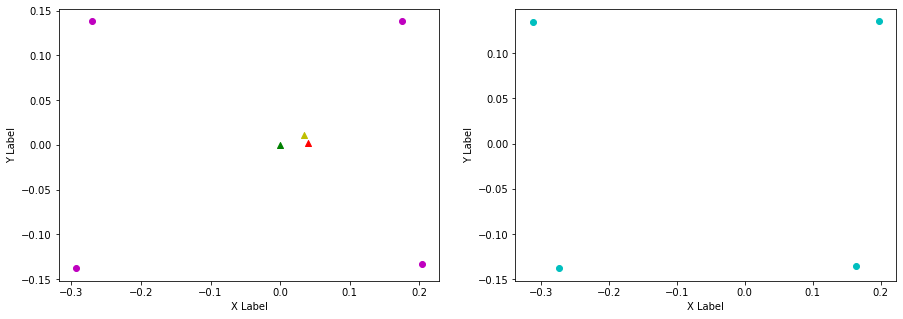

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.04575408]. Velocity y: [-0.01306151]. Angular 0.017578160092397717
Odom velocity x: 0.0662028402777. Odom velocity y: 0.00152374728244. Odom velocity yaw: 0.22884874732
Base displacement (Odom): [[0.01372622267187884], [-0.003918452947859086]]. Rotation displacement: 0.04806952186984405.



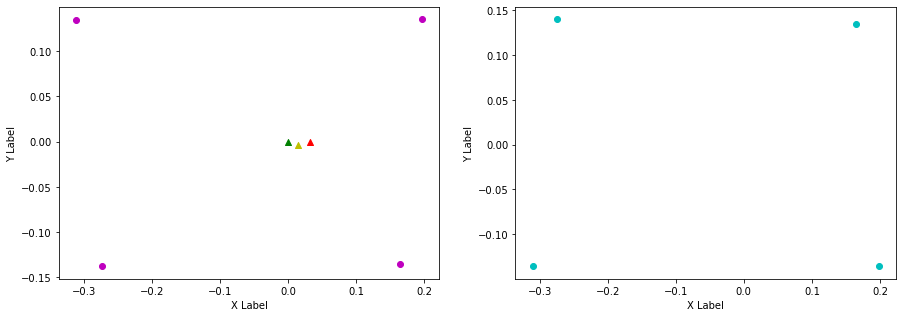

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03799999999999998, -0.006000000000000005.

RR (x): -0.31, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.06068827]. Velocity y: [0.01802723]. Angular -0.024636366254547827
Odom velocity x: 0.0632194138732. Odom velocity y: 0.0103841357016. Odom velocity yaw: -0.291988682506
Base displacement (Odom): [[0.02002712310458188], [0.00594898433780755]]. Rotation displacement: 0.30214626744504125.



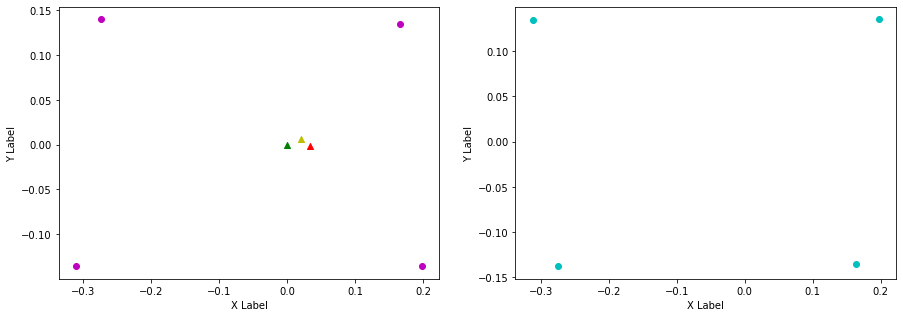

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.169, FL (y): 0.135, 0.136.
FL displacement: -0.027999999999999997, 0.0010000000000000009.

FR (x): 0.164, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.036000000000000004, 0.0.

RL (x): -0.312, -0.273, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.302, RR (y): -0.138, -0.136.
RR displacement: -0.02699999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.027999999999999997, -0.0010000000000000009].

Velocity x: [0.00969208]. Velocity y: [-0.01133261]. Angular 0.0041316809985671886
Odom velocity x: 0.0353177236164. Odom velocity y: 0.000422801346582. Odom velocity yaw: 0.219844676641
Base displacement (Odom): [[0.003004546921196116], [-0.0035131119227516105]]. Rotation displacement: -0.4658146292514908.



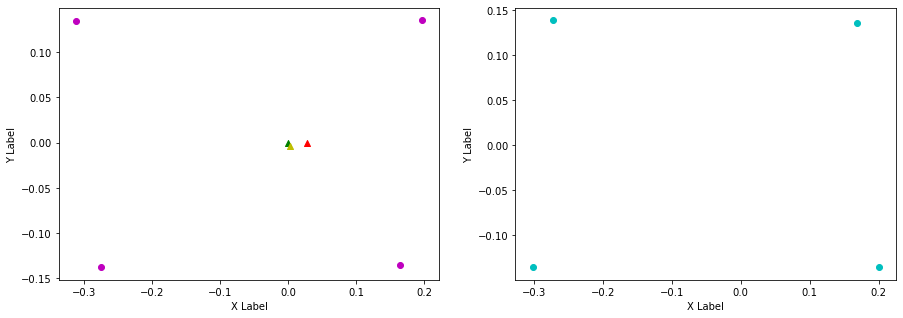

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.027999999999999997, 0.0.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.273, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03899999999999998, -0.0050000000000000044.

RR (x): -0.302, -0.274, RR (y): -0.136, -0.139.
RR displacement: 0.02799999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.03282517]. Velocity y: [0.00366936]. Angular -0.006746428093248041
Odom velocity x: 0.0314703450082. Odom velocity y: 0.00184267294018. Odom velocity yaw: -0.267979603371
Base displacement (Odom): [[0.011488808112496418], [0.001284275306283278]]. Rotation displacement: 0.07338568678345968.



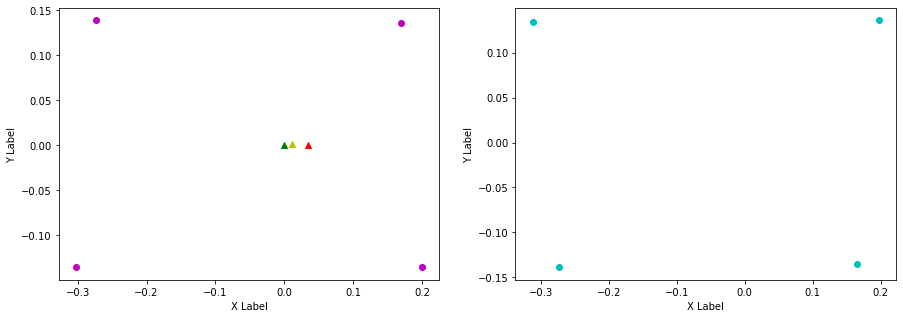

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.032, -0.0010000000000000009.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.03416493]. Velocity y: [-0.00967533]. Angular 0.016146702273842718
Odom velocity x: 0.0298521944378. Odom velocity y: -0.00431856266213. Odom velocity yaw: 0.232400553015
Base displacement (Odom): [[0.011616074690592004], [-0.003289610246621888]]. Rotation displacement: -0.13528961292255737.



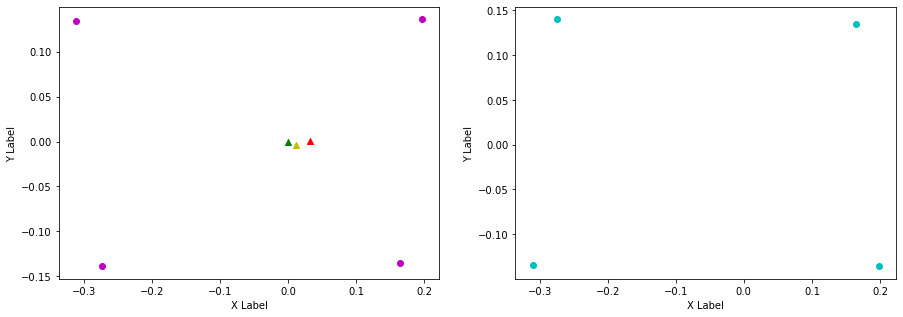

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.311, RL (y): 0.14, 0.135.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.275, RR (y): -0.134, -0.138.
RR displacement: 0.034999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.12449823]. Velocity y: [0.0315919]. Angular -0.04418536024934509
Odom velocity x: 0.0806173647903. Odom velocity y: 0.0144701688247. Odom velocity yaw: -0.284832784788
Base displacement (Odom): [[0.03859447331543908], [0.00979349493190862]]. Rotation displacement: 0.31454680433223997.



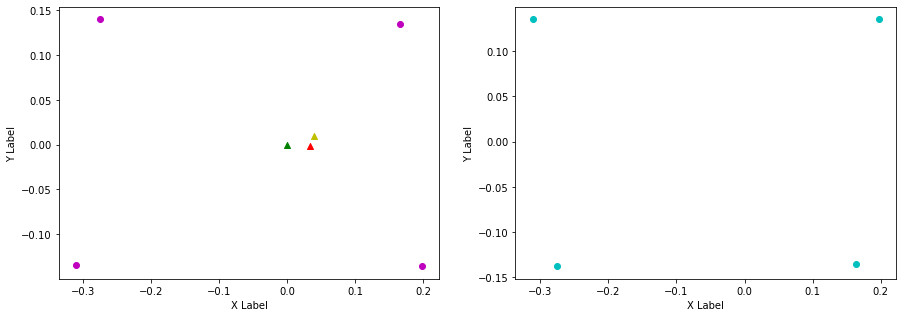

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.311, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.04169821]. Velocity y: [-0.00766005]. Angular 0.017954763241719962
Odom velocity x: 0.0631095648467. Odom velocity y: 0.00474496235435. Odom velocity yaw: 0.230724720272
Base displacement (Odom): [[0.01292644190349801], [-0.002374614076130821]]. Rotation displacement: -0.7848072028787435.



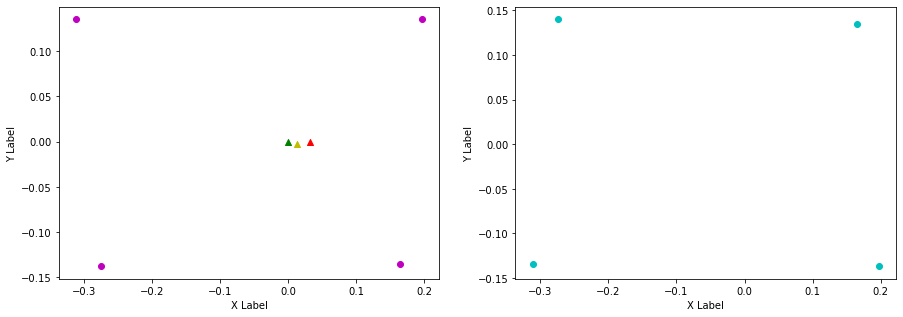

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.06897712]. Velocity y: [0.02139785]. Angular -0.019952091867218944
Odom velocity x: 0.0702315221572. Odom velocity y: 0.013888903615. Odom velocity yaw: -0.281515711918
Base displacement (Odom): [[0.022762443145943223], [0.007061289269655213]]. Rotation displacement: 0.31890690946670036.



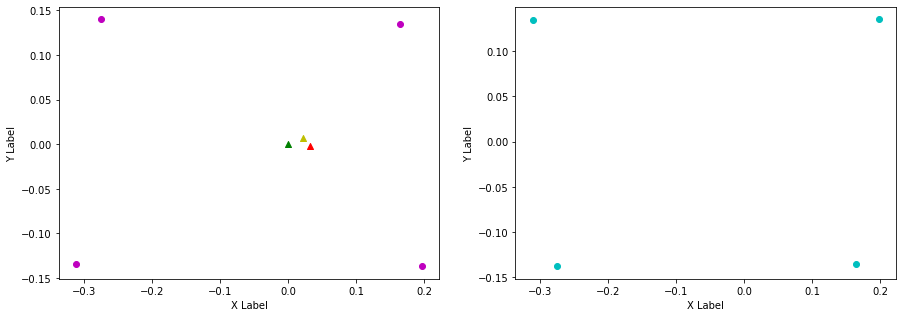

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.164, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.04897276]. Velocity y: [-0.01277144]. Angular 0.0033829959862048107
Odom velocity x: 0.0600732238076. Odom velocity y: 0.000420920570696. Odom velocity yaw: 0.236267195545
Base displacement (Odom): [[0.015671290575291597], [-0.004086861554847276]]. Rotation displacement: -0.3772462294111505.



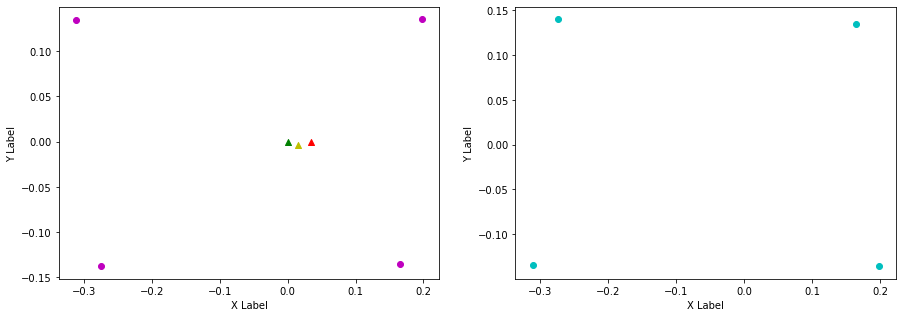

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.164, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.14, 0.135.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.09433596]. Velocity y: [0.0257679]. Angular -0.005217001577679605
Odom velocity x: 0.0844355312113. Odom velocity y: 0.0143832891669. Odom velocity yaw: -0.26244448997
Base displacement (Odom): [[0.030187501138700945], [0.008245725793050163]]. Rotation displacement: 0.062026078751518325.



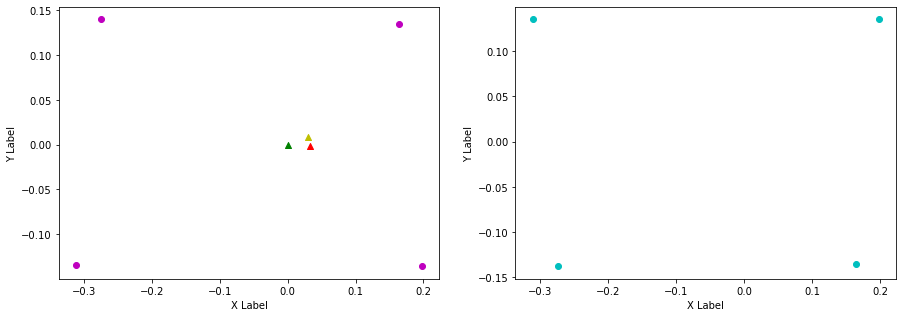

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.199, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.135, 0.139.
RL displacement: 0.035999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.04198126]. Velocity y: [-0.00863908]. Angular -0.002459513888467972
Odom velocity x: 0.0648002606301. Odom velocity y: 0.00290128222707. Odom velocity yaw: 0.228657356841
Base displacement (Odom): [[0.014693436277179117], [-0.0030236768476010756]]. Rotation displacement: -0.09565187512198235.



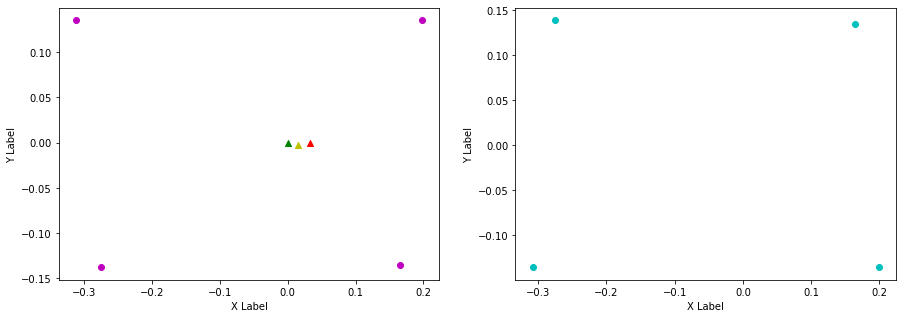

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.199, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.275, -0.31, RL (y): 0.139, 0.134.
RL displacement: -0.034999999999999976, -0.0050000000000000044.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.09640131]. Velocity y: [0.01862037]. Angular -0.006529526772957
Odom velocity x: 0.0862931790403. Odom velocity y: 0.0108548143527. Odom velocity yaw: -0.245853164528
Base displacement (Odom): [[0.028920388357672522], [0.005586110636756958]]. Rotation displacement: -0.049321904472902536.



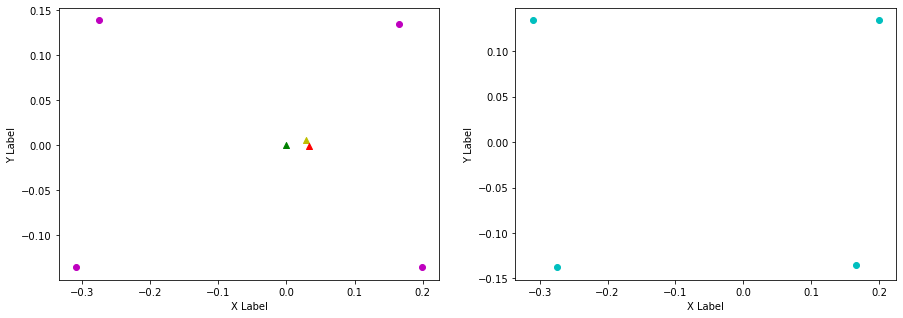

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.166, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.032, -0.0010000000000000009.

RL (x): -0.31, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.05055644]. Velocity y: [-0.00794536]. Angular -0.01306509289998773
Odom velocity x: 0.0708554143993. Odom velocity y: 0.00214378251799. Odom velocity yaw: 0.227831356963
Base displacement (Odom): [[0.017189198939340677], [-0.002701425069821739]]. Rotation displacement: -0.11223428005327245.



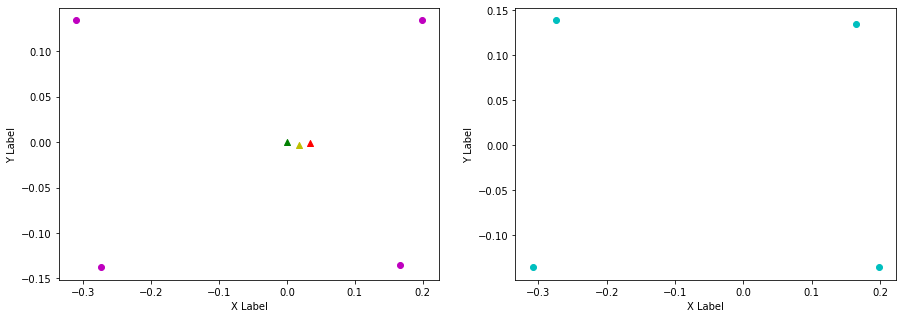

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.135.
FL displacement: 0.034, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.309, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.05317629]. Velocity y: [0.01131337]. Angular 0.0001524318097325168
Odom velocity x: 0.0649335973492. Odom velocity y: 0.00617724961733. Odom velocity yaw: -0.223009067253
Base displacement (Odom): [[0.015952883817597296], [0.003394010585678453]]. Rotation displacement: -0.2545155061427474.



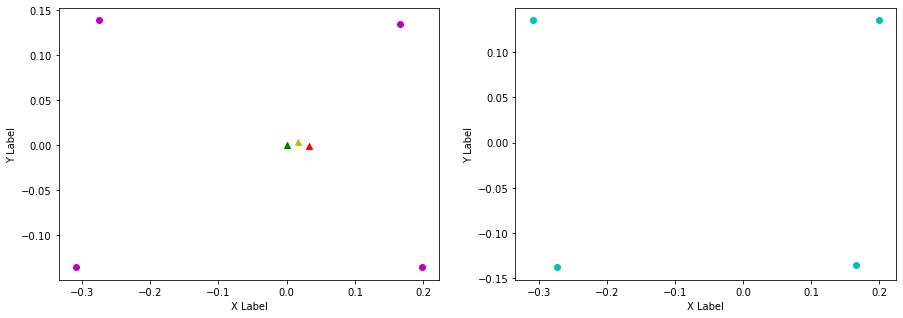

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.309, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.034999999999999976, 0.0040000000000000036.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.07793011]. Velocity y: [-0.02723054]. Angular -0.002419482540682084
Odom velocity x: 0.0775239701975. Odom velocity y: -0.0130840410432. Odom velocity yaw: 0.231803880364
Base displacement (Odom): [[0.0272755309128212], [-0.009530687015747219]]. Rotation displacement: 0.002620109391909081.



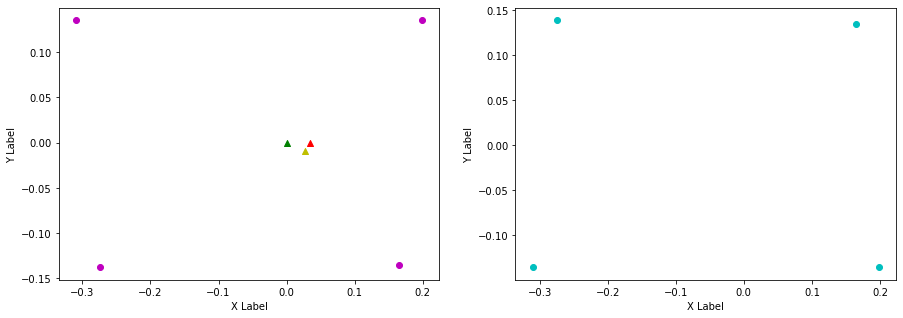

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.198, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.31, RL (y): 0.139, 0.134.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.04604899]. Velocity y: [0.01768376]. Angular -0.019992751942750225
Odom velocity x: 0.0631551204871. Odom velocity y: 0.0010418993624. Odom velocity yaw: -0.26220766022
Base displacement (Odom): [[0.014275196619775166], [0.005481967551410505]]. Rotation displacement: -0.04851913514491676.



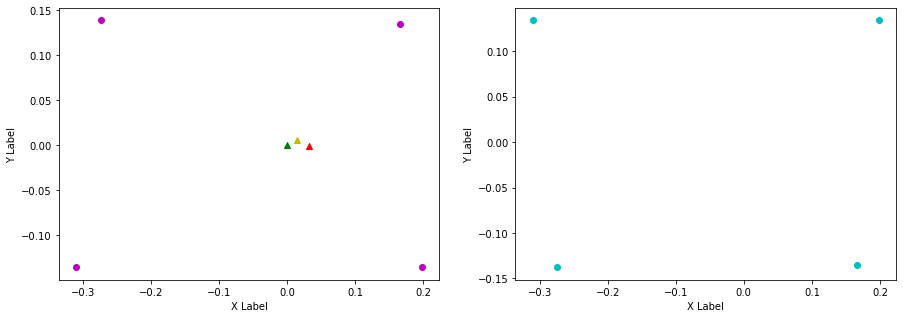

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.167, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.166, 0.199, FR (y): -0.135, -0.135.
FR displacement: 0.033, 0.0.

RL (x): -0.31, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.274, -0.305, RR (y): -0.138, -0.135.
RR displacement: -0.030999999999999972, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.02639082]. Velocity y: [-0.00679104]. Angular -0.0017138258711951058
Odom velocity x: 0.0425012457703. Odom velocity y: -0.00320529962859. Odom velocity yaw: 0.23431075452
Base displacement (Odom): [[0.008972875139858338], [-0.0023089513528905536]]. Rotation displacement: -0.3551053027856874.



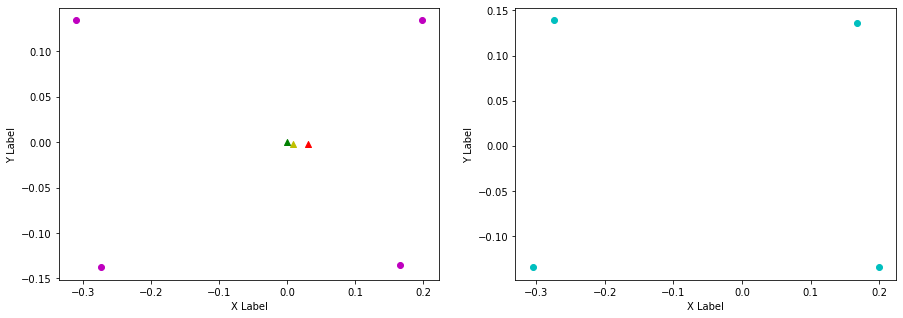

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.198, FL (y): 0.136, 0.134.
FL displacement: 0.031, -0.0020000000000000018.

FR (x): 0.199, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.305, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.02999999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.09838569]. Velocity y: [0.02841274]. Angular -0.006761263974175467
Odom velocity x: 0.0688005641835. Odom velocity y: 0.0131065035611. Odom velocity yaw: -0.271989763563
Base displacement (Odom): [[0.02853184558929378], [0.008239693309488594]]. Rotation displacement: -0.03338628791339221.



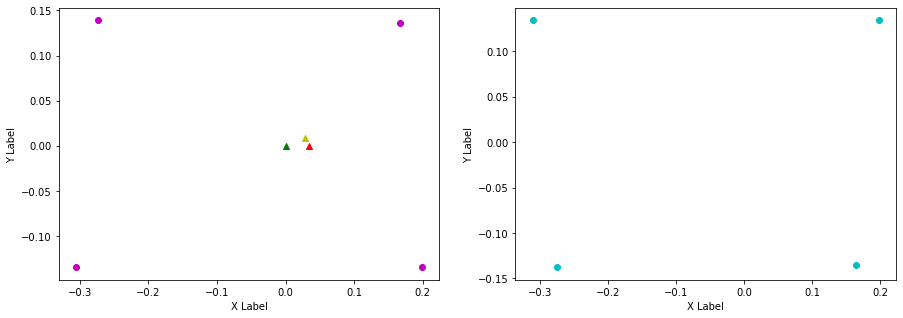

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.035999999999999976, 0.006000000000000005.

RR (x): -0.275, -0.31, RR (y): -0.138, -0.134.
RR displacement: -0.034999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04031685]. Velocity y: [-0.01122965]. Angular 0.010448109760688159
Odom velocity x: 0.0553594114892. Odom velocity y: 0.000277768166956. Odom velocity yaw: 0.240099492007
Base displacement (Odom): [[0.01572357607862962], [-0.004379566045751404]]. Rotation displacement: -0.11234363329146242.



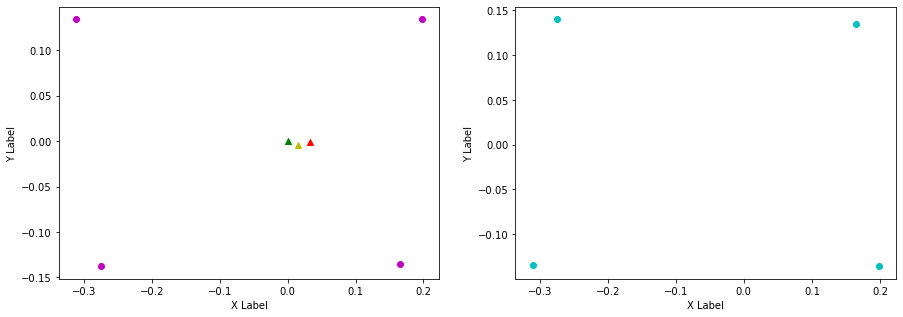

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.06654129]. Velocity y: [0.02863329]. Angular -0.040375563505036044
Odom velocity x: 0.0618767236257. Odom velocity y: 0.0142450031239. Odom velocity yaw: -0.283784303067
Base displacement (Odom): [[0.0199623827584392], [0.00858998643368647]]. Rotation displacement: 0.2334667741380383.



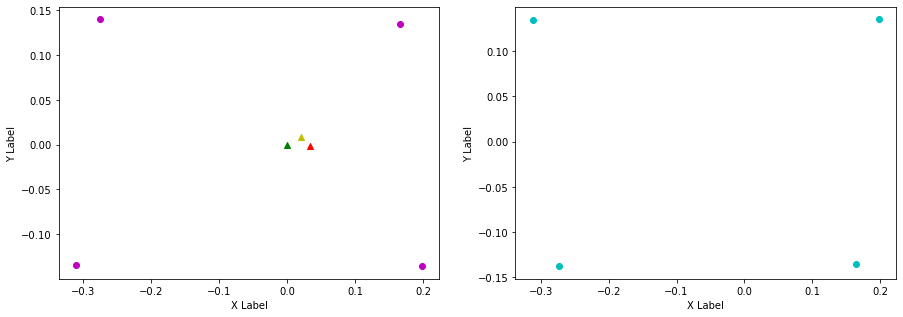

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.04166585]. Velocity y: [-0.01179178]. Angular 0.012167814138056489
Odom velocity x: 0.0508743301512. Odom velocity y: 0.00114492187942. Odom velocity yaw: 0.229432821759
Base displacement (Odom): [[0.014583041981987233], [-0.004127123575375369]]. Rotation displacement: -0.6940047049812049.



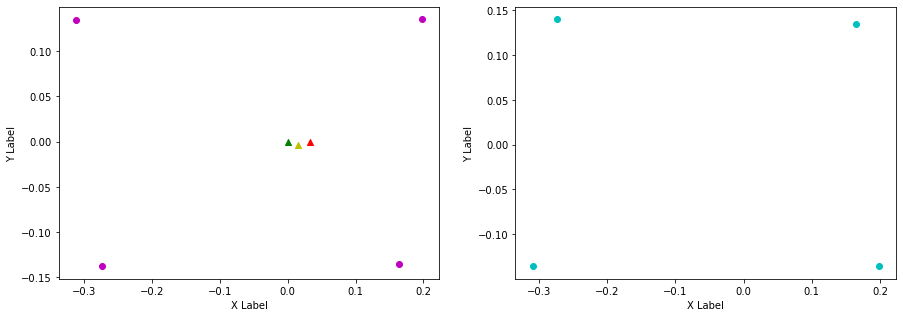

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.309, RL (y): 0.14, 0.135.
RL displacement: -0.034999999999999976, -0.0050000000000000044.

RR (x): -0.309, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.12028708]. Velocity y: [0.03409623]. Angular -0.04414706734030568
Odom velocity x: 0.0877709907398. Odom velocity y: 0.0179055922444. Odom velocity yaw: -0.278216175538
Base displacement (Odom): [[0.03728901761788306], [0.010569838634312045]]. Rotation displacement: 0.24400747211680976.



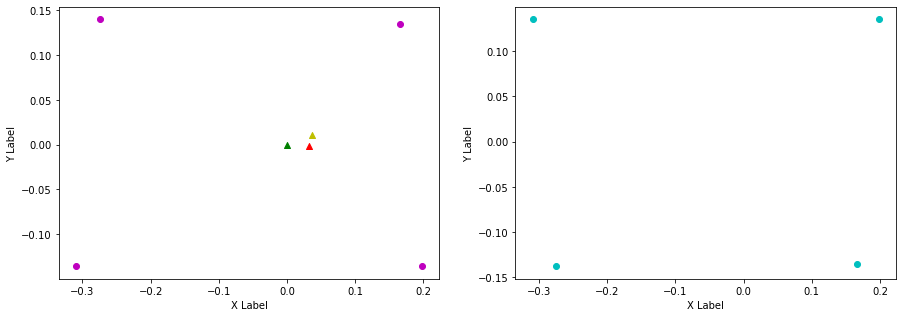

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.166, 0.198, FR (y): -0.135, -0.135.
FR displacement: 0.032, 0.0.

RL (x): -0.309, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.034999999999999976, 0.0040000000000000036.

RR (x): -0.275, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.02155066]. Velocity y: [-0.01608569]. Angular 0.005492987402732457
Odom velocity x: 0.0559255562145. Odom velocity y: 0.0034400390821. Odom velocity yaw: 0.222325788033
Base displacement (Odom): [[0.006249690200136104], [-0.004664850827040046]]. Rotation displacement: -0.7841270556384873.



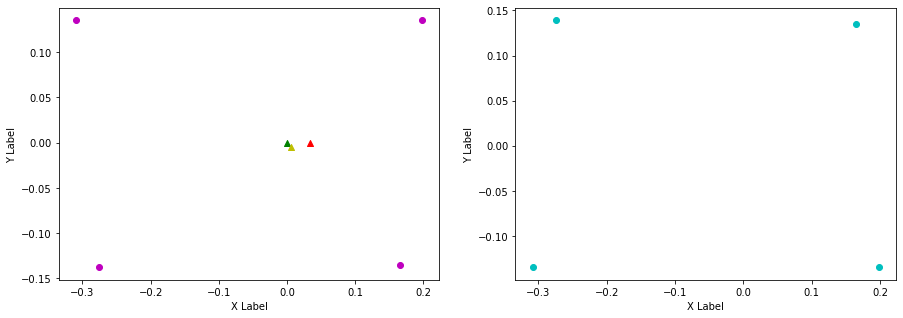

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.198, 0.167, FR (y): -0.135, -0.136.
FR displacement: -0.031, -0.0010000000000000009.

RL (x): -0.274, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.032999999999999974, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.033999999999999975, -0.0020000000000000018.


Base displacement (Foot): [0.031, 0.0010000000000000009].

Velocity x: [0.016182]. Velocity y: [0.00400927]. Angular -0.005048101082599251
Odom velocity x: 0.0350864564789. Odom velocity y: 0.00327163742035. Odom velocity yaw: -0.280820013394
Base displacement (Odom): [[0.005663698089811486], [0.0014032432459735178]]. Rotation displacement: 0.09127023657177252.



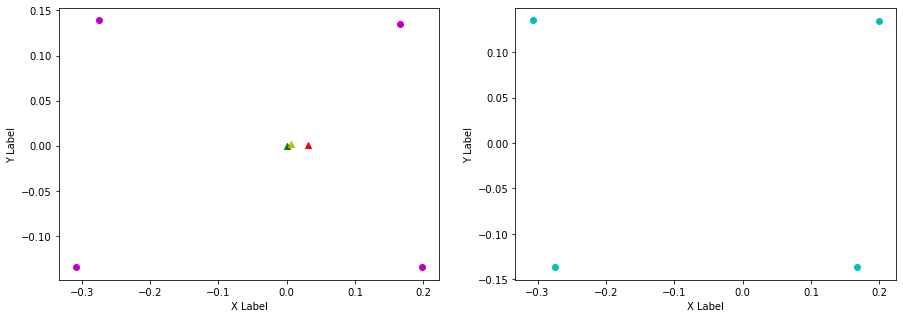

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.167, FL (y): 0.134, 0.136.
FL displacement: -0.032, 0.0020000000000000018.

FR (x): 0.167, 0.2, FR (y): -0.136, -0.136.
FR displacement: 0.033, 0.0.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.032999999999999974, 0.0040000000000000036.

RR (x): -0.274, -0.305, RR (y): -0.137, -0.135.
RR displacement: -0.030999999999999972, 0.0020000000000000018.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.03748288]. Velocity y: [-0.00632707]. Angular 0.0005960576040930255
Odom velocity x: 0.0329897214872. Odom velocity y: -0.00153339869872. Odom velocity yaw: 0.224569298272
Base displacement (Odom): [[0.011994518063902504], [-0.00202466122299072]]. Rotation displacement: -0.10123218272233735.



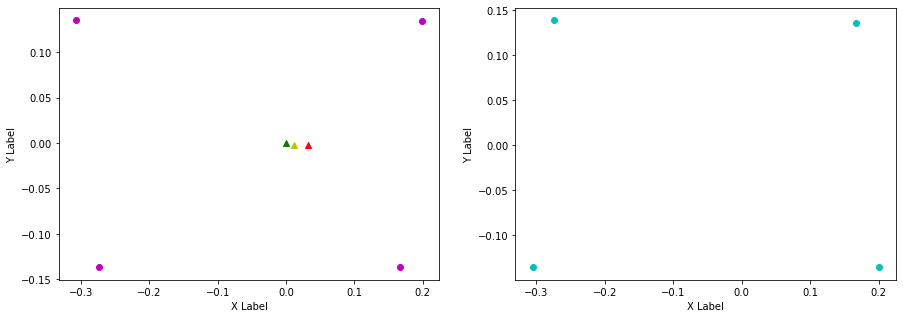

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.032, -0.0020000000000000018.

FR (x): 0.2, 0.168, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.032999999999999974, -0.0040000000000000036.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.030999999999999972, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.10707284]. Velocity y: [0.02847878]. Angular 0.008147529839760347
Odom velocity x: 0.0742739923387. Odom velocity y: 0.0139447387483. Odom velocity yaw: -0.224548202548
Base displacement (Odom): [[0.0321218729760413], [0.008543639073908649]]. Rotation displacement: 0.010928504939722966.



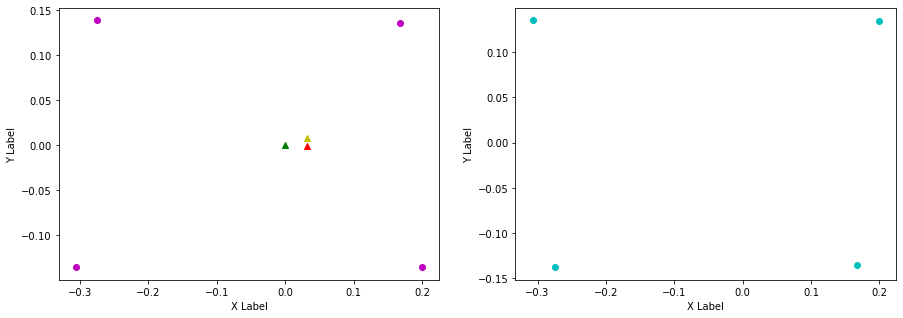

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.168, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.028999999999999998, -0.0020000000000000018.

RL (x): -0.307, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.03199999999999997, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.06024082]. Velocity y: [-0.01998729]. Angular -0.015078426814499645
Odom velocity x: 0.0688896987917. Odom velocity y: -0.00393757445332. Odom velocity yaw: 0.230416748585
Base displacement (Odom): [[0.021686687332441057], [-0.007195422418877495]]. Rotation displacement: 0.14004581102122246.



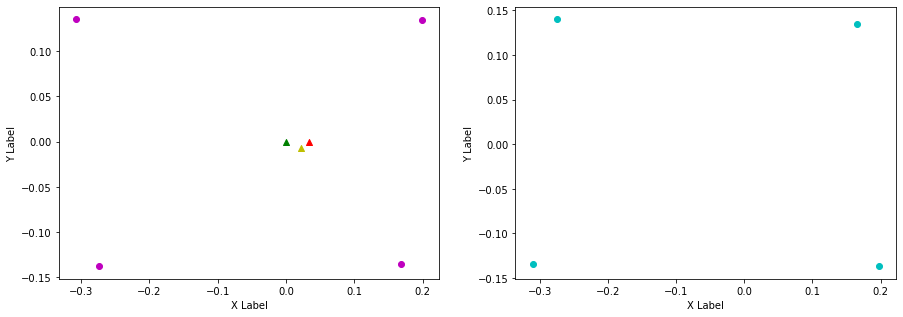

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.132.
FL displacement: 0.035, -0.0030000000000000027.

FR (x): 0.197, 0.172, FR (y): -0.137, -0.136.
FR displacement: -0.025000000000000022, 0.0010000000000000009.

RL (x): -0.275, -0.301, RL (y): 0.14, 0.135.
RL displacement: -0.025999999999999968, -0.0050000000000000044.

RR (x): -0.31, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.025000000000000022, -0.0010000000000000009].

Velocity x: [0.08019206]. Velocity y: [0.01741175]. Angular 0.011287428308895672
Odom velocity x: 0.0794185284318. Odom velocity y: 0.00605795598871. Odom velocity yaw: -0.188151349608
Base displacement (Odom): [[0.021651855467271552], [0.004701171953407246]]. Rotation displacement: -0.3110147879104926.



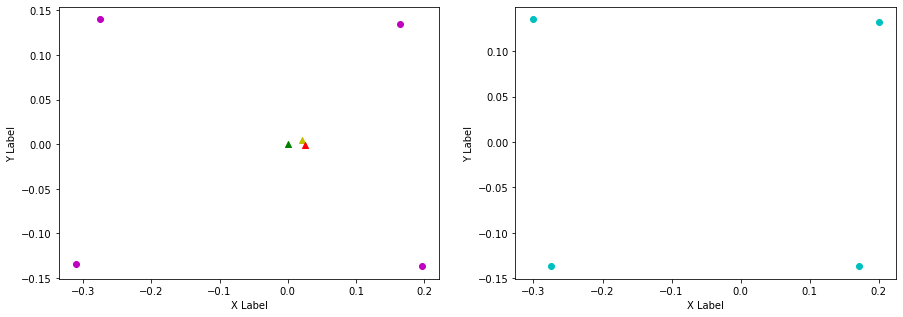

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.173, FL (y): 0.132, 0.138.
FL displacement: -0.027000000000000024, 0.006000000000000005.

FR (x): 0.172, 0.203, FR (y): -0.136, -0.134.
FR displacement: 0.031000000000000028, 0.0020000000000000018.

RL (x): -0.301, -0.272, RL (y): 0.135, 0.139.
RL displacement: 0.02899999999999997, 0.0040000000000000036.

RR (x): -0.274, -0.295, RR (y): -0.137, -0.137.
RR displacement: -0.020999999999999963, 0.0.


Base displacement (Foot): [0.027000000000000024, -0.006000000000000005].

Velocity x: [0.04248451]. Velocity y: [-0.0072782]. Angular -0.03247958984069419
Odom velocity x: 0.0612228262367. Odom velocity y: -0.000823257462274. Odom velocity yaw: 0.229975251617
Base displacement (Odom): [[0.015719273078990348], [-0.002692934831880933]]. Rotation displacement: 0.17461492865193343.



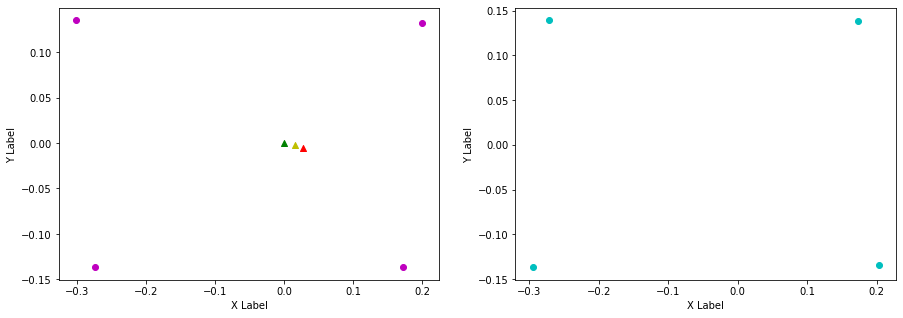

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.173, 0.2, FL (y): 0.138, 0.134.
FL displacement: 0.027000000000000024, -0.0040000000000000036.

FR (x): 0.203, 0.168, FR (y): -0.134, -0.136.
FR displacement: -0.035, -0.0020000000000000018.

RL (x): -0.272, -0.305, RL (y): 0.139, 0.136.
RL displacement: -0.032999999999999974, -0.0030000000000000027.

RR (x): -0.295, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.020999999999999963, -0.0010000000000000009.


Base displacement (Foot): [0.035, 0.0020000000000000018].

Velocity x: [0.05481525]. Velocity y: [0.0084841]. Angular 0.010553252530807355
Odom velocity x: 0.0569269522498. Odom velocity y: 0.00307216137918. Odom velocity yaw: -0.208388270765
Base displacement (Odom): [[0.016444571223144244], [0.002545229611743194]]. Rotation displacement: -0.6885492954448847.



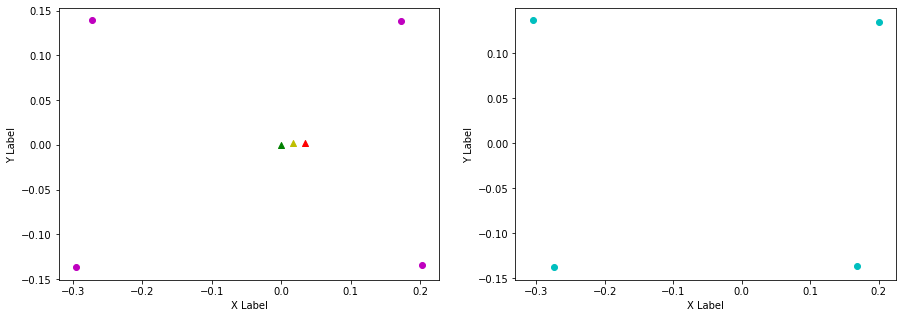

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.168, 0.199, FR (y): -0.136, -0.136.
FR displacement: 0.031, 0.0.

RL (x): -0.305, -0.274, RL (y): 0.136, 0.139.
RL displacement: 0.030999999999999972, 0.0030000000000000027.

RR (x): -0.274, -0.308, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.0499996]. Velocity y: [-0.0200368]. Angular -0.013263311051569214
Odom velocity x: 0.0545613710099. Odom velocity y: -0.0105455336819. Odom velocity yaw: 0.231377990418
Base displacement (Odom): [[0.01799985219352429], [-0.007213247082090035]]. Rotation displacement: 0.1813970202130204.



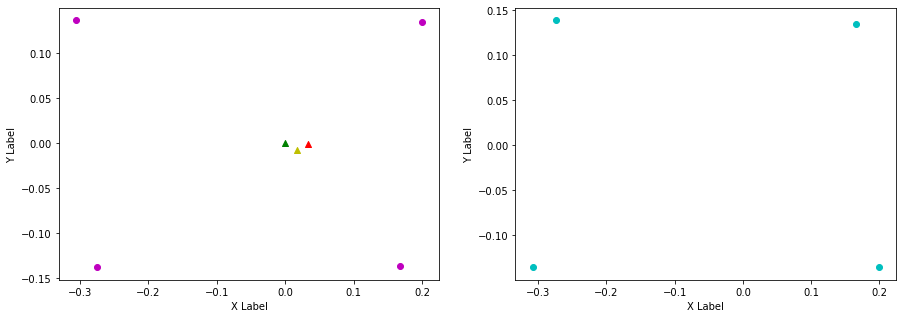

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.032, 0.0.

FR (x): 0.199, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.135.
RL displacement: -0.03699999999999998, -0.0040000000000000036.

RR (x): -0.308, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.07101825]. Velocity y: [0.02354526]. Angular -0.03839135062948316
Odom velocity x: 0.0653609783406. Odom velocity y: 0.00752624223742. Odom velocity yaw: -0.283636026006
Base displacement (Odom): [[0.024146216402689546], [0.008005393095953162]]. Rotation displacement: -0.27357534870467687.



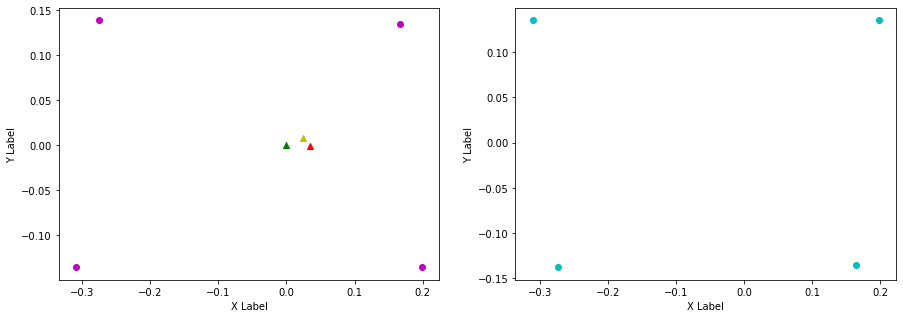

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.197, FR (y): -0.135, -0.136.
FR displacement: 0.032, -0.0010000000000000009.

RL (x): -0.311, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.03699999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.02103855]. Velocity y: [-0.00441223]. Angular 0.04654134988503188
Odom velocity x: 0.0407582619669. Odom velocity y: 0.0020653398246. Odom velocity yaw: 0.235825332328
Base displacement (Odom): [[0.007153105870515208], [-0.001500158244923555]]. Rotation displacement: -0.7478855383397821.



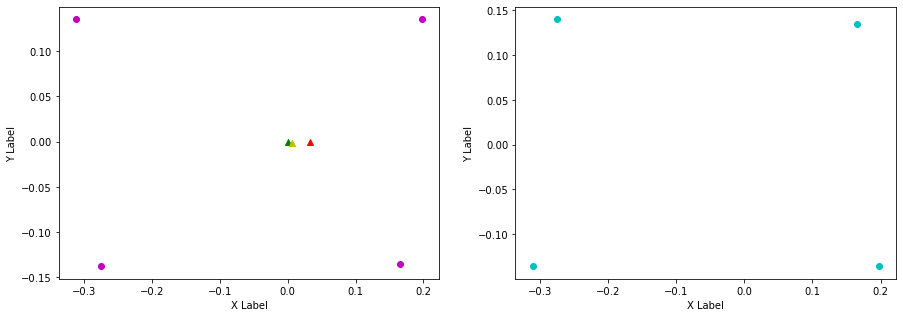

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.201, FL (y): 0.135, 0.132.
FL displacement: 0.036000000000000004, -0.0030000000000000027.

FR (x): 0.197, 0.174, FR (y): -0.136, -0.136.
FR displacement: -0.02300000000000002, 0.0.

RL (x): -0.274, -0.297, RL (y): 0.14, 0.136.
RL displacement: -0.022999999999999965, -0.0040000000000000036.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.035999999999999976, -0.0020000000000000018.


Base displacement (Foot): [0.02300000000000002, -0.0].

Velocity x: [0.05575093]. Velocity y: [0.02647196]. Angular -0.04459256502693229
Odom velocity x: 0.0454987312785. Odom velocity y: 0.0135517721024. Odom velocity yaw: -0.231530878211
Base displacement (Odom): [[0.01449524176808259], [0.006882709836995127]]. Rotation displacement: 0.9066515643482808.



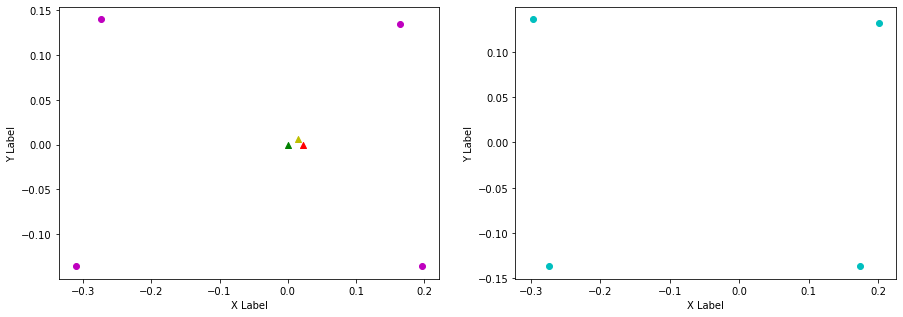

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.033, 0.0040000000000000036.

FR (x): 0.174, 0.2, FR (y): -0.136, -0.135.
FR displacement: 0.026000000000000023, 0.0010000000000000009.

RL (x): -0.297, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.023999999999999966, 0.0030000000000000027.

RR (x): -0.274, -0.303, RR (y): -0.137, -0.135.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0040000000000000036].

Velocity x: [0.06197644]. Velocity y: [-0.02004722]. Angular -0.020895595663931767
Odom velocity x: 0.0573802669486. Odom velocity y: -0.00450221935966. Odom velocity yaw: 0.209428396129
Base displacement (Odom): [[0.02107198264890009], [-0.006816052799417105]]. Rotation displacement: -0.6642910767974811.



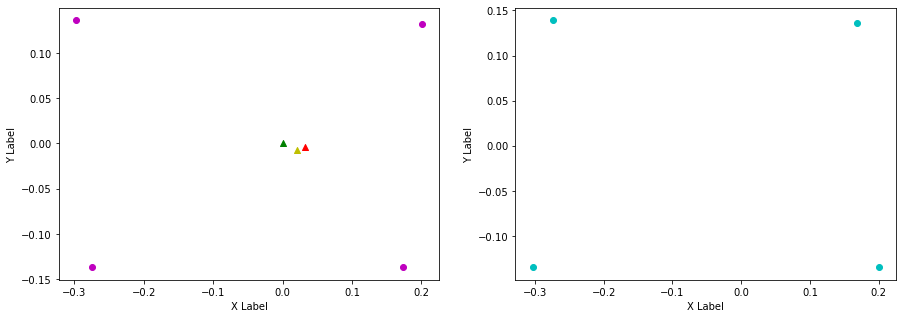

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.203, FL (y): 0.136, 0.132.
FL displacement: 0.035, -0.0040000000000000036.

FR (x): 0.2, 0.18, FR (y): -0.135, -0.138.
FR displacement: -0.020000000000000018, -0.0030000000000000027.

RL (x): -0.273, -0.293, RL (y): 0.139, 0.137.
RL displacement: -0.019999999999999962, -0.0020000000000000018.

RR (x): -0.303, -0.271, RR (y): -0.135, -0.137.
RR displacement: 0.03199999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0030000000000000027].

Velocity x: [0.04567742]. Velocity y: [0.00484084]. Angular 0.024383216034493237
Odom velocity x: 0.0497443291003. Odom velocity y: -0.00101629849942. Odom velocity yaw: -0.184032158731
Base displacement (Odom): [[0.013703233689559724], [0.0014522523401170329]]. Rotation displacement: -0.4070579075057249.



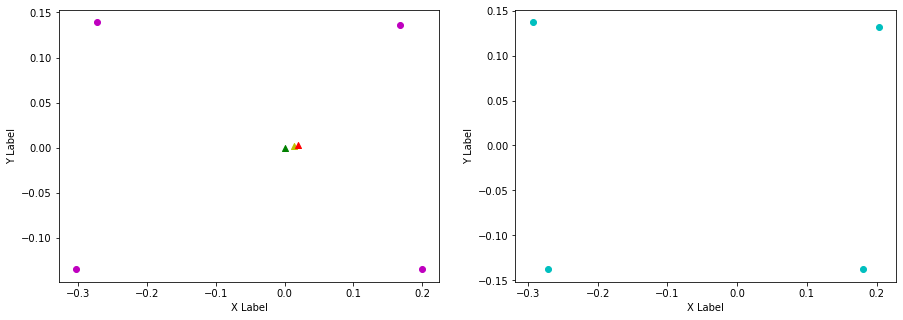

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.167, FL (y): 0.132, 0.136.
FL displacement: -0.036000000000000004, 0.0040000000000000036.

FR (x): 0.18, 0.199, FR (y): -0.138, -0.135.
FR displacement: 0.019000000000000017, 0.0030000000000000027.

RL (x): -0.293, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.01899999999999996, 0.0020000000000000018.

RR (x): -0.271, -0.306, RR (y): -0.137, -0.135.
RR displacement: -0.034999999999999976, 0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0040000000000000036].

Velocity x: [0.03806268]. Velocity y: [-0.00834744]. Angular -0.040187811468710644
Odom velocity x: 0.0427710708188. Odom velocity y: -0.00510317661003. Odom velocity yaw: 0.199523272652
Base displacement (Odom): [[0.013321934807358549], [-0.0029216023622122833]]. Rotation displacement: 0.41911687738681835.



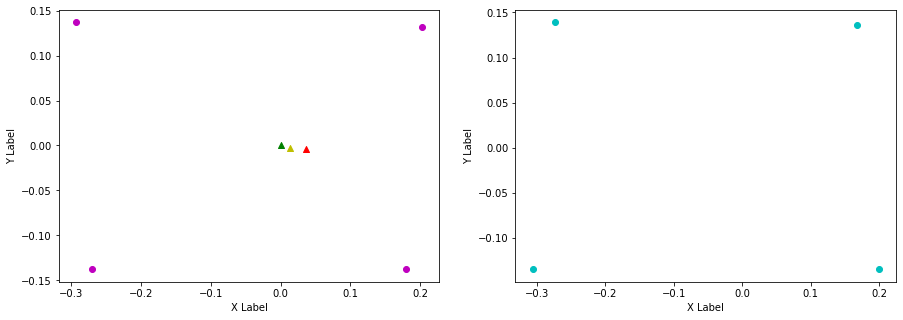

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.03, 0.0.

FR (x): 0.199, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.306, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.03199999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.04047932]. Velocity y: [0.02064319]. Angular -0.006408950318609253
Odom velocity x: 0.0413216460688. Odom velocity y: 0.00849329634007. Odom velocity yaw: -0.278276277535
Base displacement (Odom): [[0.013762965446464825], [0.007018681386512848]]. Rotation displacement: -0.8059069751663144.



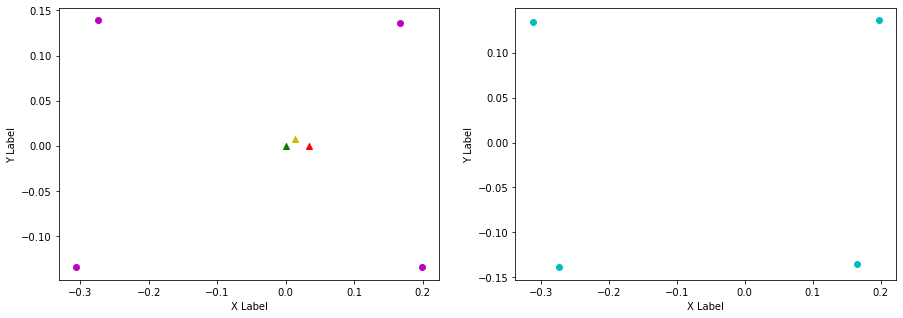

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.032, -0.0010000000000000009.

FR (x): 0.165, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.032, -0.0020000000000000018.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.311, RR (y): -0.139, -0.134.
RR displacement: -0.03699999999999998, 0.0050000000000000044.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.06005387]. Velocity y: [-0.02088458]. Angular 0.028533964401081746
Odom velocity x: 0.0532580277064. Odom velocity y: -0.00789158836439. Odom velocity yaw: 0.239956995978
Base displacement (Odom): [[0.021018863175752855], [-0.007309607402485208]]. Rotation displacement: -0.12484994196668671.



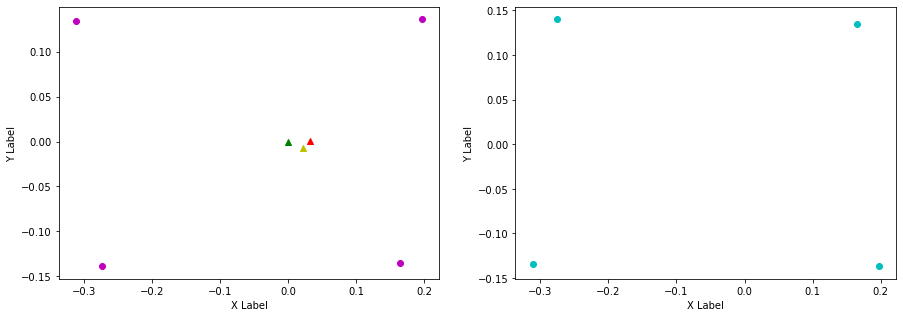

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.134.
FL displacement: 0.035, -0.0010000000000000009.

FR (x): 0.197, 0.168, FR (y): -0.137, -0.136.
FR displacement: -0.028999999999999998, 0.0010000000000000009.

RL (x): -0.275, -0.306, RL (y): 0.14, 0.135.
RL displacement: -0.030999999999999972, -0.0050000000000000044.

RR (x): -0.311, -0.273, RR (y): -0.134, -0.137.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.028999999999999998, -0.0010000000000000009].

Velocity x: [0.0541708]. Velocity y: [0.01654578]. Angular -0.04239992180896648
Odom velocity x: 0.0540226832084. Odom velocity y: 0.00370024176306. Odom velocity yaw: -0.285448086147
Base displacement (Odom): [[0.016251238239882504], [0.0049637325969073]]. Rotation displacement: 0.5722067404063315.



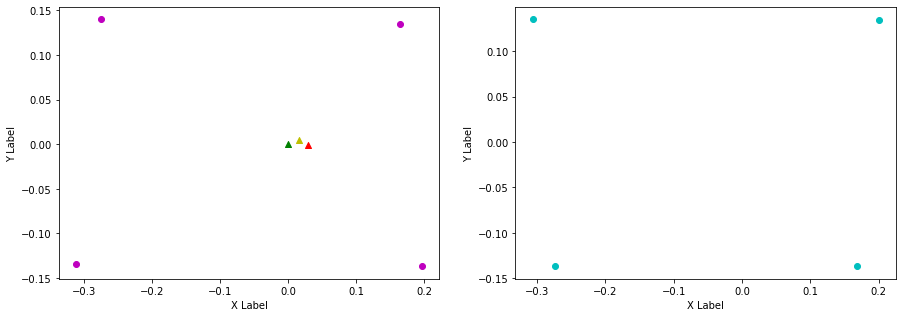

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.032, 0.0020000000000000018.

FR (x): 0.168, 0.2, FR (y): -0.136, -0.135.
FR displacement: 0.032, 0.0010000000000000009.

RL (x): -0.306, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03199999999999997, 0.0040000000000000036.

RR (x): -0.273, -0.304, RR (y): -0.137, -0.136.
RR displacement: -0.030999999999999972, 0.0010000000000000009.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.03600472]. Velocity y: [-0.01193645]. Angular -0.013378171376272412
Odom velocity x: 0.0457827531093. Odom velocity y: -0.00396278592459. Odom velocity yaw: 0.193951901952
Base displacement (Odom): [[0.011161460561834868], [-0.003700299269630003]]. Rotation displacement: -0.7288008555617475.



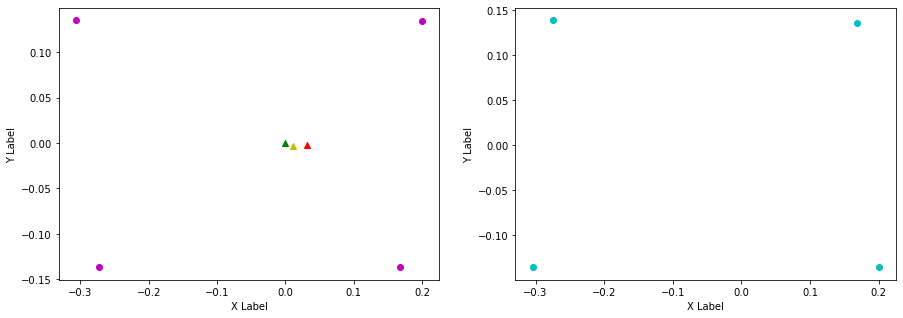

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.201, FL (y): 0.136, 0.133.
FL displacement: 0.033, -0.0030000000000000027.

FR (x): 0.2, 0.174, FR (y): -0.135, -0.137.
FR displacement: -0.026000000000000023, -0.0020000000000000018.

RL (x): -0.274, -0.298, RL (y): 0.139, 0.136.
RL displacement: -0.023999999999999966, -0.0030000000000000027.

RR (x): -0.304, -0.273, RR (y): -0.136, -0.137.
RR displacement: 0.030999999999999972, -0.0010000000000000009.


Base displacement (Foot): [0.026000000000000023, 0.0020000000000000018].

Velocity x: [0.08732668]. Velocity y: [0.02438096]. Angular 0.005346934145346336
Odom velocity x: 0.0724382111834. Odom velocity y: 0.0117771669882. Odom velocity yaw: -0.26915426343
Base displacement (Odom): [[0.02969106203975791], [0.008289525700651001]]. Rotation displacement: -0.2376189109533595.



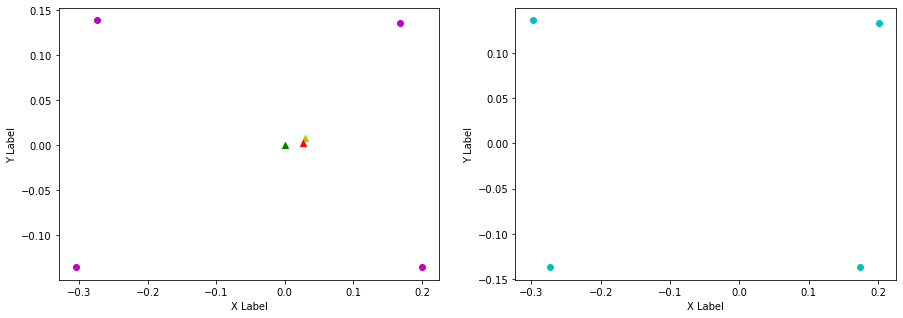

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.172, FL (y): 0.133, 0.137.
FL displacement: -0.029000000000000026, 0.0040000000000000036.

FR (x): 0.174, 0.202, FR (y): -0.137, -0.134.
FR displacement: 0.028000000000000025, 0.0030000000000000027.

RL (x): -0.298, -0.272, RL (y): 0.136, 0.138.
RL displacement: 0.025999999999999968, 0.0020000000000000018.

RR (x): -0.273, -0.297, RR (y): -0.137, -0.137.
RR displacement: -0.023999999999999966, 0.0.


Base displacement (Foot): [0.029000000000000026, -0.0040000000000000036].

Velocity x: [0.05128716]. Velocity y: [-0.0220625]. Angular -0.012311317736616326
Odom velocity x: 0.0667924922162. Odom velocity y: -0.00569653500023. Odom velocity yaw: 0.21737723587
Base displacement (Odom): [[0.017437642480340187], [-0.007501254735924112]]. Rotation displacement: 0.10416127205851826.



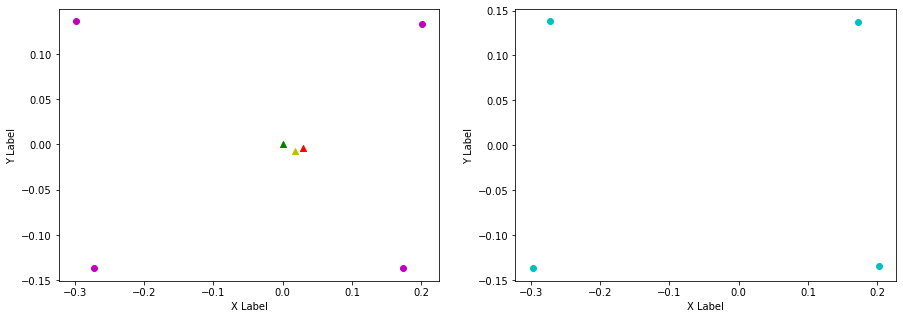

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.196, FL (y): 0.137, 0.136.
FL displacement: 0.02400000000000002, -0.0010000000000000009.

FR (x): 0.202, 0.165, FR (y): -0.134, -0.135.
FR displacement: -0.037000000000000005, -0.0010000000000000009.

RL (x): -0.272, -0.311, RL (y): 0.138, 0.134.
RL displacement: -0.03899999999999998, -0.0040000000000000036.

RR (x): -0.297, -0.275, RR (y): -0.137, -0.139.
RR displacement: 0.021999999999999964, -0.0020000000000000018.


Base displacement (Foot): [0.037000000000000005, 0.0010000000000000009].

Velocity x: [0.0570825]. Velocity y: [0.00842787]. Angular -0.0074060892712110105
Odom velocity x: 0.0594005912131. Odom velocity y: 0.000344440425675. Odom velocity yaw: -0.276814152597
Base displacement (Odom): [[0.017124746133587276], [0.0025283611354434132]]. Rotation displacement: -0.23983153346135258.



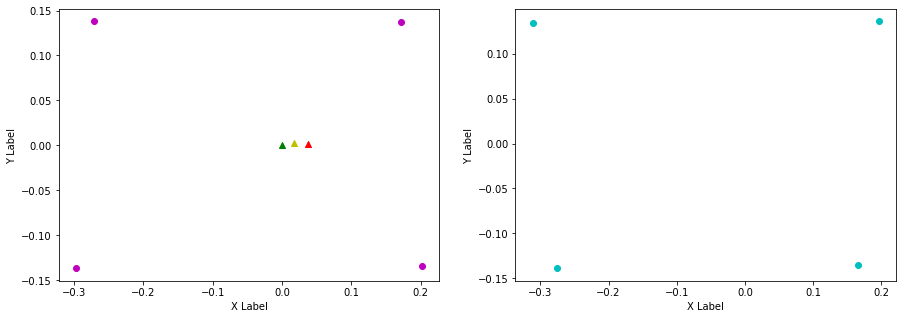

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.196, 0.171, FL (y): 0.136, 0.137.
FL displacement: -0.024999999999999994, 0.0010000000000000009.

FR (x): 0.165, 0.201, FR (y): -0.135, -0.134.
FR displacement: 0.036000000000000004, 0.0010000000000000009.

RL (x): -0.311, -0.273, RL (y): 0.134, 0.138.
RL displacement: 0.03799999999999998, 0.0040000000000000036.

RR (x): -0.275, -0.298, RR (y): -0.139, -0.136.
RR displacement: -0.022999999999999965, 0.0030000000000000027.


Base displacement (Foot): [0.024999999999999994, -0.0010000000000000009].

Velocity x: [0.05334489]. Velocity y: [-0.0099012]. Angular -0.017057269702438004
Odom velocity x: 0.0591999953484. Odom velocity y: -0.00516678467526. Odom velocity yaw: 0.144539019511
Base displacement (Odom): [[0.01653691251070999], [-0.003069371099909901]]. Rotation displacement: -0.1273012771472569.



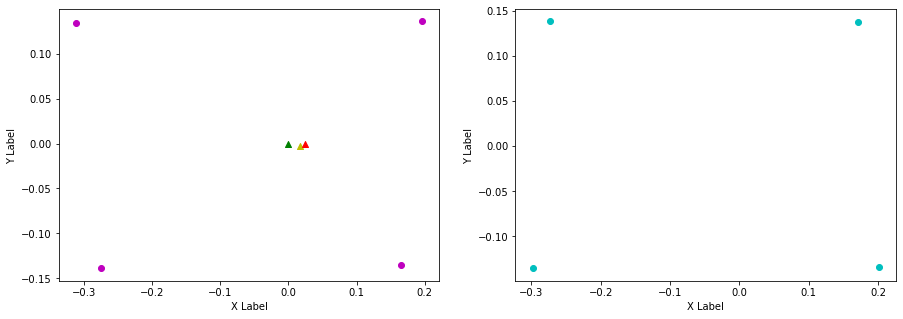

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.027999999999999997, -0.0030000000000000027.

FR (x): 0.201, 0.167, FR (y): -0.134, -0.135.
FR displacement: -0.034, -0.0010000000000000009.

RL (x): -0.273, -0.308, RL (y): 0.138, 0.135.
RL displacement: -0.034999999999999976, -0.0030000000000000027.

RR (x): -0.298, -0.274, RR (y): -0.136, -0.138.
RR displacement: 0.023999999999999966, -0.0020000000000000018.


Base displacement (Foot): [0.034, 0.0010000000000000009].

Velocity x: [0.08721158]. Velocity y: [0.02680887]. Angular -0.018151113307929897
Odom velocity x: 0.0792164073726. Odom velocity y: 0.0150891972547. Odom velocity yaw: -0.285428681773
Base displacement (Odom): [[0.03401252618271444], [0.01045546235278949]]. Rotation displacement: -0.302965908907379.



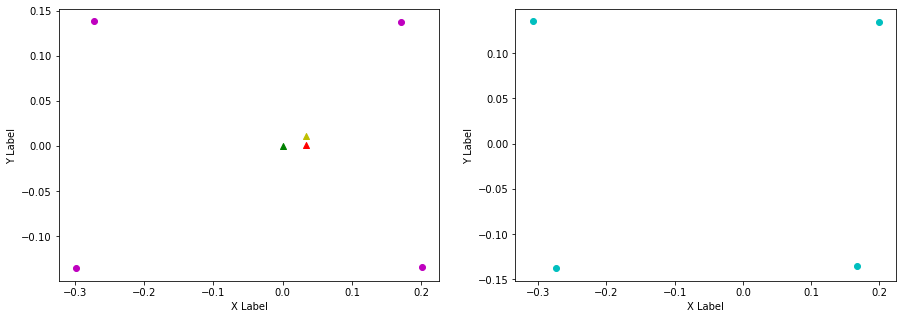

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.173, FL (y): 0.134, 0.138.
FL displacement: -0.026000000000000023, 0.0040000000000000036.

FR (x): 0.167, 0.203, FR (y): -0.135, -0.134.
FR displacement: 0.036000000000000004, 0.0010000000000000009.

RL (x): -0.308, -0.271, RL (y): 0.135, 0.138.
RL displacement: 0.03699999999999998, 0.0030000000000000027.

RR (x): -0.274, -0.296, RR (y): -0.138, -0.137.
RR displacement: -0.021999999999999964, 0.0010000000000000009.


Base displacement (Foot): [0.026000000000000023, -0.0040000000000000036].

Velocity x: [0.06538268]. Velocity y: [-0.0279741]. Angular 0.007181605886070126
Odom velocity x: 0.0721956433644. Odom velocity y: -0.00210563307957. Odom velocity yaw: 0.121561234981
Base displacement (Odom): [[0.015038017426254768], [-0.006434042869163825]]. Rotation displacement: -0.40559316164164205.



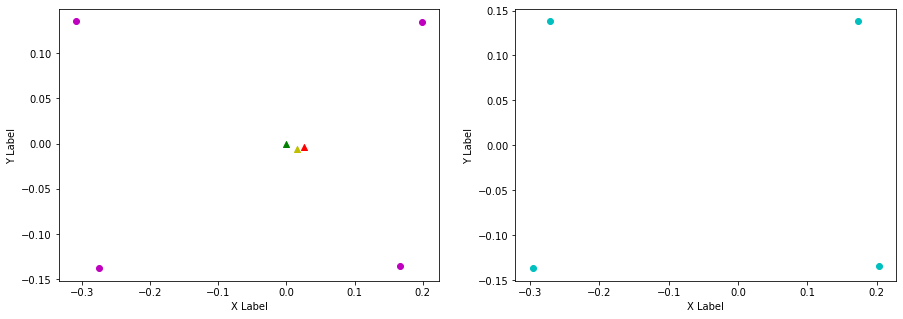

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.173, 0.201, FL (y): 0.138, 0.133.
FL displacement: 0.028000000000000025, -0.0050000000000000044.

FR (x): 0.203, 0.172, FR (y): -0.134, -0.137.
FR displacement: -0.031000000000000028, -0.0030000000000000027.

RL (x): -0.271, -0.3, RL (y): 0.138, 0.136.
RL displacement: -0.02899999999999997, -0.0020000000000000018.

RR (x): -0.296, -0.273, RR (y): -0.137, -0.137.
RR displacement: 0.022999999999999965, 0.0.


Base displacement (Foot): [0.031000000000000028, 0.0030000000000000027].

Velocity x: [0.07188986]. Velocity y: [0.02773845]. Angular 0.029241218408391098
Odom velocity x: 0.0752025593759. Odom velocity y: 0.0149668222808. Odom velocity yaw: -0.185389294511
Base displacement (Odom): [[0.02444254685888181], [0.00943107044526914]]. Rotation displacement: 0.09463942054984575.



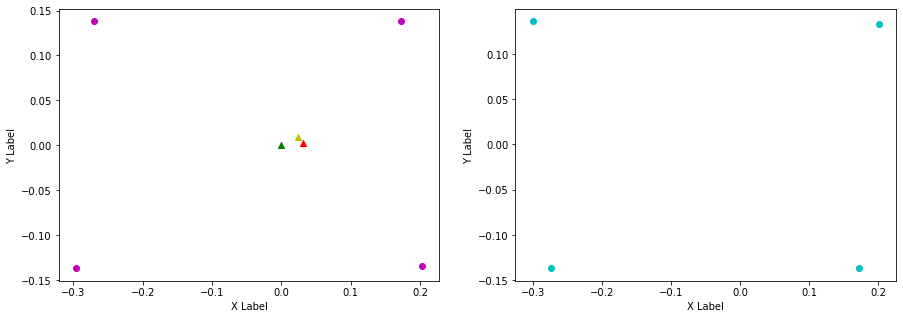

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.166, FL (y): 0.133, 0.135.
FL displacement: -0.035, 0.0020000000000000018.

FR (x): 0.172, 0.197, FR (y): -0.137, -0.137.
FR displacement: 0.025000000000000022, 0.0.

RL (x): -0.3, -0.274, RL (y): 0.136, 0.141.
RL displacement: 0.025999999999999968, 0.004999999999999977.

RR (x): -0.273, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03799999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0020000000000000018].

Velocity x: [0.04336325]. Velocity y: [-0.01786648]. Angular -0.004890947821236894
Odom velocity x: 0.0599580932677. Odom velocity y: -0.00284047705369. Odom velocity yaw: 0.249376511917
Base displacement (Odom): [[0.01691167274194294], [-0.00696793074509694]]. Rotation displacement: 0.5696353130905621.



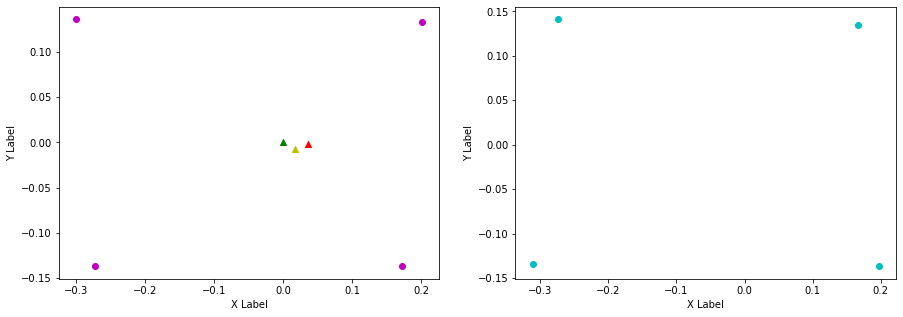

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.133.
FL displacement: 0.033, -0.0020000000000000018.

FR (x): 0.197, 0.169, FR (y): -0.137, -0.136.
FR displacement: -0.027999999999999997, 0.0010000000000000009.

RL (x): -0.274, -0.304, RL (y): 0.141, 0.135.
RL displacement: -0.02999999999999997, -0.005999999999999978.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.027999999999999997, -0.0010000000000000009].

Velocity x: [0.07371543]. Velocity y: [0.02765872]. Angular -0.02229612807433942
Odom velocity x: 0.0712877854824. Odom velocity y: 0.0132750227041. Odom velocity yaw: -0.266907694125
Base displacement (Odom): [[0.022851778494890507], [0.008574201778435153]]. Rotation displacement: -0.10928998990784297.



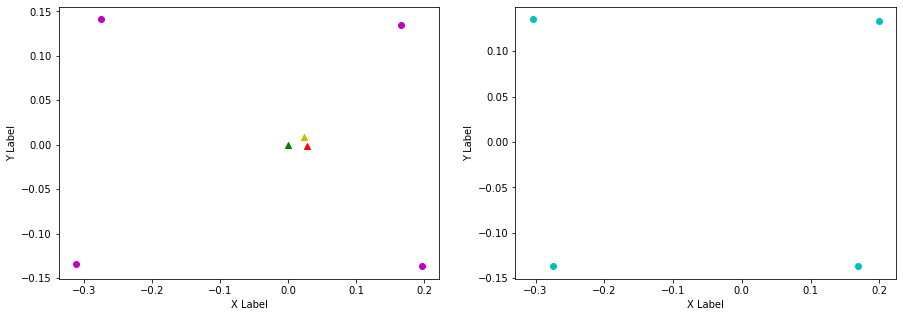

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.133, 0.134.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.169, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.027999999999999997, -0.0010000000000000009.

RL (x): -0.304, -0.275, RL (y): 0.135, 0.141.
RL displacement: 0.02899999999999997, 0.005999999999999978.

RR (x): -0.274, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.02533159]. Velocity y: [-0.00994253]. Angular -0.008832289424820982
Odom velocity x: 0.0483041800708. Odom velocity y: 0.00230766524312. Odom velocity yaw: 0.241599423108
Base displacement (Odom): [[0.008612738867237013], [-0.00338045878218729]]. Rotation displacement: -0.39601687872661595.



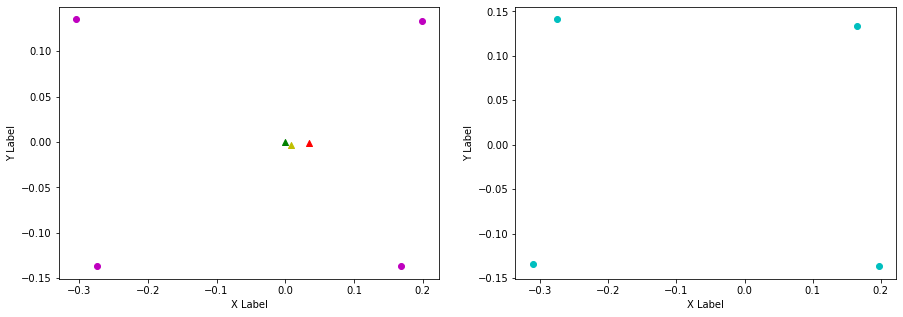

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.134, 0.133.
FL displacement: 0.035, -0.0010000000000000009.

FR (x): 0.197, 0.17, FR (y): -0.137, -0.136.
FR displacement: -0.026999999999999996, 0.0010000000000000009.

RL (x): -0.275, -0.303, RL (y): 0.141, 0.135.
RL displacement: -0.02799999999999997, -0.005999999999999978.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.02243751]. Velocity y: [0.01277815]. Angular 0.0016469473421689316
Odom velocity x: 0.0336991267044. Odom velocity y: 0.00762591309856. Odom velocity yaw: -0.22685243539
Base displacement (Odom): [[0.006731250529126154], [0.0038334450506183337]]. Rotation displacement: -0.17205794510842293.



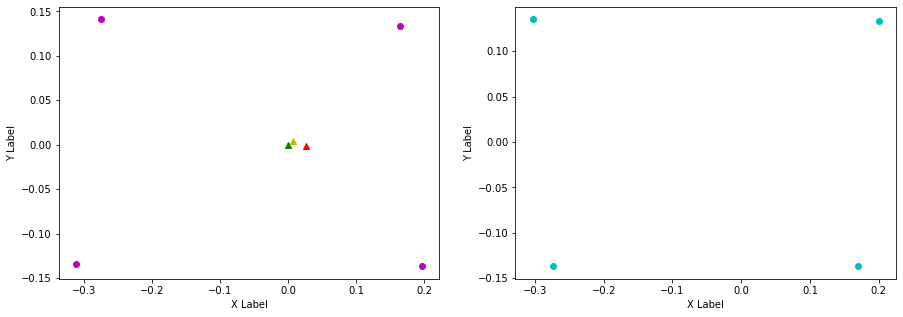

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.035, 0.0020000000000000018.

FR (x): 0.17, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.026999999999999996, -0.0010000000000000009.

RL (x): -0.303, -0.274, RL (y): 0.135, 0.141.
RL displacement: 0.02899999999999997, 0.005999999999999978.

RR (x): -0.274, -0.311, RR (y): -0.137, -0.134.
RR displacement: -0.03699999999999998, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0020000000000000018].

Velocity x: [0.02813128]. Velocity y: [-0.00915415]. Angular -0.008019067116753969
Odom velocity x: 0.0275508912606. Odom velocity y: -0.00122065977048. Odom velocity yaw: 0.237836355224
Base displacement (Odom): [[0.00956463857528167], [-0.0031124111100955254]]. Rotation displacement: 0.028308935036385655.



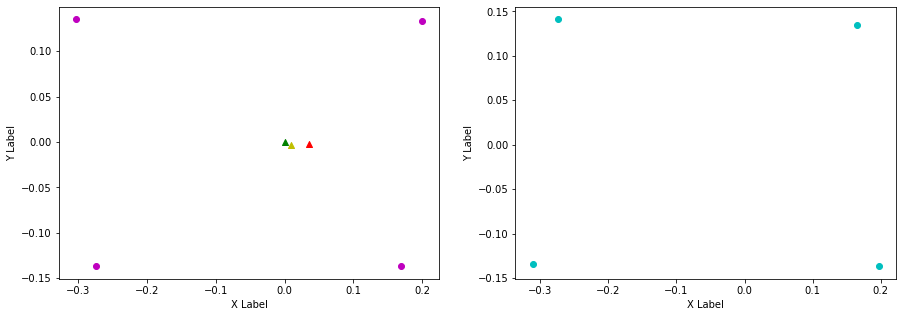

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.135, 0.136.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.274, -0.312, RL (y): 0.141, 0.134.
RL displacement: -0.03799999999999998, -0.0069999999999999785.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.139.
RR displacement: 0.035999999999999976, -0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.00929394]. Velocity y: [0.01905296]. Angular -0.0468564627628059
Odom velocity x: 0.0161125956915. Odom velocity y: 0.00964784764509. Odom velocity yaw: -0.287701725315
Base displacement (Odom): [[0.0032528769383737277], [0.006668534316400132]]. Rotation displacement: -0.1562160285913631.



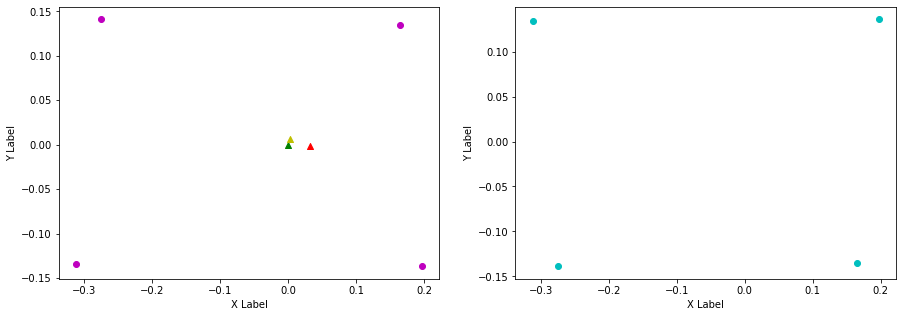

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.17, FL (y): 0.136, 0.137.
FL displacement: -0.026999999999999996, 0.0010000000000000009.

FR (x): 0.165, 0.201, FR (y): -0.135, -0.135.
FR displacement: 0.036000000000000004, 0.0.

RL (x): -0.312, -0.273, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.3, RR (y): -0.139, -0.137.
RR displacement: -0.024999999999999967, 0.0020000000000000018.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.04383016]. Velocity y: [-0.01100106]. Angular 0.014439403163397932
Odom velocity x: 0.0266465123633. Odom velocity y: 0.000299981654056. Odom velocity yaw: 0.189859692386
Base displacement (Odom): [[0.012710744761211146], [-0.0031903077874391172]]. Rotation displacement: -0.9396368896964342.



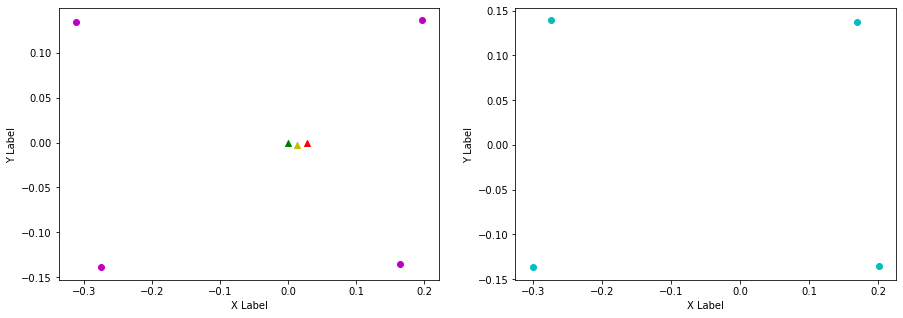

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.198, FL (y): 0.137, 0.135.
FL displacement: 0.027999999999999997, -0.0020000000000000018.

FR (x): 0.201, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.037000000000000005, 0.0.

RL (x): -0.273, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03899999999999998, -0.0050000000000000044.

RR (x): -0.3, -0.275, RR (y): -0.137, -0.138.
RR displacement: 0.024999999999999967, -0.0010000000000000009.


Base displacement (Foot): [0.037000000000000005, -0.0].

Velocity x: [0.04461996]. Velocity y: [0.00838583]. Angular -0.0030767578209304953
Odom velocity x: 0.0371542374643. Odom velocity y: 0.00452010336475. Odom velocity yaw: -0.268559822053
Base displacement (Odom): [[0.015170792686919565], [0.0028511820734438142]]. Rotation displacement: 0.23992185782602626.



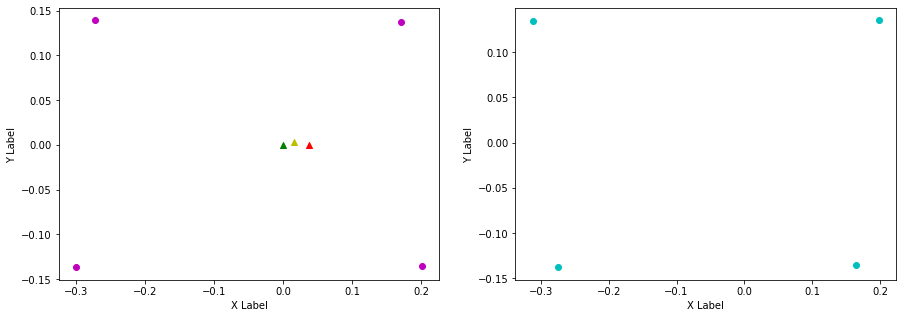

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.275, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.07445473]. Velocity y: [-0.01733791]. Angular -0.007241344130159743
Odom velocity x: 0.0586862561846. Odom velocity y: -0.00633184024087. Odom velocity yaw: 0.217179122952
Base displacement (Odom): [[0.023080963161056012], [-0.005374752480956424]]. Rotation displacement: -0.05993700772487557.



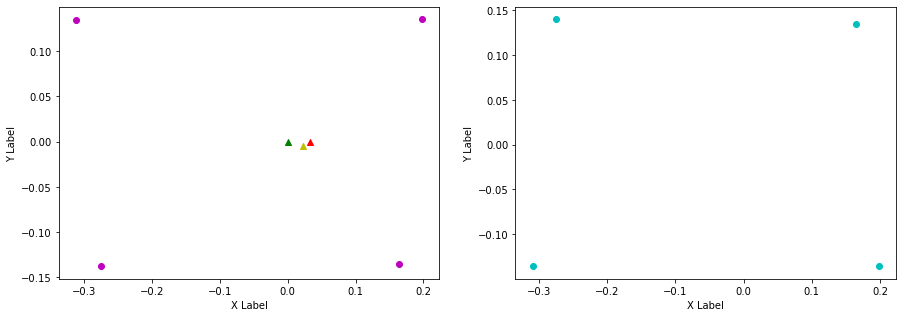

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.136, -0.135.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.275, -0.31, RL (y): 0.14, 0.134.
RL displacement: -0.034999999999999976, -0.006000000000000005.

RR (x): -0.309, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04686665]. Velocity y: [0.01571639]. Angular -0.017240187363049768
Odom velocity x: 0.0555124173014. Odom velocity y: 0.00566030642998. Odom velocity yaw: -0.273755947549
Base displacement (Odom): [[0.015934658268888402], [0.005343569656405478]]. Rotation displacement: -0.12861849782391538.



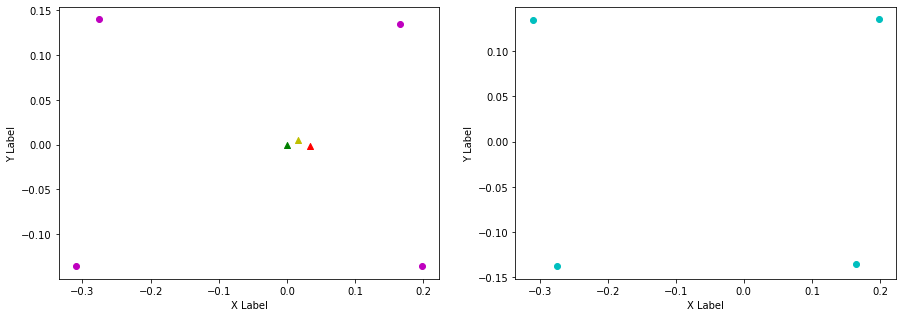

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.165, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.032, -0.0020000000000000018.

RL (x): -0.31, -0.275, RL (y): 0.134, 0.141.
RL displacement: 0.034999999999999976, 0.0069999999999999785.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.05643663]. Velocity y: [-0.01200514]. Angular 0.0230081141986568
Odom velocity x: 0.0577215943025. Odom velocity y: -0.00364137710315. Odom velocity yaw: 0.248961605187
Base displacement (Odom): [[0.019188462208550305], [-0.004081749101495502]]. Rotation displacement: -0.3358485063492659.



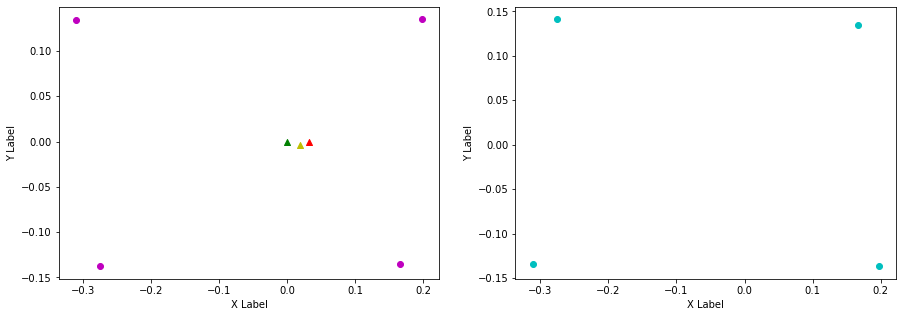

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.197, FL (y): 0.135, 0.135.
FL displacement: 0.031, 0.0.

FR (x): 0.197, 0.164, FR (y): -0.137, -0.135.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.275, -0.312, RL (y): 0.141, 0.134.
RL displacement: -0.03699999999999998, -0.0069999999999999785.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.04891528]. Velocity y: [0.00997518]. Angular -0.055923278552872935
Odom velocity x: 0.0563989223194. Odom velocity y: 0.00387109682541. Odom velocity yaw: -0.282905156618
Base displacement (Odom): [[0.01712034380750893], [0.003491313211873681]]. Rotation displacement: 0.44821126611864864.



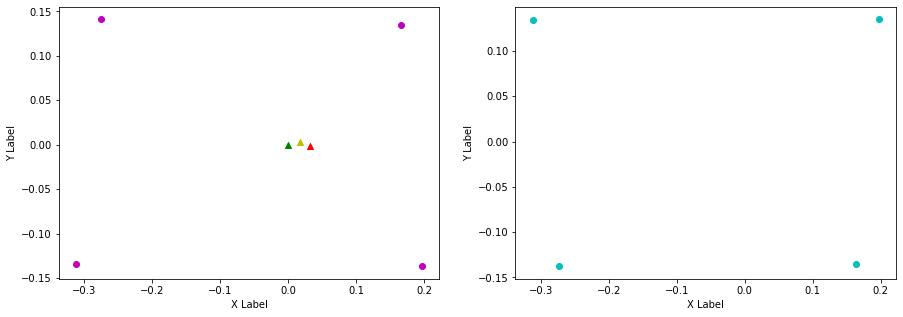

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.166, FL (y): 0.135, 0.135.
FL displacement: -0.031, 0.0.

FR (x): 0.164, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.034, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0].

Velocity x: [0.08215549]. Velocity y: [-0.02504833]. Angular 0.024428077558699426
Odom velocity x: 0.0698075728365. Odom velocity y: -0.00939820721797. Odom velocity yaw: 0.214526707076
Base displacement (Odom): [[0.021360427060606035], [-0.006512564951643762]]. Rotation displacement: -1.1214584375916754.



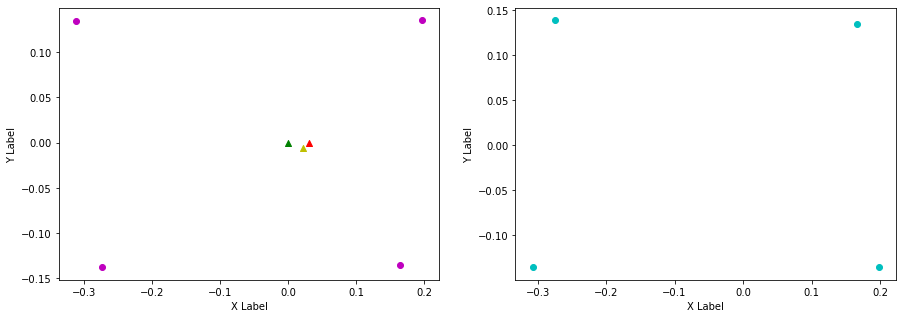

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.032, -0.0010000000000000009.

FR (x): 0.198, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.274, -0.31, RL (y): 0.139, 0.134.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.307, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.03199999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.04835316]. Velocity y: [0.01520693]. Angular -0.00749425338270138
Odom velocity x: 0.0649368441113. Odom velocity y: 0.0042752219647. Odom velocity yaw: -0.290011790202
Base displacement (Odom): [[0.017890675315939575], [0.005626566566323987]]. Rotation displacement: 0.36390268054237507.



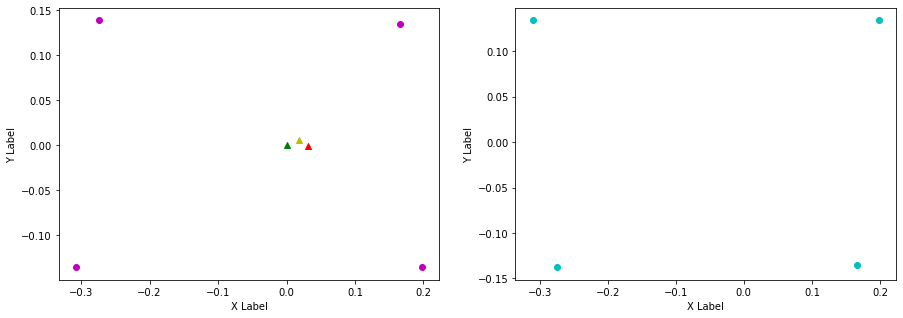

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.166, FL (y): 0.134, 0.135.
FL displacement: -0.032, 0.0010000000000000009.

FR (x): 0.166, 0.196, FR (y): -0.135, -0.137.
FR displacement: 0.03, -0.0020000000000000018.

RL (x): -0.31, -0.275, RL (y): 0.134, 0.141.
RL displacement: 0.034999999999999976, 0.0069999999999999785.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.09946571]. Velocity y: [-0.02188039]. Angular 0.029435745822853847
Odom velocity x: 0.0809685621422. Odom velocity y: -0.00786068859192. Odom velocity yaw: 0.236050970715
Base displacement (Odom): [[0.030834365382589102], [-0.0067829183519882985]]. Rotation displacement: -0.15887401632391399.



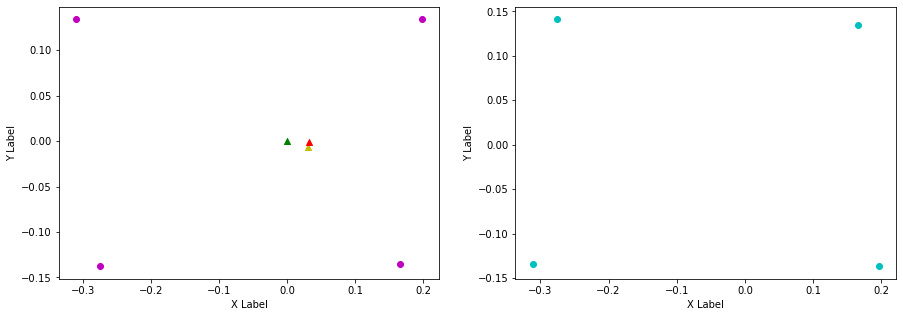

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.133.
FL displacement: 0.033, -0.0020000000000000018.

FR (x): 0.196, 0.169, FR (y): -0.137, -0.136.
FR displacement: -0.026999999999999996, 0.0010000000000000009.

RL (x): -0.275, -0.305, RL (y): 0.141, 0.135.
RL displacement: -0.02999999999999997, -0.005999999999999978.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.137.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.035316]. Velocity y: [0.0035995]. Angular -0.020476418495593972
Odom velocity x: 0.0643682758538. Odom velocity y: -0.00348102645395. Odom velocity yaw: -0.226836170702
Base displacement (Odom): [[0.010241639469039221], [0.001043853662240135]]. Rotation displacement: 0.5228285442606821.



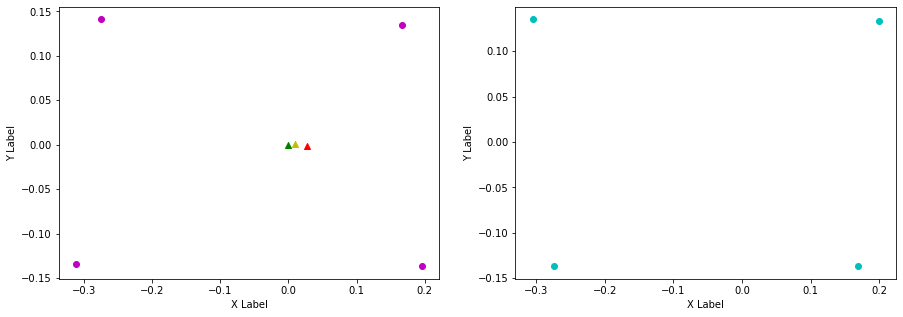

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.173, FL (y): 0.133, 0.138.
FL displacement: -0.026000000000000023, 0.0050000000000000044.

FR (x): 0.169, 0.203, FR (y): -0.136, -0.134.
FR displacement: 0.034, 0.0020000000000000018.

RL (x): -0.305, -0.271, RL (y): 0.135, 0.138.
RL displacement: 0.033999999999999975, 0.0030000000000000027.

RR (x): -0.274, -0.295, RR (y): -0.137, -0.137.
RR displacement: -0.020999999999999963, 0.0.


Base displacement (Foot): [0.026000000000000023, -0.0050000000000000044].

Velocity x: [0.06813512]. Velocity y: [-0.02524955]. Angular -0.03919765365714928
Odom velocity x: 0.0657279097174. Odom velocity y: -0.0141320432136. Odom velocity yaw: 0.169257699798
Base displacement (Odom): [[0.02112188312578933], [-0.007827360060175481]]. Rotation displacement: -0.34023153945443463.



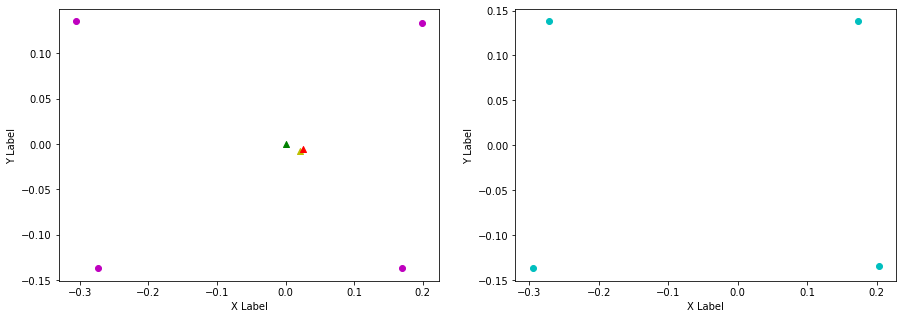

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.173, 0.197, FL (y): 0.138, 0.135.
FL displacement: 0.02400000000000002, -0.0030000000000000027.

FR (x): 0.203, 0.164, FR (y): -0.134, -0.135.
FR displacement: -0.03900000000000001, -0.0010000000000000009.

RL (x): -0.271, -0.312, RL (y): 0.138, 0.134.
RL displacement: -0.04099999999999998, -0.0040000000000000036.

RR (x): -0.295, -0.275, RR (y): -0.137, -0.139.
RR displacement: 0.019999999999999962, -0.0020000000000000018.


Base displacement (Foot): [0.03900000000000001, 0.0010000000000000009].

Velocity x: [0.04582005]. Velocity y: [0.00599236]. Angular -0.00432576373134655
Odom velocity x: 0.0586347178655. Odom velocity y: -0.0038389511639. Odom velocity yaw: -0.281106482686
Base displacement (Odom): [[0.017411622636362978], [0.002277099154771367]]. Rotation displacement: -0.6962165091156121.



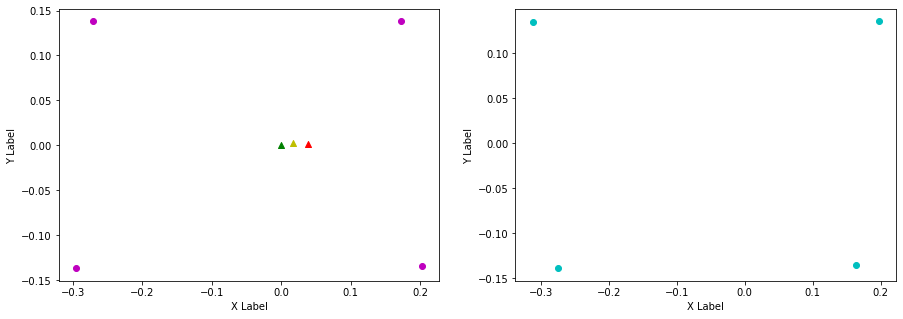

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.164, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.141.
RL displacement: 0.03699999999999998, 0.0069999999999999785.

RR (x): -0.275, -0.311, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.0505118]. Velocity y: [-0.0108405]. Angular -0.0019329324751953172
Odom velocity x: 0.0542925164415. Odom velocity y: -0.00678144663413. Odom velocity yaw: 0.195700377836
Base displacement (Odom): [[0.015153537662256689], [-0.003252148976302438]]. Rotation displacement: -0.09418227025518289.



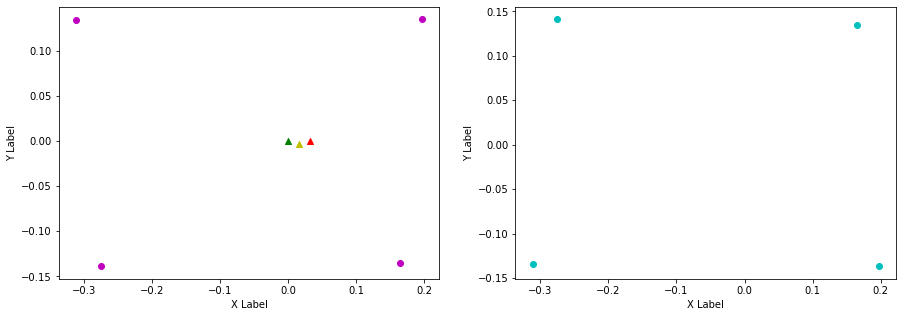

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.197, 0.166, FR (y): -0.137, -0.135.
FR displacement: -0.031, 0.0020000000000000018.

RL (x): -0.275, -0.309, RL (y): 0.141, 0.135.
RL displacement: -0.033999999999999975, -0.005999999999999978.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.06173625]. Velocity y: [0.01458214]. Angular -0.020260537308233035
Odom velocity x: 0.0602269105189. Odom velocity y: 0.00524805284266. Odom velocity yaw: -0.274185463603
Base displacement (Odom): [[0.021607682136997042], [0.005103746168773959]]. Rotation displacement: -0.03322465659282243.



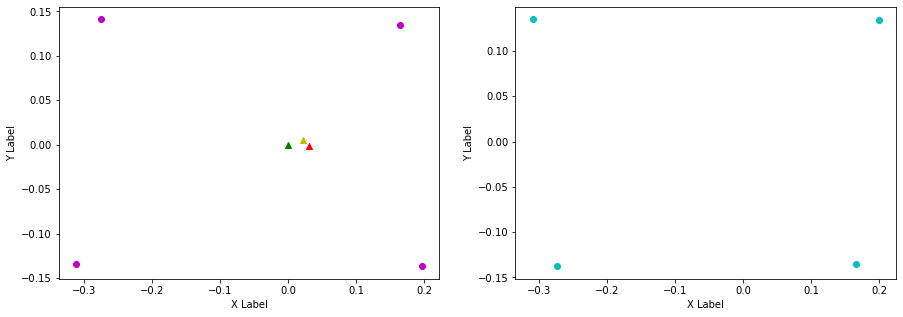

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.172, FL (y): 0.134, 0.138.
FL displacement: -0.027000000000000024, 0.0040000000000000036.

FR (x): 0.166, 0.202, FR (y): -0.135, -0.134.
FR displacement: 0.036000000000000004, 0.0010000000000000009.

RL (x): -0.309, -0.272, RL (y): 0.135, 0.139.
RL displacement: 0.03699999999999998, 0.0040000000000000036.

RR (x): -0.274, -0.297, RR (y): -0.138, -0.137.
RR displacement: -0.022999999999999965, 0.0010000000000000009.


Base displacement (Foot): [0.027000000000000024, -0.0040000000000000036].

Velocity x: [0.06404886]. Velocity y: [-0.02672805]. Angular 0.0042318009052652265
Odom velocity x: 0.0639530956022. Odom velocity y: -0.0107281137221. Odom velocity yaw: 0.205995643831
Base displacement (Odom): [[0.01985515803453275], [-0.008285700557741915]]. Rotation displacement: -0.40629503674354245.



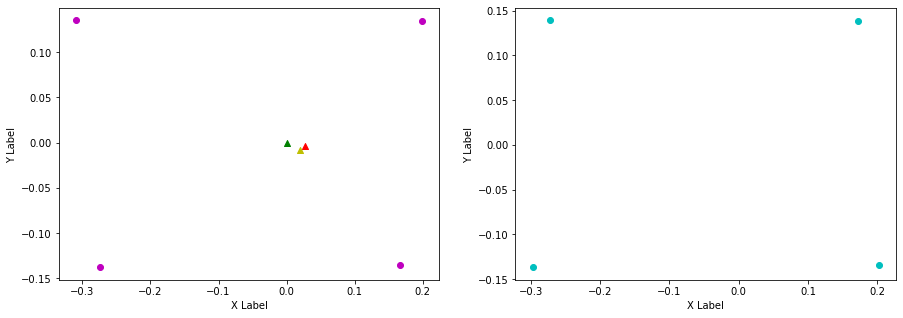

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.2, FL (y): 0.138, 0.133.
FL displacement: 0.028000000000000025, -0.0050000000000000044.

FR (x): 0.202, 0.17, FR (y): -0.134, -0.136.
FR displacement: -0.032, -0.0020000000000000018.

RL (x): -0.272, -0.303, RL (y): 0.139, 0.136.
RL displacement: -0.030999999999999972, -0.0030000000000000027.

RR (x): -0.297, -0.274, RR (y): -0.137, -0.137.
RR displacement: 0.022999999999999965, 0.0.


Base displacement (Foot): [0.032, 0.0020000000000000018].

Velocity x: [0.09288742]. Velocity y: [0.02887761]. Angular 0.008212880531502606
Odom velocity x: 0.0830773669724. Odom velocity y: 0.00954957505847. Odom velocity yaw: -0.252401317662
Base displacement (Odom): [[0.028795093547340223], [0.008952058388632445]]. Rotation displacement: 0.07516398673359605.



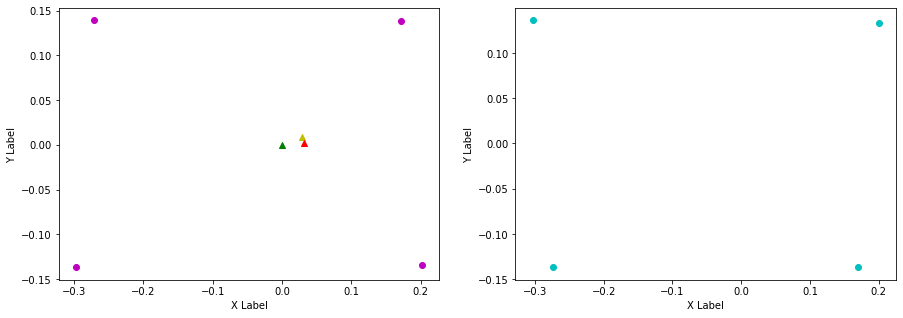

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.172, FL (y): 0.133, 0.137.
FL displacement: -0.028000000000000025, 0.0040000000000000036.

FR (x): 0.17, 0.202, FR (y): -0.136, -0.134.
FR displacement: 0.032, 0.0020000000000000018.

RL (x): -0.303, -0.272, RL (y): 0.136, 0.139.
RL displacement: 0.030999999999999972, 0.0030000000000000027.

RR (x): -0.274, -0.296, RR (y): -0.137, -0.137.
RR displacement: -0.021999999999999964, 0.0.


Base displacement (Foot): [0.028000000000000025, -0.0040000000000000036].

Velocity x: [0.03054279]. Velocity y: [-0.01018716]. Angular -0.01613615560352343
Odom velocity x: 0.0557703983265. Odom velocity y: 0.000322875306814. Odom velocity yaw: 0.228593148003
Base displacement (Odom): [[0.010384544935010176], [-0.0034636336512283705]]. Rotation displacement: 0.14587462462522724.



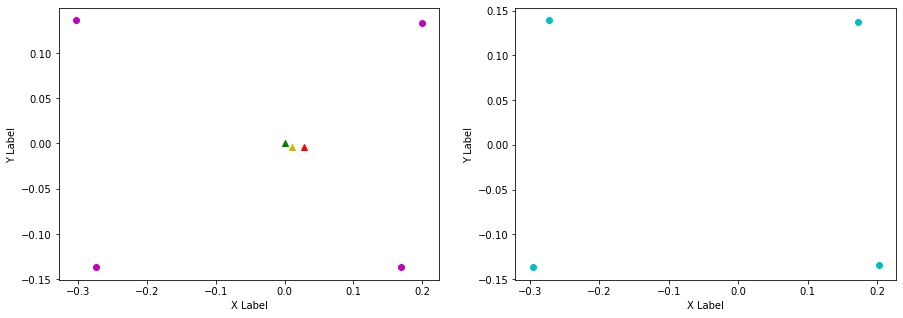

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.027000000000000024, -0.0030000000000000027.

FR (x): 0.202, 0.167, FR (y): -0.134, -0.135.
FR displacement: -0.035, -0.0010000000000000009.

RL (x): -0.272, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.296, -0.274, RR (y): -0.137, -0.137.
RR displacement: 0.021999999999999964, 0.0.


Base displacement (Foot): [0.035, 0.0010000000000000009].

Velocity x: [0.05655313]. Velocity y: [0.00949465]. Angular 0.007400372773923174
Odom velocity x: 0.0580348975691. Odom velocity y: 0.00496627541321. Odom velocity yaw: -0.217909454504
Base displacement (Odom): [[0.016965937699136013], [0.0028483940707120237]]. Rotation displacement: -0.31434134928705393.



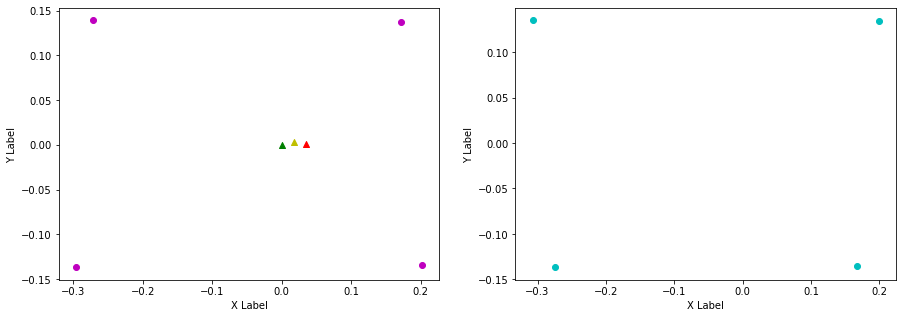

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.167, 0.2, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.307, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.033999999999999975, 0.0040000000000000036.

RR (x): -0.274, -0.304, RR (y): -0.137, -0.136.
RR displacement: -0.02999999999999997, 0.0010000000000000009.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.05158384]. Velocity y: [-0.01887308]. Angular -0.04386208986774181
Odom velocity x: 0.0571271487351. Odom velocity y: -0.00728925029051. Odom velocity yaw: 0.174011424899
Base displacement (Odom): [[0.016506838010644564], [-0.006039389952068763]]. Rotation displacement: 0.1272030178124175.



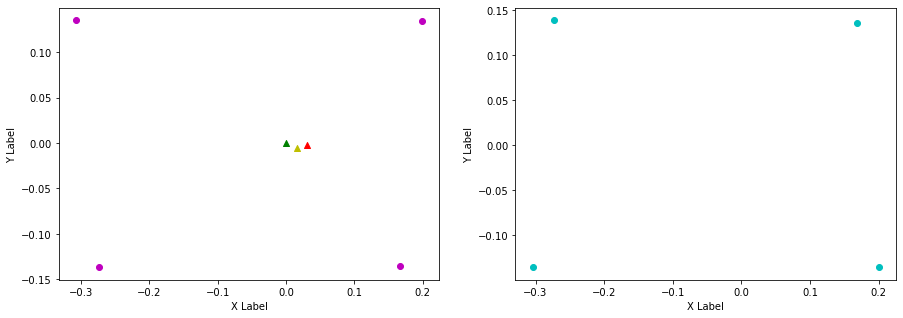

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.198, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.2, 0.164, FR (y): -0.136, -0.135.
FR displacement: -0.036000000000000004, 0.0010000000000000009.

RL (x): -0.273, -0.312, RL (y): 0.139, 0.135.
RL displacement: -0.03899999999999998, -0.0040000000000000036.

RR (x): -0.304, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.02899999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0010000000000000009].

Velocity x: [0.09044069]. Velocity y: [0.01435356]. Angular -0.013598757457072468
Odom velocity x: 0.0810140604117. Odom velocity y: 0.0052659126262. Odom velocity yaw: -0.278558887952
Base displacement (Odom): [[0.035271855670297114], [0.0055978875101307946]]. Rotation displacement: -0.8041964730188182.



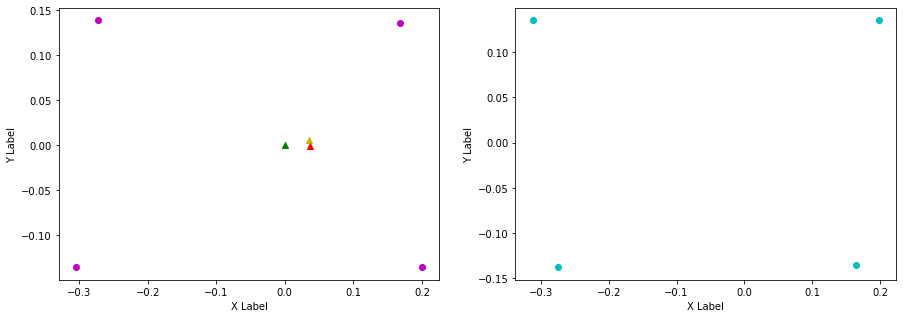

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.164, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.312, -0.275, RL (y): 0.135, 0.141.
RL displacement: 0.03699999999999998, 0.005999999999999978.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.02050821]. Velocity y: [-0.0093228]. Angular 0.02094830511298312
Odom velocity x: 0.0517921388936. Odom velocity y: -0.00101996707971. Odom velocity yaw: 0.218583646371
Base displacement (Odom): [[0.006152462371994183], [-0.0027968406054632577]]. Rotation displacement: -0.30386894544786397.



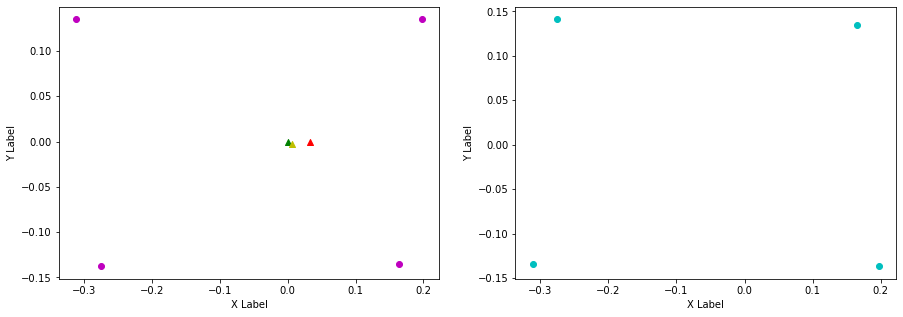

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.197, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.032, 0.0020000000000000018.

RL (x): -0.275, -0.312, RL (y): 0.141, 0.134.
RL displacement: -0.03699999999999998, -0.0069999999999999785.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0020000000000000018].

Velocity x: [0.06207531]. Velocity y: [0.01903511]. Angular -0.04026260354902348
Odom velocity x: 0.0576935769467. Odom velocity y: 0.0105670774125. Odom velocity yaw: -0.288459347744
Base displacement (Odom): [[0.022347121149767446], [0.006852641815895177]]. Rotation displacement: 0.36007478404552207.



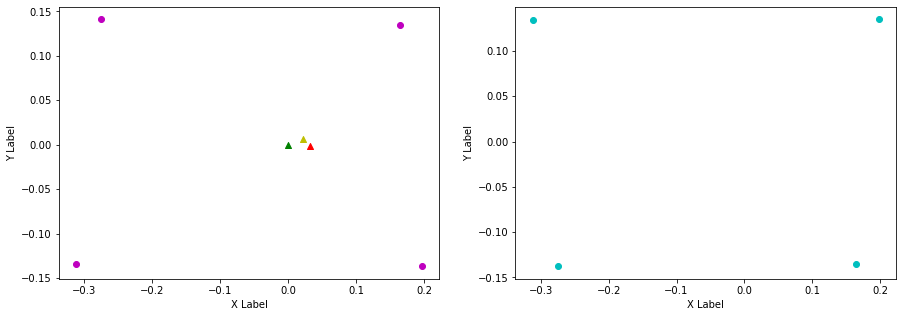

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.275, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.04116808]. Velocity y: [-0.00486837]. Angular 0.03481803905628389
Odom velocity x: 0.0487901654345. Odom velocity y: 0.00429268584505. Odom velocity yaw: 0.234026416197
Base displacement (Odom): [[0.01235042353571636], [-0.00146051045090978]]. Rotation displacement: -0.8304761200056407.



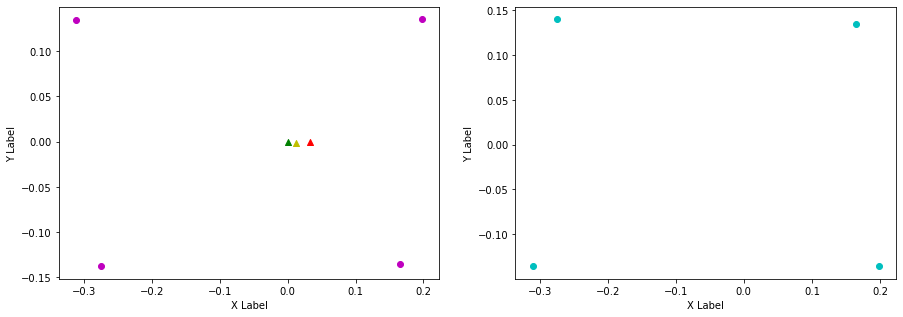

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.167, FR (y): -0.136, -0.135.
FR displacement: -0.031, 0.0010000000000000009.

RL (x): -0.274, -0.308, RL (y): 0.14, 0.134.
RL displacement: -0.033999999999999975, -0.006000000000000005.

RR (x): -0.31, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0010000000000000009].

Velocity x: [0.11065795]. Velocity y: [0.02887657]. Angular -0.009658568494821792
Odom velocity x: 0.0824787491924. Odom velocity y: 0.0175427690954. Odom velocity yaw: -0.245449117274
Base displacement (Odom): [[0.032090800816092724], [0.008374203573077166]]. Rotation displacement: 0.5984779115285019.



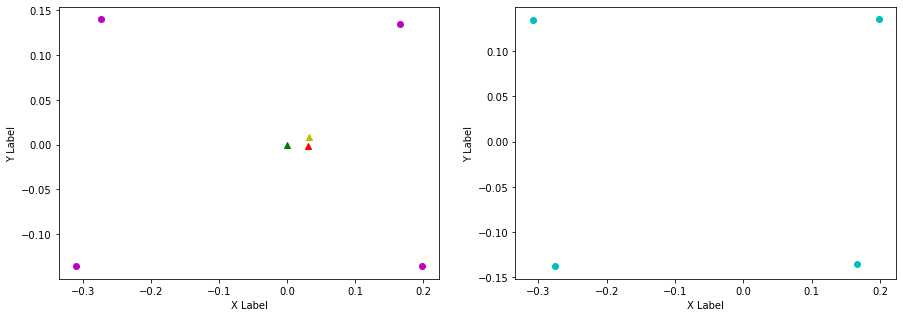

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.167, FL (y): 0.135, 0.136.
FL displacement: -0.031, 0.0010000000000000009.

FR (x): 0.167, 0.199, FR (y): -0.135, -0.135.
FR displacement: 0.032, 0.0.

RL (x): -0.308, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.033999999999999975, 0.0050000000000000044.

RR (x): -0.275, -0.305, RR (y): -0.138, -0.135.
RR displacement: -0.02999999999999997, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0010000000000000009].

Velocity x: [0.07032204]. Velocity y: [-0.02378929]. Angular -0.013972603592981615
Odom velocity x: 0.0801670113856. Odom velocity y: -0.00346877580603. Odom velocity yaw: 0.22987312066
Base displacement (Odom): [[0.024612725522881185], [-0.008326254545607759]]. Rotation displacement: -0.16048459004812873.



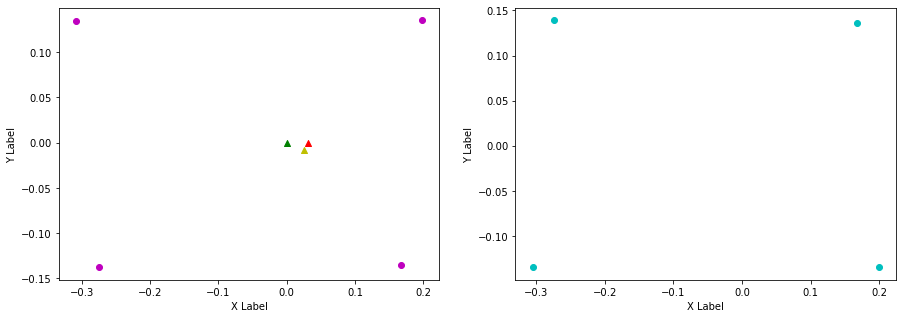

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.197, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.199, 0.164, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.305, -0.275, RR (y): -0.135, -0.139.
RR displacement: 0.02999999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.10136311]. Velocity y: [0.02476911]. Angular -0.0470653565085377
Odom velocity x: 0.10021412815. Odom velocity y: 0.0130242894408. Odom velocity yaw: -0.293343122569
Base displacement (Odom): [[0.039531598632814635], [0.009659950220657798]]. Rotation displacement: -0.28020003966314266.



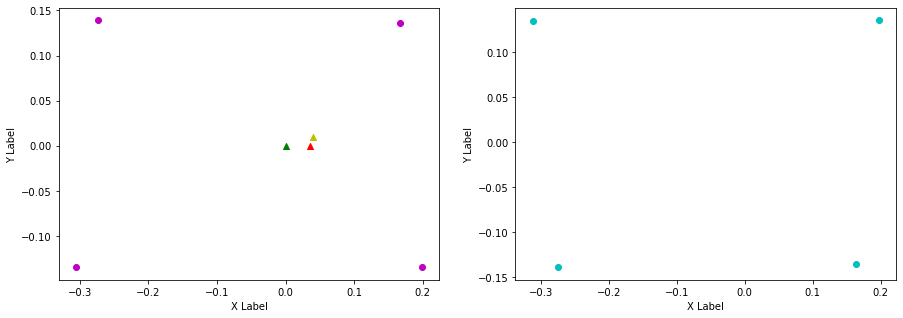

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.167, FL (y): 0.135, 0.136.
FL displacement: -0.03, 0.0010000000000000009.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.305, RR (y): -0.139, -0.135.
RR displacement: -0.02999999999999997, 0.0040000000000000036.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.01560495]. Velocity y: [-0.01186986]. Angular 0.03839048581039073
Odom velocity x: 0.0664473798755. Odom velocity y: 0.00419451052795. Odom velocity yaw: 0.204063423051
Base displacement (Odom): [[0.003901237032004623], [-0.0029674651016575737]]. Rotation displacement: -1.0516916927538154.



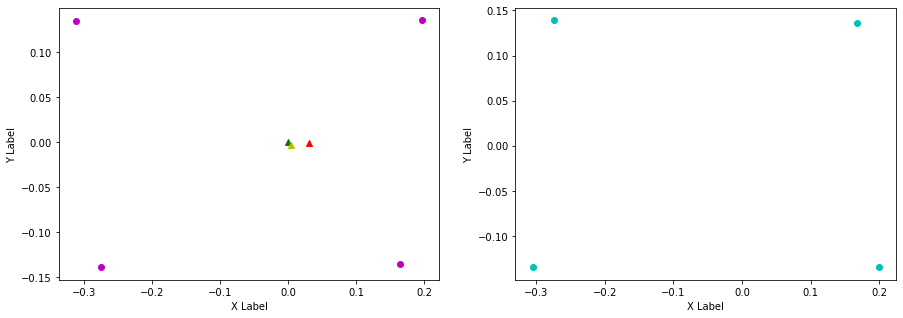

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.03, 0.0.

FR (x): 0.199, 0.166, FR (y): -0.135, -0.134.
FR displacement: -0.033, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.305, -0.274, RR (y): -0.135, -0.139.
RR displacement: 0.030999999999999972, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.0546715]. Velocity y: [0.01242949]. Angular -0.020271891390709815
Odom velocity x: 0.0591976165518. Odom velocity y: 0.00871571734583. Odom velocity yaw: -0.301828548869
Base displacement (Odom): [[0.019681749078515054], [0.004474617382622004]]. Rotation displacement: 0.5499032025980657.



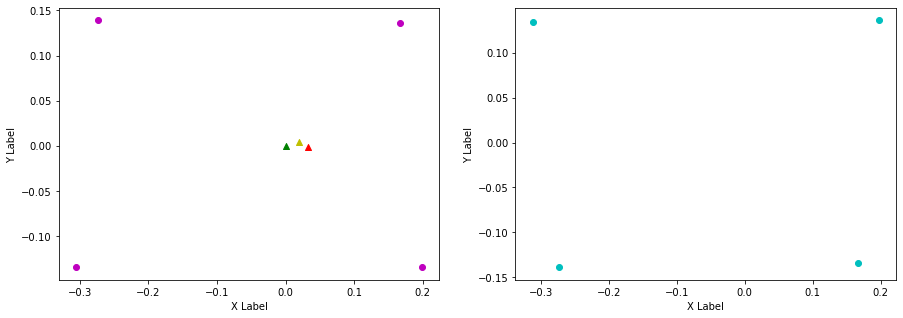

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.032, -0.0010000000000000009.

FR (x): 0.166, 0.197, FR (y): -0.134, -0.136.
FR displacement: 0.031, -0.0020000000000000018.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.274, -0.31, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.11377345]. Velocity y: [-0.03182418]. Angular 0.03920301293029141
Odom velocity x: 0.0908562081139. Odom velocity y: -0.0124308324068. Odom velocity yaw: 0.236109085805
Base displacement (Odom): [[0.03754522854265385], [-0.010501976643664257]]. Rotation displacement: -0.4181379300728495.



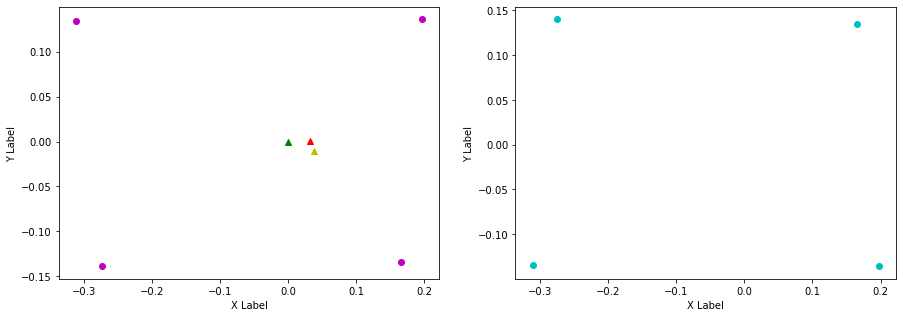

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.197, 0.168, FR (y): -0.136, -0.136.
FR displacement: -0.028999999999999998, 0.0.

RL (x): -0.275, -0.305, RL (y): 0.14, 0.135.
RL displacement: -0.02999999999999997, -0.0050000000000000044.

RR (x): -0.31, -0.275, RR (y): -0.134, -0.137.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.028999999999999998, -0.0].

Velocity x: [0.04970899]. Velocity y: [0.00872641]. Angular -0.018683496391388995
Odom velocity x: 0.0750959062002. Odom velocity y: -0.00464192136316. Odom velocity yaw: -0.209125662014
Base displacement (Odom): [[0.013421426880949383], [0.0023561311544437746]]. Rotation displacement: 0.741234999714866.



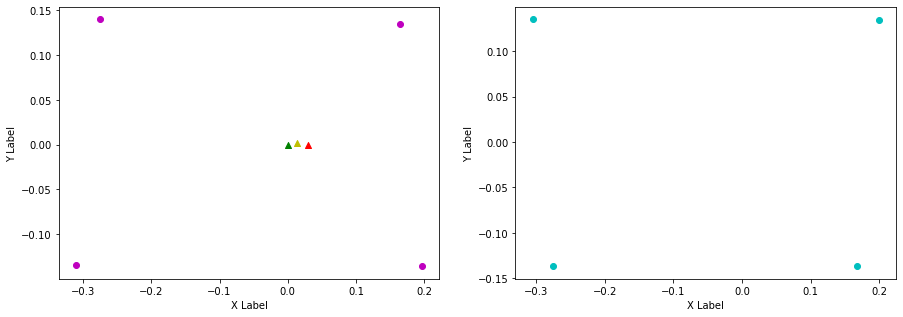

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.17, FL (y): 0.134, 0.137.
FL displacement: -0.028999999999999998, 0.0030000000000000027.

FR (x): 0.168, 0.201, FR (y): -0.136, -0.135.
FR displacement: 0.033, 0.0010000000000000009.

RL (x): -0.305, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.03199999999999997, 0.0040000000000000036.

RR (x): -0.275, -0.3, RR (y): -0.137, -0.136.
RR displacement: -0.024999999999999967, 0.0010000000000000009.


Base displacement (Foot): [0.028999999999999998, -0.0030000000000000027].

Velocity x: [0.04206151]. Velocity y: [-0.0074386]. Angular -0.036426334690646274
Odom velocity x: 0.0609351600748. Odom velocity y: -0.00628651577385. Odom velocity yaw: 0.202336043122
Base displacement (Odom): [[0.014300910691154911], [-0.0025291245971366116]]. Rotation displacement: -0.2890310618212228.



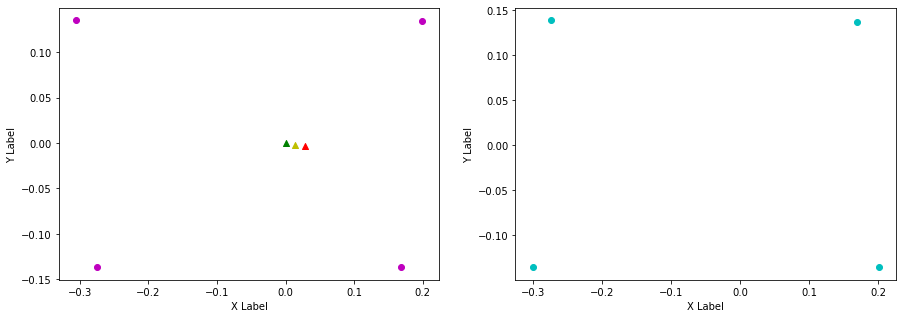

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.2, FL (y): 0.137, 0.133.
FL displacement: 0.03, -0.0040000000000000036.

FR (x): 0.201, 0.171, FR (y): -0.135, -0.136.
FR displacement: -0.03, -0.0010000000000000009.

RL (x): -0.273, -0.302, RL (y): 0.139, 0.135.
RL displacement: -0.02899999999999997, -0.0040000000000000036.

RR (x): -0.3, -0.274, RR (y): -0.136, -0.137.
RR displacement: 0.025999999999999968, -0.0010000000000000009.


Base displacement (Foot): [0.03, 0.0010000000000000009].

Velocity x: [0.10820967]. Velocity y: [0.02961062]. Angular 0.020564404785085897
Odom velocity x: 0.0890381418866. Odom velocity y: 0.0131857412383. Odom velocity yaw: -0.223276261099
Base displacement (Odom): [[0.033545018682803907], [0.009179297472684533]]. Rotation displacement: -0.7096054027725988.



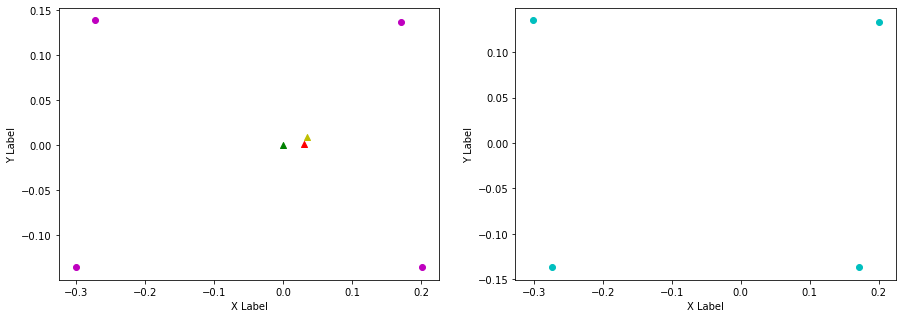

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.169, FL (y): 0.133, 0.136.
FL displacement: -0.031, 0.0030000000000000027.

FR (x): 0.171, 0.2, FR (y): -0.136, -0.134.
FR displacement: 0.028999999999999998, 0.0020000000000000018.

RL (x): -0.302, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.02799999999999997, 0.0040000000000000036.

RR (x): -0.274, -0.302, RR (y): -0.137, -0.136.
RR displacement: -0.02799999999999997, 0.0010000000000000009.


Base displacement (Foot): [0.031, -0.0030000000000000027].

Velocity x: [0.09338332]. Velocity y: [-0.03310031]. Angular -0.034445170525846745
Odom velocity x: 0.097178085792. Odom velocity y: -0.0103136759881. Odom velocity yaw: 0.182712391823
Base displacement (Odom): [[0.03081648914615176], [-0.010923099226742172]]. Rotation displacement: 0.3652588302363953.



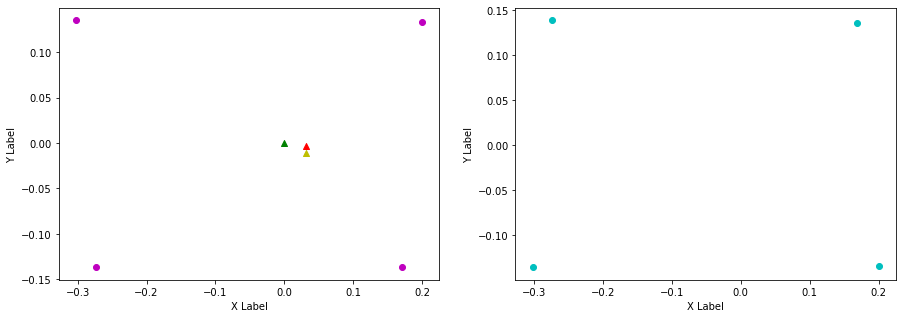

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.03, -0.0020000000000000018.

FR (x): 0.2, 0.166, FR (y): -0.134, -0.135.
FR displacement: -0.034, -0.0010000000000000009.

RL (x): -0.274, -0.308, RL (y): 0.139, 0.135.
RL displacement: -0.033999999999999975, -0.0040000000000000036.

RR (x): -0.302, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.02699999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.034, 0.0010000000000000009].

Velocity x: [0.07579683]. Velocity y: [0.02309354]. Angular 0.00316549587866102
Odom velocity x: 0.0875307399876. Odom velocity y: 0.00693970661086. Odom velocity yaw: -0.248236702152
Base displacement (Odom): [[0.025012949223540915], [0.007620865091051421]]. Rotation displacement: -0.6512756050231145.



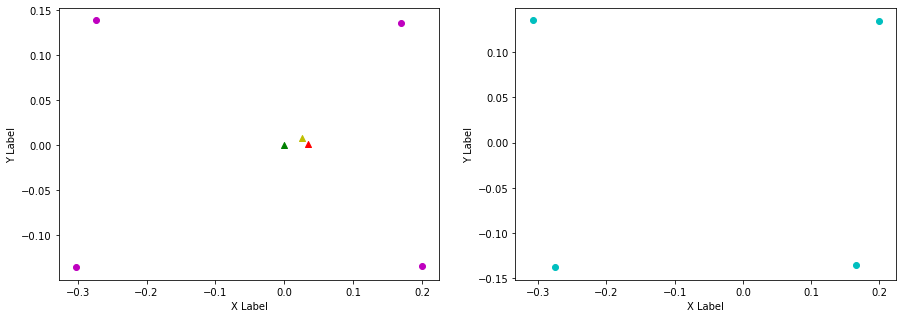

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.174, FL (y): 0.134, 0.138.
FL displacement: -0.025000000000000022, 0.0040000000000000036.

FR (x): 0.166, 0.204, FR (y): -0.135, -0.134.
FR displacement: 0.03799999999999998, 0.0010000000000000009.

RL (x): -0.308, -0.271, RL (y): 0.135, 0.138.
RL displacement: 0.03699999999999998, 0.0030000000000000027.

RR (x): -0.275, -0.294, RR (y): -0.138, -0.137.
RR displacement: -0.01899999999999996, 0.0010000000000000009.


Base displacement (Foot): [0.025000000000000022, -0.0040000000000000036].

Velocity x: [0.03668601]. Velocity y: [-0.00796381]. Angular -0.03227627720704972
Odom velocity x: 0.0650396711148. Odom velocity y: 0.000521975688445. Odom velocity yaw: 0.144568531291
Base displacement (Odom): [[0.011372671160286174], [-0.0024687822396973758]]. Rotation displacement: 0.059851938954000934.



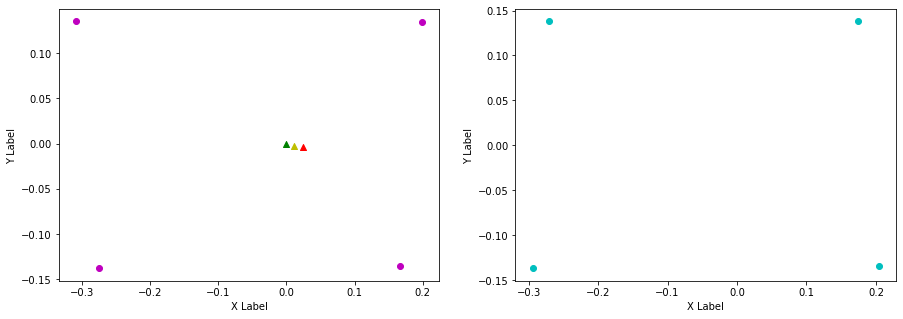

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.174, 0.199, FL (y): 0.138, 0.134.
FL displacement: 0.025000000000000022, -0.0040000000000000036.

FR (x): 0.204, 0.167, FR (y): -0.134, -0.136.
FR displacement: -0.03699999999999998, -0.0020000000000000018.

RL (x): -0.271, -0.307, RL (y): 0.138, 0.135.
RL displacement: -0.035999999999999976, -0.0030000000000000027.

RR (x): -0.294, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.019999999999999962, -0.0010000000000000009.


Base displacement (Foot): [0.03699999999999998, 0.0020000000000000018].

Velocity x: [0.09339265]. Velocity y: [0.02445991]. Angular 0.03834900750211258
Odom velocity x: 0.0857188389832. Odom velocity y: 0.0144880518687. Odom velocity yaw: -0.158171475364
Base displacement (Odom): [[0.03175349435742891], [0.008316367962251325]]. Rotation displacement: -0.5732816184197361.



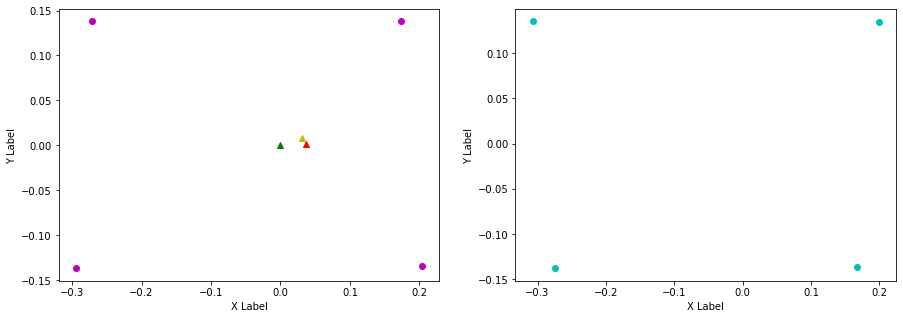

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.167, 0.2, FR (y): -0.136, -0.135.
FR displacement: 0.033, 0.0010000000000000009.

RL (x): -0.307, -0.273, RL (y): 0.135, 0.139.
RL displacement: 0.033999999999999975, 0.0040000000000000036.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.06955226]. Velocity y: [-0.01687095]. Angular -0.032774165123462845
Odom velocity x: 0.081205392324. Odom velocity y: -0.00158070114092. Odom velocity yaw: 0.213309830573
Base displacement (Odom): [[0.024343283807532146], [-0.005904831278543243]]. Rotation displacement: 0.7470601460611355.



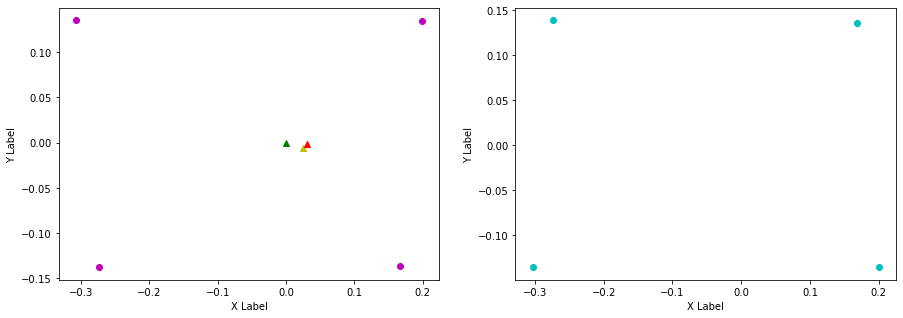

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.2, FL (y): 0.136, 0.133.
FL displacement: 0.032, -0.0030000000000000027.

FR (x): 0.2, 0.17, FR (y): -0.135, -0.136.
FR displacement: -0.03, -0.0010000000000000009.

RL (x): -0.273, -0.304, RL (y): 0.139, 0.135.
RL displacement: -0.030999999999999972, -0.0040000000000000036.

RR (x): -0.303, -0.274, RR (y): -0.136, -0.137.
RR displacement: 0.02899999999999997, -0.0010000000000000009.


Base displacement (Foot): [0.03, 0.0010000000000000009].

Velocity x: [0.11381894]. Velocity y: [0.02853076]. Angular 0.006229017781799753
Odom velocity x: 0.103607306043. Odom velocity y: 0.0146947789894. Odom velocity yaw: -0.247058521966
Base displacement (Odom): [[0.035283892621771784], [0.008844541698011632]]. Rotation displacement: -0.6572372894407498.



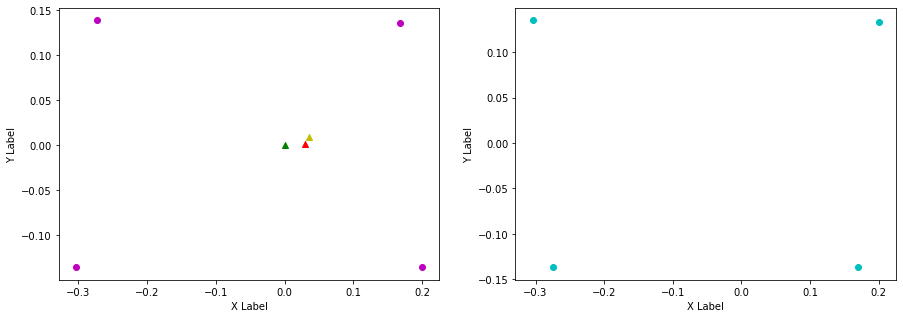

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.167, FL (y): 0.133, 0.136.
FL displacement: -0.033, 0.0030000000000000027.

FR (x): 0.17, 0.2, FR (y): -0.136, -0.135.
FR displacement: 0.03, 0.0010000000000000009.

RL (x): -0.304, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.02999999999999997, 0.0040000000000000036.

RR (x): -0.274, -0.306, RR (y): -0.137, -0.135.
RR displacement: -0.03199999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0030000000000000027].

Velocity x: [0.05356784]. Velocity y: [-0.00753405]. Angular -0.018561497505487554
Odom velocity x: 0.0824436854106. Odom velocity y: 0.00425040686571. Odom velocity yaw: 0.222214331305
Base displacement (Odom): [[0.018213060509869372], [-0.002561575658331261]]. Rotation displacement: 0.11063795778577311.



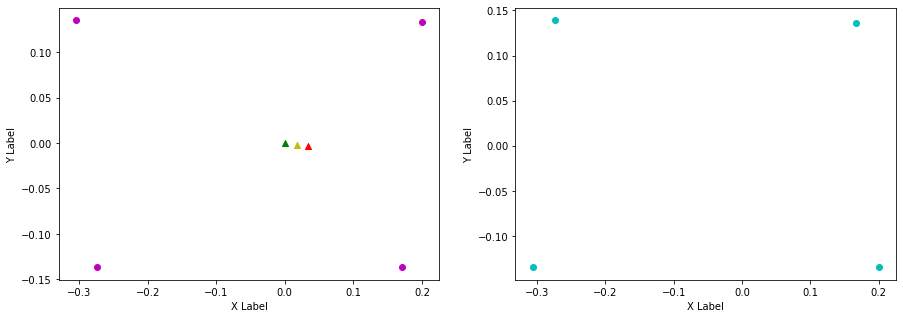

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.032, -0.0020000000000000018.

FR (x): 0.2, 0.168, FR (y): -0.135, -0.135.
FR displacement: -0.032, 0.0.

RL (x): -0.274, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.032999999999999974, -0.0040000000000000036.

RR (x): -0.306, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.03199999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.05519817]. Velocity y: [0.01193014]. Angular -0.026848700226764416
Odom velocity x: 0.0680633520256. Odom velocity y: 0.00834580369101. Odom velocity yaw: -0.279995972907
Base displacement (Odom): [[0.01876737364224379], [0.004056248242156002]]. Rotation displacement: -0.3615883680118462.



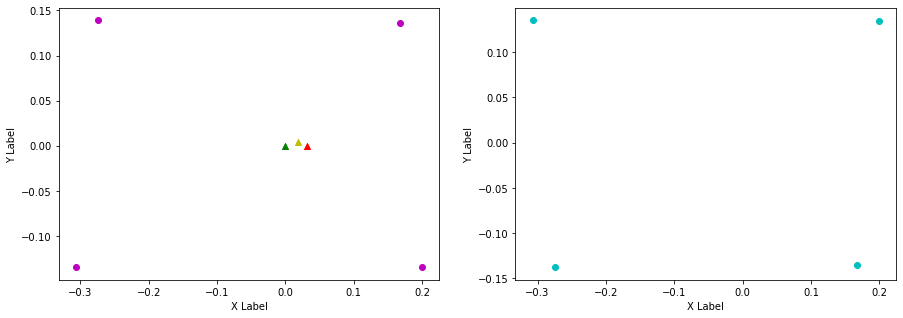

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.168, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.03, -0.0010000000000000009.

RL (x): -0.307, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.03199999999999997, 0.0050000000000000044.

RR (x): -0.274, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.034999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.05571296]. Velocity y: [-0.02244578]. Angular 0.0011533140275152764
Odom velocity x: 0.0613426964074. Odom velocity y: -0.00542891247321. Odom velocity yaw: 0.193999055796
Base displacement (Odom): [[0.015042497662824061], [-0.006060360771701134]]. Rotation displacement: -0.5230277188230577.



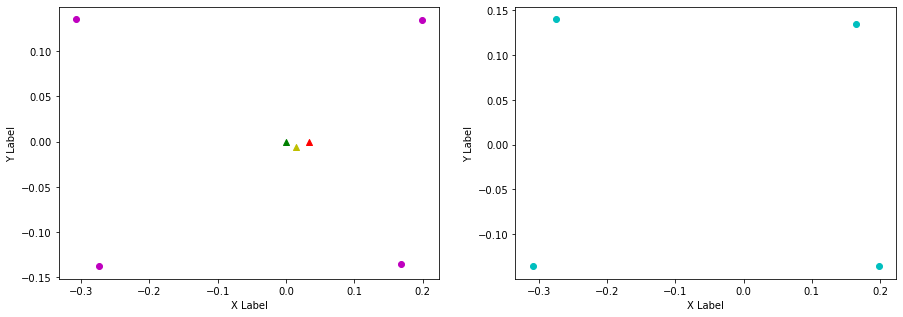

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.134.
FL displacement: 0.034, -0.0010000000000000009.

FR (x): 0.198, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.032, 0.0010000000000000009.

RL (x): -0.275, -0.308, RL (y): 0.14, 0.135.
RL displacement: -0.032999999999999974, -0.0050000000000000044.

RR (x): -0.309, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.033999999999999975, -0.0030000000000000027.


Base displacement (Foot): [0.032, -0.0010000000000000009].

Velocity x: [0.02633382]. Velocity y: [0.00814031]. Angular 0.012540396149596551
Odom velocity x: 0.0428542831621. Odom velocity y: 0.000785745597814. Odom velocity yaw: -0.197774054727
Base displacement (Odom): [[0.008690163271368512], [0.0026863032028745515]]. Rotation displacement: 0.01784160582168579.



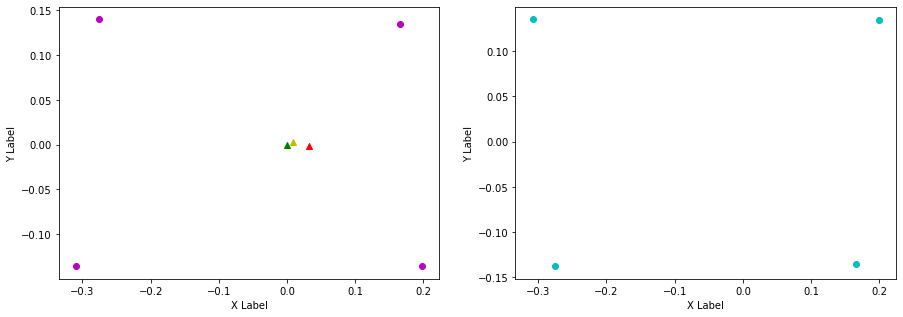

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.134.
FL displacement: -0.034, 0.0.

FR (x): 0.166, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.031, -0.0020000000000000018.

RL (x): -0.308, -0.274, RL (y): 0.135, 0.141.
RL displacement: 0.033999999999999975, 0.005999999999999978.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.06943966]. Velocity y: [-0.01843528]. Angular -0.004495883642746386
Odom velocity x: 0.05919479305. Odom velocity y: -0.0113137217428. Odom velocity yaw: 0.229641293542
Base displacement (Odom): [[0.026387063609724315], [-0.007005403418378409]]. Rotation displacement: 0.2371090015104749.



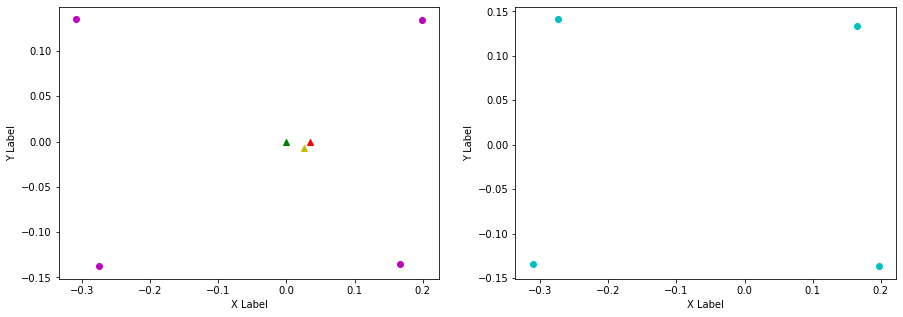

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.134, 0.134.
FL displacement: 0.034, 0.0.

FR (x): 0.197, 0.167, FR (y): -0.137, -0.135.
FR displacement: -0.03, 0.0020000000000000018.

RL (x): -0.274, -0.307, RL (y): 0.141, 0.135.
RL displacement: -0.032999999999999974, -0.005999999999999978.

RR (x): -0.311, -0.274, RR (y): -0.134, -0.138.
RR displacement: 0.03699999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.03, -0.0020000000000000018].

Velocity x: [0.07304475]. Velocity y: [0.02123658]. Angular -0.02501047748984678
Odom velocity x: 0.0676549038919. Odom velocity y: 0.00449605195651. Odom velocity yaw: -0.258748543747
Base displacement (Odom): [[0.02191342139554031], [0.006370974246501682]]. Rotation displacement: -0.09788612807023751.



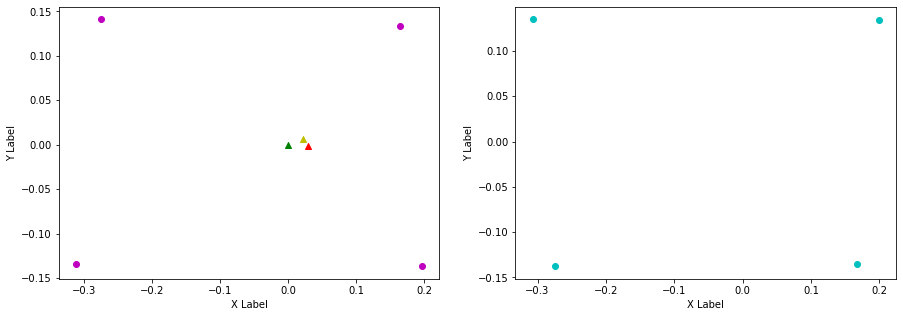

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.134.
FL displacement: -0.034, 0.0.

FR (x): 0.167, 0.197, FR (y): -0.135, -0.137.
FR displacement: 0.03, -0.0020000000000000018.

RL (x): -0.307, -0.275, RL (y): 0.135, 0.141.
RL displacement: 0.03199999999999997, 0.005999999999999978.

RR (x): -0.274, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.03699999999999998, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.07701336]. Velocity y: [-0.01789667]. Angular 0.01728937691938876
Odom velocity x: 0.075821673173. Odom velocity y: -0.00809220475451. Odom velocity yaw: 0.239230399429
Base displacement (Odom): [[0.027724820181867393], [-0.0064428038951220845]]. Rotation displacement: -0.42989837280203397.



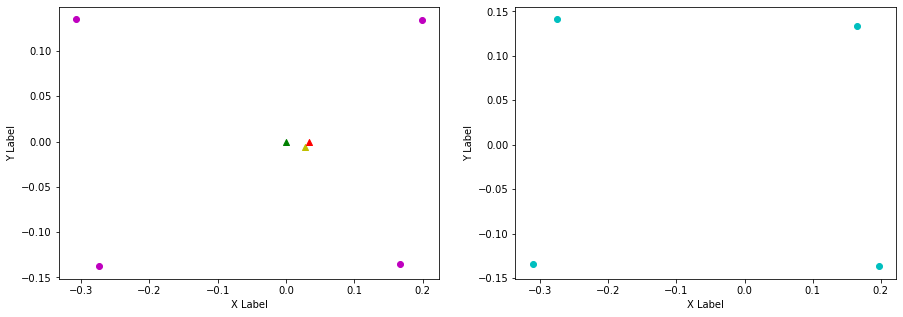

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.197, FL (y): 0.134, 0.135.
FL displacement: 0.032, 0.0010000000000000009.

FR (x): 0.197, 0.164, FR (y): -0.137, -0.135.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.275, -0.311, RL (y): 0.141, 0.135.
RL displacement: -0.035999999999999976, -0.005999999999999978.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.139.
RR displacement: 0.035999999999999976, -0.0050000000000000044.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.02188059]. Velocity y: [0.00356131]. Angular -0.06227570277174341
Odom velocity x: 0.0485304633678. Odom velocity y: -0.00350054633786. Odom velocity yaw: -0.289518229754
Base displacement (Odom): [[0.0067829808315673645], [0.0011040044500765234]]. Rotation displacement: 0.356619130301555.



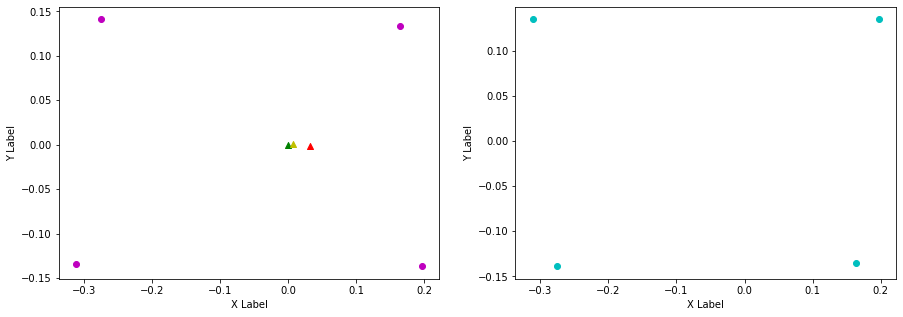

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.167, FL (y): 0.135, 0.136.
FL displacement: -0.03, 0.0010000000000000009.

FR (x): 0.164, 0.199, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.311, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03699999999999998, 0.0040000000000000036.

RR (x): -0.275, -0.305, RR (y): -0.139, -0.135.
RR displacement: -0.02999999999999997, 0.0040000000000000036.


Base displacement (Foot): [0.03, -0.0010000000000000009].

Velocity x: [0.07978324]. Velocity y: [-0.02420552]. Angular 0.009059122445876635
Odom velocity x: 0.0652845687518. Odom velocity y: -0.0141564458889. Odom velocity yaw: 0.208510173871
Base displacement (Odom): [[0.022339306203869924], [-0.006777544845352201]]. Rotation displacement: -1.1061216256896198.



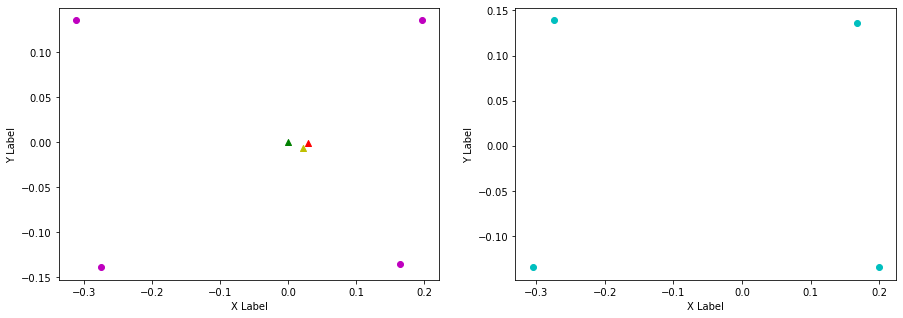

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.202, FL (y): 0.136, 0.132.
FL displacement: 0.035, -0.0040000000000000036.

FR (x): 0.199, 0.177, FR (y): -0.135, -0.137.
FR displacement: -0.02200000000000002, -0.0020000000000000018.

RL (x): -0.274, -0.295, RL (y): 0.139, 0.137.
RL displacement: -0.020999999999999963, -0.0020000000000000018.

RR (x): -0.305, -0.273, RR (y): -0.135, -0.137.
RR displacement: 0.03199999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.02200000000000002, 0.0020000000000000018].

Velocity x: [0.03444687]. Velocity y: [0.00551034]. Angular 0.005952657000716505
Odom velocity x: 0.0497653136776. Odom velocity y: -0.00470109085419. Odom velocity yaw: -0.270960480836
Base displacement (Odom): [[0.01205641081074571], [0.0019286188454614717]]. Rotation displacement: 0.14533384017734477.



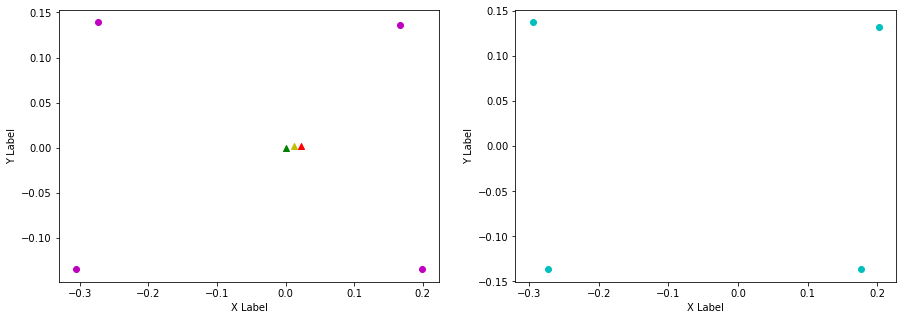

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.034, 0.0040000000000000036.

FR (x): 0.177, 0.2, FR (y): -0.137, -0.135.
FR displacement: 0.02300000000000002, 0.0020000000000000018.

RL (x): -0.295, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.020999999999999963, 0.0020000000000000018.

RR (x): -0.273, -0.304, RR (y): -0.137, -0.136.
RR displacement: -0.030999999999999972, 0.0010000000000000009.


Base displacement (Foot): [0.034, -0.0040000000000000036].

Velocity x: [0.0431116]. Velocity y: [-0.01748522]. Angular -0.02893290472829526
Odom velocity x: 0.04556497535. Odom velocity y: -0.0113374765486. Odom velocity yaw: 0.176450210941
Base displacement (Odom): [[0.012933477917924208], [-0.005245564002762659]]. Rotation displacement: 0.11937179184984863.



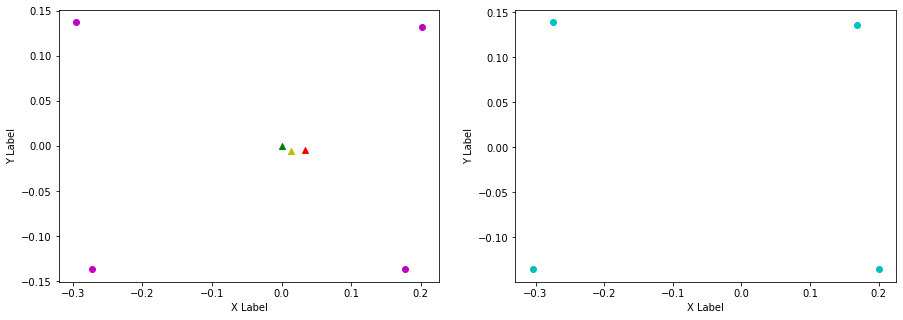

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.204, FL (y): 0.136, 0.132.
FL displacement: 0.035999999999999976, -0.0040000000000000036.

FR (x): 0.2, 0.18, FR (y): -0.135, -0.139.
FR displacement: -0.020000000000000018, -0.0040000000000000036.

RL (x): -0.274, -0.292, RL (y): 0.139, 0.138.
RL displacement: -0.01799999999999996, -0.0010000000000000009.

RR (x): -0.304, -0.271, RR (y): -0.136, -0.136.
RR displacement: 0.032999999999999974, 0.0.


Base displacement (Foot): [0.020000000000000018, 0.0040000000000000036].

Velocity x: [0.0660276]. Velocity y: [0.02531406]. Angular 0.048042868609140976
Odom velocity x: 0.0578742084003. Odom velocity y: 0.00756061011691. Odom velocity yaw: -0.109457826293
Base displacement (Odom): [[0.020468550799009222], [0.0078473577595779]]. Rotation displacement: -0.4973199199487417.



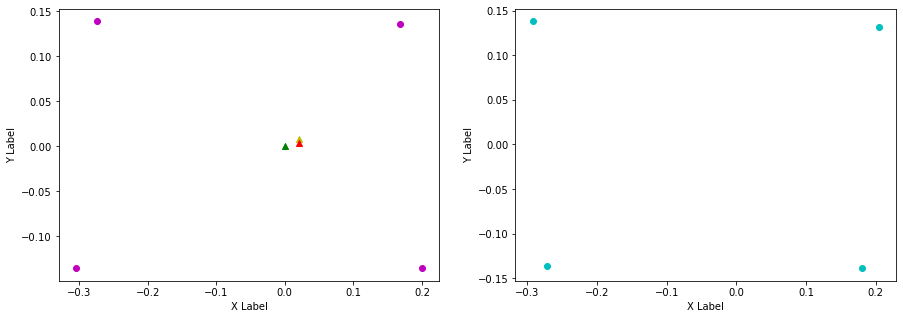

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.204, 0.169, FL (y): 0.132, 0.136.
FL displacement: -0.034999999999999976, 0.0040000000000000036.

FR (x): 0.18, 0.201, FR (y): -0.139, -0.135.
FR displacement: 0.02100000000000002, 0.0040000000000000036.

RL (x): -0.292, -0.273, RL (y): 0.138, 0.139.
RL displacement: 0.01899999999999996, 0.0010000000000000009.

RR (x): -0.271, -0.302, RR (y): -0.136, -0.136.
RR displacement: -0.030999999999999972, 0.0.


Base displacement (Foot): [0.034999999999999976, -0.0040000000000000036].

Velocity x: [0.06263225]. Velocity y: [-0.00972663]. Angular -0.06475110031930774
Odom velocity x: 0.0631750539827. Odom velocity y: 7.89862921258e-05. Odom velocity yaw: 0.146721137422
Base displacement (Odom): [[0.021294960325159096], [-0.0033070527616534395]]. Rotation displacement: 0.853322460663548.



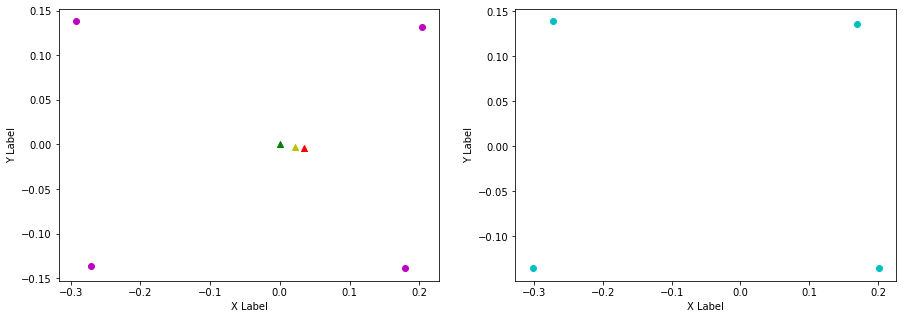

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.202, FL (y): 0.136, 0.132.
FL displacement: 0.033, -0.0040000000000000036.

FR (x): 0.201, 0.177, FR (y): -0.135, -0.137.
FR displacement: -0.02400000000000002, -0.0020000000000000018.

RL (x): -0.273, -0.295, RL (y): 0.139, 0.137.
RL displacement: -0.021999999999999964, -0.0020000000000000018.

RR (x): -0.302, -0.273, RR (y): -0.136, -0.137.
RR displacement: 0.02899999999999997, -0.0010000000000000009.


Base displacement (Foot): [0.02400000000000002, 0.0020000000000000018].

Velocity x: [0.05485805]. Velocity y: [0.01280397]. Angular 0.025245934356719155
Odom velocity x: 0.060493780013. Odom velocity y: 0.00742389039525. Odom velocity yaw: -0.255636160554
Base displacement (Odom): [[0.019200325483057057], [0.004481389961844107]]. Rotation displacement: -1.2613877023935103.



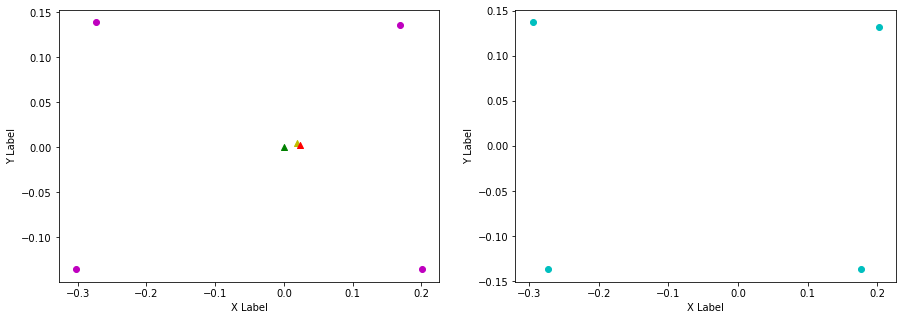

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.165, FL (y): 0.132, 0.135.
FL displacement: -0.037000000000000005, 0.0030000000000000027.

FR (x): 0.177, 0.197, FR (y): -0.137, -0.136.
FR displacement: 0.020000000000000018, 0.0010000000000000009.

RL (x): -0.295, -0.275, RL (y): 0.137, 0.14.
RL displacement: 0.019999999999999962, 0.0030000000000000027.

RR (x): -0.273, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.03699999999999998, 0.0020000000000000018.


Base displacement (Foot): [0.037000000000000005, -0.0030000000000000027].

Velocity x: [0.06617423]. Velocity y: [-0.01558176]. Angular -0.008073484259759635
Odom velocity x: 0.0646989140314. Odom velocity y: -0.00382657761984. Odom velocity yaw: 0.234117717615
Base displacement (Odom): [[0.021837489904429574], [-0.005141979646126504]]. Rotation displacement: 0.5062701278979246.



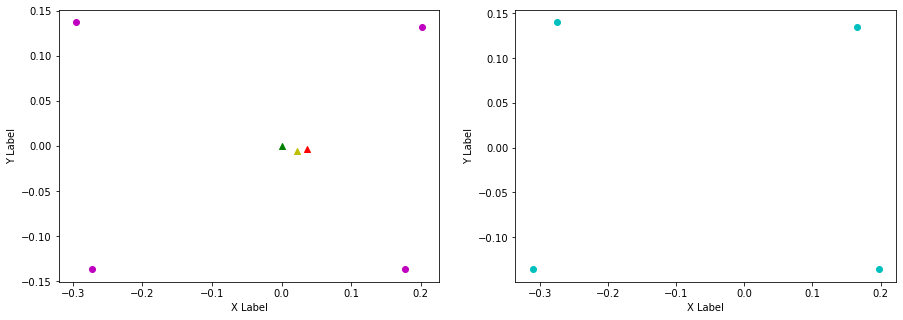

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.134.
FL displacement: 0.033, -0.0010000000000000009.

FR (x): 0.197, 0.166, FR (y): -0.136, -0.135.
FR displacement: -0.031, 0.0010000000000000009.

RL (x): -0.275, -0.311, RL (y): 0.14, 0.135.
RL displacement: -0.035999999999999976, -0.0050000000000000044.

RR (x): -0.31, -0.275, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0010000000000000009].

Velocity x: [0.08952695]. Velocity y: [0.0227427]. Angular -0.02963862576269619
Odom velocity x: 0.0857812309959. Odom velocity y: 0.0109111352511. Odom velocity yaw: -0.306503610937
Base displacement (Odom): [[0.03133444532954144], [0.007959947443342275]]. Rotation displacement: -0.15265023414455262.



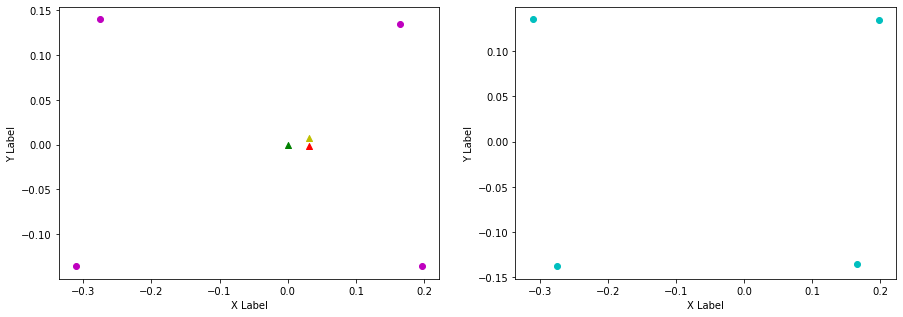

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.166, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.032, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.275, -0.309, RR (y): -0.138, -0.135.
RR displacement: -0.033999999999999975, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.08061119]. Velocity y: [-0.03323706]. Angular 0.009130234442328609
Odom velocity x: 0.0869621958259. Odom velocity y: -0.00994771086873. Odom velocity yaw: 0.237753655632
Base displacement (Odom): [[0.024183352022626003], [-0.009971116065774499]]. Rotation displacement: -0.5943591012944756.



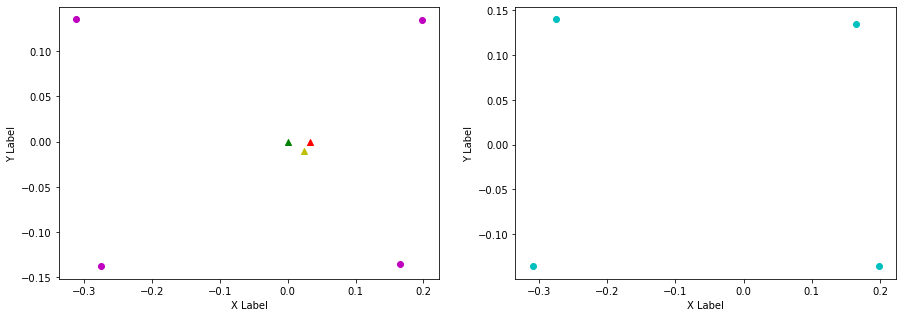

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.178, FR (y): -0.136, -0.137.
FR displacement: -0.020000000000000018, -0.0010000000000000009.

RL (x): -0.275, -0.295, RL (y): 0.14, 0.137.
RL displacement: -0.019999999999999962, -0.0030000000000000027.

RR (x): -0.309, -0.273, RR (y): -0.135, -0.137.
RR displacement: 0.035999999999999976, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0010000000000000009].

Velocity x: [0.0881079]. Velocity y: [0.02730628]. Angular 0.019107198737201337
Odom velocity x: 0.0930282045977. Odom velocity y: 0.00871993795391. Odom velocity yaw: -0.219401334231
Base displacement (Odom): [[0.026432364332447555], [0.008191881359093989]]. Rotation displacement: 0.15693714490863167.



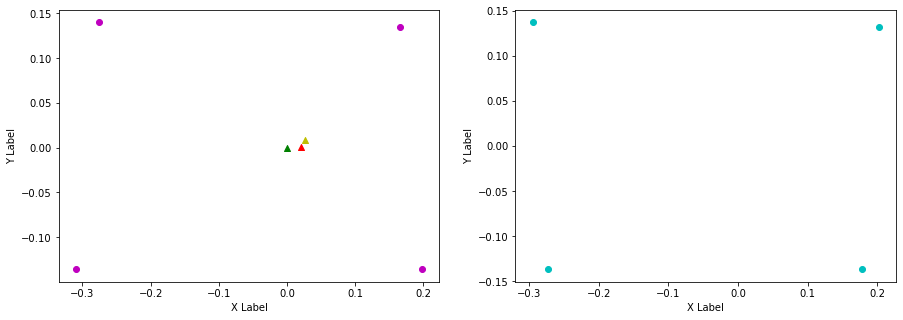

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.167, FL (y): 0.132, 0.136.
FL displacement: -0.035, 0.0040000000000000036.

FR (x): 0.178, 0.2, FR (y): -0.137, -0.135.
FR displacement: 0.02200000000000002, 0.0020000000000000018.

RL (x): -0.295, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.020999999999999963, 0.0020000000000000018.

RR (x): -0.273, -0.305, RR (y): -0.137, -0.135.
RR displacement: -0.03199999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0040000000000000036].

Velocity x: [0.07055256]. Velocity y: [-0.02133586]. Angular -0.009298768190566029
Odom velocity x: 0.0858718248998. Odom velocity y: -0.0077884041173. Odom velocity yaw: 0.245383874493
Base displacement (Odom): [[0.027515490058172887], [-0.008320982789002729]]. Rotation displacement: 0.3284285015854871.



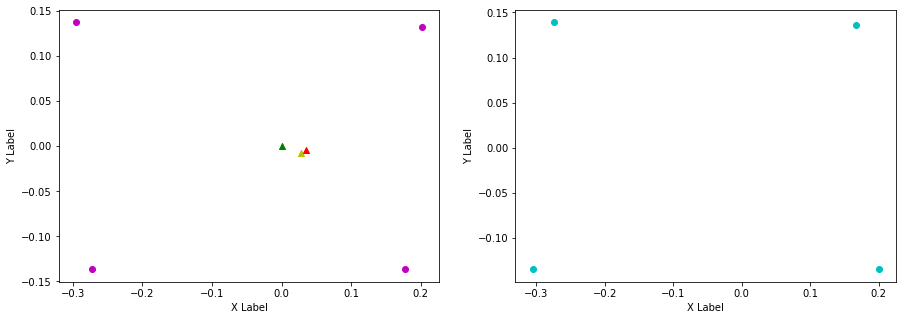

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.197, FL (y): 0.136, 0.135.
FL displacement: 0.03, -0.0010000000000000009.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.311, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.305, -0.275, RR (y): -0.135, -0.139.
RR displacement: 0.02999999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.10022032]. Velocity y: [0.03081429]. Angular -0.029355021329814143
Odom velocity x: 0.0983033931878. Odom velocity y: 0.010408793151. Odom velocity yaw: -0.258627268023
Base displacement (Odom): [[0.030066114788940723], [0.009244291949760397]]. Rotation displacement: -0.20778419594224723.



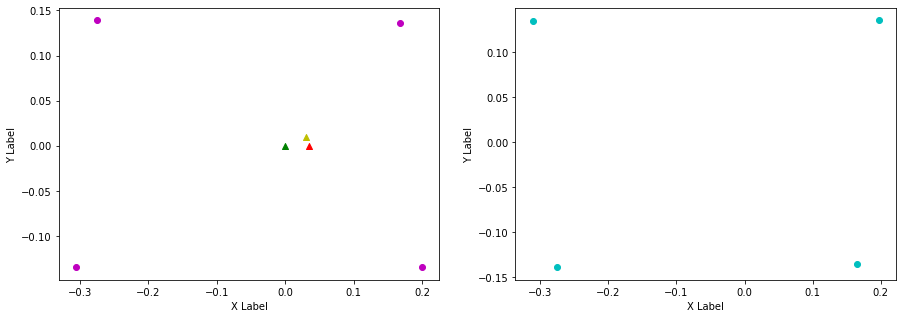

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.032, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.311, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.035999999999999976, 0.006000000000000005.

RR (x): -0.275, -0.309, RR (y): -0.139, -0.135.
RR displacement: -0.033999999999999975, 0.0040000000000000036.


Base displacement (Foot): [0.032, -0.0].

Velocity x: [0.08579727]. Velocity y: [-0.02425019]. Angular 0.006768005326131198
Odom velocity x: 0.0962831867624. Odom velocity y: -0.00678395915026. Odom velocity yaw: 0.2332844124
Base displacement (Odom): [[0.029171064985205497], [-0.008245061809488696]]. Rotation displacement: -0.504575969715016.



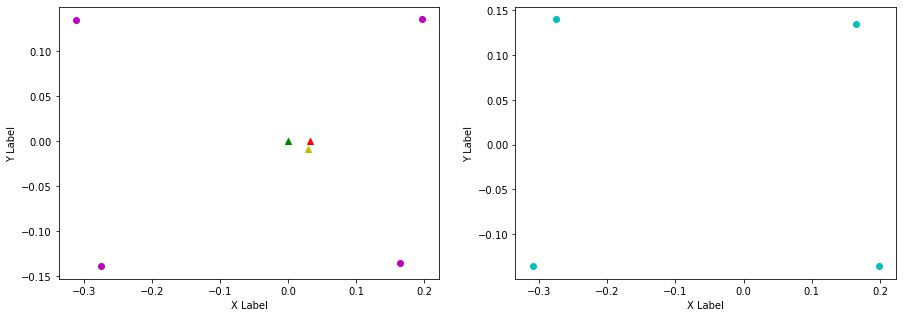

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.198, 0.178, FR (y): -0.136, -0.137.
FR displacement: -0.020000000000000018, -0.0010000000000000009.

RL (x): -0.275, -0.294, RL (y): 0.14, 0.137.
RL displacement: -0.01899999999999996, -0.0030000000000000027.

RR (x): -0.309, -0.272, RR (y): -0.135, -0.137.
RR displacement: 0.03699999999999998, -0.0020000000000000018.


Base displacement (Foot): [0.020000000000000018, 0.0010000000000000009].

Velocity x: [0.13550832]. Velocity y: [0.04152864]. Angular 0.024945904942434777
Odom velocity x: 0.120966522163. Odom velocity y: 0.0168081465281. Odom velocity yaw: -0.133841923287
Base displacement (Odom): [[0.0352321624713392], [0.010797446005551103]]. Rotation displacement: 0.13184453462592435.



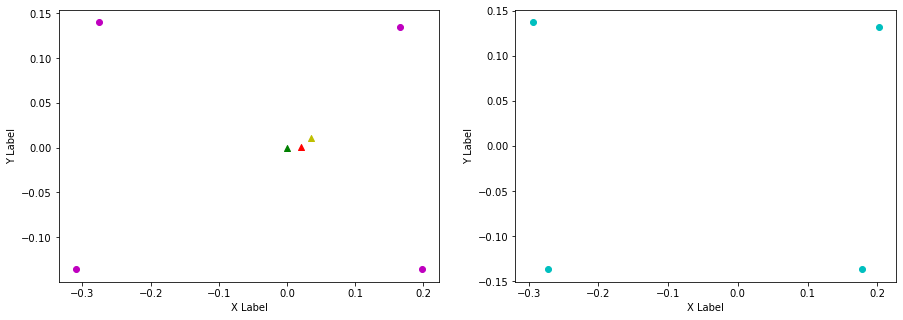

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.165, FL (y): 0.132, 0.135.
FL displacement: -0.037000000000000005, 0.0030000000000000027.

FR (x): 0.178, 0.198, FR (y): -0.137, -0.136.
FR displacement: 0.020000000000000018, 0.0010000000000000009.

RL (x): -0.294, -0.275, RL (y): 0.137, 0.139.
RL displacement: 0.01899999999999996, 0.0020000000000000018.

RR (x): -0.272, -0.309, RR (y): -0.137, -0.135.
RR displacement: -0.03699999999999998, 0.0020000000000000018.


Base displacement (Foot): [0.037000000000000005, -0.0030000000000000027].

Velocity x: [0.07571389]. Velocity y: [-0.01996859]. Angular -0.036176409277886
Odom velocity x: 0.101062378306. Odom velocity y: -0.00322912778122. Odom velocity yaw: 0.232409650419
Base displacement (Odom): [[0.029528424886489546], [-0.0077877527320084905]]. Rotation displacement: 0.3716167043965539.



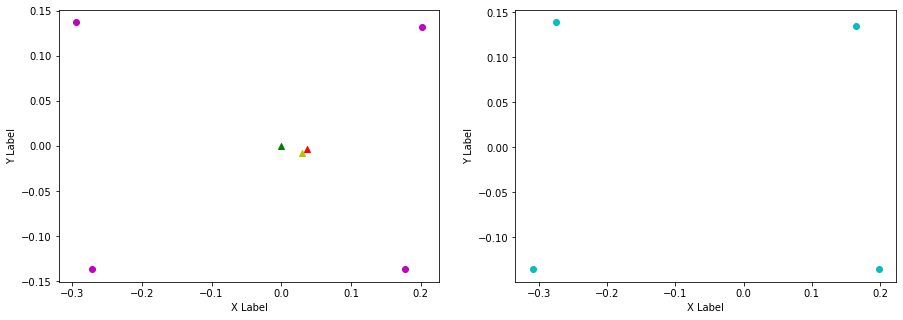

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.133.
FL displacement: 0.035, -0.0020000000000000018.

FR (x): 0.198, 0.171, FR (y): -0.136, -0.136.
FR displacement: -0.026999999999999996, 0.0.

RL (x): -0.275, -0.303, RL (y): 0.139, 0.136.
RL displacement: -0.02799999999999997, -0.0030000000000000027.

RR (x): -0.309, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.034999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.026999999999999996, -0.0].

Velocity x: [0.12168642]. Velocity y: [0.03690612]. Angular -0.005546763020491425
Odom velocity x: 0.113039508501. Odom velocity y: 0.0168350677066. Odom velocity yaw: -0.267768361872
Base displacement (Odom): [[0.036505920844437156], [0.011071834453683538]]. Rotation displacement: -0.8083748895694176.



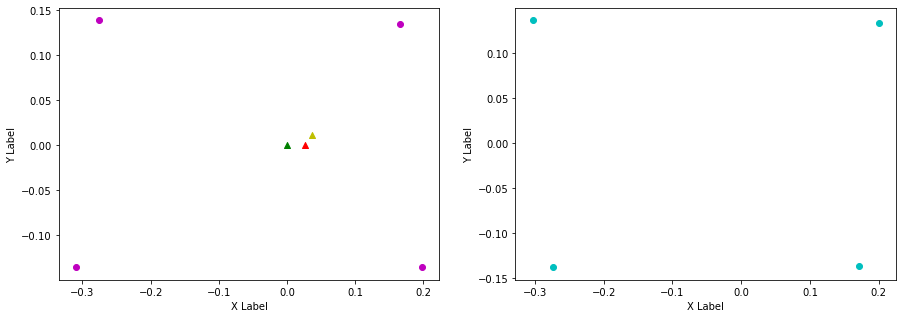

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.169, FL (y): 0.133, 0.136.
FL displacement: -0.031, 0.0030000000000000027.

FR (x): 0.171, 0.201, FR (y): -0.136, -0.135.
FR displacement: 0.03, 0.0010000000000000009.

RL (x): -0.303, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.02999999999999997, 0.0030000000000000027.

RR (x): -0.274, -0.302, RR (y): -0.138, -0.136.
RR displacement: -0.02799999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0030000000000000027].

Velocity x: [0.0488731]. Velocity y: [-0.01364677]. Angular -0.0008595886574707538
Odom velocity x: 0.0825838249245. Odom velocity y: 0.00199675216176. Odom velocity yaw: 0.230483783643
Base displacement (Odom): [[0.01710558021938713], [-0.004776369830353344]]. Rotation displacement: -0.09534181815584228.



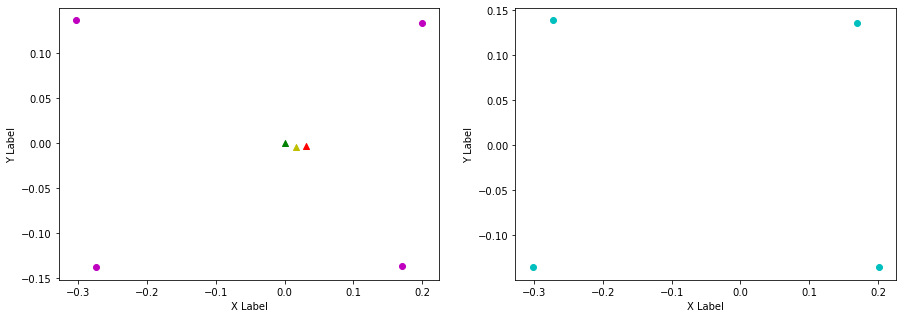

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.169, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.03, -0.0020000000000000018.

FR (x): 0.201, 0.166, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.273, -0.308, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.302, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.02699999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.06565244]. Velocity y: [0.02481957]. Angular -0.007573152088132785
Odom velocity x: 0.0744591423428. Odom velocity y: 0.0132434126781. Odom velocity yaw: -0.259365343519
Base displacement (Odom): [[0.01903920439999851], [0.007197674546738364]]. Rotation displacement: -0.017237776069714255.



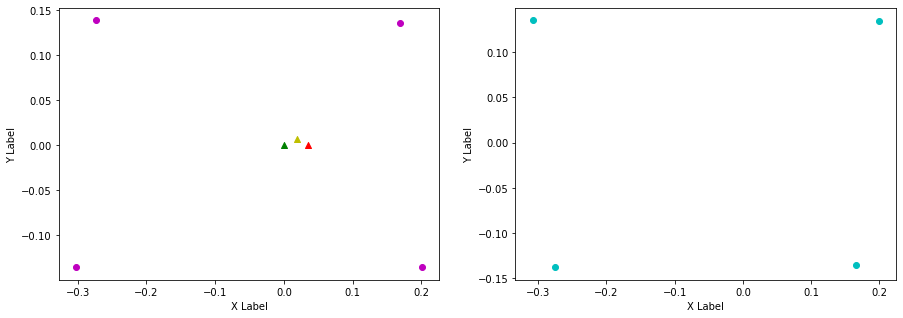

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.166, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.034, 0.0.

RL (x): -0.308, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.033999999999999975, 0.0040000000000000036.

RR (x): -0.275, -0.304, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.05118141]. Velocity y: [-0.01587153]. Angular -0.016156556566103427
Odom velocity x: 0.0618264915011. Odom velocity y: -0.00112270714231. Odom velocity yaw: 0.23284282751
Base displacement (Odom): [[0.017401686775027514], [-0.005396321502562973]]. Rotation displacement: -0.12583378260326192.



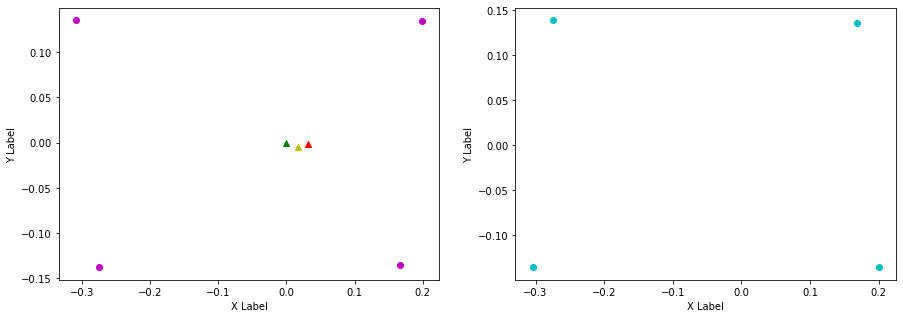

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.028999999999999998, 0.0.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.304, -0.275, RR (y): -0.136, -0.139.
RR displacement: 0.02899999999999997, -0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.0816059]. Velocity y: [0.02173279]. Angular -0.020481918887933336
Odom velocity x: 0.0720147792667. Odom velocity y: 0.010503367186. Odom velocity yaw: -0.275533369664
Base displacement (Odom): [[0.027745998297219465], [0.007389147164380772]]. Rotation displacement: -0.31473899216970774.



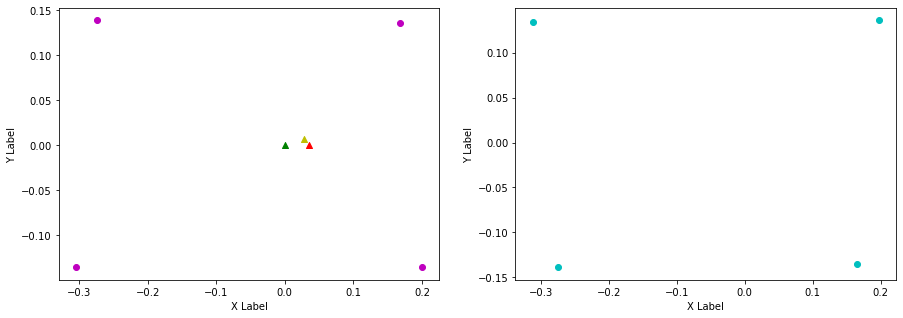

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.174, FL (y): 0.136, 0.138.
FL displacement: -0.02300000000000002, 0.0020000000000000018.

FR (x): 0.165, 0.203, FR (y): -0.135, -0.134.
FR displacement: 0.038000000000000006, 0.0010000000000000009.

RL (x): -0.312, -0.271, RL (y): 0.134, 0.138.
RL displacement: 0.04099999999999998, 0.0040000000000000036.

RR (x): -0.275, -0.295, RR (y): -0.139, -0.137.
RR displacement: -0.019999999999999962, 0.0020000000000000018.


Base displacement (Foot): [0.02300000000000002, -0.0020000000000000018].

Velocity x: [0.05243887]. Velocity y: [-0.01045185]. Angular -0.015563871841996889
Odom velocity x: 0.0623706045367. Odom velocity y: 0.00131963160852. Odom velocity yaw: 0.181942327395
Base displacement (Odom): [[0.014682881024768335], [-0.0029265179749535797]]. Rotation displacement: -0.398999252202.



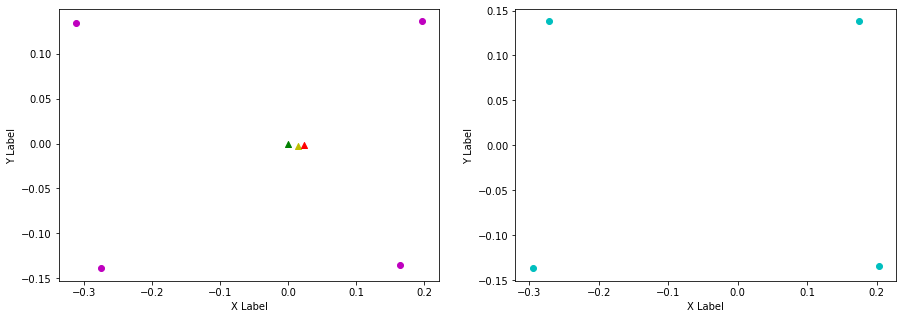

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.174, 0.2, FL (y): 0.138, 0.133.
FL displacement: 0.026000000000000023, -0.0050000000000000044.

FR (x): 0.203, 0.174, FR (y): -0.134, -0.136.
FR displacement: -0.029000000000000026, -0.0020000000000000018.

RL (x): -0.271, -0.299, RL (y): 0.138, 0.136.
RL displacement: -0.02799999999999997, -0.0020000000000000018.

RR (x): -0.295, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.020999999999999963, -0.0010000000000000009.


Base displacement (Foot): [0.029000000000000026, 0.0020000000000000018].

Velocity x: [0.06310323]. Velocity y: [0.01079577]. Angular 0.02754585705230695
Odom velocity x: 0.0618684983778. Odom velocity y: 0.00602140013195. Odom velocity yaw: -0.197362054347
Base displacement (Odom): [[0.020193043080301898], [0.0034546476788335223]]. Rotation displacement: -0.24968834192709344.



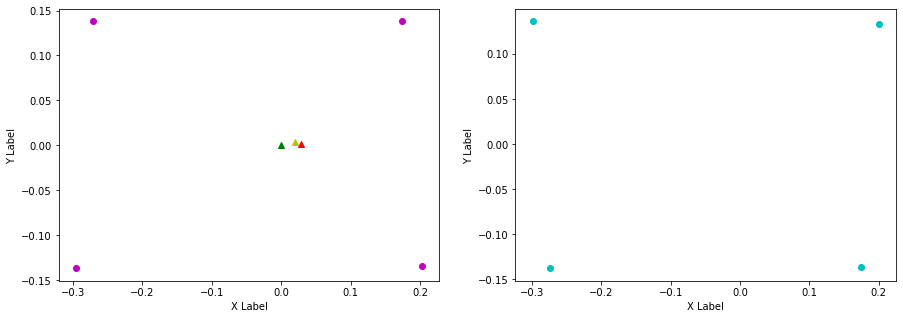

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.166, FL (y): 0.133, 0.135.
FL displacement: -0.034, 0.0020000000000000018.

FR (x): 0.174, 0.199, FR (y): -0.136, -0.135.
FR displacement: 0.025000000000000022, 0.0010000000000000009.

RL (x): -0.299, -0.275, RL (y): 0.136, 0.139.
RL displacement: 0.023999999999999966, 0.0030000000000000027.

RR (x): -0.274, -0.307, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0020000000000000018].

Velocity x: [0.05388269]. Velocity y: [-0.01085474]. Angular -0.02046480864164419
Odom velocity x: 0.0599687453146. Odom velocity y: -0.00287985184399. Odom velocity yaw: 0.205268132405
Base displacement (Odom): [[0.019397762324858014], [-0.00390770702691734]]. Rotation displacement: 0.505043903620233.



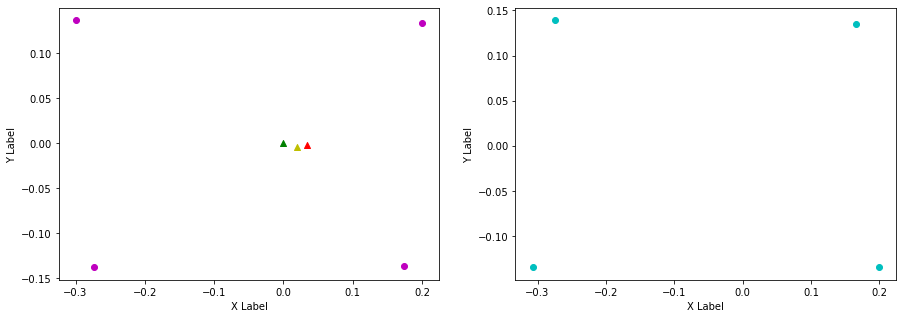

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.199, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.199, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.034, 0.0.

RL (x): -0.275, -0.31, RL (y): 0.139, 0.135.
RL displacement: -0.034999999999999976, -0.0040000000000000036.

RR (x): -0.307, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.032999999999999974, -0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.07405274]. Velocity y: [0.02040137]. Angular -0.01210157406310673
Odom velocity x: 0.0690312252313. Odom velocity y: 0.00899091985215. Odom velocity yaw: -0.257859096681
Base displacement (Odom): [[0.02517792468734026], [0.006936463583569141]]. Rotation displacement: -0.4221168559301716.



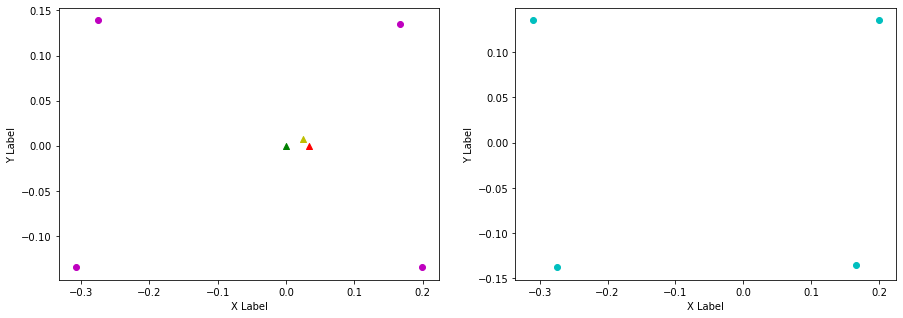

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.034, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.136.
FR displacement: 0.033, -0.0010000000000000009.

RL (x): -0.31, -0.274, RL (y): 0.135, 0.14.
RL displacement: 0.035999999999999976, 0.0050000000000000044.

RR (x): -0.274, -0.31, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.034, -0.0].

Velocity x: [0.03931789]. Velocity y: [-0.00916236]. Angular 0.03141766720713575
Odom velocity x: 0.0536894941639. Odom velocity y: -0.00112147947384. Odom velocity yaw: 0.224297966078
Base displacement (Odom): [[0.015333981294716637], [-0.0035733228691798846]]. Rotation displacement: -0.23574544104319076.



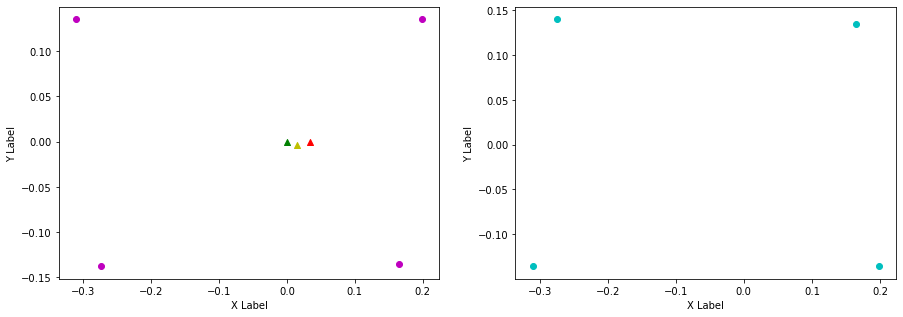

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.133.
FL displacement: 0.035, -0.0020000000000000018.

FR (x): 0.198, 0.17, FR (y): -0.136, -0.136.
FR displacement: -0.027999999999999997, 0.0.

RL (x): -0.274, -0.303, RL (y): 0.14, 0.136.
RL displacement: -0.02899999999999997, -0.0040000000000000036.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.027999999999999997, -0.0].

Velocity x: [0.10680047]. Velocity y: [0.03311985]. Angular -0.027285080817806673
Odom velocity x: 0.0790171470854. Odom velocity y: 0.014729660379. Odom velocity yaw: -0.172842675511
Base displacement (Odom): [[0.02670011696107366], [0.008279963718238026]]. Rotation displacement: 0.7020390847530013.



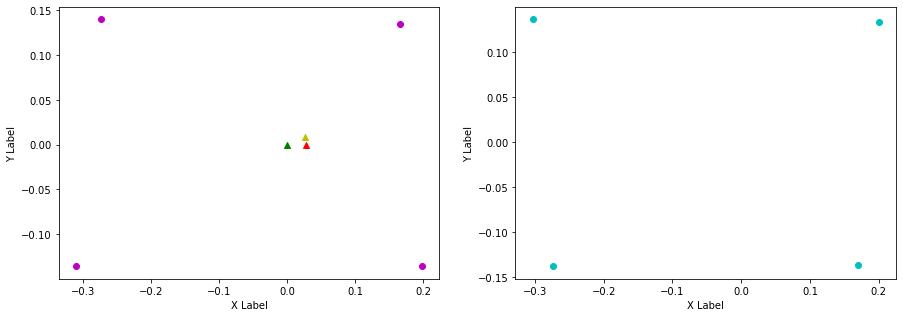

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.17, FL (y): 0.133, 0.136.
FL displacement: -0.03, 0.0030000000000000027.

FR (x): 0.17, 0.201, FR (y): -0.136, -0.135.
FR displacement: 0.031, 0.0010000000000000009.

RL (x): -0.303, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.02999999999999997, 0.0030000000000000027.

RR (x): -0.274, -0.3, RR (y): -0.138, -0.136.
RR displacement: -0.025999999999999968, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0030000000000000027].

Velocity x: [0.08768045]. Velocity y: [-0.02791492]. Angular -0.0643522586933619
Odom velocity x: 0.0892427542985. Odom velocity y: -0.00634290642748. Odom velocity yaw: 0.107663913273
Base displacement (Odom): [[0.0263041323180655], [-0.008374475236178291]]. Rotation displacement: -0.39082999363342075.



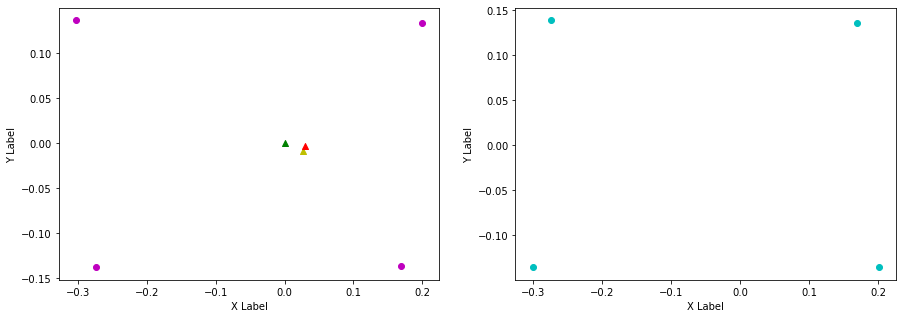

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.201, FL (y): 0.136, 0.133.
FL displacement: 0.031, -0.0030000000000000027.

FR (x): 0.201, 0.174, FR (y): -0.135, -0.137.
FR displacement: -0.027000000000000024, -0.0020000000000000018.

RL (x): -0.273, -0.298, RL (y): 0.139, 0.136.
RL displacement: -0.024999999999999967, -0.0030000000000000027.

RR (x): -0.3, -0.273, RR (y): -0.136, -0.137.
RR displacement: 0.02699999999999997, -0.0010000000000000009.


Base displacement (Foot): [0.027000000000000024, 0.0020000000000000018].

Velocity x: [0.05240778]. Velocity y: [0.01991757]. Angular 0.024726204851076173
Odom velocity x: 0.0688396726181. Odom velocity y: 0.00698363702344. Odom velocity yaw: -0.252582204353
Base displacement (Odom): [[0.018342717681049336], [0.006971148947462424]]. Rotation displacement: -1.1061336717638695.



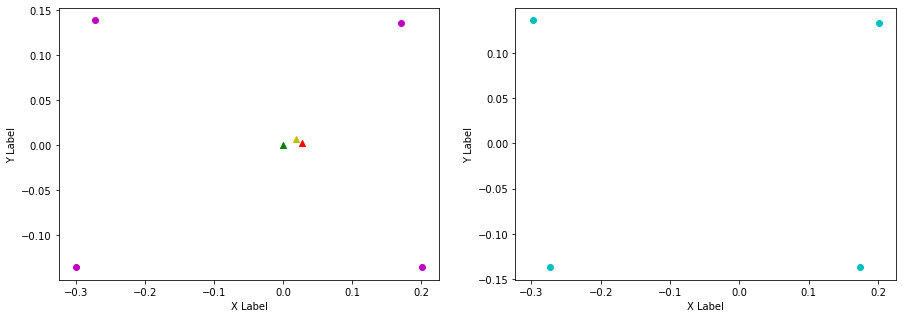

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.036000000000000004, 0.0020000000000000018.

FR (x): 0.174, 0.198, FR (y): -0.137, -0.137.
FR displacement: 0.02400000000000002, 0.0.

RL (x): -0.298, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.023999999999999966, 0.0040000000000000036.

RR (x): -0.273, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.03699999999999998, 0.0020000000000000018.


Base displacement (Foot): [0.036000000000000004, -0.0020000000000000018].

Velocity x: [0.0341796]. Velocity y: [-0.0086004]. Angular -0.007478441601469463
Odom velocity x: 0.0502145566516. Odom velocity y: -0.000756370045956. Odom velocity yaw: 0.224593207471
Base displacement (Odom): [[0.011621067833766041], [-0.0029241368799222123]]. Rotation displacement: 0.49584737836217313.



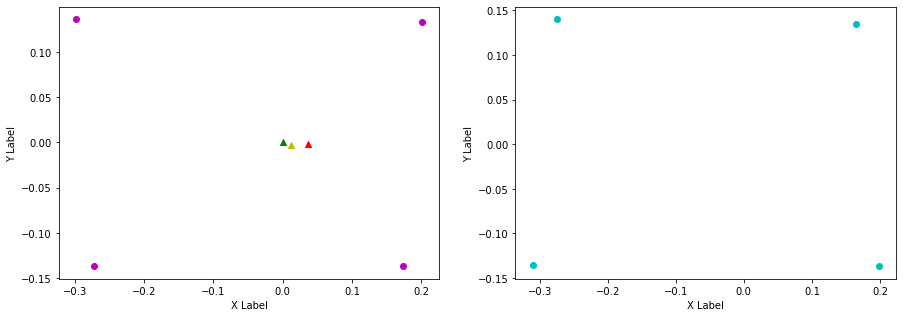

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.201, FL (y): 0.135, 0.133.
FL displacement: 0.036000000000000004, -0.0020000000000000018.

FR (x): 0.198, 0.173, FR (y): -0.137, -0.136.
FR displacement: -0.025000000000000022, 0.0010000000000000009.

RL (x): -0.274, -0.301, RL (y): 0.14, 0.136.
RL displacement: -0.02699999999999997, -0.0040000000000000036.

RR (x): -0.31, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.035999999999999976, -0.0030000000000000027.


Base displacement (Foot): [0.025000000000000022, -0.0010000000000000009].

Velocity x: [0.06991495]. Velocity y: [0.02074492]. Angular -0.0007785819335794158
Odom velocity x: 0.0628775985343. Odom velocity y: 0.0107098407593. Odom velocity yaw: -0.236742948225
Base displacement (Odom): [[0.020974480641774207], [0.006223473587189776]]. Rotation displacement: -0.14568433335508593.



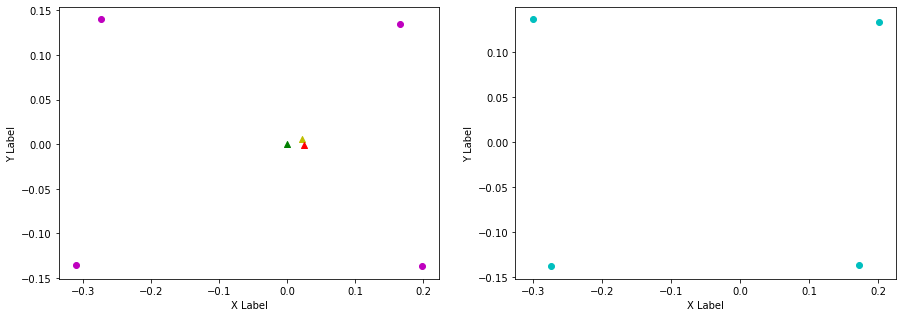

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.171, FL (y): 0.133, 0.137.
FL displacement: -0.03, 0.0040000000000000036.

FR (x): 0.173, 0.201, FR (y): -0.136, -0.134.
FR displacement: 0.028000000000000025, 0.0020000000000000018.

RL (x): -0.301, -0.273, RL (y): 0.136, 0.139.
RL displacement: 0.02799999999999997, 0.0030000000000000027.

RR (x): -0.274, -0.298, RR (y): -0.138, -0.136.
RR displacement: -0.023999999999999966, 0.0020000000000000018.


Base displacement (Foot): [0.03, -0.0040000000000000036].

Velocity x: [0.04624446]. Velocity y: [-0.01570195]. Angular -0.03893224698984566
Odom velocity x: 0.0558362022425. Odom velocity y: -0.00129509125092. Odom velocity yaw: 0.18697457899
Base displacement (Odom): [[0.014335780963516065], [-0.004867604784632995]]. Rotation displacement: -0.013382835512625898.



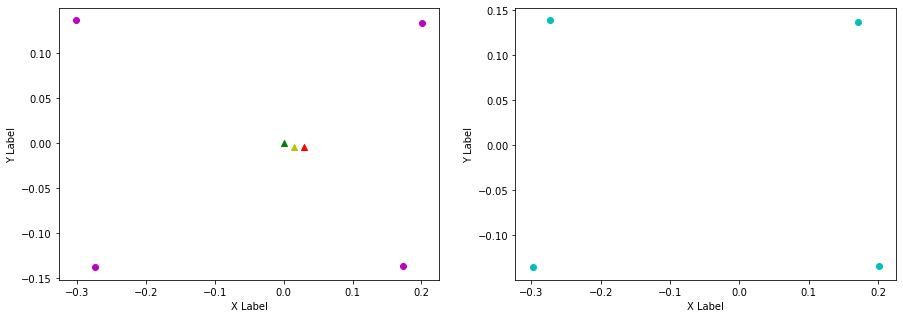

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.198, FL (y): 0.137, 0.134.
FL displacement: 0.026999999999999996, -0.0030000000000000027.

FR (x): 0.201, 0.166, FR (y): -0.134, -0.135.
FR displacement: -0.035, -0.0010000000000000009.

RL (x): -0.273, -0.31, RL (y): 0.139, 0.135.
RL displacement: -0.03699999999999998, -0.0040000000000000036.

RR (x): -0.298, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.022999999999999965, -0.0020000000000000018.


Base displacement (Foot): [0.035, 0.0010000000000000009].

Velocity x: [0.07025872]. Velocity y: [0.02375997]. Angular 0.0006039236411375502
Odom velocity x: 0.0661125473044. Odom velocity y: 0.0125192149743. Odom velocity yaw: -0.259362866093
Base displacement (Odom): [[0.025995734853901276], [0.008791191032835766]]. Rotation displacement: -0.6915024385994949.



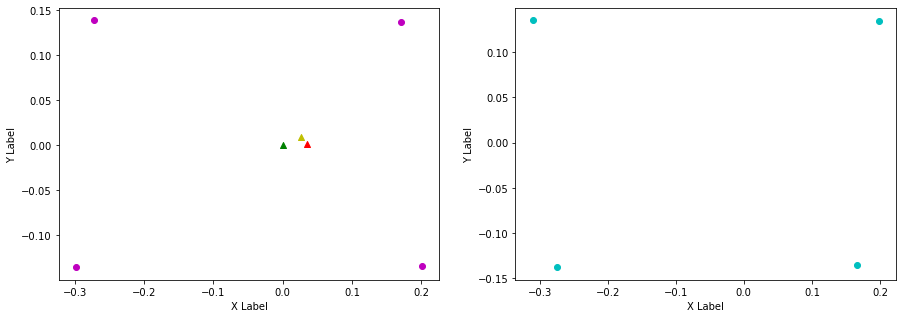

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.033, 0.0010000000000000009.

FR (x): 0.166, 0.198, FR (y): -0.135, -0.137.
FR displacement: 0.032, -0.0020000000000000018.

RL (x): -0.31, -0.275, RL (y): 0.135, 0.14.
RL displacement: 0.034999999999999976, 0.0050000000000000044.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0010000000000000009].

Velocity x: [0.04882176]. Velocity y: [-0.01083562]. Angular 0.02042497467387869
Odom velocity x: 0.0557946402759. Odom velocity y: 0.0010358644242. Odom velocity yaw: 0.235555160023
Base displacement (Odom): [[0.016599395363538605], [-0.0036841096977466847]]. Rotation displacement: 0.012802846330490546.



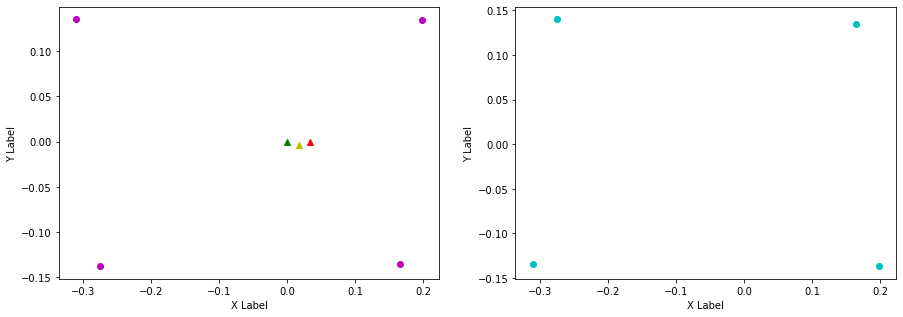

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.137, -0.135.
FR displacement: -0.033, 0.0020000000000000018.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.07246736]. Velocity y: [0.02079024]. Angular -0.03702740435390172
Odom velocity x: 0.0656408574349. Odom velocity y: 0.0106890463468. Odom velocity yaw: -0.270775953601
Base displacement (Odom): [[0.02174020438082369], [0.006237070031477998]]. Rotation displacement: 0.3978899470168096.



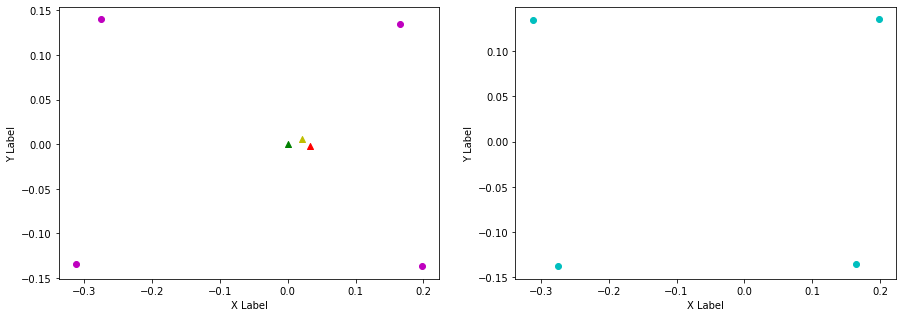

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.198, FR (y): -0.135, -0.137.
FR displacement: 0.033, -0.0020000000000000018.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.135.
RR displacement: -0.035999999999999976, 0.0030000000000000027.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.05333489]. Velocity y: [-0.01059352]. Angular 0.007994319726522318
Odom velocity x: 0.0609835009547. Odom velocity y: -0.00010998058531. Odom velocity yaw: 0.230234077712
Base displacement (Odom): [[0.018133871948576186], [-0.003601798906031739]]. Rotation displacement: -0.6364540975791987.



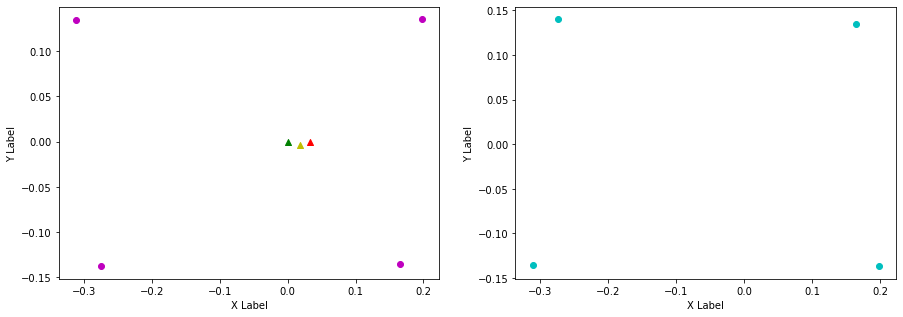

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.2, FL (y): 0.135, 0.134.
FL displacement: 0.035, -0.0010000000000000009.

FR (x): 0.198, 0.17, FR (y): -0.137, -0.136.
FR displacement: -0.027999999999999997, 0.0010000000000000009.

RL (x): -0.274, -0.305, RL (y): 0.14, 0.135.
RL displacement: -0.030999999999999972, -0.0050000000000000044.

RR (x): -0.311, -0.274, RR (y): -0.135, -0.138.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.027999999999999997, -0.0010000000000000009].

Velocity x: [0.09237707]. Velocity y: [0.017147]. Angular -0.017629177697899057
Odom velocity x: 0.0824380278092. Odom velocity y: 0.00919196217524. Odom velocity yaw: -0.251353500624
Base displacement (Odom): [[0.028636886733333533], [0.005315569105696305]]. Rotation displacement: 0.155733935230165.



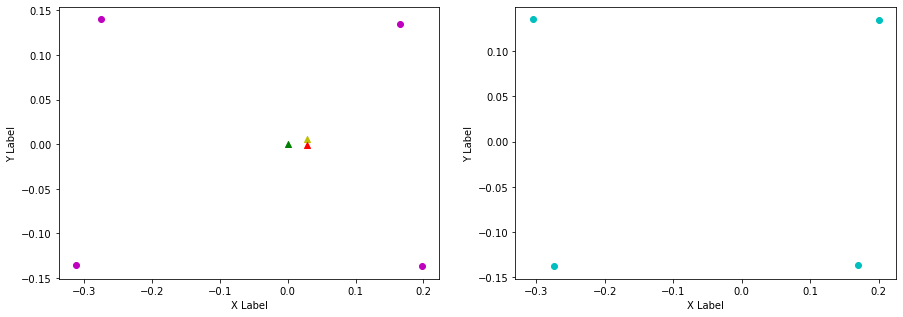

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.167, FL (y): 0.134, 0.136.
FL displacement: -0.033, 0.0020000000000000018.

FR (x): 0.17, 0.199, FR (y): -0.136, -0.135.
FR displacement: 0.028999999999999998, 0.0010000000000000009.

RL (x): -0.305, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.030999999999999972, 0.0040000000000000036.

RR (x): -0.274, -0.305, RR (y): -0.138, -0.136.
RR displacement: -0.030999999999999972, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0020000000000000018].

Velocity x: [0.01886448]. Velocity y: [-0.00619191]. Angular -0.026726373837085298
Odom velocity x: 0.0509177575526. Odom velocity y: 0.00262126130396. Odom velocity yaw: 0.166200441453
Base displacement (Odom): [[0.0056593424920095], [-0.001857573321490058]]. Rotation displacement: -0.31312396049939256.



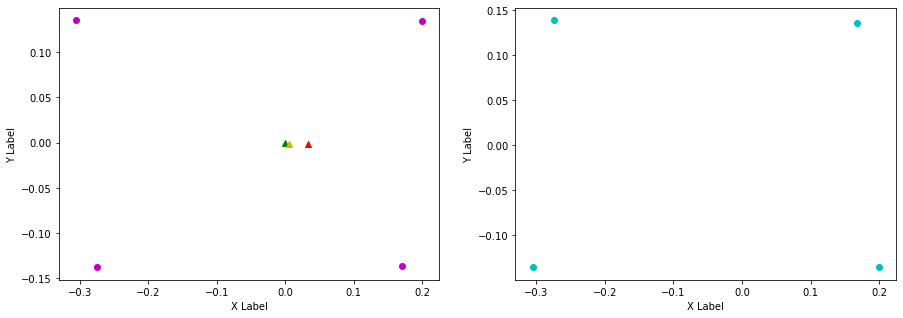

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.167, 0.199, FL (y): 0.136, 0.134.
FL displacement: 0.032, -0.0020000000000000018.

FR (x): 0.199, 0.168, FR (y): -0.135, -0.135.
FR displacement: -0.031, 0.0.

RL (x): -0.274, -0.306, RL (y): 0.139, 0.135.
RL displacement: -0.03199999999999997, -0.0040000000000000036.

RR (x): -0.305, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.02999999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.031, -0.0].

Velocity x: [0.10503319]. Velocity y: [0.03315138]. Angular -0.0005527860304542691
Odom velocity x: 0.0861230696754. Odom velocity y: 0.0218266302453. Odom velocity yaw: -0.28316110179
Base displacement (Odom): [[0.036761632551065127], [0.011602988927694735]]. Rotation displacement: -0.45939245374767973.



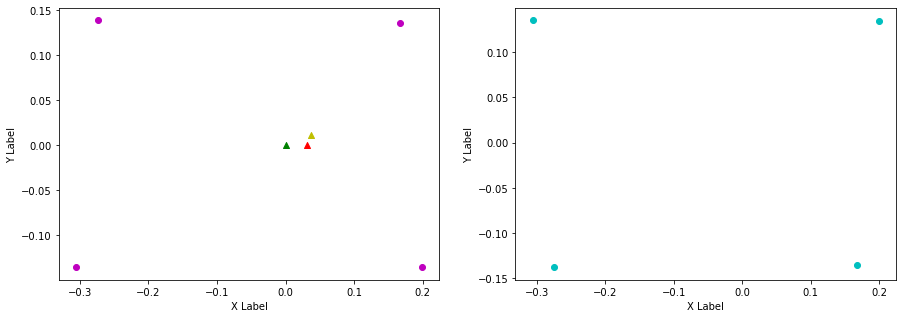

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.168, 0.199, FR (y): -0.135, -0.135.
FR displacement: 0.031, 0.0.

RL (x): -0.306, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.03199999999999997, 0.0040000000000000036.

RR (x): -0.275, -0.303, RR (y): -0.138, -0.135.
RR displacement: -0.02799999999999997, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.05003575]. Velocity y: [-0.01372978]. Angular -0.01776704271502366
Odom velocity x: 0.0716903447993. Odom velocity y: 0.00589577486601. Odom velocity yaw: 0.187889496483
Base displacement (Odom): [[0.015010721430935625], [-0.004118933758824994]]. Rotation displacement: -0.011085311812346723.



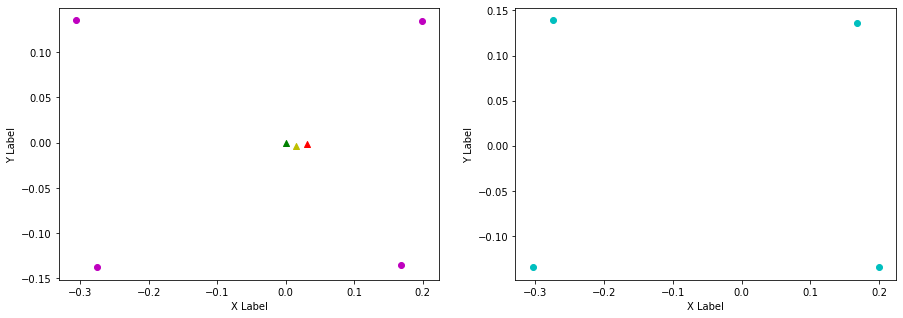

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.2, FL (y): 0.136, 0.133.
FL displacement: 0.032, -0.0030000000000000027.

FR (x): 0.199, 0.17, FR (y): -0.135, -0.136.
FR displacement: -0.028999999999999998, -0.0010000000000000009.

RL (x): -0.274, -0.303, RL (y): 0.139, 0.136.
RL displacement: -0.02899999999999997, -0.0030000000000000027.

RR (x): -0.303, -0.274, RR (y): -0.135, -0.137.
RR displacement: 0.02899999999999997, -0.0020000000000000018.


Base displacement (Foot): [0.028999999999999998, 0.0010000000000000009].

Velocity x: [0.06242969]. Velocity y: [0.02257187]. Angular 0.014631308135874637
Odom velocity x: 0.0690846406949. Odom velocity y: 0.0151845165688. Odom velocity yaw: -0.265893563721
Base displacement (Odom): [[0.021226088714296765], [0.007674435309818151]]. Rotation displacement: -0.30539292005894825.



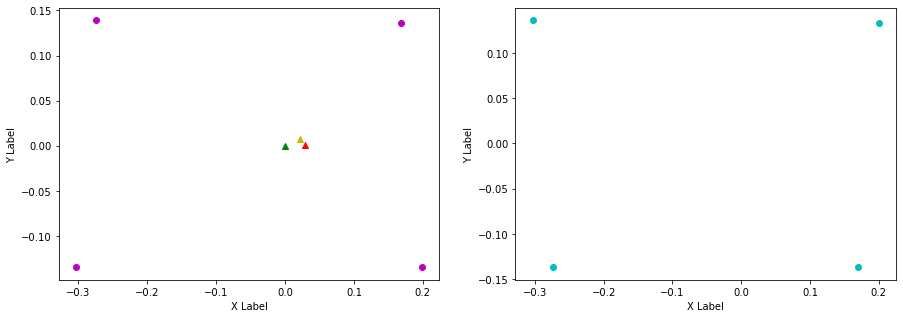

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.2, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.035, 0.0020000000000000018.

FR (x): 0.17, 0.198, FR (y): -0.136, -0.137.
FR displacement: 0.027999999999999997, -0.0010000000000000009.

RL (x): -0.303, -0.274, RL (y): 0.136, 0.14.
RL displacement: 0.02899999999999997, 0.0040000000000000036.

RR (x): -0.274, -0.31, RR (y): -0.137, -0.135.
RR displacement: -0.035999999999999976, 0.0020000000000000018.


Base displacement (Foot): [0.035, -0.0020000000000000018].

Velocity x: [0.06047285]. Velocity y: [-0.00856929]. Angular -0.006463768228012242
Odom velocity x: 0.0689889125567. Odom velocity y: 0.00325123536737. Odom velocity yaw: 0.227928766855
Base displacement (Odom): [[0.021165493204795993], [-0.0029992517864445567]]. Rotation displacement: 0.28502607772704014.



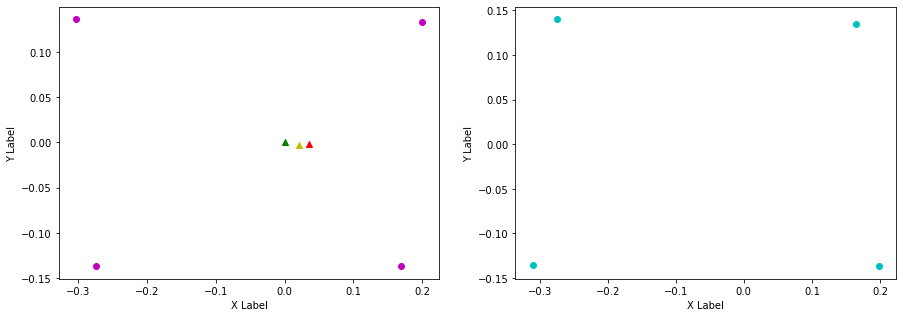

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.201, FL (y): 0.135, 0.132.
FL displacement: 0.036000000000000004, -0.0030000000000000027.

FR (x): 0.198, 0.176, FR (y): -0.137, -0.136.
FR displacement: -0.02200000000000002, 0.0010000000000000009.

RL (x): -0.274, -0.298, RL (y): 0.14, 0.136.
RL displacement: -0.023999999999999966, -0.0040000000000000036.

RR (x): -0.31, -0.273, RR (y): -0.135, -0.138.
RR displacement: 0.03699999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.02200000000000002, -0.0010000000000000009].

Velocity x: [0.0436345]. Velocity y: [0.00569377]. Angular 0.016167969953823302
Odom velocity x: 0.0580123107677. Odom velocity y: 0.00403312418018. Odom velocity yaw: -0.172984861774
Base displacement (Odom): [[0.012654015031228205], [0.0016511954726801115]]. Rotation displacement: -0.12962128840654188.



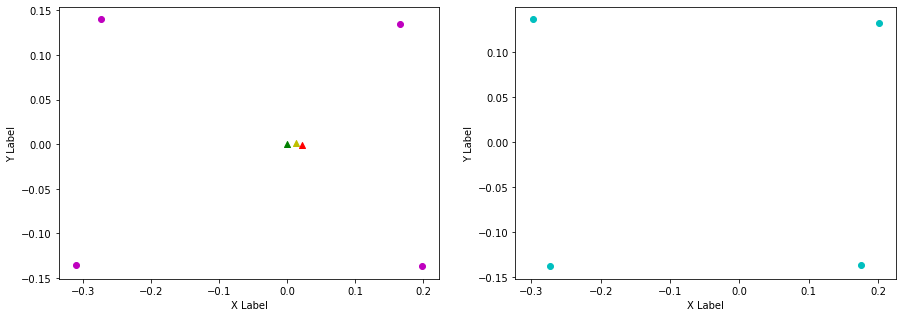

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.166, FL (y): 0.132, 0.136.
FL displacement: -0.035, 0.0040000000000000036.

FR (x): 0.176, 0.199, FR (y): -0.136, -0.135.
FR displacement: 0.02300000000000002, 0.0010000000000000009.

RL (x): -0.298, -0.275, RL (y): 0.136, 0.139.
RL displacement: 0.022999999999999965, 0.0030000000000000027.

RR (x): -0.273, -0.306, RR (y): -0.138, -0.135.
RR displacement: -0.032999999999999974, 0.0030000000000000027.


Base displacement (Foot): [0.035, -0.0040000000000000036].

Velocity x: [0.03631821]. Velocity y: [-0.02008786]. Angular -0.009188339794530933
Odom velocity x: 0.0438073720504. Odom velocity y: -0.00914492102153. Odom velocity yaw: 0.239534916255
Base displacement (Odom): [[0.01307455278500047], [-0.007231628140365931]]. Rotation displacement: 0.2686435536009286.



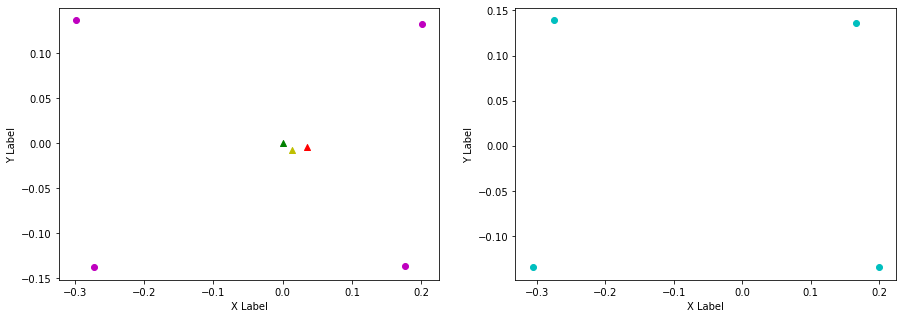

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.196, FL (y): 0.136, 0.136.
FL displacement: 0.03, 0.0.

FR (x): 0.199, 0.165, FR (y): -0.135, -0.134.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.275, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03699999999999998, -0.0050000000000000044.

RR (x): -0.306, -0.275, RR (y): -0.135, -0.139.
RR displacement: 0.030999999999999972, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.04142584]. Velocity y: [0.00356918]. Angular -0.04646465727180798
Odom velocity x: 0.0403008984654. Odom velocity y: -0.00463882330914. Odom velocity yaw: -0.284321670142
Base displacement (Odom): [[0.012427750091745793], [0.0010707540081678069]]. Rotation displacement: -0.1895230575180137.



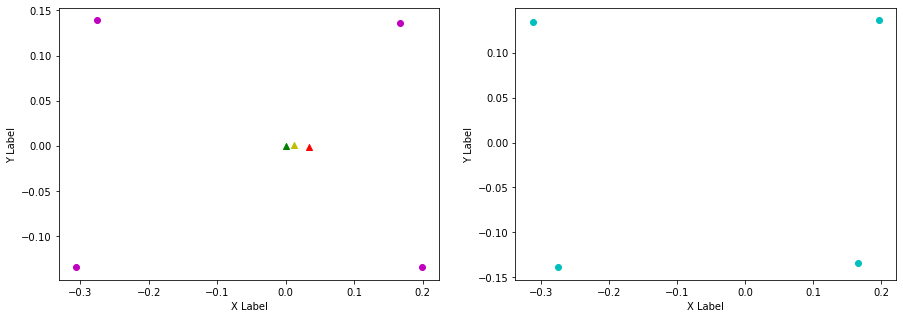

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.196, 0.165, FL (y): 0.136, 0.135.
FL displacement: -0.031, -0.0010000000000000009.

FR (x): 0.165, 0.197, FR (y): -0.134, -0.137.
FR displacement: 0.032, -0.0030000000000000027.

RL (x): -0.312, -0.275, RL (y): 0.134, 0.14.
RL displacement: 0.03699999999999998, 0.006000000000000005.

RR (x): -0.275, -0.311, RR (y): -0.139, -0.134.
RR displacement: -0.035999999999999976, 0.0050000000000000044.


Base displacement (Foot): [0.031, 0.0010000000000000009].

Velocity x: [0.07462872]. Velocity y: [-0.01241155]. Angular 0.00313549583166504
Odom velocity x: 0.0575982445554. Odom velocity y: -0.00912668746377. Odom velocity yaw: 0.210586278149
Base displacement (Odom): [[0.02313491619805763], [-0.0038475842577412322]]. Rotation displacement: -0.7986685005139746.



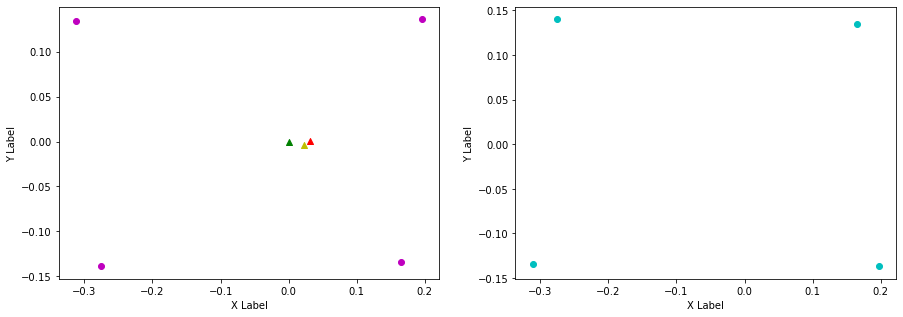

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.203, FL (y): 0.135, 0.133.
FL displacement: 0.038000000000000006, -0.0020000000000000018.

FR (x): 0.197, 0.179, FR (y): -0.137, -0.137.
FR displacement: -0.018000000000000016, 0.0.

RL (x): -0.275, -0.293, RL (y): 0.14, 0.137.
RL displacement: -0.01799999999999996, -0.0030000000000000027.

RR (x): -0.311, -0.272, RR (y): -0.134, -0.138.
RR displacement: 0.03899999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.018000000000000016, -0.0].

Velocity x: [0.06422289]. Velocity y: [0.02030291]. Angular 0.004513988078138425
Odom velocity x: 0.0650811163623. Odom velocity y: 0.00600313533267. Odom velocity yaw: -0.224140187061
Base displacement (Odom): [[0.021193548840330756], [0.006699958843492837]]. Rotation displacement: 0.05569174268129844.



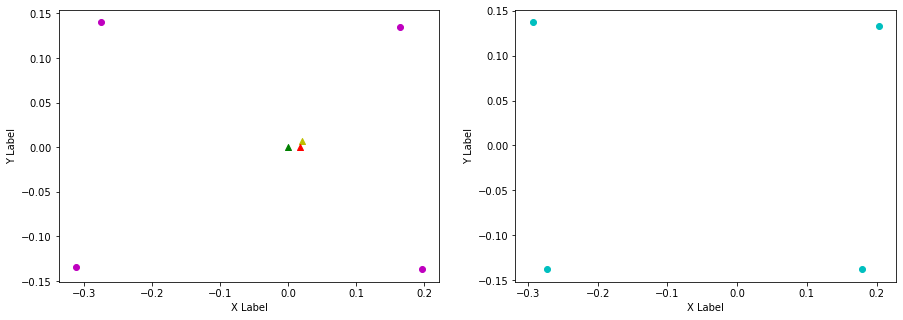

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.166, FL (y): 0.133, 0.135.
FL displacement: -0.037000000000000005, 0.0020000000000000018.

FR (x): 0.179, 0.197, FR (y): -0.137, -0.137.
FR displacement: 0.018000000000000016, 0.0.

RL (x): -0.293, -0.274, RL (y): 0.137, 0.141.
RL displacement: 0.01899999999999996, 0.003999999999999976.

RR (x): -0.272, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.03899999999999998, 0.0040000000000000036.


Base displacement (Foot): [0.037000000000000005, -0.0020000000000000018].

Velocity x: [0.04972108]. Velocity y: [-0.01288195]. Angular -0.007804622241795002
Odom velocity x: 0.0557056745174. Odom velocity y: -0.00305888892375. Odom velocity yaw: 0.224359946153
Base displacement (Odom): [[0.016905162747296032], [-0.004379861852894962]]. Rotation displacement: 0.08534869393231027.



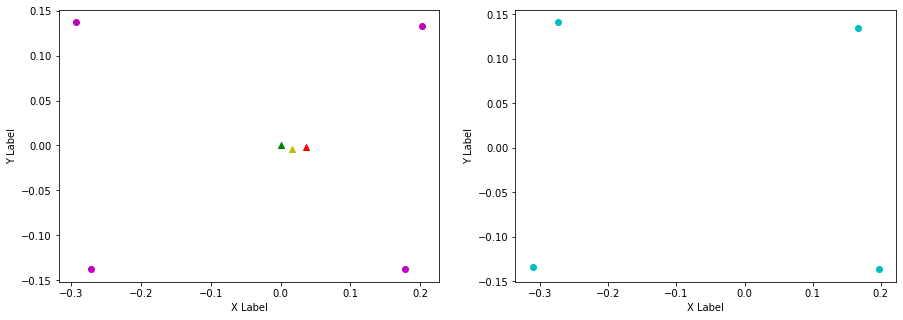

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.166, 0.203, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.197, 0.179, FR (y): -0.137, -0.138.
FR displacement: -0.018000000000000016, -0.0010000000000000009.

RL (x): -0.274, -0.293, RL (y): 0.141, 0.137.
RL displacement: -0.01899999999999996, -0.003999999999999976.

RR (x): -0.311, -0.272, RR (y): -0.134, -0.138.
RR displacement: 0.03899999999999998, -0.0040000000000000036.


Base displacement (Foot): [0.018000000000000016, 0.0010000000000000009].

Velocity x: [0.02410149]. Velocity y: [0.00691432]. Angular -0.012695292535466057
Odom velocity x: 0.0383452576799. Odom velocity y: 0.00137334180135. Odom velocity yaw: -0.234412631236
Base displacement (Odom): [[0.007230444659151125], [0.002074294516062558]]. Rotation displacement: -0.15203841276951346.



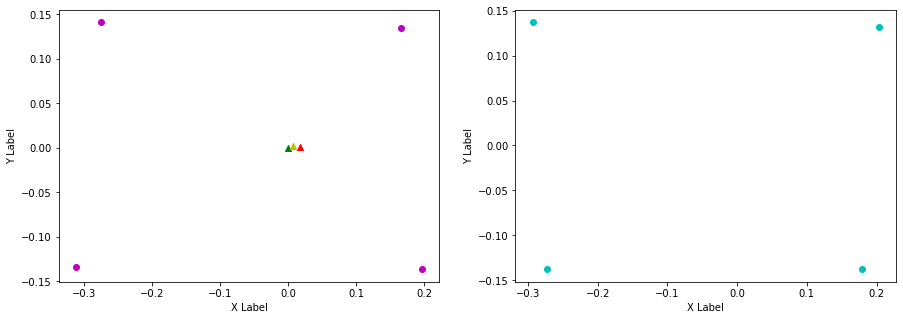

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.203, 0.171, FL (y): 0.132, 0.137.
FL displacement: -0.032, 0.0050000000000000044.

FR (x): 0.179, 0.201, FR (y): -0.138, -0.134.
FR displacement: 0.02200000000000002, 0.0040000000000000036.

RL (x): -0.293, -0.273, RL (y): 0.137, 0.138.
RL displacement: 0.019999999999999962, 0.0010000000000000009.

RR (x): -0.272, -0.298, RR (y): -0.138, -0.136.
RR displacement: -0.025999999999999968, 0.0020000000000000018.


Base displacement (Foot): [0.032, -0.0050000000000000044].

Velocity x: [0.04277996]. Velocity y: [-0.01032297]. Angular -0.022613804038374003
Odom velocity x: 0.04061969225. Odom velocity y: -0.00512602600148. Odom velocity yaw: 0.157936872901
Base displacement (Odom): [[0.014545194390612082], [-0.003509812254162359]]. Rotation displacement: -0.2182159699053431.



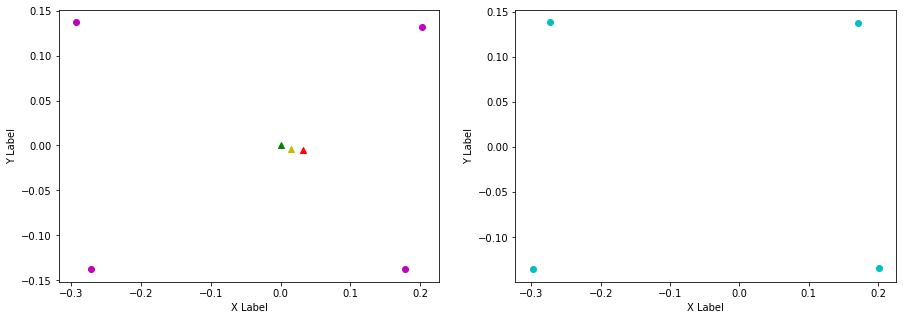

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.171, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.027999999999999997, -0.0030000000000000027.

FR (x): 0.201, 0.168, FR (y): -0.134, -0.136.
FR displacement: -0.033, -0.0020000000000000018.

RL (x): -0.273, -0.305, RL (y): 0.138, 0.135.
RL displacement: -0.03199999999999997, -0.0030000000000000027.

RR (x): -0.298, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.022999999999999965, -0.0020000000000000018.


Base displacement (Foot): [0.033, 0.0020000000000000018].

Velocity x: [0.09671273]. Velocity y: [0.02751431]. Angular 0.004572142068913014
Odom velocity x: 0.0763624808228. Odom velocity y: 0.0139174201133. Odom velocity yaw: -0.266418494569
Base displacement (Odom): [[0.033849447762421825], [0.009630004511369972]]. Rotation displacement: -0.44052987795020343.



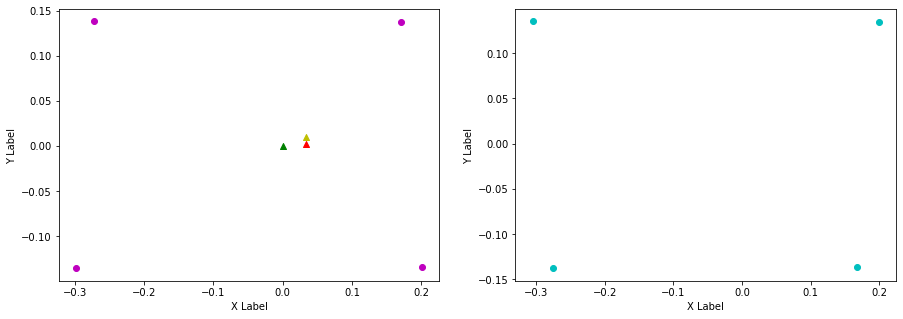

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.134, 0.135.
FL displacement: -0.034, 0.0010000000000000009.

FR (x): 0.168, 0.197, FR (y): -0.136, -0.137.
FR displacement: 0.028999999999999998, -0.0010000000000000009.

RL (x): -0.305, -0.275, RL (y): 0.135, 0.141.
RL displacement: 0.02999999999999997, 0.005999999999999978.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.07438605]. Velocity y: [-0.01454474]. Angular 0.012745024211952038
Odom velocity x: 0.0813667812752. Odom velocity y: -0.00036511635194. Odom velocity yaw: 0.23968543916
Base displacement (Odom): [[0.025291269695115304], [-0.004945212711320757]]. Rotation displacement: 0.09168753037614863.



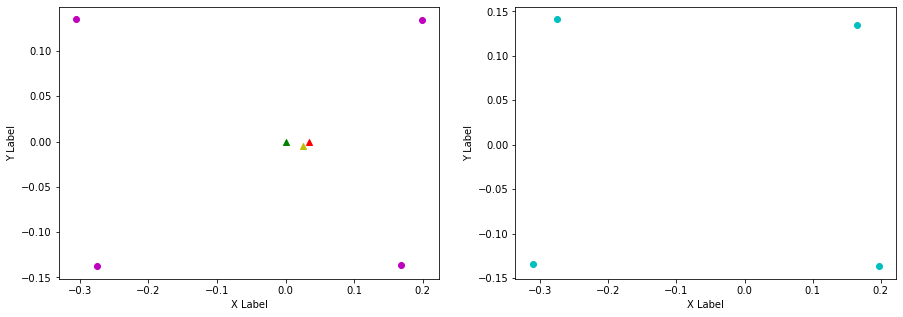

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.199, FL (y): 0.135, 0.133.
FL displacement: 0.034, -0.0020000000000000018.

FR (x): 0.197, 0.17, FR (y): -0.137, -0.136.
FR displacement: -0.026999999999999996, 0.0010000000000000009.

RL (x): -0.275, -0.302, RL (y): 0.141, 0.136.
RL displacement: -0.02699999999999997, -0.004999999999999977.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.138.
RR displacement: 0.035999999999999976, -0.0040000000000000036.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.0984594]. Velocity y: [0.03175313]. Angular -0.0187246160121573
Odom velocity x: 0.0934964981906. Odom velocity y: 0.0162819811961. Odom velocity yaw: -0.26510809435
Base displacement (Odom): [[0.029537814143699492], [0.00952593838172211]]. Rotation displacement: 0.24828038445173164.



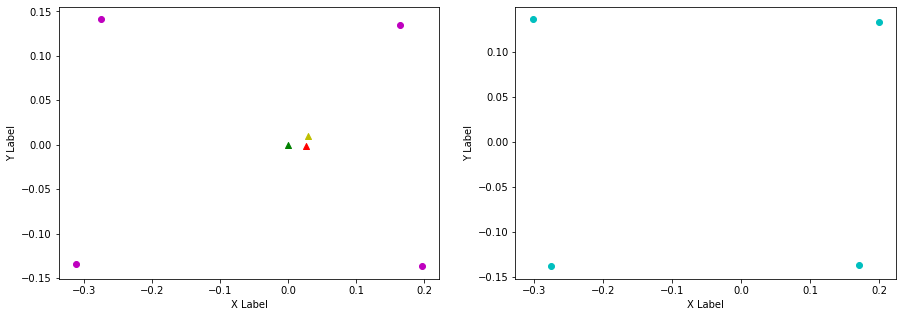

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.165, FL (y): 0.133, 0.135.
FL displacement: -0.034, 0.0020000000000000018.

FR (x): 0.17, 0.198, FR (y): -0.136, -0.137.
FR displacement: 0.027999999999999997, -0.0010000000000000009.

RL (x): -0.302, -0.275, RL (y): 0.136, 0.14.
RL displacement: 0.02699999999999997, 0.0040000000000000036.

RR (x): -0.275, -0.311, RR (y): -0.138, -0.134.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0020000000000000018].

Velocity x: [0.04025046]. Velocity y: [-0.00358887]. Angular 0.008924199763476621
Odom velocity x: 0.0656981160125. Odom velocity y: 0.00695054650681. Odom velocity yaw: 0.238884797416
Base displacement (Odom): [[0.014087656259438752], [-0.001256102828369965]]. Rotation displacement: -0.3218523899928408.



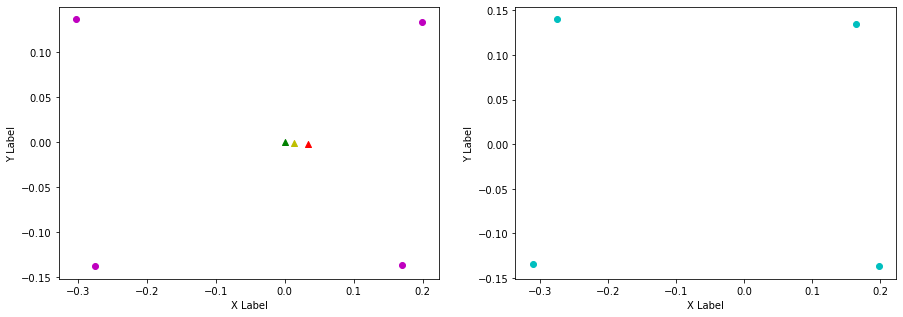

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.198, FL (y): 0.135, 0.135.
FL displacement: 0.033, 0.0.

FR (x): 0.198, 0.165, FR (y): -0.137, -0.134.
FR displacement: -0.033, 0.0030000000000000027.

RL (x): -0.275, -0.312, RL (y): 0.14, 0.134.
RL displacement: -0.03699999999999998, -0.006000000000000005.

RR (x): -0.311, -0.275, RR (y): -0.134, -0.139.
RR displacement: 0.035999999999999976, -0.0050000000000000044.


Base displacement (Foot): [0.033, -0.0030000000000000027].

Velocity x: [0.04474882]. Velocity y: [0.00418709]. Angular -0.046324247274636174
Odom velocity x: 0.0570475103147. Odom velocity y: 0.00581899844389. Odom velocity yaw: -0.286432817936
Base displacement (Odom): [[0.014767107551042713], [0.0013817406231941831]]. Rotation displacement: 0.1789615949294222.



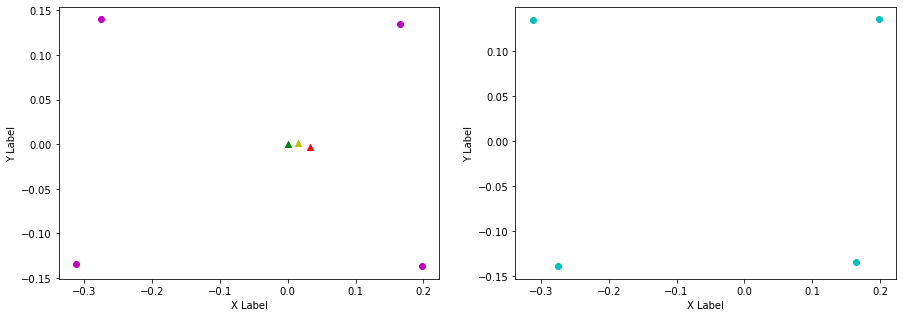

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.198, 0.165, FL (y): 0.135, 0.135.
FL displacement: -0.033, 0.0.

FR (x): 0.165, 0.197, FR (y): -0.134, -0.137.
FR displacement: 0.032, -0.0030000000000000027.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.14.
RL displacement: 0.03799999999999998, 0.006000000000000005.

RR (x): -0.275, -0.311, RR (y): -0.139, -0.135.
RR displacement: -0.035999999999999976, 0.0040000000000000036.


Base displacement (Foot): [0.033, -0.0].

Velocity x: [0.09387784]. Velocity y: [-0.03238056]. Angular 0.01276698192098638
Odom velocity x: 0.081489720465. Odom velocity y: -0.0144435974586. Odom velocity yaw: 0.216118570799
Base displacement (Odom): [[0.028163369554018658], [-0.009714173427859407]]. Rotation displacement: -0.8758804706276714.



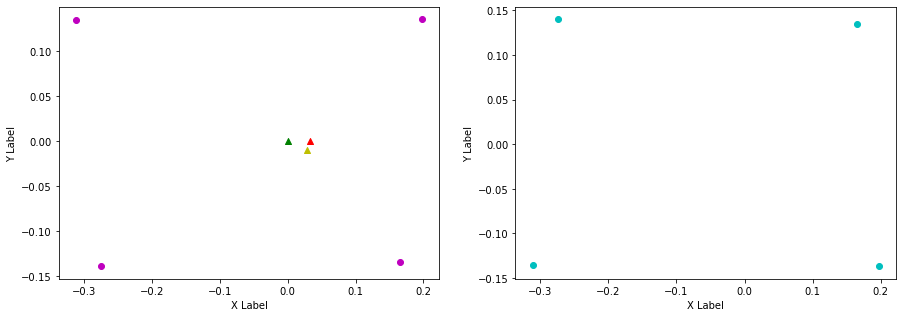

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.165, 0.202, FL (y): 0.135, 0.132.
FL displacement: 0.037000000000000005, -0.0030000000000000027.

FR (x): 0.197, 0.179, FR (y): -0.137, -0.137.
FR displacement: -0.018000000000000016, 0.0.

RL (x): -0.274, -0.293, RL (y): 0.14, 0.137.
RL displacement: -0.01899999999999996, -0.0030000000000000027.

RR (x): -0.311, -0.273, RR (y): -0.135, -0.138.
RR displacement: 0.03799999999999998, -0.0030000000000000027.


Base displacement (Foot): [0.018000000000000016, -0.0].

Velocity x: [0.02320663]. Velocity y: [0.00378842]. Angular -0.00025438395484218054
Odom velocity x: 0.0511797173916. Odom velocity y: -0.00736784000179. Odom velocity yaw: -0.264118808637
Base displacement (Odom): [[0.00719405427122588], [0.0011744091659116052]]. Rotation displacement: 0.2194483938791458.



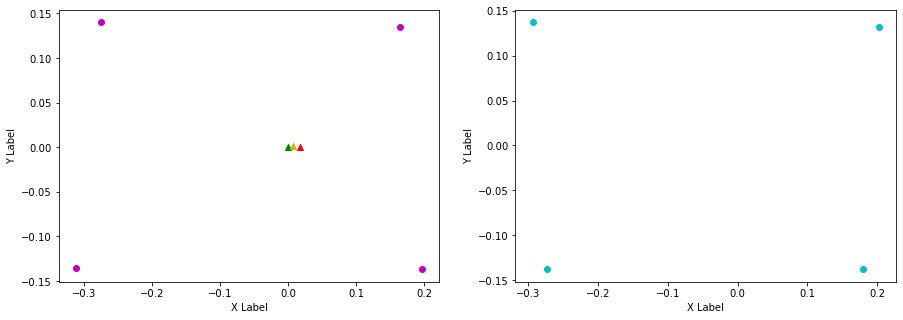

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.202, 0.172, FL (y): 0.132, 0.137.
FL displacement: -0.030000000000000027, 0.0050000000000000044.

FR (x): 0.179, 0.202, FR (y): -0.137, -0.134.
FR displacement: 0.02300000000000002, 0.0030000000000000027.

RL (x): -0.293, -0.273, RL (y): 0.137, 0.138.
RL displacement: 0.019999999999999962, 0.0010000000000000009.

RR (x): -0.273, -0.296, RR (y): -0.138, -0.137.
RR displacement: -0.022999999999999965, 0.0010000000000000009.


Base displacement (Foot): [0.030000000000000027, -0.0050000000000000044].

Velocity x: [0.03222241]. Velocity y: [-0.02396933]. Angular -0.022196002505423557
Odom velocity x: 0.0413264512647. Odom velocity y: -0.0176075580678. Odom velocity yaw: 0.216087372496
Base displacement (Odom): [[0.010311167798894516], [-0.007670184923934897]]. Rotation displacement: -0.004518288532378619.



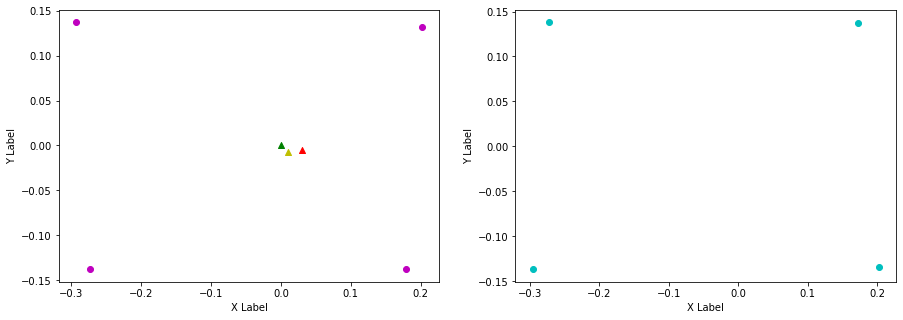

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.172, 0.201, FL (y): 0.137, 0.132.
FL displacement: 0.029000000000000026, -0.0050000000000000044.

FR (x): 0.202, 0.174, FR (y): -0.134, -0.137.
FR displacement: -0.028000000000000025, -0.0030000000000000027.

RL (x): -0.273, -0.298, RL (y): 0.138, 0.137.
RL displacement: -0.024999999999999967, -0.0010000000000000009.

RR (x): -0.296, -0.274, RR (y): -0.137, -0.138.
RR displacement: 0.021999999999999964, -0.0010000000000000009.


Base displacement (Foot): [0.028000000000000025, 0.0030000000000000027].

Velocity x: [0.07804531]. Velocity y: [0.03424781]. Angular 0.0065340005326154854
Odom velocity x: 0.0629159267944. Odom velocity y: 0.00998906505255. Odom velocity yaw: -0.231970221715
Base displacement (Odom): [[0.02575494766326969], [0.011301775397309477]]. Rotation displacement: -0.40695584010160096.



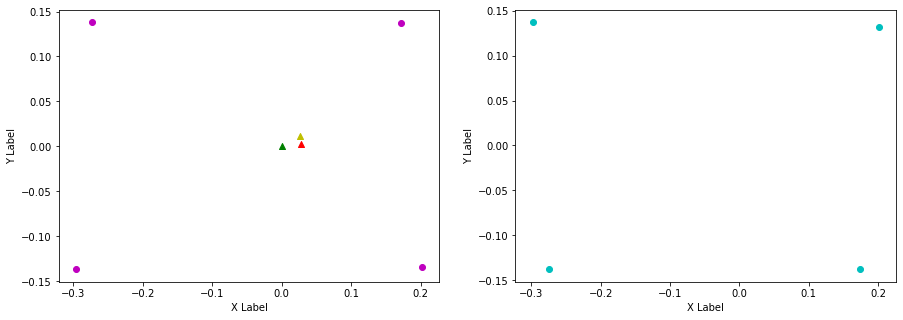

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.201, 0.168, FL (y): 0.132, 0.136.
FL displacement: -0.033, 0.0040000000000000036.

FR (x): 0.174, 0.2, FR (y): -0.137, -0.135.
FR displacement: 0.026000000000000023, 0.0020000000000000018.

RL (x): -0.298, -0.274, RL (y): 0.137, 0.139.
RL displacement: 0.023999999999999966, 0.0020000000000000018.

RR (x): -0.274, -0.303, RR (y): -0.138, -0.136.
RR displacement: -0.02899999999999997, 0.0020000000000000018.


Base displacement (Foot): [0.033, -0.0040000000000000036].

Velocity x: [0.06951337]. Velocity y: [-0.01463145]. Angular -0.012406600302493546
Odom velocity x: 0.0726844806787. Odom velocity y: -0.00203687012276. Odom velocity yaw: 0.188522407249
Base displacement (Odom): [[0.024329689401392685], [-0.005121008317152231]]. Rotation displacement: 0.12354228720996857.



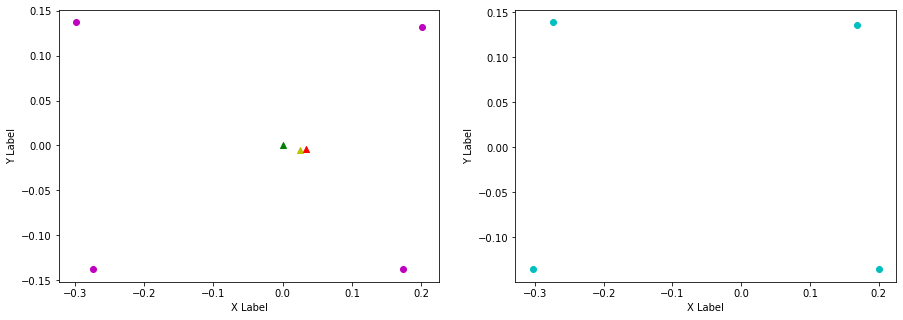

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.197, FL (y): 0.136, 0.136.
FL displacement: 0.028999999999999998, 0.0.

FR (x): 0.2, 0.166, FR (y): -0.135, -0.134.
FR displacement: -0.034, 0.0010000000000000009.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.303, -0.275, RR (y): -0.136, -0.14.
RR displacement: 0.02799999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.034, -0.0010000000000000009].

Velocity x: [0.07989873]. Velocity y: [0.00847255]. Angular -0.03301308207413198
Odom velocity x: 0.0781103150759. Odom velocity y: 0.00288009997537. Odom velocity yaw: -0.290419540098
Base displacement (Odom): [[0.02716556039903839], [0.0028806653105180047]]. Rotation displacement: -0.24879614409082618.



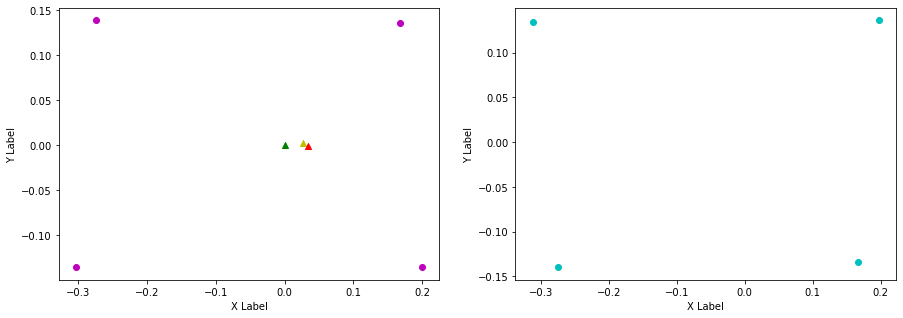

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.17, FL (y): 0.136, 0.137.
FL displacement: -0.026999999999999996, 0.0010000000000000009.

FR (x): 0.166, 0.201, FR (y): -0.134, -0.134.
FR displacement: 0.035, 0.0.

RL (x): -0.312, -0.273, RL (y): 0.134, 0.139.
RL displacement: 0.03899999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.3, RR (y): -0.14, -0.136.
RR displacement: -0.024999999999999967, 0.0040000000000000036.


Base displacement (Foot): [0.026999999999999996, -0.0010000000000000009].

Velocity x: [0.03959782]. Velocity y: [-0.00924685]. Angular 0.028695898454808647
Odom velocity x: 0.0619490082857. Odom velocity y: -0.00241475503755. Odom velocity yaw: 0.233985725179
Base displacement (Odom): [[0.012275321526010075], [-0.0028665223588144606]]. Rotation displacement: -0.6431133299830682.



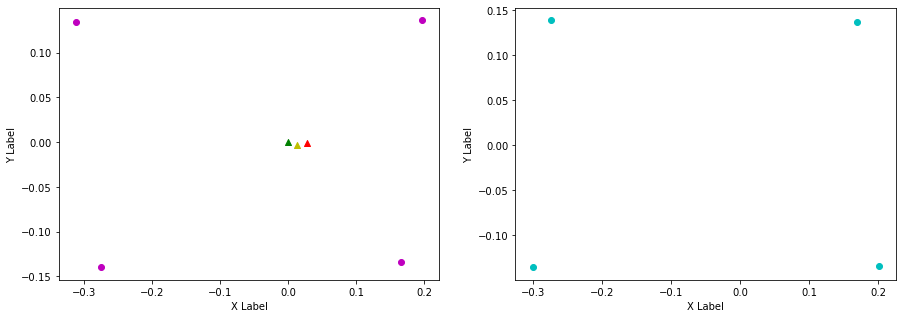

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.17, 0.199, FL (y): 0.137, 0.134.
FL displacement: 0.028999999999999998, -0.0030000000000000027.

FR (x): 0.201, 0.169, FR (y): -0.134, -0.135.
FR displacement: -0.032, -0.0010000000000000009.

RL (x): -0.273, -0.307, RL (y): 0.139, 0.135.
RL displacement: -0.033999999999999975, -0.0040000000000000036.

RR (x): -0.3, -0.275, RR (y): -0.136, -0.138.
RR displacement: 0.024999999999999967, -0.0020000000000000018.


Base displacement (Foot): [0.032, 0.0010000000000000009].

Velocity x: [0.08282104]. Velocity y: [0.01387025]. Angular -0.012930960700125884
Odom velocity x: 0.0716494157361. Odom velocity y: 0.00526726609665. Odom velocity yaw: -0.229794742974
Base displacement (Odom): [[0.02484632903941808], [0.004161077457212947]]. Rotation displacement: 0.5096876058676808.



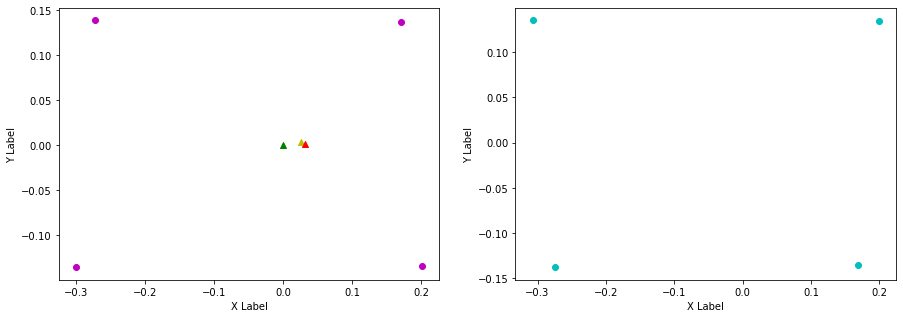

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.199, 0.168, FL (y): 0.134, 0.136.
FL displacement: -0.031, 0.0020000000000000018.

FR (x): 0.169, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.031, 0.0.

RL (x): -0.307, -0.274, RL (y): 0.135, 0.139.
RL displacement: 0.032999999999999974, 0.0040000000000000036.

RR (x): -0.275, -0.303, RR (y): -0.138, -0.135.
RR displacement: -0.02799999999999997, 0.0030000000000000027.


Base displacement (Foot): [0.031, -0.0020000000000000018].

Velocity x: [0.06946771]. Velocity y: [-0.01297534]. Angular -0.011501105266443564
Odom velocity x: 0.0761755494639. Odom velocity y: -0.00385391819568. Odom velocity yaw: 0.197815369488
Base displacement (Odom): [[0.023619016927983516], [-0.004411613253812341]]. Rotation displacement: -0.22226698326347594.



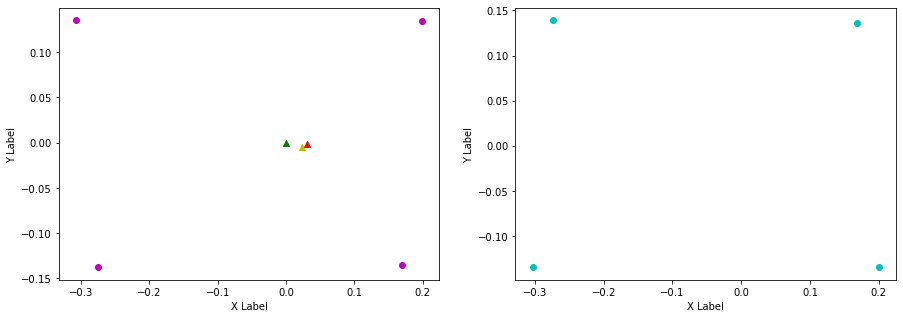

Command:  [0.1 0. ] 0.0

FL moving: True. FR moving: False
RL moving: False. RR moving: True
CoM displacement: 
FL (x): 0.168, 0.197, FL (y): 0.136, 0.135.
FL displacement: 0.028999999999999998, -0.0010000000000000009.

FR (x): 0.2, 0.165, FR (y): -0.135, -0.135.
FR displacement: -0.035, 0.0.

RL (x): -0.274, -0.312, RL (y): 0.139, 0.134.
RL displacement: -0.03799999999999998, -0.0050000000000000044.

RR (x): -0.303, -0.275, RR (y): -0.135, -0.139.
RR displacement: 0.02799999999999997, -0.0040000000000000036.


Base displacement (Foot): [0.035, -0.0].

Velocity x: [0.09411485]. Velocity y: [0.02601135]. Angular -0.04059416216662021
Odom velocity x: 0.089250087394. Odom velocity y: 0.0127947431673. Odom velocity yaw: -0.278153871233
Base displacement (Odom): [[0.035763653048264565], [0.009884316621720401]]. Rotation displacement: -0.2240479725515844.



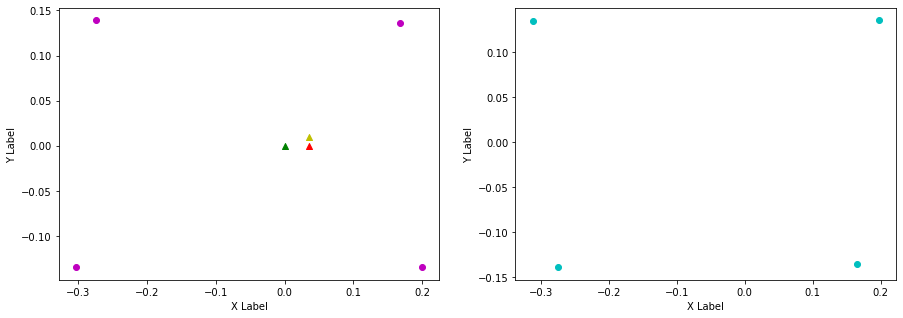

Command:  [0.1 0. ] 0.0

FL moving: False. FR moving: True
RL moving: True. RR moving: False
CoM displacement: 
FL (x): 0.197, 0.168, FL (y): 0.135, 0.136.
FL displacement: -0.028999999999999998, 0.0010000000000000009.

FR (x): 0.165, 0.2, FR (y): -0.135, -0.135.
FR displacement: 0.035, 0.0.

RL (x): -0.312, -0.274, RL (y): 0.134, 0.139.
RL displacement: 0.03799999999999998, 0.0050000000000000044.

RR (x): -0.275, -0.303, RR (y): -0.139, -0.135.
RR displacement: -0.02799999999999997, 0.0040000000000000036.


Base displacement (Foot): [0.028999999999999998, -0.0010000000000000009].

Velocity x: [0.06881419]. Velocity y: [-0.01549645]. Angular 0.03784864496941087
Odom velocity x: 0.0837461390799. Odom velocity y: 0.00107446653074. Odom velocity yaw: 0.202019256985
Base displacement (Odom): [[0.01789168876793301], [-0.004029076667157128]]. Rotation displacement: -0.8838324488816267.



KeyboardInterrupt: 

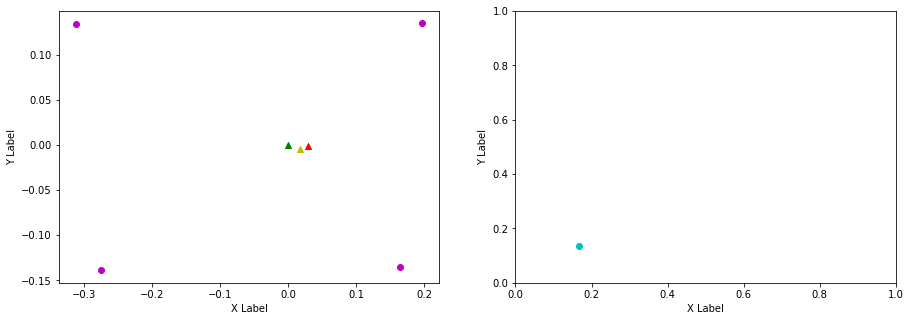

In [29]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.02):
    prev_yaw = 0
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        if idx < (len(footsteps) - 1):
            print("Command: ", dataset[footstep, 1:3], dataset[footstep, 6])
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
                axes[0].set_xlabel('X Label')
                axes[0].set_ylabel('Y Label')
                axes[1].set_xlabel('X Label')
                axes[1].set_ylabel('Y Label')
    
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                                
                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                    
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                local_next_base_next = R_next.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                #print("Footstep timestamp: ", dataset[footstep, 0])
                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                
                print("CoM displacement: ")
                print(f'FL (x): {dataset[footsteps[idx], 7]}, {dataset[footsteps[idx+1], 7]}, FL (y): {dataset[footsteps[idx], 8]}, {dataset[footsteps[idx+1], 8]}.')
                print(f'FL displacement: {(dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]).tolist()}, {(dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]).tolist()}.\n')
                
                print(f'FR (x): {dataset[footsteps[idx], 10]}, {dataset[footsteps[idx+1], 10]}, FR (y): {dataset[footsteps[idx], 11]}, {dataset[footsteps[idx+1], 11]}.')
                print(f'FR displacement: {(dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]).tolist()}, {(dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]).tolist()}.\n')
                
                print(f'RL (x): {dataset[footsteps[idx], 13]}, {dataset[footsteps[idx+1], 13]}, RL (y): {dataset[footsteps[idx], 14]}, {dataset[footsteps[idx+1], 14]}.')
                print(f'RL displacement: {(dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]).tolist()}, {(dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]).tolist()}.\n')
                
                print(f'RR (x): {dataset[footsteps[idx], 16]}, {dataset[footsteps[idx+1], 16]}, RR (y): {dataset[footsteps[idx], 17]}, {dataset[footsteps[idx+1], 17]}.')
                print(f'RR displacement: {(dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]).tolist()}, {(dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]).tolist()}.\n')
        
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving:
                    support_base_displacement[0] = -fl_x_displacement
                    support_base_displacement[1] = -fl_y_displacement
                else:
                    support_base_displacement[0] = -fr_x_displacement
                    support_base_displacement[1] = -fr_y_displacement
                                    
                print(f'\nBase displacement (Foot): {support_base_displacement}.\n')
                print(f'Velocity x: {base_displacement[0]/time_difference}. Velocity y: {base_displacement[1]/time_difference}. Angular {(next_yaw-curr_yaw)/time_difference}')
                print(f'Odom velocity x: {dataset[footsteps[idx+1], 26]}. Odom velocity y: {dataset[footsteps[idx+1], 27]}. Odom velocity yaw: {dataset[footsteps[idx+1], 31]}')
                print(f'Base displacement (Odom): {base_displacement.tolist()}. Rotation displacement: {(curr_yaw - prev_yaw) * 180 / np.pi}.\n')
                
                prev_yaw = curr_yaw
                    
                x_0 = np.array([dataset[footstep, 7], 
                                dataset[footstep, 10],
                                dataset[footstep, 13], 
                                dataset[footstep, 16]])
                y_0 = np.array([dataset[footstep, 8], 
                                dataset[footstep, 11],
                                dataset[footstep, 14], 
                                dataset[footstep, 17]])
                
                x_1 = np.array([dataset[footstep, 7] + fl_x_displacement, 
                                dataset[footstep, 10] + fr_x_displacement,
                                dataset[footstep, 13] + rl_x_displacement, 
                                dataset[footstep, 16] + rr_x_displacement])
                y_1 = np.array([dataset[footstep, 8] + fl_y_displacement, 
                                dataset[footstep, 11] + fr_y_displacement,
                                dataset[footstep, 14] + rl_y_displacement, 
                                dataset[footstep, 17] + rr_y_displacement])
                
                #axes[0].scatter(x_0, y_0, c= 'b',marker='o')
                axes[0].scatter(x_0, y_0, c= 'm',marker='o')
                axes[0].scatter(0, 0, c= 'g', marker='^')
                axes[0].scatter(base_displacement[0], base_displacement[1], c= 'y', marker='^')
                axes[0].scatter(support_base_displacement[0], support_base_displacement[1], c= 'r', marker='^')
                
                #axes[1].scatter(x_1, y_1, c= 'r', marker='o')
                axes[1].scatter(x_1, y_1, c= 'c', marker='o')
                
                plt.show()
                
visualize_absolute_foostep_sizes(motion_fwd, footsteps_fwd, threshold=0.01)                  

### Forward motion

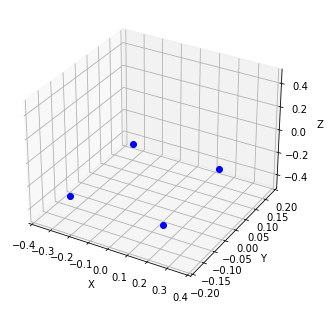

In [26]:
anim = visualize_animated_footsteps(motion_fwd, footsteps_fwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

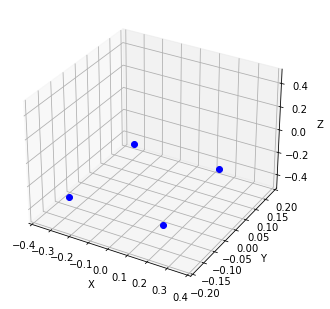

In [27]:
anim = visualize_animated_footsteps(motion_side_right, footsteps_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

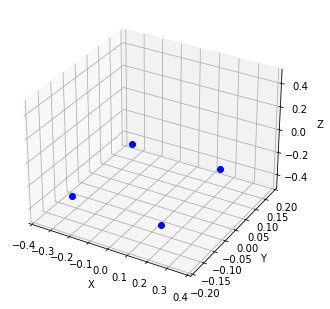

In [28]:
anim = visualize_animated_footsteps(motion_side_left, footsteps_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

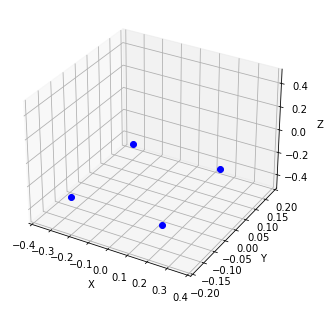

In [29]:
anim = visualize_animated_footsteps(motion_clock, footsteps_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

CalledProcessError: Command '['/usr/bin/ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '432x288', '-pix_fmt', 'rgba', '-r', '5.0', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmphjbgm6ak/temp.m4v']' returned non-zero exit status 255.

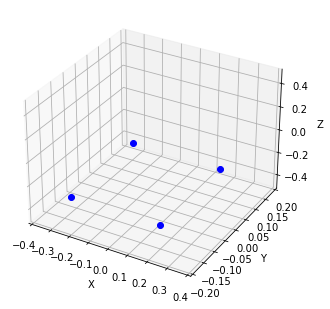

In [30]:
anim = visualize_animated_footsteps(motion_count, footsteps_count, "bo")
HTML(anim.to_html5_video())

# Dataset Preparation

In [51]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [30]:
motion_fwd[footsteps_fwd[0], 19]

-0.0855321591858

In [31]:
motion_fwd[footsteps_fwd[0], 20]

0.000271696145953

In [33]:
euler_from_quaternion(motion_fwd[footsteps_fwd[0], 22], motion_fwd[footsteps_fwd[0], 23], motion_fwd[footsteps_fwd[0], 24], motion_fwd[footsteps_fwd[0], 25])[2]

-0.01146788426249799

In [42]:
def create_com_dataset(dataset, footsteps, motion=None, debug=False):
    inputs = []
    labels = []
    velocity_x = 0
    velocity_y = 0
    velocity_yaw = 0
    prev_com_displacement = [0, 0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.5 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                # Inputs
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + # Motion Command
                              dataset[footsteps[idx], 7:19].tolist() + # Relative feet positions
                              dataset[footsteps[idx], 26:32].tolist() + # Felt velocities
                              [fr_moving, fl_moving] + 
                              prev_com_displacement)
                
                labels.append(base_displacement.tolist()[0] + base_displacement.tolist()[1])
                
                #print(inputs[-1])
                #print(labels[-1])
                
                # Update base displacement
                prev_com_displacement = base_displacement.tolist()[0] + base_displacement.tolist()[1]                
            else:
                print("Something here happened: ", time_difference, ", ", idx)
                prev_com_displacement = [0, 0]
                
    # Convert to numpy array
    inputs_numpy = np.array(inputs, dtype=object)
    labels_numpy = np.array(labels, dtype=object)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_CoM, Y_motion_fwd_CoM = create_com_dataset(motion_fwd, footsteps_fwd, motion="forward")
X_motion_clock_CoM, Y_motion_clock_CoM = create_com_dataset(motion_clock, footsteps_clock, motion="clock")
X_motion_count_CoM, Y_motion_count_CoM = create_com_dataset(motion_count, footsteps_count, motion="count")
X_motion_side_left_CoM, Y_motion_side_left_CoM = create_com_dataset(motion_side_left, footsteps_side_left, motion="left")
X_motion_side_right_CoM, Y_motion_side_right_CoM = create_com_dataset(motion_side_right, footsteps_side_right, motion="right")

# Stack datasets
X_motion_CoM = np.concatenate((X_motion_fwd_CoM, X_motion_side_right_CoM, X_motion_side_left_CoM, X_motion_clock_CoM, X_motion_count_CoM))
Y_motion_CoM = np.concatenate((Y_motion_fwd_CoM, Y_motion_side_right_CoM, Y_motion_side_left_CoM, Y_motion_clock_CoM, Y_motion_count_CoM))
print(X_motion_CoM.shape)
print(Y_motion_CoM.shape)

Something here happened:  485.8400001525879 ,  368
Something here happened:  485.78000020980835 ,  737
Something here happened:  485.7300000190735 ,  1106
Something here happened:  485.7999999523163 ,  1475
Something here happened:  485.8599998950958 ,  1844
Something here happened:  485.82999992370605 ,  2213
Something here happened:  485.75999999046326 ,  368
Something here happened:  485.84999990463257 ,  737
Something here happened:  485.80999994277954 ,  1106
Something here happened:  485.83000016212463 ,  1475
Something here happened:  485.8100001811981 ,  1844
Something here happened:  485.7900002002716 ,  2213
Something here happened:  485.80999994277954 ,  368
Something here happened:  485.8399999141693 ,  737
Something here happened:  485.77999997138977 ,  1106
Something here happened:  485.77999997138977 ,  1475
Something here happened:  485.7699999809265 ,  1844
Something here happened:  485.80999994277954 ,  2213
Something here happened:  485.789999961853 ,  368
Something 

In [43]:
%store X_motion_CoM
%store Y_motion_CoM

Stored 'X_motion_CoM' (ndarray)
Stored 'Y_motion_CoM' (ndarray)


In [43]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} CoM motion')
    
    print(f'CoM min x step: {min(dataset[:, 0])}. CoM max x step: {max(dataset[:, 0])}.')
    print(f'CoM min y step: {min(dataset[:, 1])}. CoM max y step: {max(dataset[:, 1])}.')
    print(f'CoM mean x step: {round(np.mean(dataset[:, 0]), 3)}. CoM mean y step: {round(np.mean(dataset[:, 1]), 3)}. CoM std x step: {round(np.std(dataset[:, 0]), 3)}. CoM std y step: {round(np.std(dataset[:, 1]), 3)}.\n')

labels_stats(Y_motion_fwd_CoM, "forward")
labels_stats(Y_motion_clock_CoM, "clockwise")
labels_stats(Y_motion_count_CoMD, "counter clockwise")
labels_stats(Y_motion_side_left_CoM, "left step")
labels_stats(Y_motion_side_right_CoM, "right step")

Statistics for forward CoM motion
CoM min x step: -0.30981806204829354. CoM max x step: 0.28062046362532556.
CoM min y step: -0.28743939652034634. CoM max y step: 0.30465744116211013.
CoM mean x step: -0.014. CoM mean y step: 0.002. CoM std x step: 0.057. CoM std y step: 0.057.

Statistics for clockwise CoM motion
CoM min x step: -0.05098542515787585. CoM max x step: 0.05144581790182201.
CoM min y step: -0.05438790652009118. CoM max y step: 0.05366461301756331.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.016. CoM std y step: 0.016.

Statistics for counter clockwise CoM motion
CoM min x step: -0.03628533003430334. CoM max x step: 0.03377066618924118.
CoM min y step: -0.032317051282714004. CoM max y step: 0.034441938307756104.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.01. CoM std y step: 0.01.

Statistics for left step CoM motion
CoM min x step: -0.15581582772000502. CoM max x step: 0.14926909647334696.
CoM min y step: -0.14527217202002785. CoM max